# ALBERT Pretraining Notebook


Trained with Google TPU v2

#Set Up

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# @title Importing

#Installs
!pip install pyarrow fastparquet

# Packages
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import random
import tensorflow as tf
import os
from IPython.display import clear_output

# Sklearn
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.utils import class_weight

# Keras
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
#from keras.layers.embeddings import Embedding
from keras.metrics import AUC

# Tf
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
import random

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 16.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 67.0 MB/s eta 0:00:00


In [ ]:
#@title Random Seeds
import random
## SEEDS

# Hard Code Random Seeds.
r1 = 0
r2 = 1

# Set Random Seed
random.seed(r1)
tf.random.set_seed(r2)

In [ ]:
#@title Connect to TPU
print("TensorFlow version:", tf.__version__)

# Connect to the TPU cluster or fall back to CPU/GPU
try:
  resolver = tf.distribute.cluster_resolver.TPUClusterResolver()  # Tries to connect to the TPU
  tf.config.experimental_connect_to_cluster(resolver)
  tf.tpu.experimental.initialize_tpu_system(resolver)
  strategy = tf.distribute.TPUStrategy(resolver)
  devices = tf.config.list_logical_devices('TPU')
  print('TPU devices:', devices)
except ValueError:
  print("Could not connect to TPU; using CPU/GPU strategy instead.")
  strategy = tf.distribute.get_strategy()

# Example computation using the strategy
with strategy.scope():
  a = tf.constant([[1.0, 2.0, 3.0], [4.0, 5.0, 6.0]])
  b = tf.constant([[1.0, 2.0], [3.0, 4.0], [5.0, 6.0]])

  @tf.function
  def matmul_fn(x, y):
    return tf.matmul(x, y)

  z = strategy.run(matmul_fn, args=(a, b))

print(z)

TensorFlow version: 2.15.0
TPU devices: [LogicalDevice(name='/device:TPU:0', device_type='TPU'), LogicalDevice(name='/device:TPU:1', device_type='TPU'), LogicalDevice(name='/device:TPU:2', device_type='TPU'), LogicalDevice(name='/device:TPU:3', device_type='TPU'), LogicalDevice(name='/device:TPU:4', device_type='TPU'), LogicalDevice(name='/device:TPU:5', device_type='TPU'), LogicalDevice(name='/device:TPU:6', device_type='TPU'), LogicalDevice(name='/device:TPU:7', device_type='TPU')]
PerReplica:{
  0: tf.Tensor(
[[22. 28.]
 [49. 64.]], shape=(2, 2), dtype=float32),
  1: tf.Tensor(
[[22. 28.]
 [49. 64.]], shape=(2, 2), dtype=float32),
  2: tf.Tensor(
[[22. 28.]
 [49. 64.]], shape=(2, 2), dtype=float32),
  3: tf.Tensor(
[[22. 28.]
 [49. 64.]], shape=(2, 2), dtype=float32),
  4: tf.Tensor(
[[22. 28.]
 [49. 64.]], shape=(2, 2), dtype=float32),
  5: tf.Tensor(
[[22. 28.]
 [49. 64.]], shape=(2, 2), dtype=float32),
  6: tf.Tensor(
[[22. 28.]
 [49. 64.]], shape=(2, 2), dtype=float32),
  7: tf.

# Hyperparameters & Settings (Fill out)


In [ ]:
# write where you want to save all your files
## CHANGE ##
root = "/content/drive/MyDrive/Extra Curricular /ActigraphyTransformer/A-NEW/ALBERT Experiments /ALBERT Conv Pretraining/Encoders"

In [ ]:
"""
Please Fill out Parameters Below
"""
## Model size
# eg. ["small", "medium", "large", "huge"]
size = "large"

## Mask ratio
# eg. [.25, .50, .75]
mask_ratio = 0.90

## Smoothing
# eg. [True, False]
smoothing = False

## Loss Function
# eg. [True, False], meaning MSE on only the masked portion or everything in the reconstruction
mse_only_masked = False

In [ ]:
# Model naming
mask_name = int(mask_ratio*100)

name = f"/conv_encoder_{size}_{mask_name}"

if smoothing == True:
  name = f"{name}_smoothed"
else:
  name = f"{name}_unsmoothed"

if mse_only_masked == True:
  name = f"{name}_mse_only_masked.h5"
else:
  name = f"{name}_mse_all.h5"

In [ ]:
print(name)

/conv_encoder_large_90_unsmoothed_mse_all.h5


# Hyperparameter Additional Info

In [ ]:
"""
Model Size
"""
## Model Size
if size == "small":

  patch_size = 18
  embed_dim = 96
  # encoder
  encoder_num_heads = 6
  encoder_ff_dim = 256
  encoder_num_layers = 1
  encoder_rate = 0.1
  # decoder
  decoder_num_heads = 6
  decoder_ff_dim = 256
  decoder_num_layers = 1
  decoder_rate = 0.1

if size == "medium":

  patch_size = 18
  embed_dim = 96
  # encoder
  encoder_num_heads = 12
  encoder_ff_dim = 256
  encoder_num_layers = 2
  encoder_rate = 0.1
  # decoder
  decoder_num_heads = 12
  decoder_ff_dim = 256
  decoder_num_layers = 1
  decoder_rate = 0.1

if size == "large":

  patch_size = 9
  embed_dim = 96
  # encoder
  encoder_num_heads = 12
  encoder_ff_dim = 256
  encoder_num_layers = 4
  encoder_rate = 0.1
  # decoder
  decoder_num_heads = 12
  decoder_ff_dim = 256
  decoder_num_layers = 1
  decoder_rate = 0.1

if size == "huge":

  patch_size = 5
  embed_dim = 96
  # encoder
  encoder_num_heads = 12
  encoder_ff_dim = 256
  encoder_num_layers = 8
  encoder_rate = 0.1
  # decoder
  decoder_num_heads = 12
  decoder_ff_dim = 256
  decoder_num_layers = 1
  decoder_rate = 0.1

In [ ]:
"""
For Pretraining
"""

## Model Size
if size == "small":

  learning_rate = 0.001
  early_stopping_patience = 250
  reduce_lr_patience = 75
  min_lr = 1e-4

if size == "medium":

  learning_rate = 0.001
  early_stopping_patience = 250
  reduce_lr_patience = 75
  min_lr = 1e-4

if size == "large":

  learning_rate = 0.0001
  early_stopping_patience = 500
  reduce_lr_patience = 100
  min_lr = 1e-5


if size == "huge":

  learning_rate = 0.00001
  early_stopping_patience = 500
  reduce_lr_patience = 100
  min_lr = 1e-6

In [ ]:
"""
Smoothing
"""
if smoothing == True:
  data = pd.read_parquet('/content/drive/MyDrive/Extra Curricular /ActigraphyTransformer/A-NEW/Data Preprocessing/SelfSupervised Datasets/Smooth/[SelfSupervised][Smooth]WideSeqnActi_AndMeds_2013.parq')

else:
  data = pd.read_parquet('/content/drive/MyDrive/Extra Curricular /ActigraphyTransformer/A-NEW/Data Preprocessing/SelfSupervised Datasets/Raw/[SelfSupervised][Raw]WideSeqnActi_AndMeds_2013.parq')

# Process Data

In [ ]:
from sklearn.model_selection import train_test_split

# First, split into train and temp (this temp will be split into validation and test)
X_train, X_test = train_test_split(np.array(data), test_size=0.005, random_state=19, shuffle=True)


# Reshape Train and Test
n_participants_train = X_train.shape[0]
n_participants_test = X_test.shape[0]
n_timesteps = X_train.shape[1]
n_features = 1

# Reshape data
X_train = X_train.reshape((n_participants_train, n_timesteps, n_features))
X_test = X_test.reshape((n_participants_test, n_timesteps, n_features))

In [ ]:
X_train.shape

(21430, 10080, 1)

In [ ]:
X_test.shape

(108, 10080, 1)

# Autoencoder


#MAE

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models

# Modified Transformer Block to output attention weights with explicit layer names
def TransformerBlock(embed_dim, num_heads, ff_dim, rate=0.1, name_prefix="encoder"):
    # Input
    input_layer = layers.Input(shape=(None, embed_dim), name=f"{name_prefix}_input")
    #Attention
    attention_layer = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim, name=f"{name_prefix}_attention")
    attention_output, attention_weights = attention_layer(input_layer, input_layer, return_attention_scores=True)
    attention_output = layers.Dropout(rate, name=f"{name_prefix}_dropout")(attention_output)
    # Add + Norm
    out1 = layers.LayerNormalization(epsilon=1e-6, name=f"{name_prefix}_norm1")(input_layer + attention_output)
    # FF Network
    ff_output = layers.Dense(ff_dim, activation="relu", name=f"{name_prefix}_ff1")(out1)
    ff_output = layers.Dense(embed_dim, name=f"{name_prefix}_ff2")(ff_output)
    ff_output = layers.Dropout(rate, name=f"{name_prefix}_dropout2")(ff_output)
    # Add + Norm
    final_output = layers.LayerNormalization(epsilon=1e-6, name=f"{name_prefix}_norm2")(out1 + ff_output)
    return models.Model(inputs=input_layer, outputs=[final_output, attention_weights], name=f"{name_prefix}_transformer")

# Custom Layer to create and apply the mask for MAE
class MaskLayer(layers.Layer):
    def __init__(self, mask_ratio, embed_dim, **kwargs):
        super(MaskLayer, self).__init__(**kwargs)
        self.mask_ratio = mask_ratio
        self.embed_dim = embed_dim

    def build(self, input_shape):
        self.mask_token = self.add_weight(
            shape=(1, 1, self.embed_dim),
            initializer='random_normal',
            trainable=True,
            name='mask_token'
        )

    def call(self, patch_embeddings, positional_embeddings):
        batch_size = tf.shape(patch_embeddings)[0]
        num_patches = tf.shape(patch_embeddings)[1]

        shuffled_indices = tf.random.shuffle(tf.range(num_patches))
        num_masked = tf.cast(tf.math.round(self.mask_ratio * tf.cast(num_patches, tf.float32)), tf.int32)

        masked_indices = shuffled_indices[:num_masked]
        visible_indices = shuffled_indices[num_masked:]

        visible_patches = tf.gather(patch_embeddings, indices=visible_indices, axis=1)
        masked_patches = tf.gather(patch_embeddings, indices=masked_indices, axis=1)
        visible_positional_embeddings = tf.gather(positional_embeddings, indices=visible_indices, axis=0)

        return visible_patches, masked_patches, visible_positional_embeddings, shuffled_indices, masked_indices

# Custom Layer to create mask tokens for the decoder
class MaskTokenLayer(layers.Layer):
    def __init__(self, **kwargs):
        super(MaskTokenLayer, self).__init__(**kwargs)

    def call(self, mask_token, masked_patches):
        tiled_mask_tokens = tf.tile(mask_token, [tf.shape(masked_patches)[0], tf.shape(masked_patches)[1], 1])
        return tiled_mask_tokens

# Custom Layer to concatenate tensors
class ConcatLayer(layers.Layer):
    def __init__(self, axis, **kwargs):
        super(ConcatLayer, self).__init__(**kwargs)
        self.axis = axis

    def call(self, inputs):
        return tf.concat(inputs, axis=self.axis)

# Unshuffling Layer to revert the shuffle applied during masking
class UnshuffleLayer(layers.Layer):
    def __init__(self, **kwargs):
        super(UnshuffleLayer, self).__init__(**kwargs)

    def call(self, patches, shuffle_indices):
        num_patches = tf.shape(shuffle_indices)[0]

        reverse_indices = tf.scatter_nd(
            tf.expand_dims(shuffle_indices, axis=-1),
            tf.range(num_patches),
            [num_patches]
        )

        unshuffled_patches = tf.gather(patches, indices=reverse_indices, axis=1)

        return unshuffled_patches

# Sine/Cosine positional embeddings
def get_positional_embeddings(num_patches, embed_dim):
    position = tf.range(num_patches, dtype=tf.float32)[:, tf.newaxis]
    div_term = tf.exp(tf.range(0, embed_dim, 2, dtype=tf.float32) * (-tf.math.log(10000.0) / embed_dim))
    pos_embeddings = tf.concat([tf.sin(position * div_term), tf.cos(position * div_term)], axis=-1)
    return pos_embeddings

# Custom Layer to calculate MSE only on masked portions
class MaskedMSELayer(layers.Layer):
    def __init__(self, **kwargs):
        super(MaskedMSELayer, self).__init__(**kwargs)

    def call(self, y_true, y_pred, masked_indices, mse_only_masked):

        if mse_only_masked:
            y_true_flat = tf.reshape(y_true, [-1])
            y_pred_flat = tf.reshape(y_pred, [-1])

            y_true_masked = tf.gather(y_true_flat, masked_indices)
            y_pred_masked = tf.gather(y_pred_flat, masked_indices)

            mse_loss = tf.reduce_mean(tf.square(y_true_masked - y_pred_masked))
        else:
            mse_loss = tf.reduce_mean(tf.square(y_true - y_pred))

        return mse_loss

# Model creation function
def create_model(input_size=10080, patch_size=patch_size, embed_dim=embed_dim,
                 encoder_num_heads=encoder_num_heads, encoder_ff_dim=encoder_ff_dim, encoder_num_layers=encoder_num_layers, encoder_rate=encoder_rate,
                 decoder_num_heads=decoder_num_heads, decoder_ff_dim=decoder_ff_dim, decoder_num_layers=decoder_num_layers, decoder_rate=decoder_rate,
                 mask_ratio=mask_ratio, mse_only_masked=mse_only_masked, return_attention=False):

    num_patches = input_size // patch_size
    inputs = layers.Input(shape=(input_size,), name="inputs")
    reshaped = layers.Reshape((num_patches, patch_size), name="reshape")(inputs)

    # Add a channel dimension: (num_patches, patch_size, 1)
    patches_with_channel = layers.Reshape((num_patches, patch_size, 1), name="add_channel_dim")(reshaped)

    # Apply Conv1D to each patch individually using TimeDistributed
    conv_layer = layers.TimeDistributed(
        layers.Conv1D(
            filters=embed_dim,
            kernel_size=3,
            padding='same',
            activation='relu'
        ),
        name="conv1d_patch_embedding"
    )

    # Output shape: (num_patches, patch_size, embed_dim)
    conv_output = conv_layer(patches_with_channel)

    # Pool over the patch dimension to get a fixed-size embedding per patch
    pooling_layer = layers.TimeDistributed(
        layers.GlobalAveragePooling1D(),
        name="global_avg_pooling"
    )

    # Output shape: (num_patches, embed_dim)
    patch_embeddings = pooling_layer(conv_output)

    positional_embeddings = get_positional_embeddings(num_patches, embed_dim)

    mask_layer = MaskLayer(mask_ratio, embed_dim, name="mask_layer")
    visible_patches, masked_patches, visible_positional_embeddings, shuffle_indices, masked_indices = mask_layer(patch_embeddings, positional_embeddings)

    x = visible_patches + visible_positional_embeddings
    attention_weights = []

    for i in range(encoder_num_layers):
        x, weights = TransformerBlock(embed_dim, encoder_num_heads, encoder_ff_dim, encoder_rate, name_prefix=f"encoder_layer_{i+1}")(x)
        if return_attention:
            attention_weights.append(weights)

    mask_token_layer = MaskTokenLayer(name="mask_token_layer")
    mask_tokens = mask_token_layer(mask_layer.mask_token, masked_patches)

    decoder_input = ConcatLayer(axis=1, name="concat_layer")([x, mask_tokens])

    unshuffle_layer = UnshuffleLayer(name="unshuffle_layer")
    decoder_input_unshuffled = unshuffle_layer(decoder_input, shuffle_indices)

    decoder_input_with_pos = decoder_input_unshuffled + positional_embeddings

    y = decoder_input_with_pos
    for i in range(decoder_num_layers):
        y, _ = TransformerBlock(embed_dim, decoder_num_heads, encoder_ff_dim, decoder_rate, name_prefix=f"decoder_layer_{i+1}")(y)

    outputs = layers.Dense(patch_size, activation='tanh', name="decoder_dense")(y)
    outputs = 2 * outputs #nothing above 2 standard deviations we'll just categorize as the same
    outputs = layers.Reshape((input_size,), name="decoder_reshape")(outputs)

    masked_mse_layer = MaskedMSELayer(name="masked_mse_layer")
    loss = masked_mse_layer(inputs, outputs, masked_indices, mse_only_masked)

    model = models.Model(inputs=inputs, outputs=outputs, name="MAE_model")
    model.add_loss(loss)

    if return_attention:
        return models.Model(inputs=inputs, outputs=[outputs] + attention_weights, name="MAE_with_attention")
    else:
        return model


with strategy.scope():
    model = create_model()

    model.compile(optimizer=tf.keras.optimizers.Adam(
        learning_rate=learning_rate,
        beta_1=0.9,
        beta_2=0.999,
        epsilon=1e-07,
        amsgrad=False))

model.summary()

Model: "MAE_model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 inputs (InputLayer)         [(None, 10080)]              0         []                            
                                                                                                  
 reshape (Reshape)           (None, 1120, 9)              0         ['inputs[0][0]']              
                                                                                                  
 add_channel_dim (Reshape)   (None, 1120, 9, 1)           0         ['reshape[0][0]']             
                                                                                                  
 conv1d_patch_embedding (Ti  (None, 1120, 9, 96)          384       ['add_channel_dim[0][0]']     
 meDistributed)                                                                           

# Train Model

Epoch 1/10000
151/151 [==============================] - 56s 205ms/step - loss: 1.5509 - val_loss: 1.0354 - lr: 1.0000e-04
Epoch 2/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.9646 - val_loss: 0.9977 - lr: 1.0000e-04
Epoch 3/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.8704 - val_loss: 0.9964 - lr: 1.0000e-04
Epoch 4/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.8472 - val_loss: 0.9934 - lr: 1.0000e-04
Epoch 5/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.8393 - val_loss: 0.9869 - lr: 1.0000e-04
Epoch 6/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.8343 - val_loss: 0.9884 - lr: 1.0000e-04
Epoch 7/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.8305 - val_loss: 0.9862 - lr: 1.0000e-04
Epoch 8/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.8272 - val_loss: 0.9856 - lr: 1.0000e-04
Epoch 9/10000
151/151 [

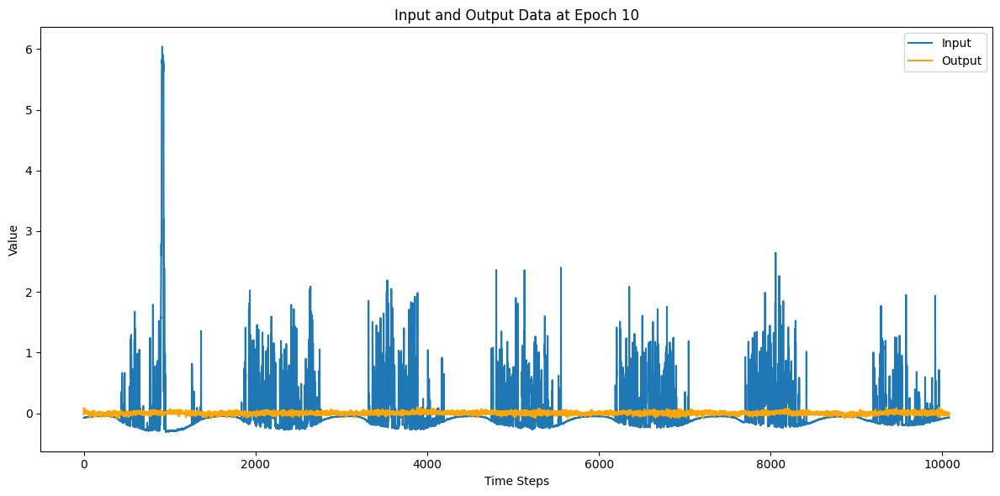

151/151 [==============================] - 16s 108ms/step - loss: 0.8227 - val_loss: 0.9842 - lr: 1.0000e-04
Epoch 11/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.8201 - val_loss: 0.9835 - lr: 1.0000e-04
Epoch 12/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.8181 - val_loss: 0.9832 - lr: 1.0000e-04
Epoch 13/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.8158 - val_loss: 0.9817 - lr: 1.0000e-04
Epoch 14/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.8146 - val_loss: 0.9854 - lr: 1.0000e-04
Epoch 15/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.8136 - val_loss: 0.9802 - lr: 1.0000e-04
Epoch 16/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.8158 - val_loss: 0.9800 - lr: 1.0000e-04
Epoch 17/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.8123 - val_loss: 0.9811 - lr: 1.0000e-04
Epoch 18/10000
151/151 [======

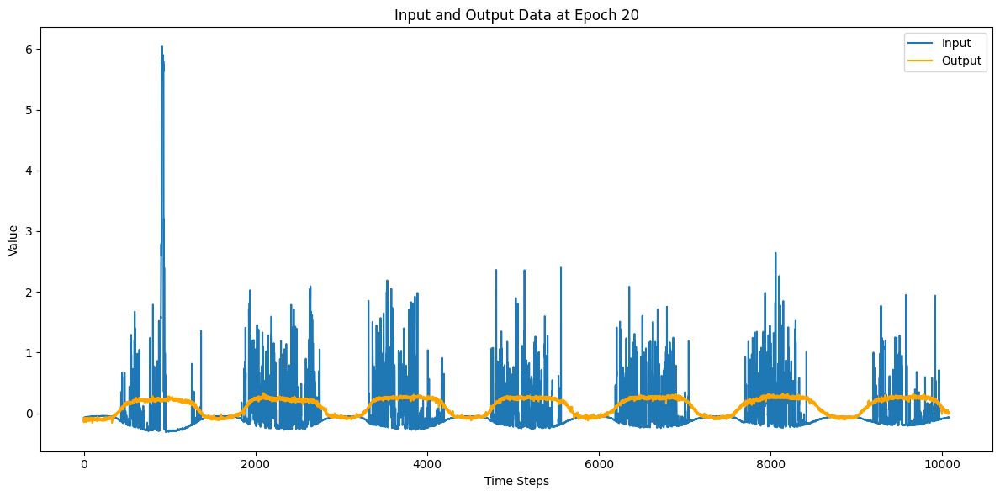

151/151 [==============================] - 13s 86ms/step - loss: 0.8088 - val_loss: 0.9782 - lr: 1.0000e-04
Epoch 21/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.8062 - val_loss: 0.9751 - lr: 1.0000e-04
Epoch 22/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.8028 - val_loss: 0.9748 - lr: 1.0000e-04
Epoch 23/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.8033 - val_loss: 0.9735 - lr: 1.0000e-04
Epoch 24/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7999 - val_loss: 0.9736 - lr: 1.0000e-04
Epoch 25/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7995 - val_loss: 0.9713 - lr: 1.0000e-04
Epoch 26/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7970 - val_loss: 0.9725 - lr: 1.0000e-04
Epoch 27/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7966 - val_loss: 0.9710 - lr: 1.0000e-04
Epoch 28/10000
151/151 [=======

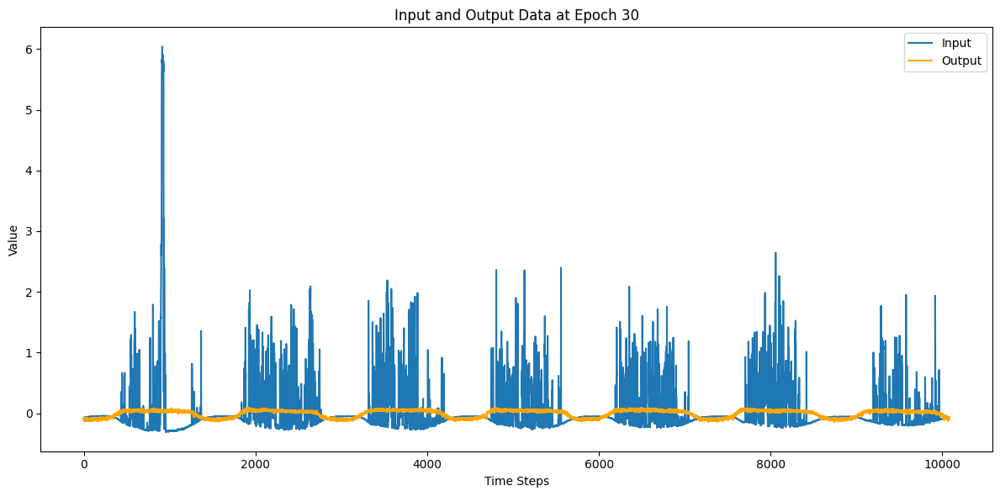

151/151 [==============================] - 14s 90ms/step - loss: 0.7967 - val_loss: 0.9717 - lr: 1.0000e-04
Epoch 31/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7942 - val_loss: 0.9699 - lr: 1.0000e-04
Epoch 32/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7956 - val_loss: 0.9686 - lr: 1.0000e-04
Epoch 33/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7930 - val_loss: 0.9678 - lr: 1.0000e-04
Epoch 34/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7919 - val_loss: 0.9667 - lr: 1.0000e-04
Epoch 35/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7910 - val_loss: 0.9666 - lr: 1.0000e-04
Epoch 36/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7900 - val_loss: 0.9675 - lr: 1.0000e-04
Epoch 37/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7885 - val_loss: 0.9637 - lr: 1.0000e-04
Epoch 38/10000
151/151 [=======

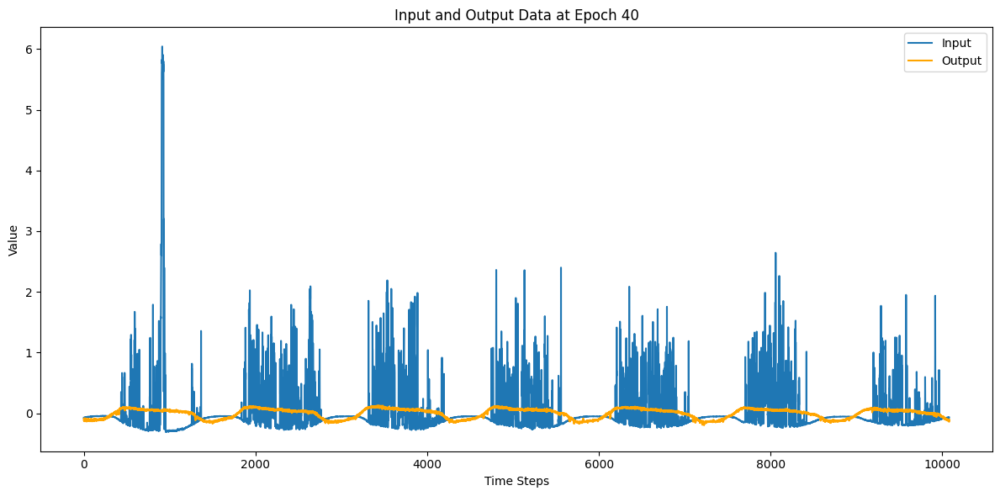

151/151 [==============================] - 13s 85ms/step - loss: 0.7847 - val_loss: 0.9609 - lr: 1.0000e-04
Epoch 41/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7834 - val_loss: 0.9620 - lr: 1.0000e-04
Epoch 42/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7831 - val_loss: 0.9619 - lr: 1.0000e-04
Epoch 43/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7844 - val_loss: 0.9609 - lr: 1.0000e-04
Epoch 44/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7878 - val_loss: 0.9610 - lr: 1.0000e-04
Epoch 45/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7824 - val_loss: 0.9619 - lr: 1.0000e-04
Epoch 46/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7821 - val_loss: 0.9592 - lr: 1.0000e-04
Epoch 47/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7819 - val_loss: 0.9591 - lr: 1.0000e-04
Epoch 48/10000
151/151 [=======

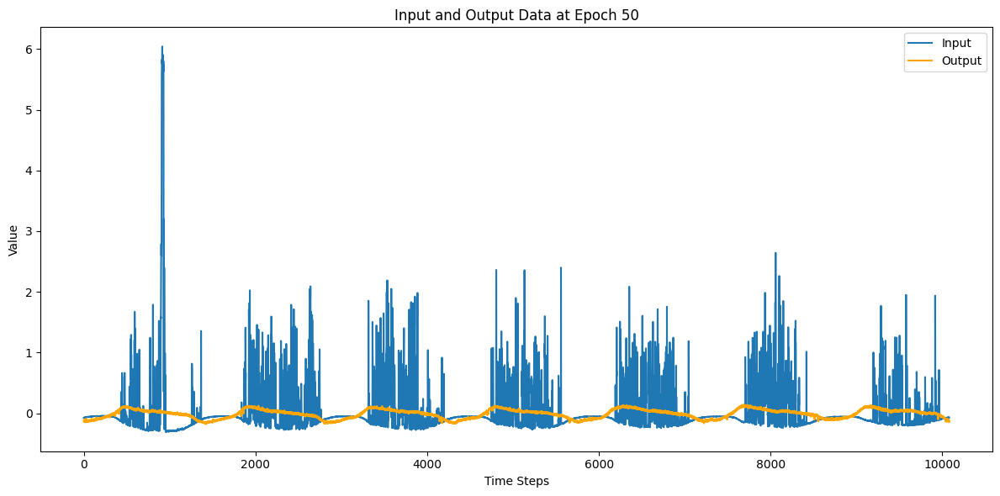

151/151 [==============================] - 13s 84ms/step - loss: 0.7810 - val_loss: 0.9604 - lr: 1.0000e-04
Epoch 51/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7804 - val_loss: 0.9588 - lr: 1.0000e-04
Epoch 52/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7797 - val_loss: 0.9582 - lr: 1.0000e-04
Epoch 53/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7791 - val_loss: 0.9577 - lr: 1.0000e-04
Epoch 54/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7793 - val_loss: 0.9575 - lr: 1.0000e-04
Epoch 55/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7812 - val_loss: 0.9579 - lr: 1.0000e-04
Epoch 56/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7779 - val_loss: 0.9554 - lr: 1.0000e-04
Epoch 57/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7762 - val_loss: 0.9558 - lr: 1.0000e-04
Epoch 58/10000
151/151 [=======

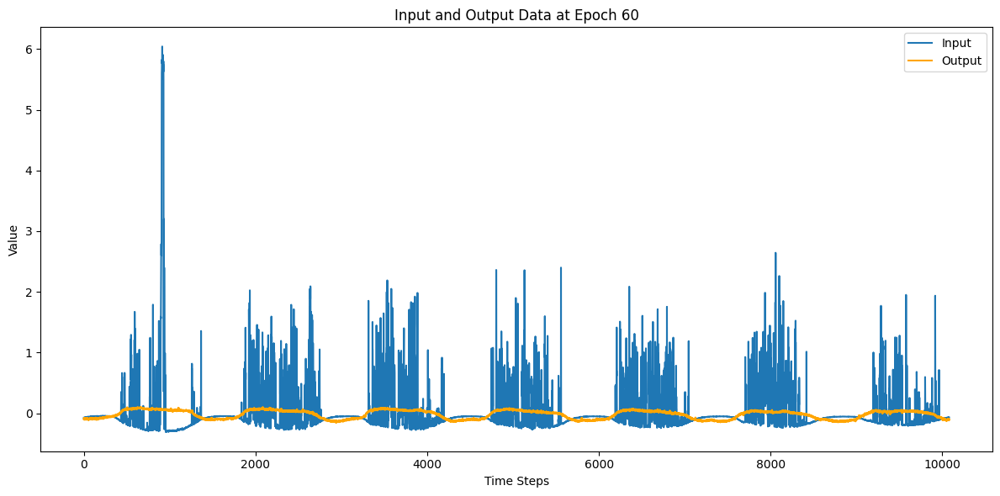

151/151 [==============================] - 13s 86ms/step - loss: 0.7747 - val_loss: 0.9546 - lr: 1.0000e-04
Epoch 61/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7782 - val_loss: 0.9544 - lr: 1.0000e-04
Epoch 62/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7759 - val_loss: 0.9543 - lr: 1.0000e-04
Epoch 63/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7856 - val_loss: 0.9530 - lr: 1.0000e-04
Epoch 64/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7740 - val_loss: 0.9566 - lr: 1.0000e-04
Epoch 65/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7728 - val_loss: 0.9533 - lr: 1.0000e-04
Epoch 66/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7718 - val_loss: 0.9524 - lr: 1.0000e-04
Epoch 67/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7709 - val_loss: 0.9528 - lr: 1.0000e-04
Epoch 68/10000
151/151 [=======

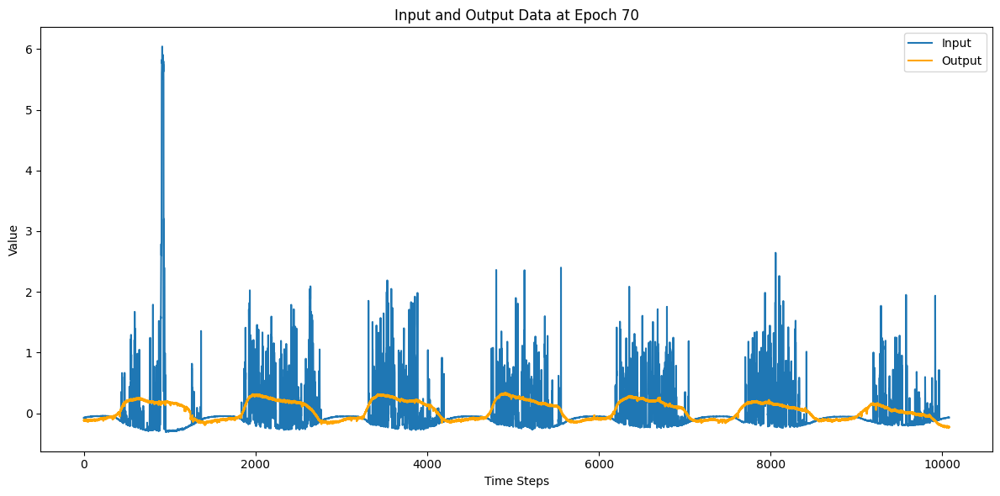

151/151 [==============================] - 13s 84ms/step - loss: 0.7696 - val_loss: 0.9526 - lr: 1.0000e-04
Epoch 71/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7700 - val_loss: 0.9504 - lr: 1.0000e-04
Epoch 72/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7712 - val_loss: 0.9518 - lr: 1.0000e-04
Epoch 73/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7696 - val_loss: 0.9520 - lr: 1.0000e-04
Epoch 74/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7694 - val_loss: 0.9521 - lr: 1.0000e-04
Epoch 75/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7687 - val_loss: 0.9515 - lr: 1.0000e-04
Epoch 76/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7686 - val_loss: 0.9496 - lr: 1.0000e-04
Epoch 77/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7686 - val_loss: 0.9518 - lr: 1.0000e-04
Epoch 78/10000
151/151 [=======

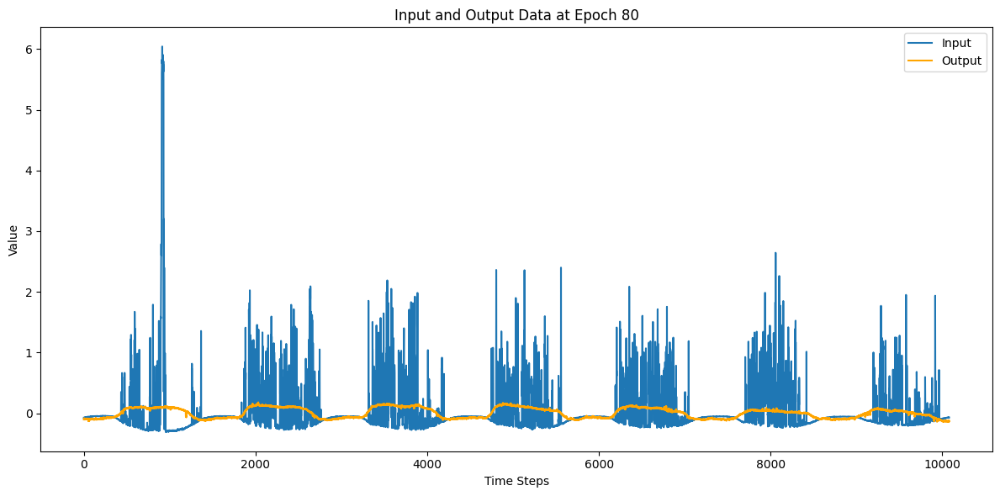

151/151 [==============================] - 13s 85ms/step - loss: 0.7672 - val_loss: 0.9495 - lr: 1.0000e-04
Epoch 81/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7678 - val_loss: 0.9497 - lr: 1.0000e-04
Epoch 82/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7669 - val_loss: 0.9499 - lr: 1.0000e-04
Epoch 83/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7664 - val_loss: 0.9492 - lr: 1.0000e-04
Epoch 84/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7674 - val_loss: 0.9494 - lr: 1.0000e-04
Epoch 85/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7657 - val_loss: 0.9492 - lr: 1.0000e-04
Epoch 86/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7662 - val_loss: 0.9495 - lr: 1.0000e-04
Epoch 87/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7657 - val_loss: 0.9490 - lr: 1.0000e-04
Epoch 88/10000
151/151 [=======

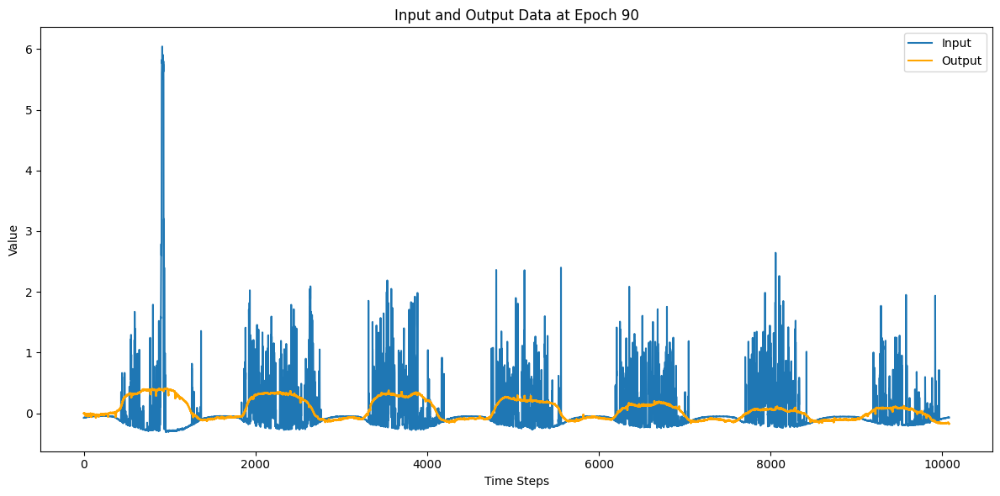

151/151 [==============================] - 13s 89ms/step - loss: 0.7650 - val_loss: 0.9473 - lr: 1.0000e-04
Epoch 91/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7651 - val_loss: 0.9499 - lr: 1.0000e-04
Epoch 92/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7665 - val_loss: 0.9482 - lr: 1.0000e-04
Epoch 93/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7688 - val_loss: 0.9499 - lr: 1.0000e-04
Epoch 94/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7668 - val_loss: 0.9473 - lr: 1.0000e-04
Epoch 95/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7646 - val_loss: 0.9479 - lr: 1.0000e-04
Epoch 96/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7632 - val_loss: 0.9453 - lr: 1.0000e-04
Epoch 97/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7622 - val_loss: 0.9443 - lr: 1.0000e-04
Epoch 98/10000
151/151 [=======

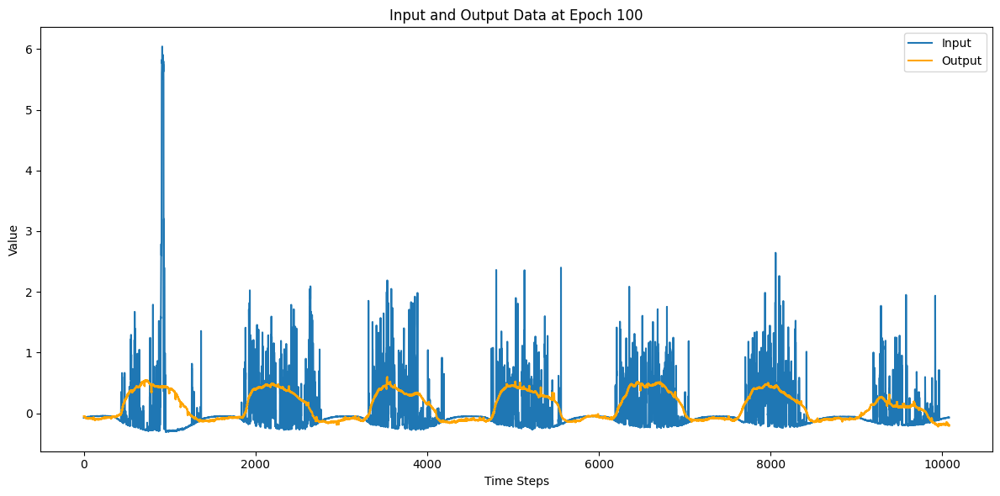

151/151 [==============================] - 13s 85ms/step - loss: 0.7617 - val_loss: 0.9450 - lr: 1.0000e-04
Epoch 101/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7616 - val_loss: 0.9425 - lr: 1.0000e-04
Epoch 102/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7609 - val_loss: 0.9432 - lr: 1.0000e-04
Epoch 103/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7618 - val_loss: 0.9463 - lr: 1.0000e-04
Epoch 104/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7602 - val_loss: 0.9429 - lr: 1.0000e-04
Epoch 105/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7596 - val_loss: 0.9423 - lr: 1.0000e-04
Epoch 106/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7596 - val_loss: 0.9432 - lr: 1.0000e-04
Epoch 107/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7592 - val_loss: 0.9420 - lr: 1.0000e-04
Epoch 108/10000
151/151 

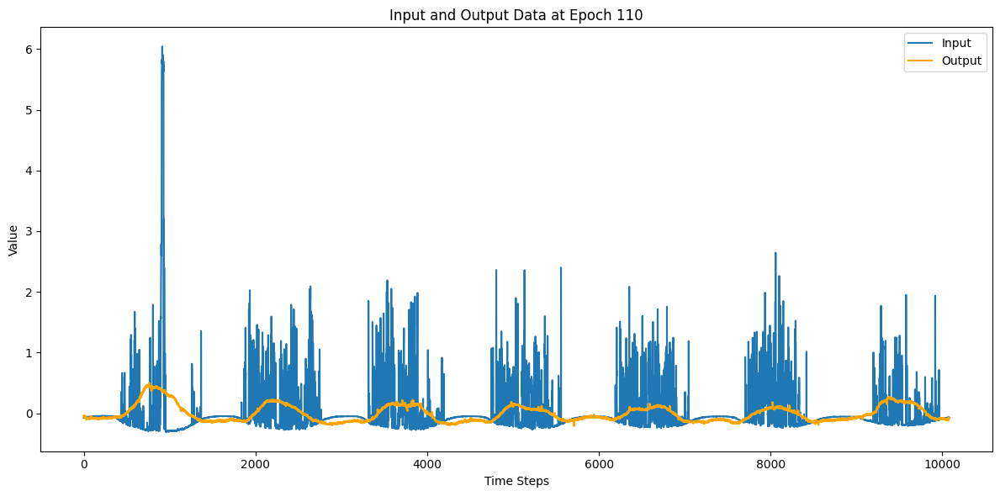

151/151 [==============================] - 13s 85ms/step - loss: 0.7571 - val_loss: 0.9429 - lr: 1.0000e-04
Epoch 111/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7586 - val_loss: 0.9392 - lr: 1.0000e-04
Epoch 112/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7567 - val_loss: 0.9390 - lr: 1.0000e-04
Epoch 113/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7595 - val_loss: 0.9403 - lr: 1.0000e-04
Epoch 114/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7562 - val_loss: 0.9407 - lr: 1.0000e-04
Epoch 115/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7556 - val_loss: 0.9374 - lr: 1.0000e-04
Epoch 116/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7587 - val_loss: 0.9384 - lr: 1.0000e-04
Epoch 117/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7577 - val_loss: 0.9377 - lr: 1.0000e-04
Epoch 118/10000
151/151 

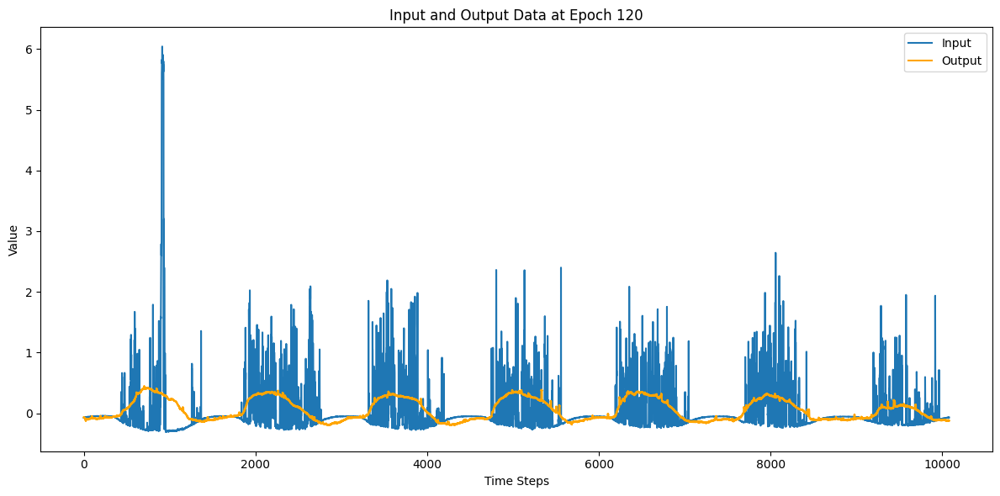

151/151 [==============================] - 13s 84ms/step - loss: 0.7557 - val_loss: 0.9360 - lr: 1.0000e-04
Epoch 121/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.7527 - val_loss: 0.9354 - lr: 1.0000e-04
Epoch 122/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7526 - val_loss: 0.9357 - lr: 1.0000e-04
Epoch 123/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7532 - val_loss: 0.9334 - lr: 1.0000e-04
Epoch 124/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7516 - val_loss: 0.9345 - lr: 1.0000e-04
Epoch 125/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7515 - val_loss: 0.9337 - lr: 1.0000e-04
Epoch 126/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7503 - val_loss: 0.9371 - lr: 1.0000e-04
Epoch 127/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7500 - val_loss: 0.9348 - lr: 1.0000e-04
Epoch 128/10000
151/151 

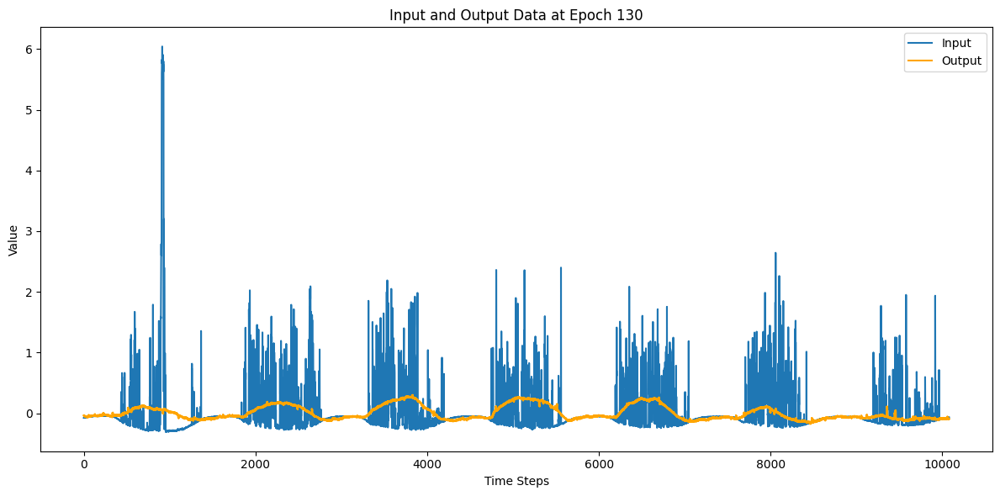

151/151 [==============================] - 13s 84ms/step - loss: 0.7491 - val_loss: 0.9319 - lr: 1.0000e-04
Epoch 131/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7479 - val_loss: 0.9317 - lr: 1.0000e-04
Epoch 132/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7484 - val_loss: 0.9309 - lr: 1.0000e-04
Epoch 133/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7592 - val_loss: 0.9336 - lr: 1.0000e-04
Epoch 134/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7471 - val_loss: 0.9300 - lr: 1.0000e-04
Epoch 135/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7462 - val_loss: 0.9299 - lr: 1.0000e-04
Epoch 136/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7462 - val_loss: 0.9289 - lr: 1.0000e-04
Epoch 137/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7461 - val_loss: 0.9281 - lr: 1.0000e-04
Epoch 138/10000
151/151 

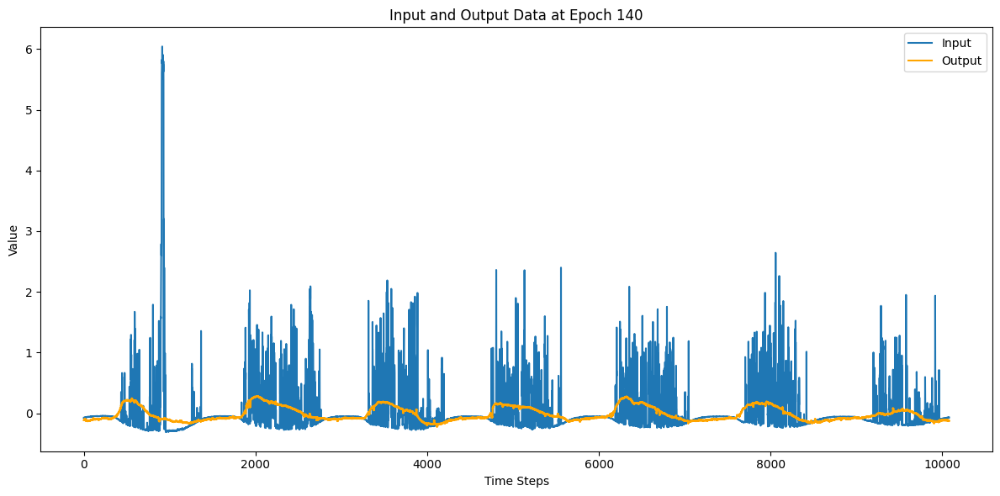

151/151 [==============================] - 13s 84ms/step - loss: 0.7455 - val_loss: 0.9294 - lr: 1.0000e-04
Epoch 141/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7442 - val_loss: 0.9279 - lr: 1.0000e-04
Epoch 142/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7441 - val_loss: 0.9260 - lr: 1.0000e-04
Epoch 143/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7434 - val_loss: 0.9261 - lr: 1.0000e-04
Epoch 144/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7450 - val_loss: 0.9260 - lr: 1.0000e-04
Epoch 145/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7437 - val_loss: 0.9253 - lr: 1.0000e-04
Epoch 146/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7420 - val_loss: 0.9263 - lr: 1.0000e-04
Epoch 147/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7422 - val_loss: 0.9239 - lr: 1.0000e-04
Epoch 148/10000
151/151 

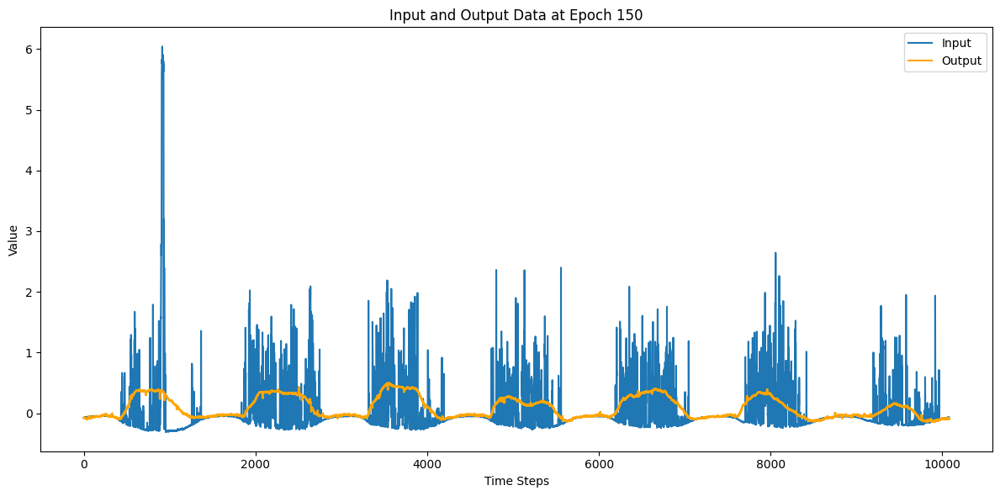

151/151 [==============================] - 13s 86ms/step - loss: 0.7405 - val_loss: 0.9221 - lr: 1.0000e-04
Epoch 151/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7419 - val_loss: 0.9226 - lr: 1.0000e-04
Epoch 152/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7395 - val_loss: 0.9221 - lr: 1.0000e-04
Epoch 153/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7426 - val_loss: 0.9214 - lr: 1.0000e-04
Epoch 154/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7427 - val_loss: 0.9212 - lr: 1.0000e-04
Epoch 155/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7401 - val_loss: 0.9210 - lr: 1.0000e-04
Epoch 156/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7397 - val_loss: 0.9206 - lr: 1.0000e-04
Epoch 157/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7378 - val_loss: 0.9195 - lr: 1.0000e-04
Epoch 158/10000
151/151 

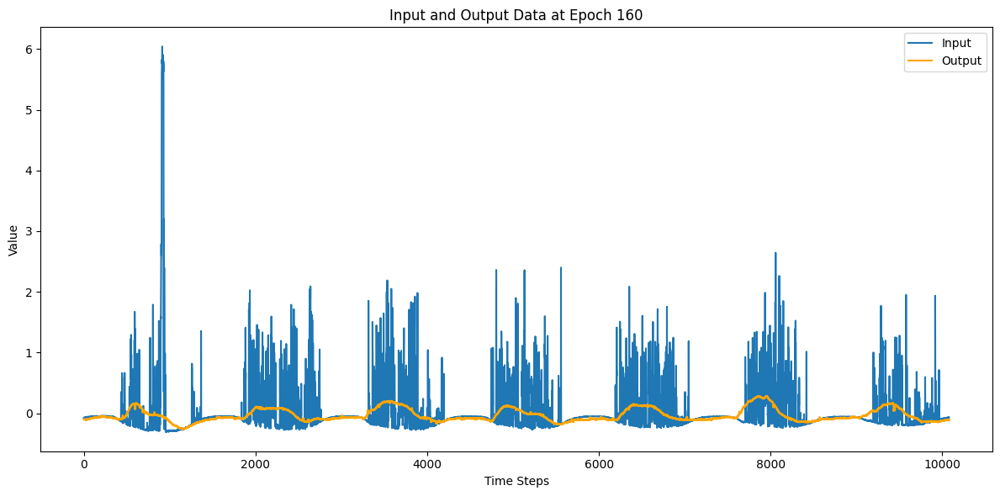

151/151 [==============================] - 13s 85ms/step - loss: 0.7366 - val_loss: 0.9175 - lr: 1.0000e-04
Epoch 161/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7475 - val_loss: 0.9186 - lr: 1.0000e-04
Epoch 162/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7357 - val_loss: 0.9192 - lr: 1.0000e-04
Epoch 163/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7351 - val_loss: 0.9186 - lr: 1.0000e-04
Epoch 164/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7352 - val_loss: 0.9176 - lr: 1.0000e-04
Epoch 165/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7357 - val_loss: 0.9158 - lr: 1.0000e-04
Epoch 166/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7341 - val_loss: 0.9159 - lr: 1.0000e-04
Epoch 167/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7337 - val_loss: 0.9162 - lr: 1.0000e-04
Epoch 168/10000
151/151 

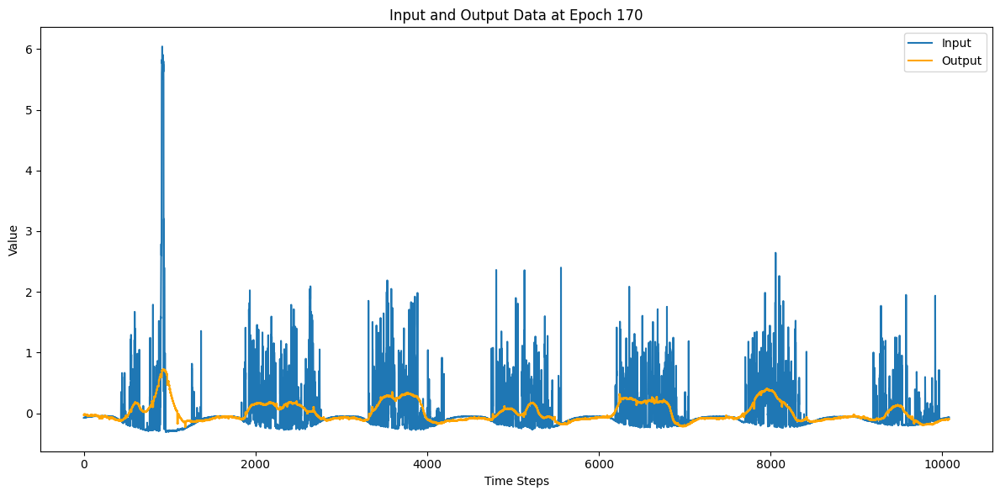

151/151 [==============================] - 13s 85ms/step - loss: 0.7325 - val_loss: 0.9149 - lr: 1.0000e-04
Epoch 171/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7349 - val_loss: 0.9153 - lr: 1.0000e-04
Epoch 172/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7322 - val_loss: 0.9132 - lr: 1.0000e-04
Epoch 173/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7315 - val_loss: 0.9127 - lr: 1.0000e-04
Epoch 174/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7316 - val_loss: 0.9121 - lr: 1.0000e-04
Epoch 175/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7309 - val_loss: 0.9136 - lr: 1.0000e-04
Epoch 176/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7308 - val_loss: 0.9129 - lr: 1.0000e-04
Epoch 177/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7312 - val_loss: 0.9134 - lr: 1.0000e-04
Epoch 178/10000
151/151 

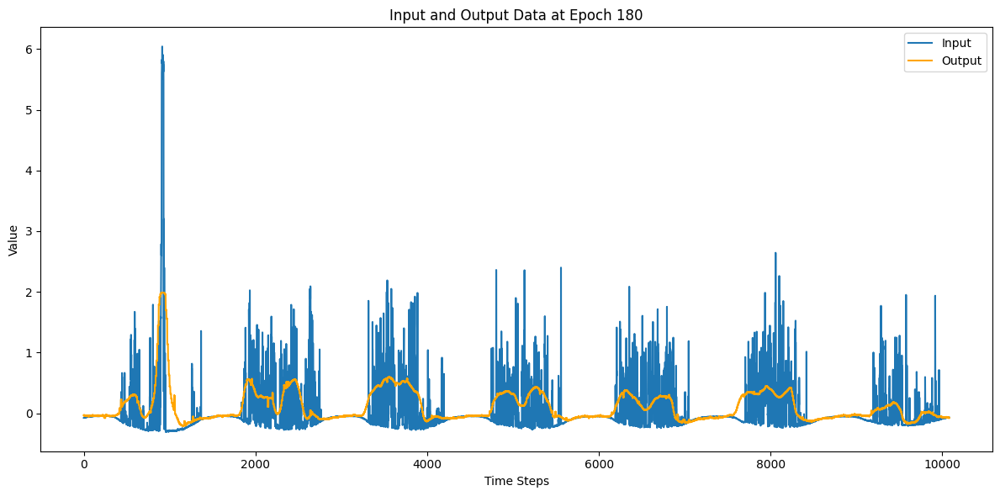

151/151 [==============================] - 13s 85ms/step - loss: 0.7296 - val_loss: 0.9115 - lr: 1.0000e-04
Epoch 181/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.7296 - val_loss: 0.9119 - lr: 1.0000e-04
Epoch 182/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7325 - val_loss: 0.9109 - lr: 1.0000e-04
Epoch 183/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7320 - val_loss: 0.9123 - lr: 1.0000e-04
Epoch 184/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7298 - val_loss: 0.9099 - lr: 1.0000e-04
Epoch 185/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7287 - val_loss: 0.9105 - lr: 1.0000e-04
Epoch 186/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7287 - val_loss: 0.9097 - lr: 1.0000e-04
Epoch 187/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7282 - val_loss: 0.9111 - lr: 1.0000e-04
Epoch 188/10000
151/151 

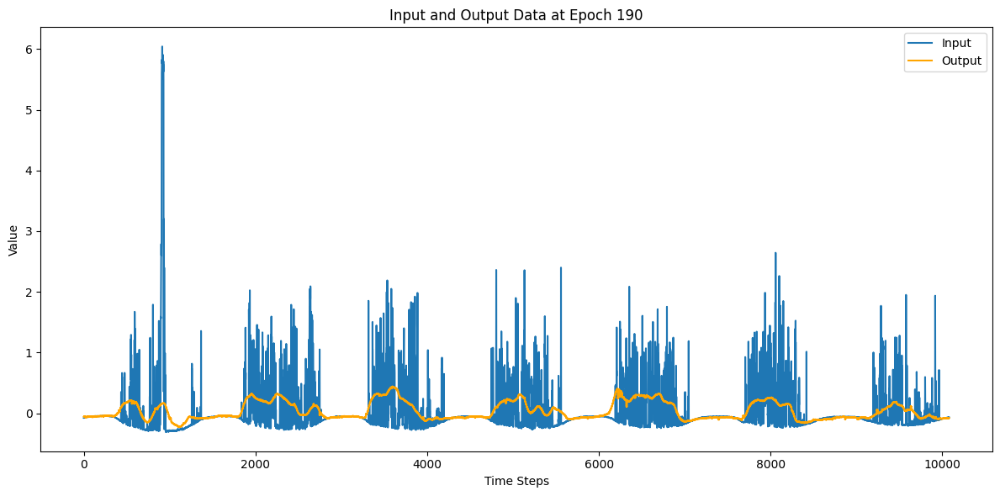

151/151 [==============================] - 13s 85ms/step - loss: 0.7278 - val_loss: 0.9106 - lr: 1.0000e-04
Epoch 191/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7317 - val_loss: 0.9098 - lr: 1.0000e-04
Epoch 192/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7272 - val_loss: 0.9108 - lr: 1.0000e-04
Epoch 193/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7272 - val_loss: 0.9087 - lr: 1.0000e-04
Epoch 194/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7272 - val_loss: 0.9098 - lr: 1.0000e-04
Epoch 195/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7275 - val_loss: 0.9092 - lr: 1.0000e-04
Epoch 196/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7265 - val_loss: 0.9089 - lr: 1.0000e-04
Epoch 197/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7265 - val_loss: 0.9087 - lr: 1.0000e-04
Epoch 198/10000
151/151 

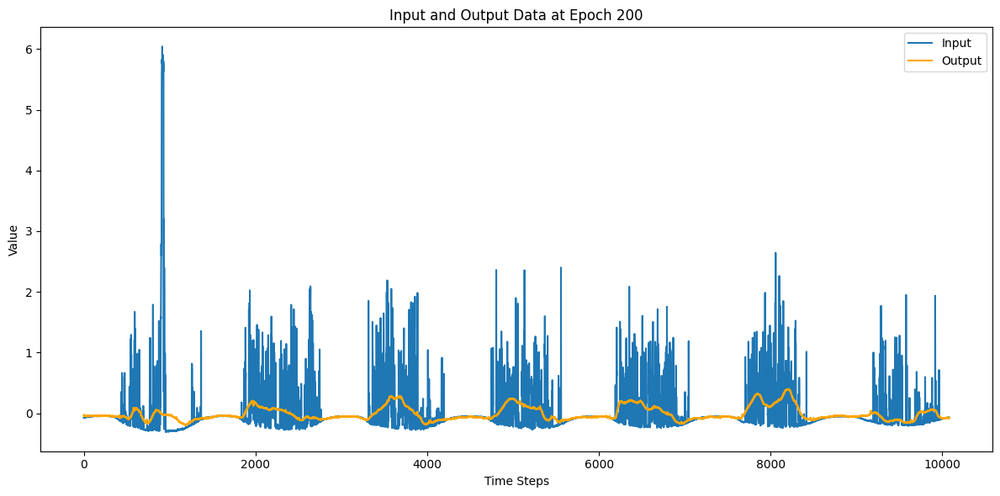

151/151 [==============================] - 13s 86ms/step - loss: 0.7279 - val_loss: 0.9073 - lr: 1.0000e-04
Epoch 201/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7259 - val_loss: 0.9079 - lr: 1.0000e-04
Epoch 202/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7273 - val_loss: 0.9076 - lr: 1.0000e-04
Epoch 203/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7267 - val_loss: 0.9084 - lr: 1.0000e-04
Epoch 204/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7250 - val_loss: 0.9082 - lr: 1.0000e-04
Epoch 205/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7253 - val_loss: 0.9084 - lr: 1.0000e-04
Epoch 206/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7272 - val_loss: 0.9075 - lr: 1.0000e-04
Epoch 207/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7248 - val_loss: 0.9062 - lr: 1.0000e-04
Epoch 208/10000
151/151 

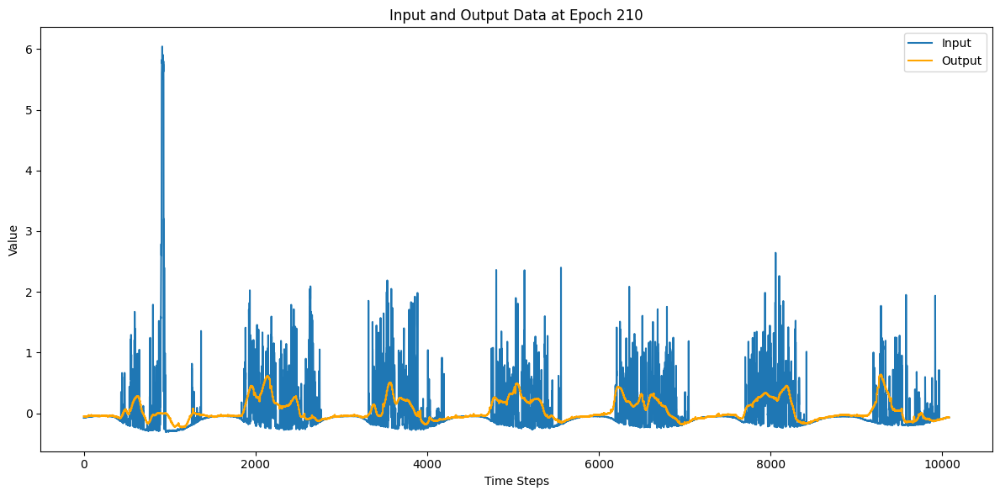

151/151 [==============================] - 13s 84ms/step - loss: 0.7241 - val_loss: 0.9065 - lr: 1.0000e-04
Epoch 211/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7245 - val_loss: 0.9062 - lr: 1.0000e-04
Epoch 212/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7238 - val_loss: 0.9060 - lr: 1.0000e-04
Epoch 213/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7257 - val_loss: 0.9052 - lr: 1.0000e-04
Epoch 214/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7237 - val_loss: 0.9056 - lr: 1.0000e-04
Epoch 215/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7241 - val_loss: 0.9056 - lr: 1.0000e-04
Epoch 216/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7230 - val_loss: 0.9055 - lr: 1.0000e-04
Epoch 217/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7232 - val_loss: 0.9060 - lr: 1.0000e-04
Epoch 218/10000
151/151 

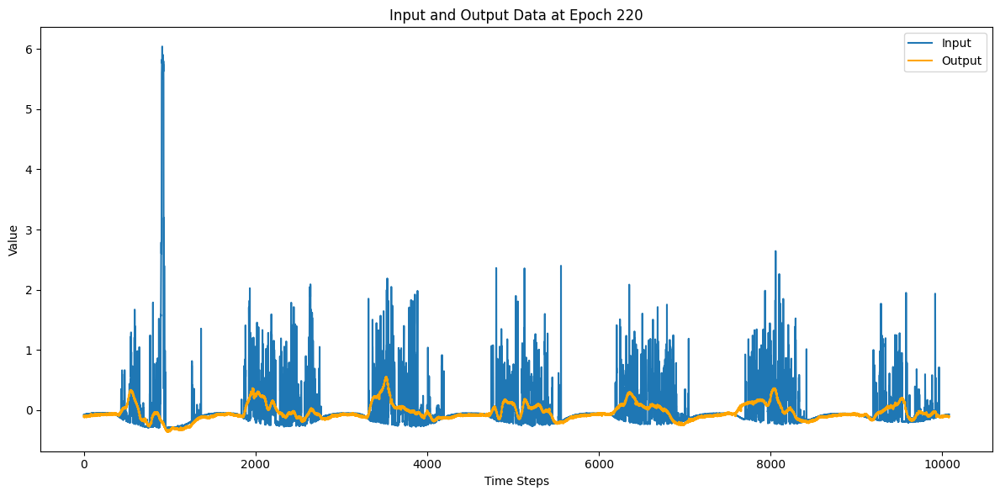

151/151 [==============================] - 13s 86ms/step - loss: 0.7278 - val_loss: 0.9064 - lr: 1.0000e-04
Epoch 221/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7231 - val_loss: 0.9040 - lr: 1.0000e-04
Epoch 222/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7228 - val_loss: 0.9053 - lr: 1.0000e-04
Epoch 223/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7222 - val_loss: 0.9057 - lr: 1.0000e-04
Epoch 224/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7222 - val_loss: 0.9041 - lr: 1.0000e-04
Epoch 225/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7227 - val_loss: 0.9049 - lr: 1.0000e-04
Epoch 226/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7220 - val_loss: 0.9038 - lr: 1.0000e-04
Epoch 227/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7220 - val_loss: 0.9043 - lr: 1.0000e-04
Epoch 228/10000
151/151 

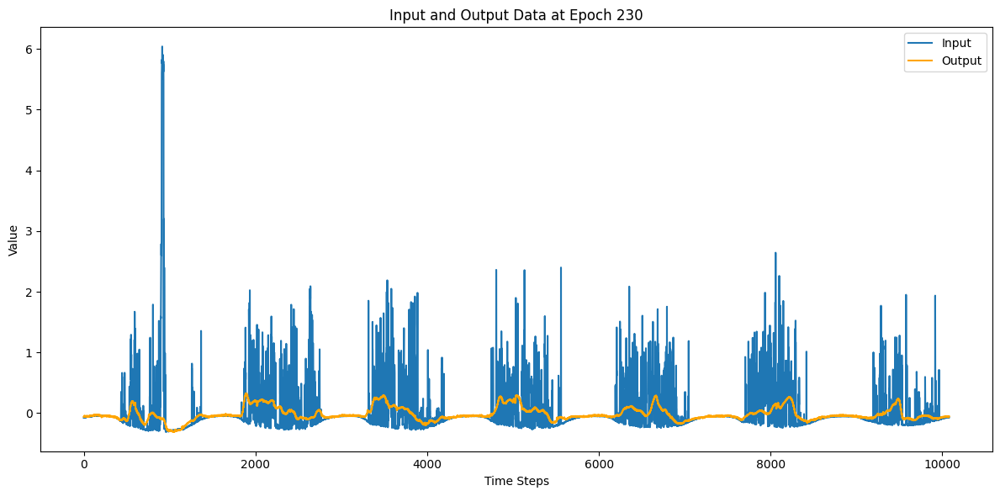

151/151 [==============================] - 13s 85ms/step - loss: 0.7219 - val_loss: 0.9035 - lr: 1.0000e-04
Epoch 231/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7215 - val_loss: 0.9031 - lr: 1.0000e-04
Epoch 232/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7221 - val_loss: 0.9037 - lr: 1.0000e-04
Epoch 233/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7211 - val_loss: 0.9048 - lr: 1.0000e-04
Epoch 234/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7214 - val_loss: 0.9042 - lr: 1.0000e-04
Epoch 235/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7208 - val_loss: 0.9029 - lr: 1.0000e-04
Epoch 236/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7219 - val_loss: 0.9031 - lr: 1.0000e-04
Epoch 237/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7315 - val_loss: 0.9026 - lr: 1.0000e-04
Epoch 238/10000
151/151 

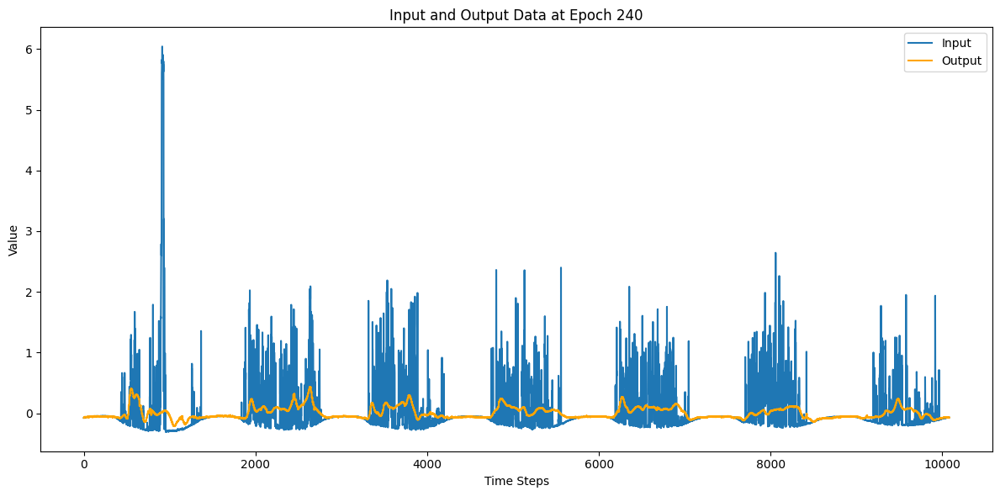

151/151 [==============================] - 13s 85ms/step - loss: 0.7208 - val_loss: 0.9033 - lr: 1.0000e-04
Epoch 241/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7204 - val_loss: 0.9022 - lr: 1.0000e-04
Epoch 242/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7205 - val_loss: 0.9033 - lr: 1.0000e-04
Epoch 243/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7203 - val_loss: 0.9031 - lr: 1.0000e-04
Epoch 244/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.7205 - val_loss: 0.9026 - lr: 1.0000e-04
Epoch 245/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7202 - val_loss: 0.9046 - lr: 1.0000e-04
Epoch 246/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7201 - val_loss: 0.9026 - lr: 1.0000e-04
Epoch 247/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7203 - val_loss: 0.9027 - lr: 1.0000e-04
Epoch 248/10000
151/151 

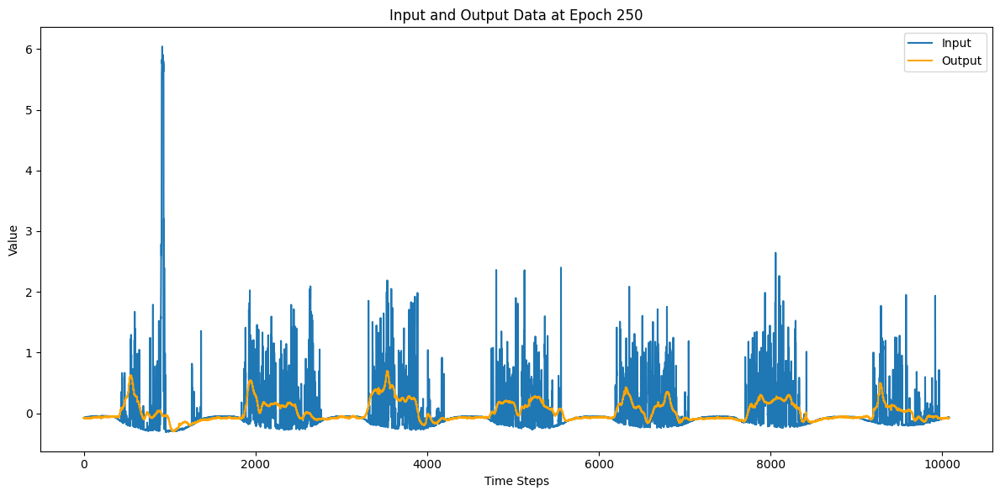

151/151 [==============================] - 13s 85ms/step - loss: 0.7199 - val_loss: 0.9029 - lr: 1.0000e-04
Epoch 251/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7209 - val_loss: 0.9022 - lr: 1.0000e-04
Epoch 252/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7238 - val_loss: 0.9038 - lr: 1.0000e-04
Epoch 253/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7197 - val_loss: 0.9013 - lr: 1.0000e-04
Epoch 254/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7202 - val_loss: 0.9016 - lr: 1.0000e-04
Epoch 255/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7203 - val_loss: 0.9028 - lr: 1.0000e-04
Epoch 256/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7198 - val_loss: 0.9027 - lr: 1.0000e-04
Epoch 257/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7193 - val_loss: 0.9021 - lr: 1.0000e-04
Epoch 258/10000
151/151 

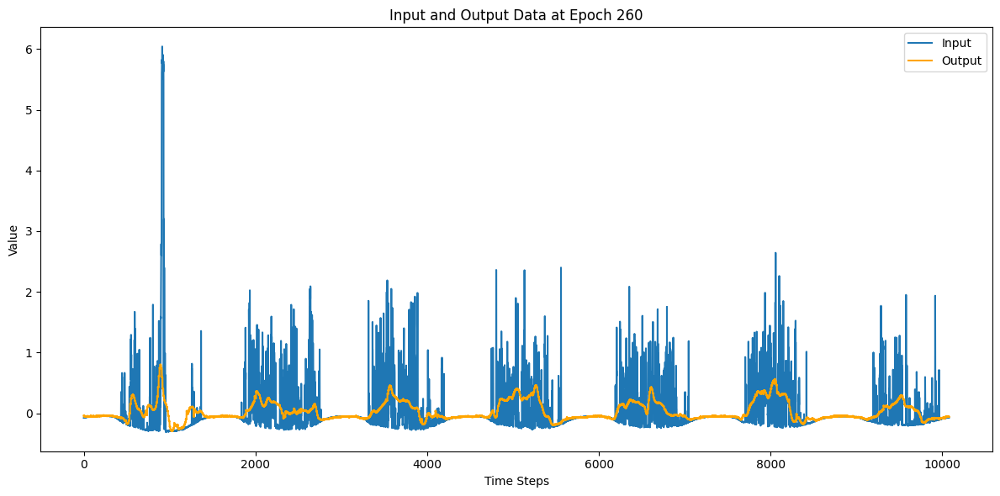

151/151 [==============================] - 13s 86ms/step - loss: 0.7190 - val_loss: 0.9008 - lr: 1.0000e-04
Epoch 261/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7211 - val_loss: 0.9024 - lr: 1.0000e-04
Epoch 262/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7306 - val_loss: 0.9016 - lr: 1.0000e-04
Epoch 263/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7200 - val_loss: 0.9019 - lr: 1.0000e-04
Epoch 264/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7193 - val_loss: 0.9007 - lr: 1.0000e-04
Epoch 265/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7186 - val_loss: 0.9022 - lr: 1.0000e-04
Epoch 266/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7250 - val_loss: 0.9018 - lr: 1.0000e-04
Epoch 267/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7188 - val_loss: 0.9012 - lr: 1.0000e-04
Epoch 268/10000
151/151 

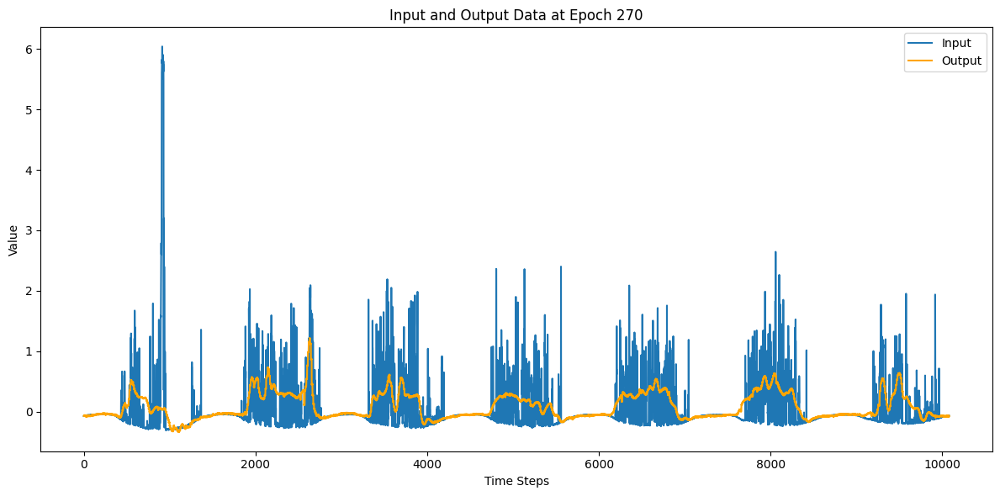

151/151 [==============================] - 13s 85ms/step - loss: 0.7188 - val_loss: 0.9023 - lr: 1.0000e-04
Epoch 271/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7186 - val_loss: 0.9013 - lr: 1.0000e-04
Epoch 272/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7202 - val_loss: 0.9015 - lr: 1.0000e-04
Epoch 273/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7220 - val_loss: 0.9007 - lr: 1.0000e-04
Epoch 274/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7184 - val_loss: 0.9005 - lr: 1.0000e-04
Epoch 275/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7184 - val_loss: 0.9005 - lr: 1.0000e-04
Epoch 276/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.7184 - val_loss: 0.9007 - lr: 1.0000e-04
Epoch 277/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7182 - val_loss: 0.9005 - lr: 1.0000e-04
Epoch 278/10000
151/151 

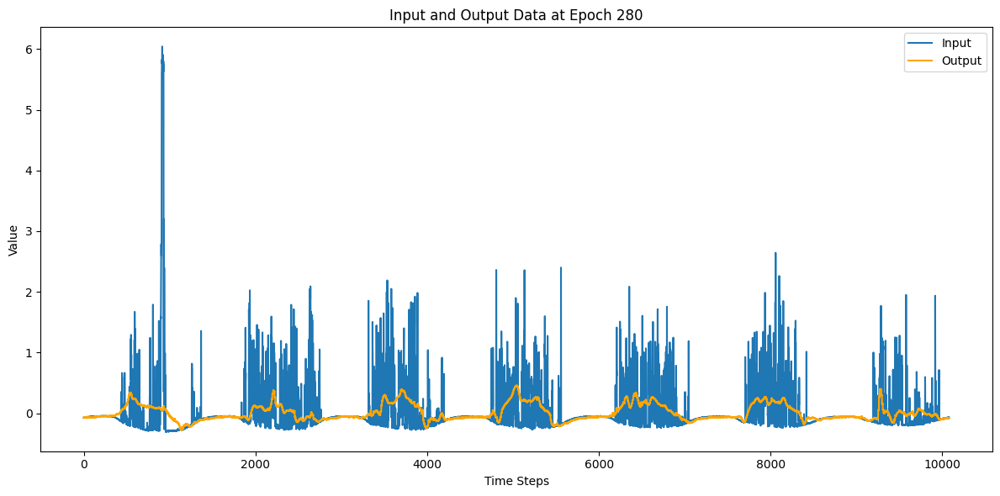

151/151 [==============================] - 13s 85ms/step - loss: 0.7179 - val_loss: 0.9011 - lr: 1.0000e-04
Epoch 281/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7260 - val_loss: 0.9007 - lr: 1.0000e-04
Epoch 282/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7197 - val_loss: 0.9001 - lr: 1.0000e-04
Epoch 283/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7178 - val_loss: 0.9020 - lr: 1.0000e-04
Epoch 284/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7195 - val_loss: 0.9002 - lr: 1.0000e-04
Epoch 285/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7179 - val_loss: 0.9003 - lr: 1.0000e-04
Epoch 286/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7180 - val_loss: 0.9002 - lr: 1.0000e-04
Epoch 287/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7176 - val_loss: 0.9008 - lr: 1.0000e-04
Epoch 288/10000
151/151 

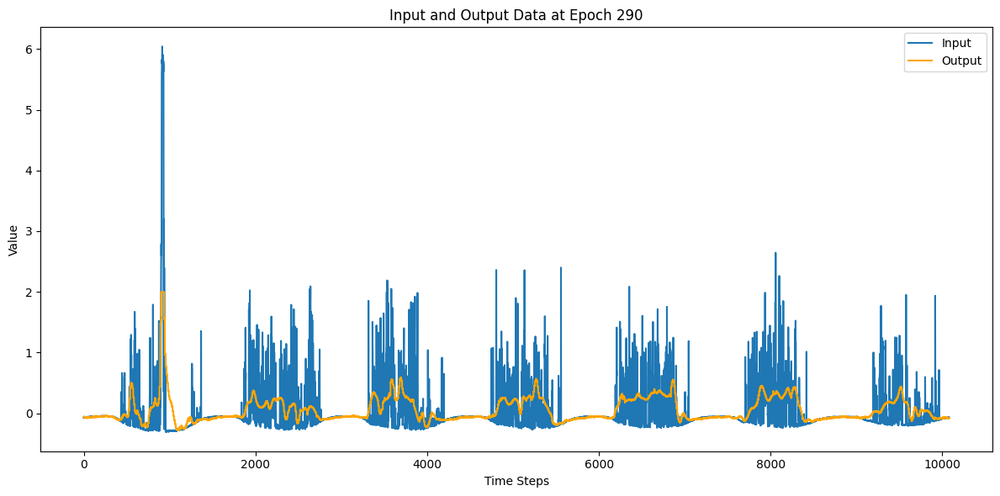

151/151 [==============================] - 13s 85ms/step - loss: 0.7173 - val_loss: 0.9014 - lr: 1.0000e-04
Epoch 291/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7176 - val_loss: 0.8993 - lr: 1.0000e-04
Epoch 292/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7174 - val_loss: 0.9007 - lr: 1.0000e-04
Epoch 293/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7172 - val_loss: 0.8995 - lr: 1.0000e-04
Epoch 294/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7175 - val_loss: 0.8998 - lr: 1.0000e-04
Epoch 295/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7174 - val_loss: 0.8987 - lr: 1.0000e-04
Epoch 296/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7208 - val_loss: 0.9014 - lr: 1.0000e-04
Epoch 297/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7183 - val_loss: 0.8990 - lr: 1.0000e-04
Epoch 298/10000
151/151 

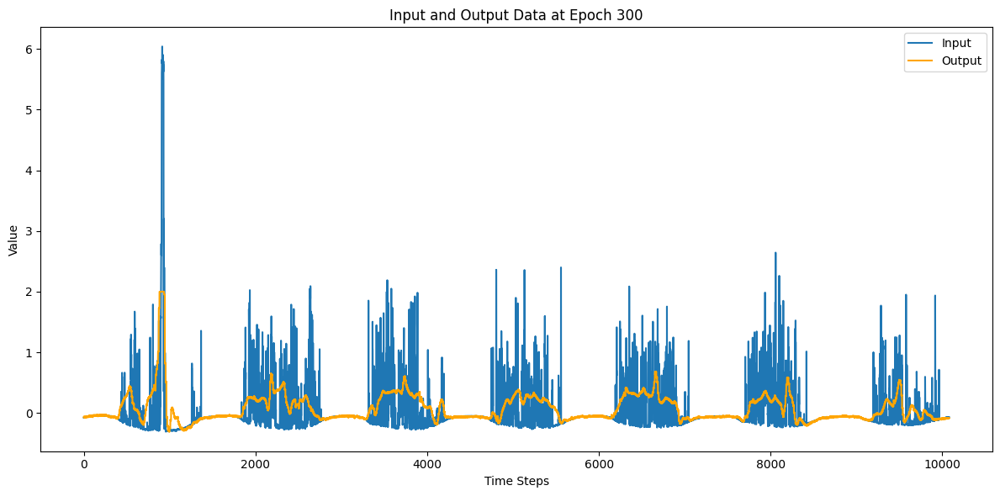

151/151 [==============================] - 13s 85ms/step - loss: 0.7190 - val_loss: 0.9014 - lr: 1.0000e-04
Epoch 301/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7186 - val_loss: 0.9004 - lr: 1.0000e-04
Epoch 302/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7169 - val_loss: 0.8993 - lr: 1.0000e-04
Epoch 303/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7167 - val_loss: 0.9001 - lr: 1.0000e-04
Epoch 304/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7172 - val_loss: 0.8998 - lr: 1.0000e-04
Epoch 305/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7167 - val_loss: 0.8995 - lr: 1.0000e-04
Epoch 306/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7173 - val_loss: 0.8990 - lr: 1.0000e-04
Epoch 307/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7168 - val_loss: 0.8994 - lr: 1.0000e-04
Epoch 308/10000
151/151 

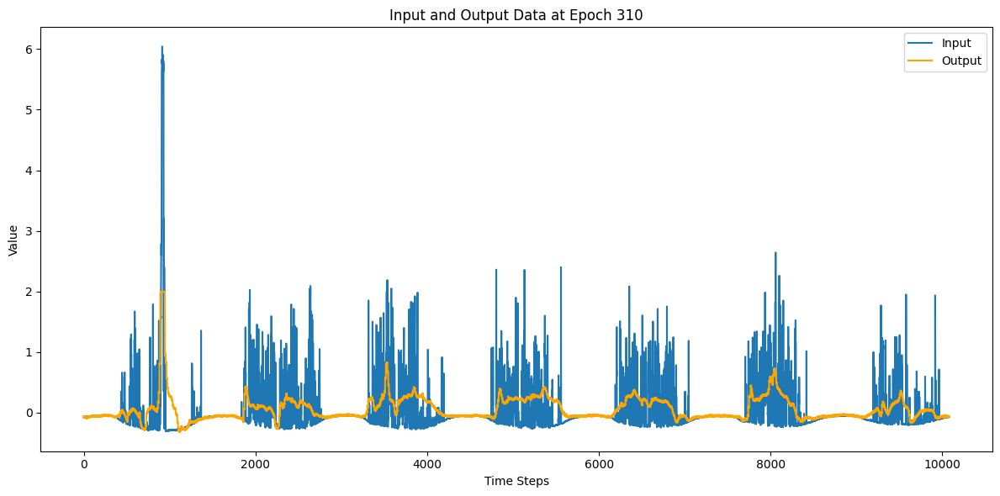

151/151 [==============================] - 13s 86ms/step - loss: 0.7165 - val_loss: 0.9002 - lr: 1.0000e-04
Epoch 311/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7163 - val_loss: 0.8996 - lr: 1.0000e-04
Epoch 312/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7170 - val_loss: 0.8990 - lr: 1.0000e-04
Epoch 313/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7195 - val_loss: 0.8994 - lr: 1.0000e-04
Epoch 314/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7163 - val_loss: 0.8986 - lr: 1.0000e-04
Epoch 315/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7162 - val_loss: 0.8988 - lr: 1.0000e-04
Epoch 316/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7166 - val_loss: 0.8990 - lr: 1.0000e-04
Epoch 317/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7163 - val_loss: 0.9002 - lr: 1.0000e-04
Epoch 318/10000
151/151 

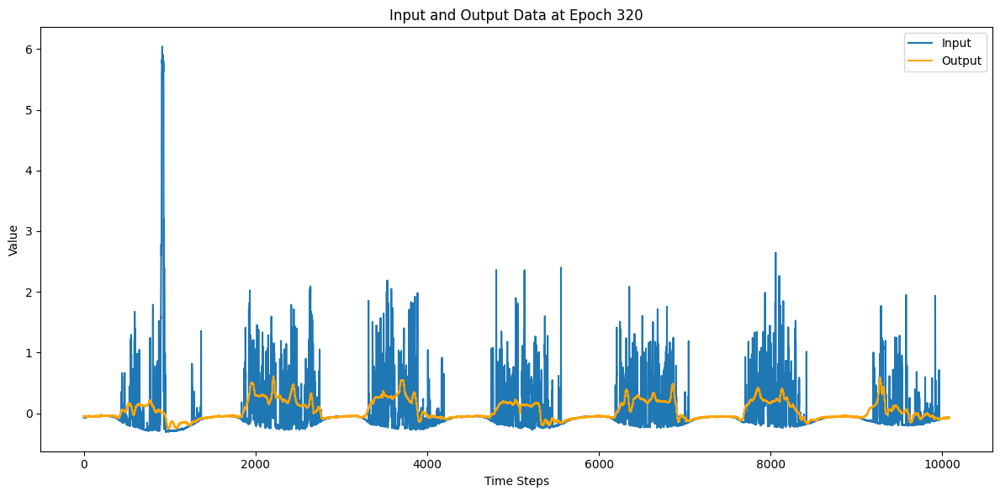

151/151 [==============================] - 13s 85ms/step - loss: 0.7163 - val_loss: 0.8982 - lr: 1.0000e-04
Epoch 321/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7159 - val_loss: 0.8996 - lr: 1.0000e-04
Epoch 322/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7160 - val_loss: 0.8990 - lr: 1.0000e-04
Epoch 323/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7161 - val_loss: 0.8992 - lr: 1.0000e-04
Epoch 324/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7176 - val_loss: 0.8985 - lr: 1.0000e-04
Epoch 325/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7161 - val_loss: 0.8992 - lr: 1.0000e-04
Epoch 326/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7164 - val_loss: 0.8997 - lr: 1.0000e-04
Epoch 327/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7160 - val_loss: 0.8998 - lr: 1.0000e-04
Epoch 328/10000
151/151 

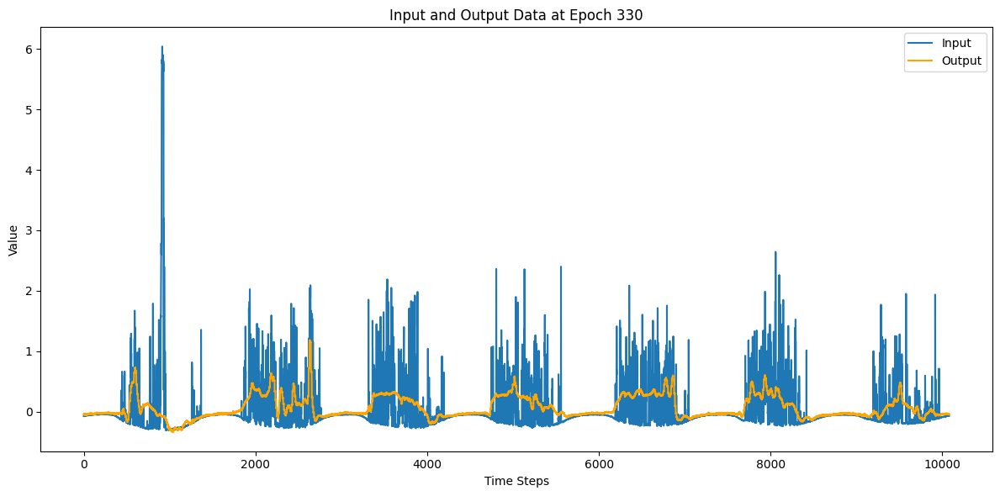

151/151 [==============================] - 13s 85ms/step - loss: 0.7157 - val_loss: 0.8991 - lr: 1.0000e-04
Epoch 331/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7158 - val_loss: 0.8991 - lr: 1.0000e-04
Epoch 332/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7177 - val_loss: 0.8991 - lr: 1.0000e-04
Epoch 333/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7159 - val_loss: 0.8987 - lr: 1.0000e-04
Epoch 334/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7158 - val_loss: 0.8981 - lr: 1.0000e-04
Epoch 335/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7156 - val_loss: 0.8976 - lr: 1.0000e-04
Epoch 336/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7155 - val_loss: 0.8992 - lr: 1.0000e-04
Epoch 337/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7157 - val_loss: 0.8981 - lr: 1.0000e-04
Epoch 338/10000
151/151 

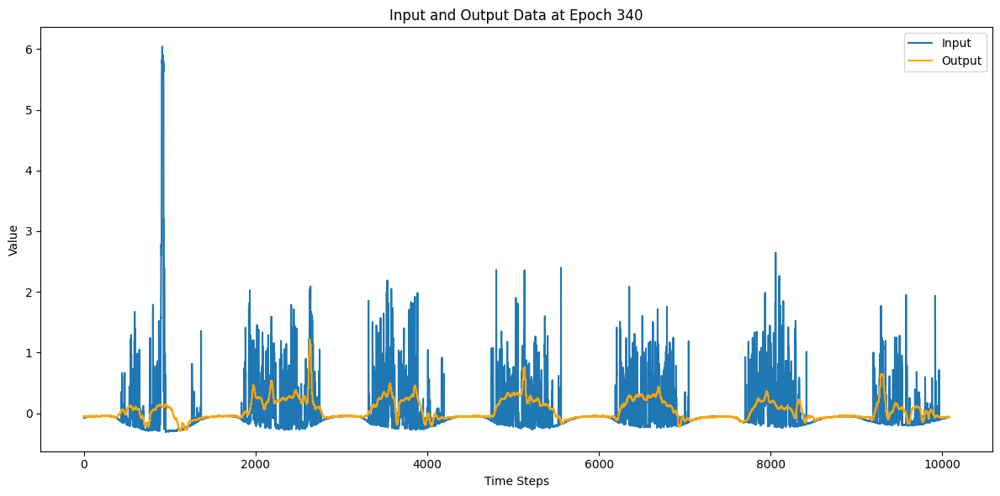

151/151 [==============================] - 13s 86ms/step - loss: 0.7155 - val_loss: 0.8983 - lr: 1.0000e-04
Epoch 341/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7154 - val_loss: 0.8983 - lr: 1.0000e-04
Epoch 342/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7155 - val_loss: 0.8989 - lr: 1.0000e-04
Epoch 343/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7171 - val_loss: 0.9006 - lr: 1.0000e-04
Epoch 344/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7187 - val_loss: 0.8987 - lr: 1.0000e-04
Epoch 345/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7156 - val_loss: 0.8983 - lr: 1.0000e-04
Epoch 346/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7150 - val_loss: 0.8980 - lr: 1.0000e-04
Epoch 347/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7153 - val_loss: 0.8983 - lr: 1.0000e-04
Epoch 348/10000
151/151 

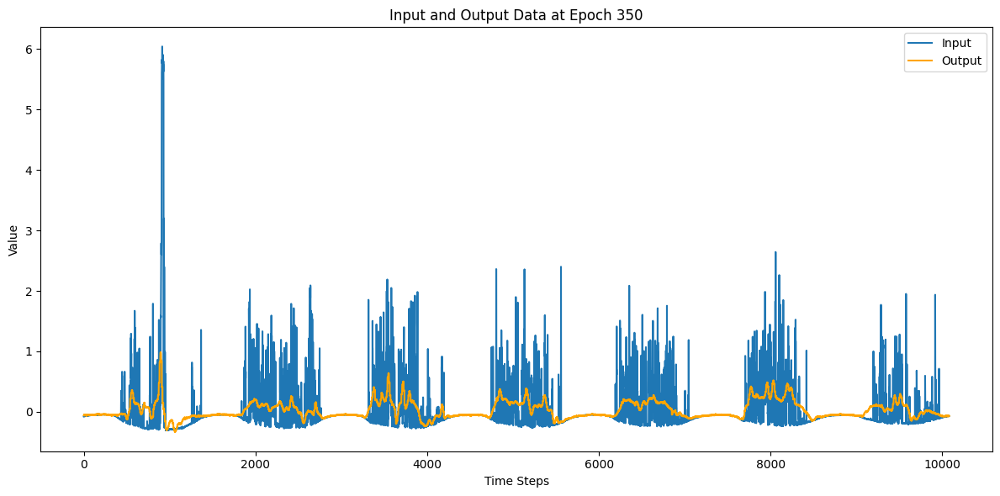

151/151 [==============================] - 13s 85ms/step - loss: 0.7148 - val_loss: 0.8978 - lr: 1.0000e-04
Epoch 351/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7150 - val_loss: 0.8977 - lr: 1.0000e-04
Epoch 352/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7166 - val_loss: 0.8988 - lr: 1.0000e-04
Epoch 353/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7260 - val_loss: 0.8997 - lr: 1.0000e-04
Epoch 354/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7155 - val_loss: 0.8994 - lr: 1.0000e-04
Epoch 355/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7149 - val_loss: 0.8977 - lr: 1.0000e-04
Epoch 356/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7146 - val_loss: 0.8976 - lr: 1.0000e-04
Epoch 357/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7177 - val_loss: 0.8982 - lr: 1.0000e-04
Epoch 358/10000
151/151 

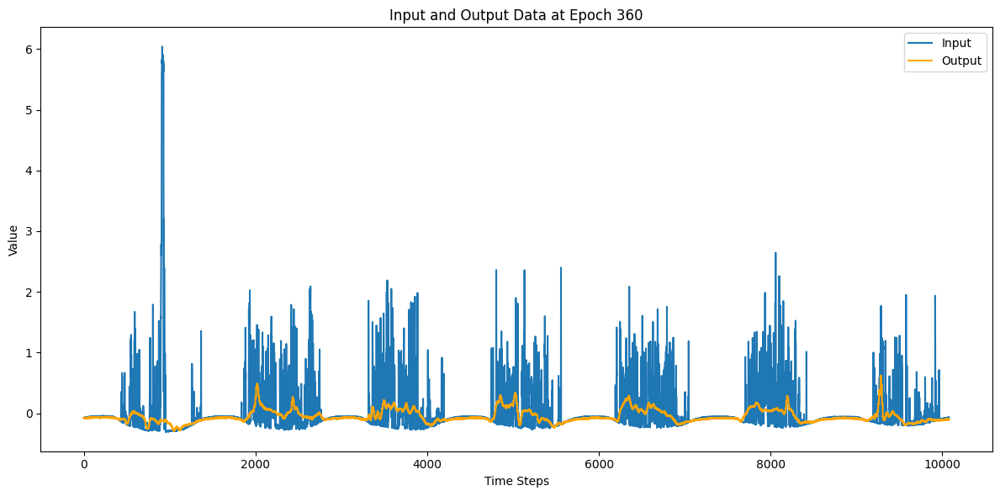

151/151 [==============================] - 13s 85ms/step - loss: 0.7152 - val_loss: 0.8991 - lr: 1.0000e-04
Epoch 361/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7147 - val_loss: 0.8983 - lr: 1.0000e-04
Epoch 362/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7169 - val_loss: 0.8969 - lr: 1.0000e-04
Epoch 363/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7146 - val_loss: 0.8979 - lr: 1.0000e-04
Epoch 364/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7183 - val_loss: 0.8966 - lr: 1.0000e-04
Epoch 365/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7146 - val_loss: 0.8977 - lr: 1.0000e-04
Epoch 366/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7146 - val_loss: 0.8975 - lr: 1.0000e-04
Epoch 367/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7150 - val_loss: 0.8979 - lr: 1.0000e-04
Epoch 368/10000
151/151 

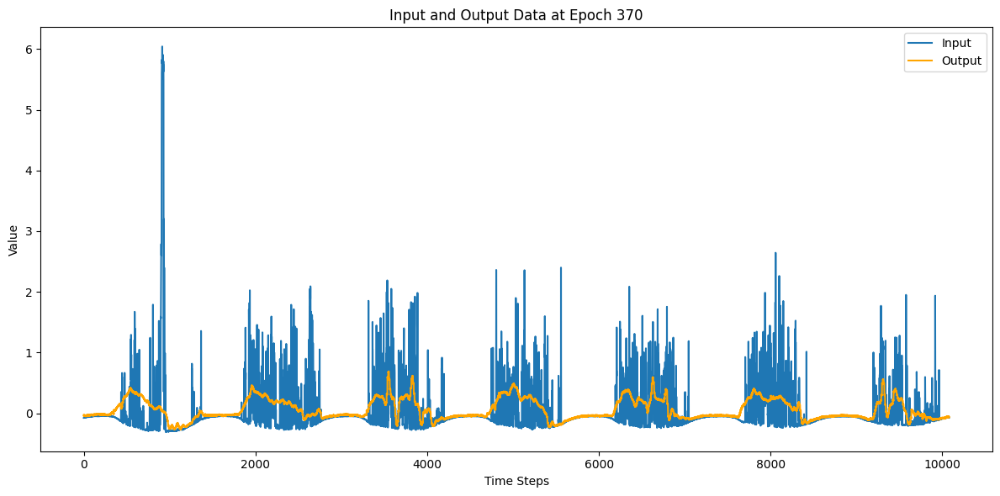

151/151 [==============================] - 14s 90ms/step - loss: 0.7151 - val_loss: 0.8965 - lr: 1.0000e-04
Epoch 371/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7148 - val_loss: 0.8968 - lr: 1.0000e-04
Epoch 372/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7146 - val_loss: 0.8973 - lr: 1.0000e-04
Epoch 373/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7146 - val_loss: 0.8984 - lr: 1.0000e-04
Epoch 374/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7142 - val_loss: 0.8983 - lr: 1.0000e-04
Epoch 375/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7146 - val_loss: 0.8967 - lr: 1.0000e-04
Epoch 376/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7149 - val_loss: 0.8977 - lr: 1.0000e-04
Epoch 377/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7145 - val_loss: 0.8967 - lr: 1.0000e-04
Epoch 378/10000
151/151 

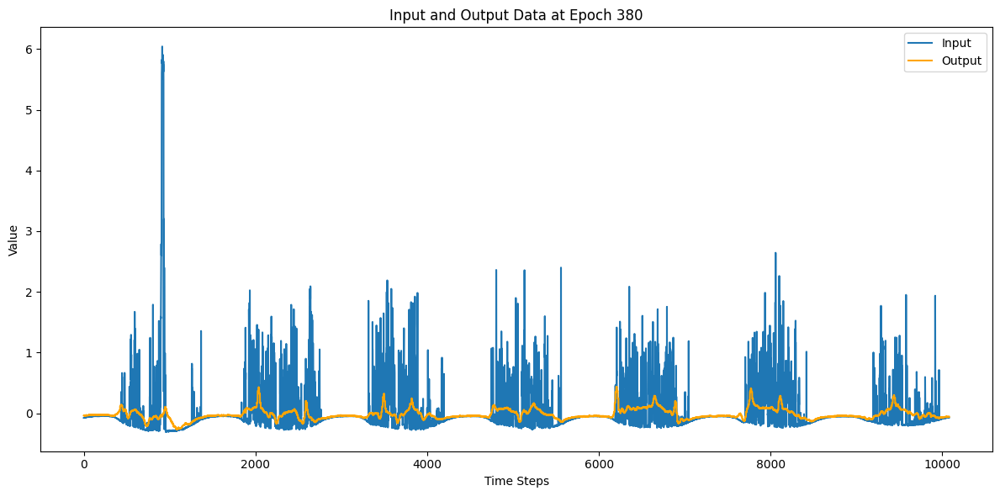

151/151 [==============================] - 13s 86ms/step - loss: 0.7184 - val_loss: 0.8973 - lr: 1.0000e-04
Epoch 381/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7142 - val_loss: 0.8971 - lr: 1.0000e-04
Epoch 382/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7143 - val_loss: 0.8972 - lr: 1.0000e-04
Epoch 383/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7198 - val_loss: 0.8982 - lr: 1.0000e-04
Epoch 384/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7143 - val_loss: 0.8970 - lr: 1.0000e-04
Epoch 385/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7141 - val_loss: 0.8968 - lr: 1.0000e-04
Epoch 386/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7140 - val_loss: 0.8982 - lr: 1.0000e-04
Epoch 387/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7257 - val_loss: 0.8977 - lr: 1.0000e-04
Epoch 388/10000
151/151 

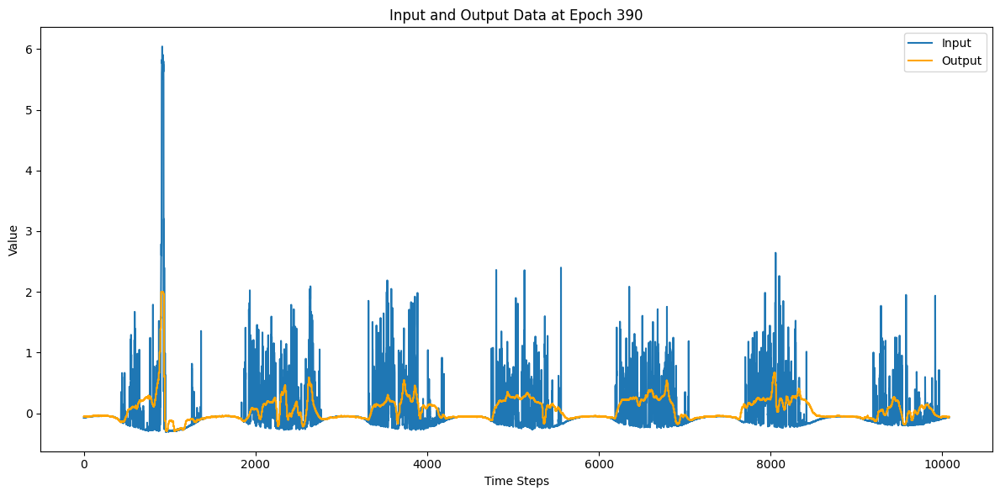

151/151 [==============================] - 13s 86ms/step - loss: 0.7136 - val_loss: 0.8956 - lr: 1.0000e-04
Epoch 391/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7138 - val_loss: 0.8965 - lr: 1.0000e-04
Epoch 392/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7138 - val_loss: 0.8972 - lr: 1.0000e-04
Epoch 393/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7183 - val_loss: 0.8977 - lr: 1.0000e-04
Epoch 394/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7207 - val_loss: 0.8963 - lr: 1.0000e-04
Epoch 395/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7137 - val_loss: 0.8972 - lr: 1.0000e-04
Epoch 396/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7169 - val_loss: 0.8977 - lr: 1.0000e-04
Epoch 397/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7137 - val_loss: 0.8961 - lr: 1.0000e-04
Epoch 398/10000
151/151 

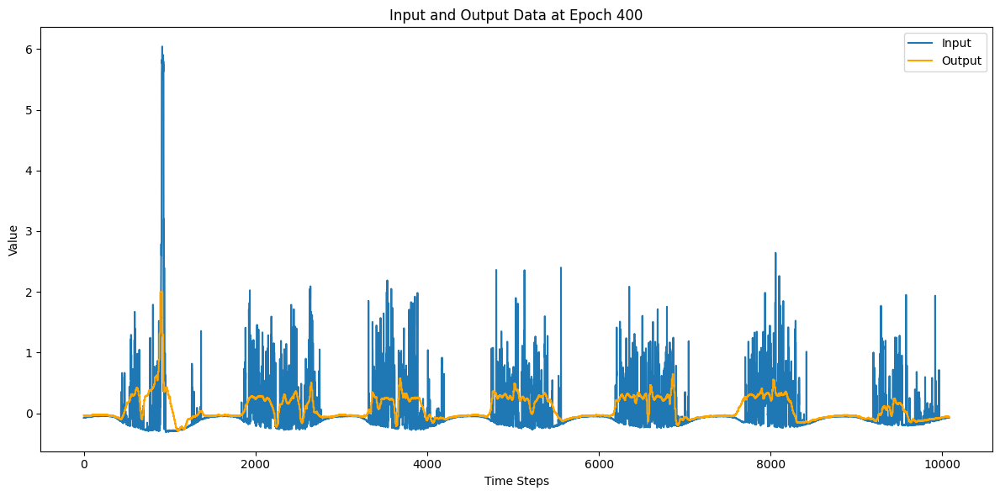

151/151 [==============================] - 13s 85ms/step - loss: 0.7142 - val_loss: 0.8965 - lr: 1.0000e-04
Epoch 401/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.7132 - val_loss: 0.8955 - lr: 1.0000e-04
Epoch 402/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7133 - val_loss: 0.8973 - lr: 1.0000e-04
Epoch 403/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7136 - val_loss: 0.8966 - lr: 1.0000e-04
Epoch 404/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7137 - val_loss: 0.8962 - lr: 1.0000e-04
Epoch 405/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7132 - val_loss: 0.8973 - lr: 1.0000e-04
Epoch 406/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7132 - val_loss: 0.8970 - lr: 1.0000e-04
Epoch 407/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7133 - val_loss: 0.8975 - lr: 1.0000e-04
Epoch 408/10000
151/151 

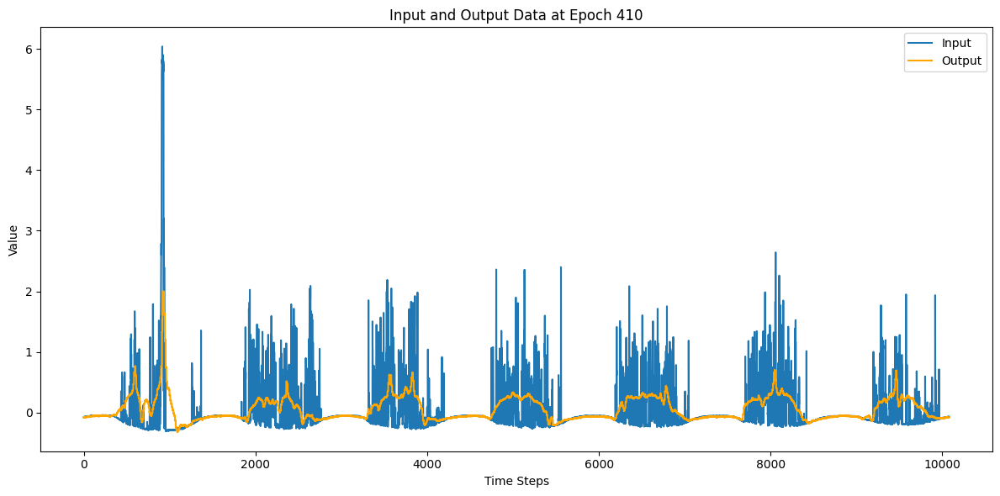

151/151 [==============================] - 13s 85ms/step - loss: 0.7135 - val_loss: 0.8968 - lr: 1.0000e-04
Epoch 411/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7219 - val_loss: 0.8973 - lr: 1.0000e-04
Epoch 412/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7132 - val_loss: 0.8959 - lr: 1.0000e-04
Epoch 413/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7130 - val_loss: 0.8962 - lr: 1.0000e-04
Epoch 414/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7132 - val_loss: 0.8953 - lr: 1.0000e-04
Epoch 415/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7132 - val_loss: 0.8959 - lr: 1.0000e-04
Epoch 416/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7130 - val_loss: 0.8966 - lr: 1.0000e-04
Epoch 417/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7137 - val_loss: 0.8964 - lr: 1.0000e-04
Epoch 418/10000
151/151 

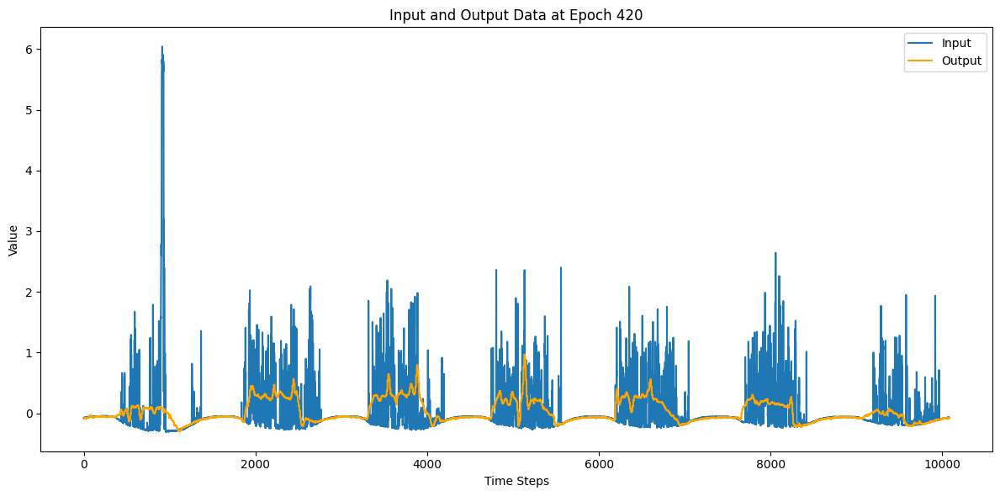

151/151 [==============================] - 13s 86ms/step - loss: 0.7132 - val_loss: 0.8966 - lr: 1.0000e-04
Epoch 421/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7130 - val_loss: 0.8955 - lr: 1.0000e-04
Epoch 422/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7129 - val_loss: 0.8974 - lr: 1.0000e-04
Epoch 423/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7159 - val_loss: 0.8959 - lr: 1.0000e-04
Epoch 424/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7197 - val_loss: 0.8976 - lr: 1.0000e-04
Epoch 425/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7128 - val_loss: 0.8960 - lr: 1.0000e-04
Epoch 426/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7130 - val_loss: 0.8971 - lr: 1.0000e-04
Epoch 427/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7129 - val_loss: 0.8960 - lr: 1.0000e-04
Epoch 428/10000
151/151 

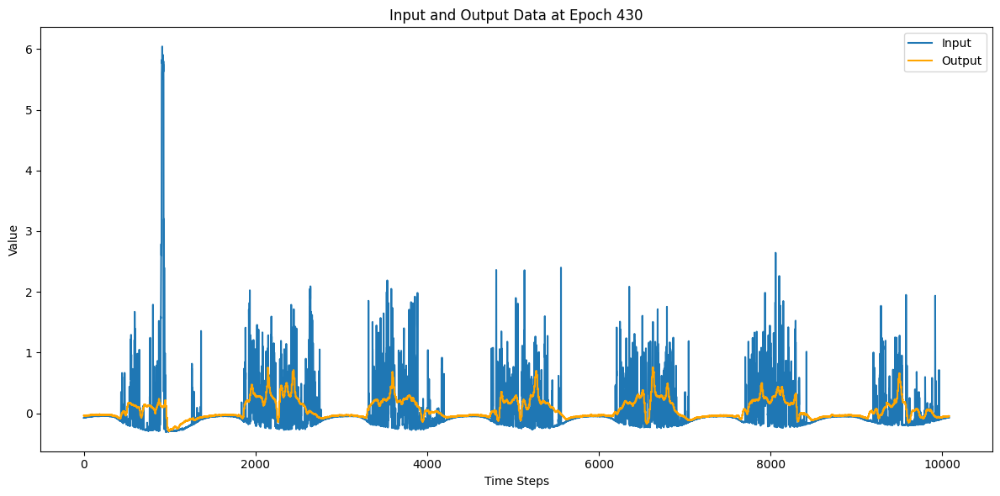

151/151 [==============================] - 13s 85ms/step - loss: 0.7129 - val_loss: 0.8963 - lr: 1.0000e-04
Epoch 431/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7135 - val_loss: 0.8962 - lr: 1.0000e-04
Epoch 432/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.7131 - val_loss: 0.8975 - lr: 1.0000e-04
Epoch 433/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7318 - val_loss: 0.8961 - lr: 1.0000e-04
Epoch 434/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7131 - val_loss: 0.8962 - lr: 1.0000e-04
Epoch 435/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7124 - val_loss: 0.8952 - lr: 1.0000e-04
Epoch 436/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7196 - val_loss: 0.8966 - lr: 1.0000e-04
Epoch 437/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7129 - val_loss: 0.8960 - lr: 1.0000e-04
Epoch 438/10000
151/151 

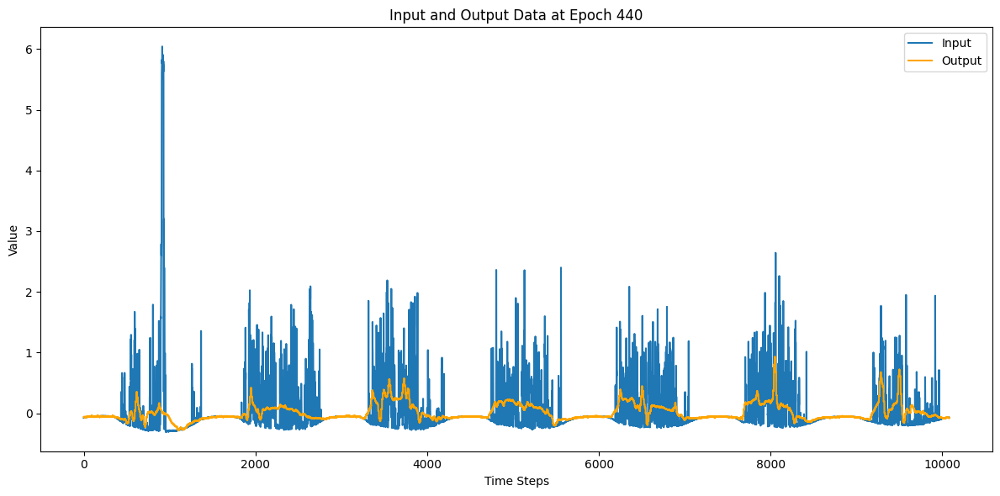

151/151 [==============================] - 13s 86ms/step - loss: 0.7126 - val_loss: 0.8956 - lr: 1.0000e-04
Epoch 441/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7164 - val_loss: 0.8956 - lr: 1.0000e-04
Epoch 442/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7131 - val_loss: 0.8959 - lr: 1.0000e-04
Epoch 443/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7158 - val_loss: 0.8955 - lr: 1.0000e-04
Epoch 444/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7161 - val_loss: 0.8961 - lr: 1.0000e-04
Epoch 445/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7127 - val_loss: 0.8960 - lr: 1.0000e-04
Epoch 446/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7128 - val_loss: 0.8962 - lr: 1.0000e-04
Epoch 447/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7123 - val_loss: 0.8955 - lr: 1.0000e-04
Epoch 448/10000
151/151 

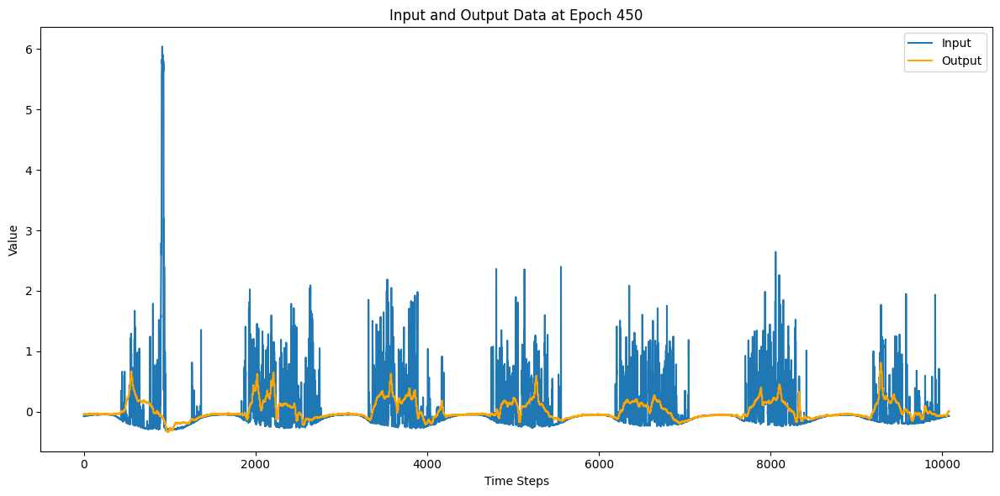

151/151 [==============================] - 13s 85ms/step - loss: 0.7162 - val_loss: 0.8961 - lr: 1.0000e-04
Epoch 451/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7126 - val_loss: 0.8954 - lr: 1.0000e-04
Epoch 452/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7124 - val_loss: 0.8955 - lr: 1.0000e-04
Epoch 453/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7164 - val_loss: 0.8958 - lr: 1.0000e-04
Epoch 454/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7128 - val_loss: 0.8965 - lr: 1.0000e-04
Epoch 455/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7127 - val_loss: 0.8961 - lr: 1.0000e-04
Epoch 456/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7131 - val_loss: 0.8958 - lr: 1.0000e-04
Epoch 457/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7125 - val_loss: 0.8952 - lr: 1.0000e-04
Epoch 458/10000
151/151 

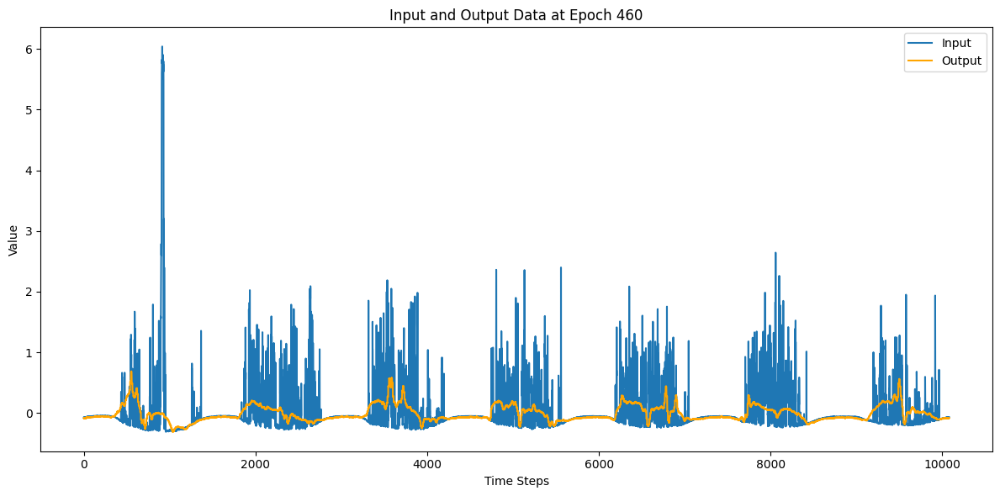

151/151 [==============================] - 13s 85ms/step - loss: 0.7126 - val_loss: 0.8964 - lr: 1.0000e-04
Epoch 461/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7117 - val_loss: 0.8966 - lr: 1.0000e-04
Epoch 462/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7120 - val_loss: 0.8954 - lr: 1.0000e-04
Epoch 463/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7117 - val_loss: 0.8958 - lr: 1.0000e-04
Epoch 464/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7121 - val_loss: 0.8958 - lr: 1.0000e-04
Epoch 465/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7135 - val_loss: 0.8967 - lr: 1.0000e-04
Epoch 466/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7122 - val_loss: 0.8960 - lr: 1.0000e-04
Epoch 467/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7121 - val_loss: 0.8950 - lr: 1.0000e-04
Epoch 468/10000
151/151 

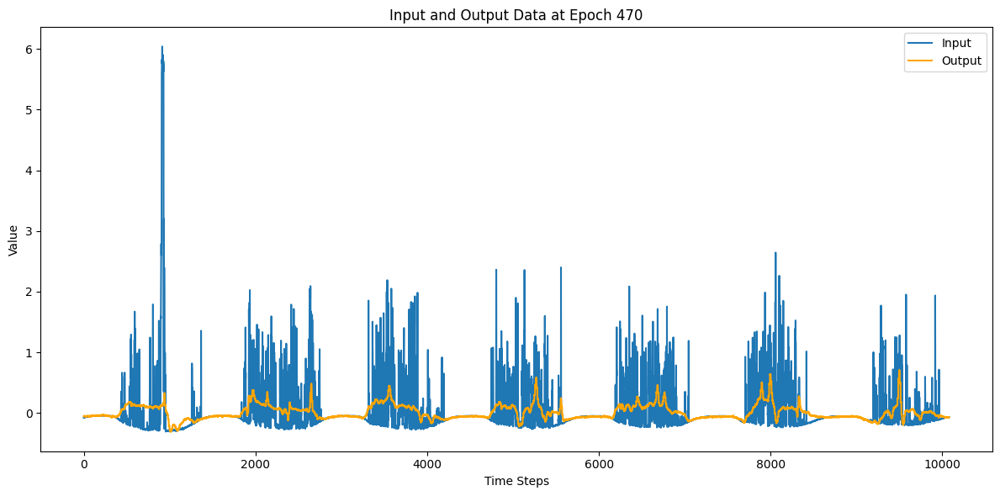

151/151 [==============================] - 13s 85ms/step - loss: 0.7128 - val_loss: 0.8949 - lr: 1.0000e-04
Epoch 471/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7120 - val_loss: 0.8970 - lr: 1.0000e-04
Epoch 472/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7120 - val_loss: 0.8959 - lr: 1.0000e-04
Epoch 473/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7122 - val_loss: 0.8948 - lr: 1.0000e-04
Epoch 474/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7123 - val_loss: 0.8942 - lr: 1.0000e-04
Epoch 475/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7118 - val_loss: 0.8956 - lr: 1.0000e-04
Epoch 476/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7124 - val_loss: 0.8955 - lr: 1.0000e-04
Epoch 477/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7120 - val_loss: 0.8950 - lr: 1.0000e-04
Epoch 478/10000
151/151 

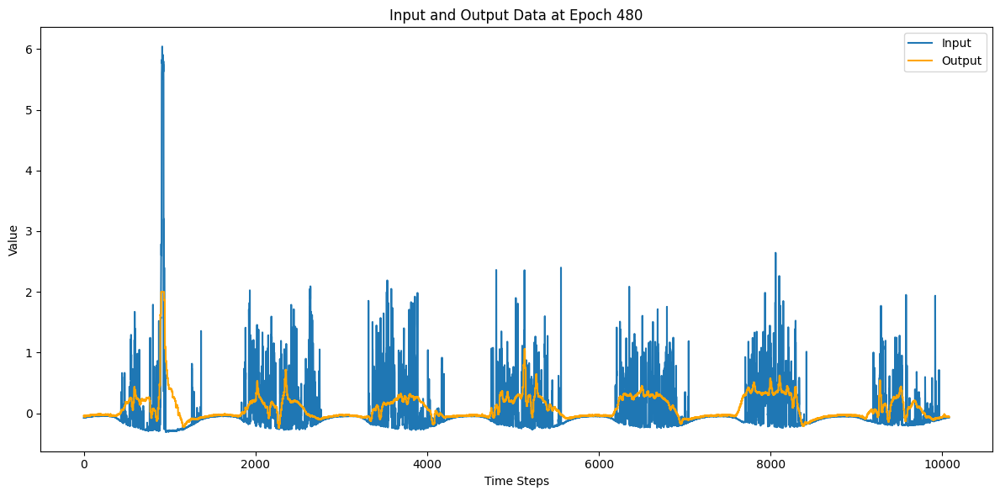

151/151 [==============================] - 13s 85ms/step - loss: 0.7118 - val_loss: 0.8946 - lr: 1.0000e-04
Epoch 481/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7155 - val_loss: 0.8945 - lr: 1.0000e-04
Epoch 482/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7116 - val_loss: 0.8953 - lr: 1.0000e-04
Epoch 483/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7118 - val_loss: 0.8945 - lr: 1.0000e-04
Epoch 484/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7166 - val_loss: 0.8961 - lr: 1.0000e-04
Epoch 485/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7116 - val_loss: 0.8955 - lr: 1.0000e-04
Epoch 486/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7117 - val_loss: 0.8954 - lr: 1.0000e-04
Epoch 487/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7123 - val_loss: 0.8952 - lr: 1.0000e-04
Epoch 488/10000
151/151 

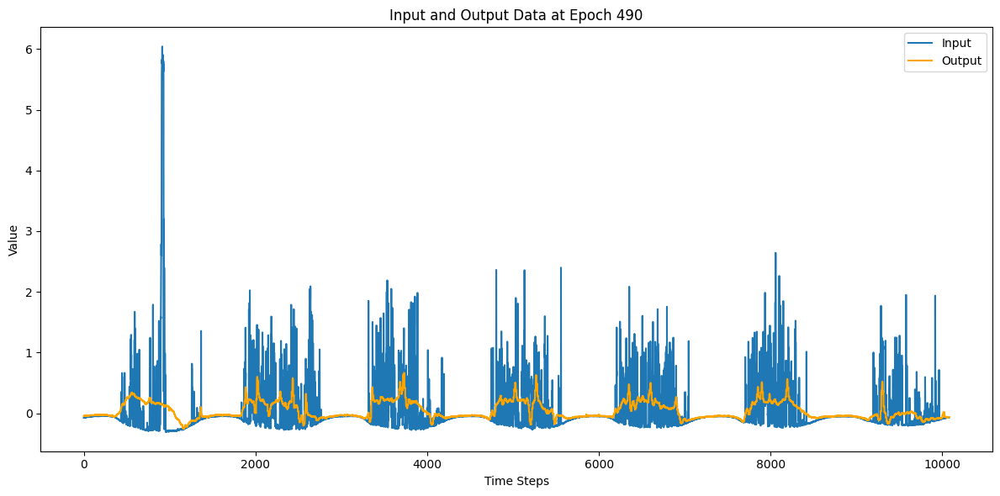

151/151 [==============================] - 13s 86ms/step - loss: 0.7119 - val_loss: 0.8941 - lr: 1.0000e-04
Epoch 491/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7117 - val_loss: 0.8948 - lr: 1.0000e-04
Epoch 492/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7116 - val_loss: 0.8951 - lr: 1.0000e-04
Epoch 493/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7115 - val_loss: 0.8938 - lr: 1.0000e-04
Epoch 494/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7150 - val_loss: 0.8947 - lr: 1.0000e-04
Epoch 495/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7127 - val_loss: 0.8958 - lr: 1.0000e-04
Epoch 496/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7118 - val_loss: 0.8955 - lr: 1.0000e-04
Epoch 497/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7117 - val_loss: 0.8947 - lr: 1.0000e-04
Epoch 498/10000
151/151 

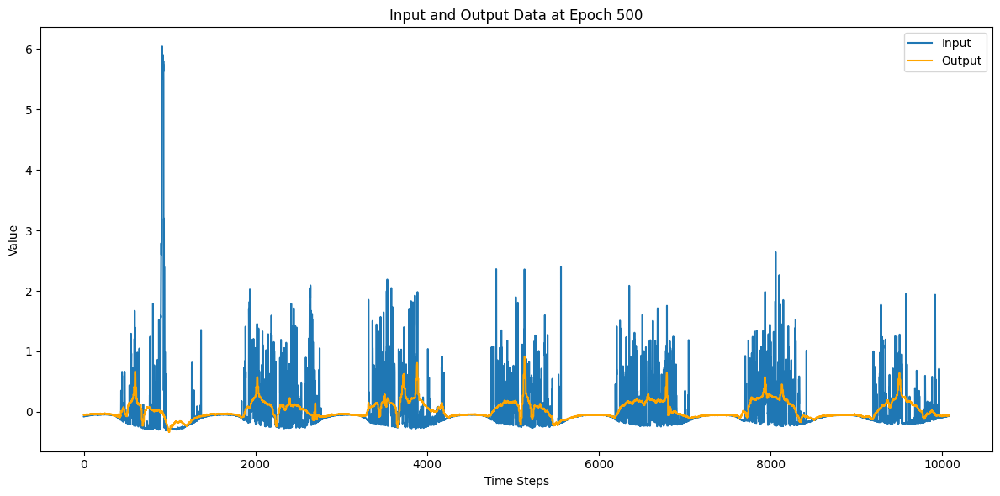

151/151 [==============================] - 13s 86ms/step - loss: 0.7119 - val_loss: 0.8942 - lr: 1.0000e-04
Epoch 501/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7144 - val_loss: 0.8943 - lr: 1.0000e-04
Epoch 502/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7115 - val_loss: 0.8952 - lr: 1.0000e-04
Epoch 503/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7128 - val_loss: 0.8953 - lr: 1.0000e-04
Epoch 504/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7116 - val_loss: 0.8964 - lr: 1.0000e-04
Epoch 505/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7129 - val_loss: 0.8954 - lr: 1.0000e-04
Epoch 506/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7115 - val_loss: 0.8947 - lr: 1.0000e-04
Epoch 507/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7113 - val_loss: 0.8956 - lr: 1.0000e-04
Epoch 508/10000
151/151 

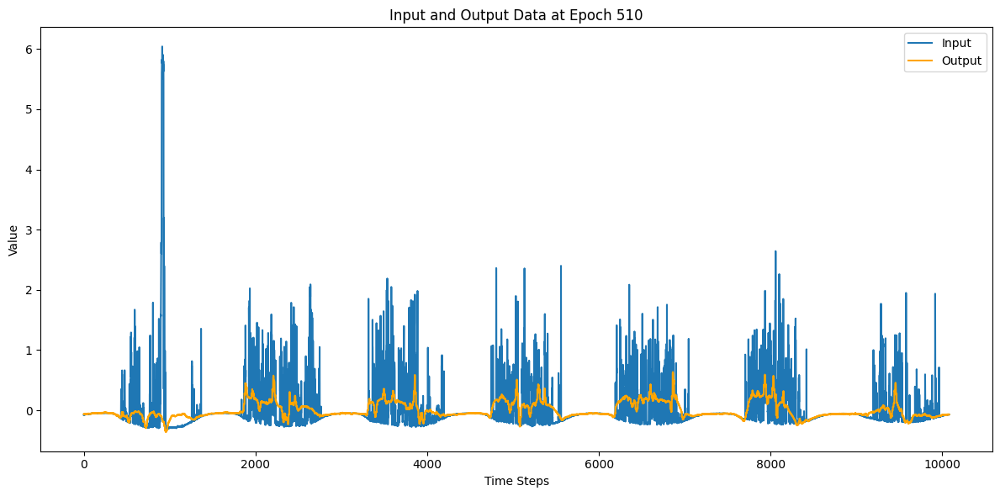

151/151 [==============================] - 13s 84ms/step - loss: 0.7150 - val_loss: 0.8943 - lr: 1.0000e-04
Epoch 511/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7113 - val_loss: 0.8952 - lr: 1.0000e-04
Epoch 512/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7110 - val_loss: 0.8936 - lr: 1.0000e-04
Epoch 513/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7113 - val_loss: 0.8948 - lr: 1.0000e-04
Epoch 514/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7126 - val_loss: 0.8933 - lr: 1.0000e-04
Epoch 515/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7113 - val_loss: 0.8947 - lr: 1.0000e-04
Epoch 516/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7112 - val_loss: 0.8944 - lr: 1.0000e-04
Epoch 517/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7111 - val_loss: 0.8949 - lr: 1.0000e-04
Epoch 518/10000
151/151 

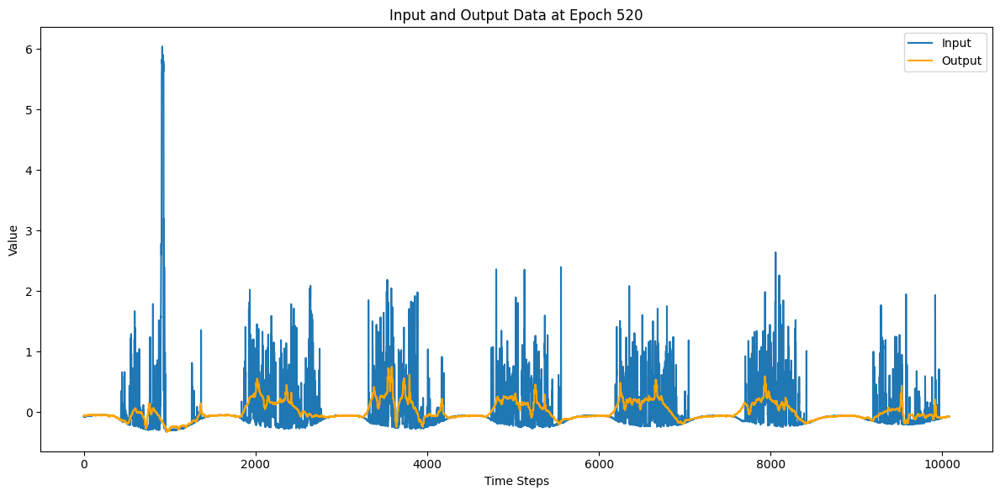

151/151 [==============================] - 13s 85ms/step - loss: 0.7109 - val_loss: 0.8946 - lr: 1.0000e-04
Epoch 521/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7113 - val_loss: 0.8947 - lr: 1.0000e-04
Epoch 522/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7109 - val_loss: 0.8951 - lr: 1.0000e-04
Epoch 523/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7108 - val_loss: 0.8949 - lr: 1.0000e-04
Epoch 524/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.7112 - val_loss: 0.8955 - lr: 1.0000e-04
Epoch 525/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7115 - val_loss: 0.8941 - lr: 1.0000e-04
Epoch 526/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7113 - val_loss: 0.8934 - lr: 1.0000e-04
Epoch 527/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7109 - val_loss: 0.8935 - lr: 1.0000e-04
Epoch 528/10000
151/151 

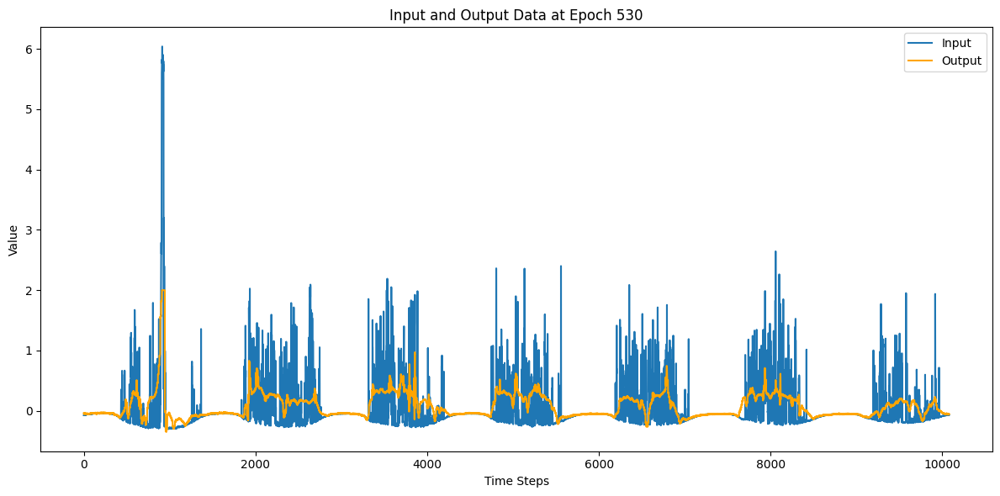

151/151 [==============================] - 13s 85ms/step - loss: 0.7104 - val_loss: 0.8930 - lr: 1.0000e-04
Epoch 531/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7113 - val_loss: 0.8944 - lr: 1.0000e-04
Epoch 532/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7109 - val_loss: 0.8943 - lr: 1.0000e-04
Epoch 533/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7102 - val_loss: 0.8953 - lr: 1.0000e-04
Epoch 534/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7104 - val_loss: 0.8930 - lr: 1.0000e-04
Epoch 535/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7113 - val_loss: 0.8934 - lr: 1.0000e-04
Epoch 536/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7127 - val_loss: 0.8936 - lr: 1.0000e-04
Epoch 537/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7131 - val_loss: 0.8930 - lr: 1.0000e-04
Epoch 538/10000
151/151 

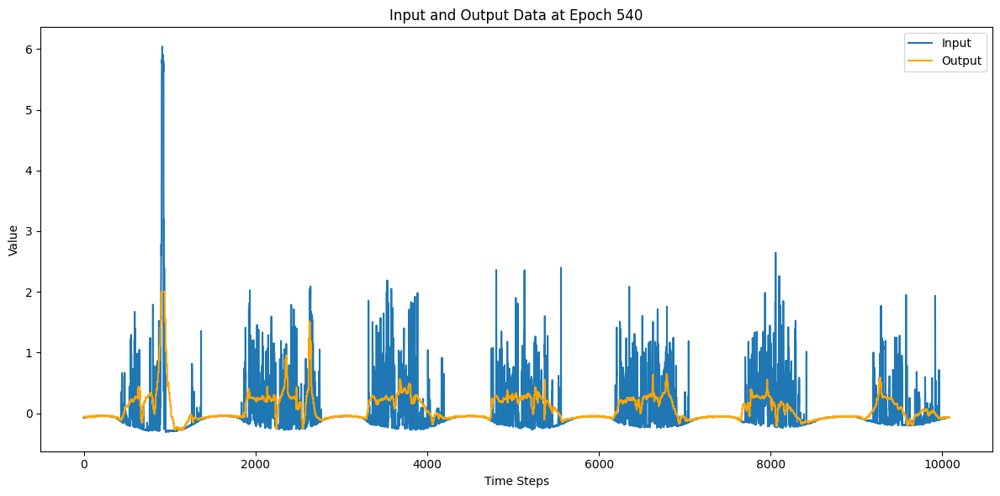

151/151 [==============================] - 13s 85ms/step - loss: 0.7164 - val_loss: 0.8934 - lr: 1.0000e-04
Epoch 541/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7103 - val_loss: 0.8935 - lr: 1.0000e-04
Epoch 542/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7189 - val_loss: 0.8931 - lr: 1.0000e-04
Epoch 543/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7104 - val_loss: 0.8951 - lr: 1.0000e-04
Epoch 544/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7103 - val_loss: 0.8933 - lr: 1.0000e-04
Epoch 545/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7105 - val_loss: 0.8941 - lr: 1.0000e-04
Epoch 546/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7166 - val_loss: 0.8930 - lr: 1.0000e-04
Epoch 547/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7101 - val_loss: 0.8937 - lr: 1.0000e-04
Epoch 548/10000
151/151 

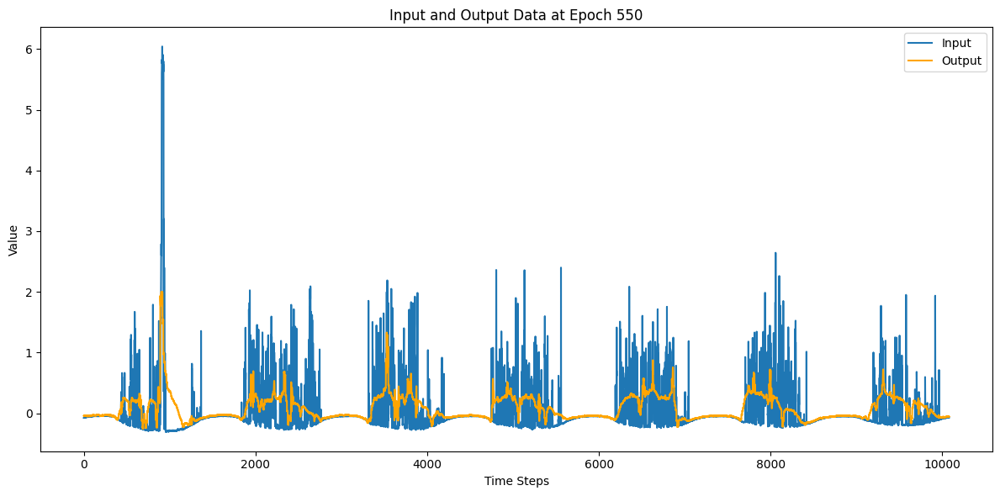

151/151 [==============================] - 13s 85ms/step - loss: 0.7136 - val_loss: 0.8938 - lr: 1.0000e-04
Epoch 551/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7099 - val_loss: 0.8934 - lr: 1.0000e-04
Epoch 552/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7119 - val_loss: 0.8931 - lr: 1.0000e-04
Epoch 553/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7100 - val_loss: 0.8936 - lr: 1.0000e-04
Epoch 554/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7098 - val_loss: 0.8933 - lr: 1.0000e-04
Epoch 555/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7100 - val_loss: 0.8926 - lr: 1.0000e-04
Epoch 556/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7098 - val_loss: 0.8935 - lr: 1.0000e-04
Epoch 557/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7100 - val_loss: 0.8940 - lr: 1.0000e-04
Epoch 558/10000
151/151 

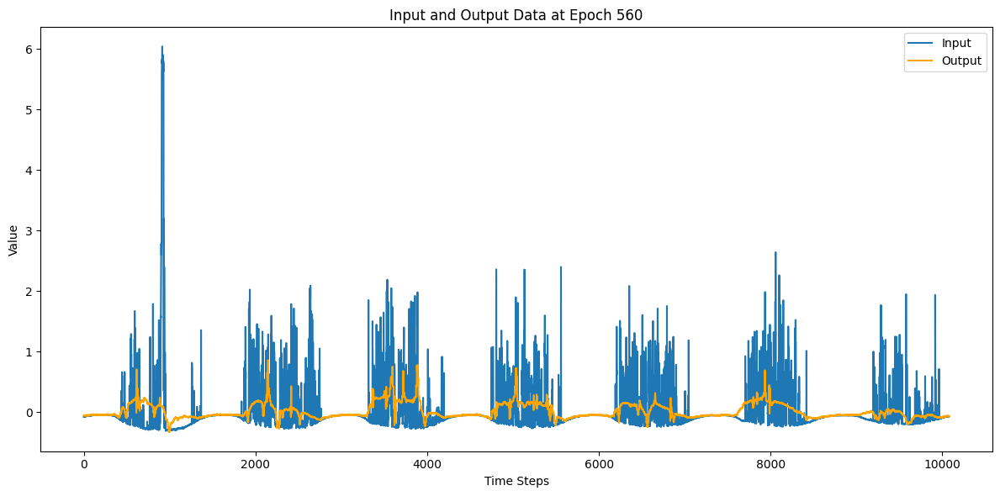

151/151 [==============================] - 13s 86ms/step - loss: 0.7098 - val_loss: 0.8925 - lr: 1.0000e-04
Epoch 561/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7105 - val_loss: 0.8917 - lr: 1.0000e-04
Epoch 562/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7097 - val_loss: 0.8924 - lr: 1.0000e-04
Epoch 563/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7099 - val_loss: 0.8925 - lr: 1.0000e-04
Epoch 564/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7096 - val_loss: 0.8923 - lr: 1.0000e-04
Epoch 565/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7097 - val_loss: 0.8934 - lr: 1.0000e-04
Epoch 566/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7095 - val_loss: 0.8932 - lr: 1.0000e-04
Epoch 567/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7168 - val_loss: 0.8933 - lr: 1.0000e-04
Epoch 568/10000
151/151 

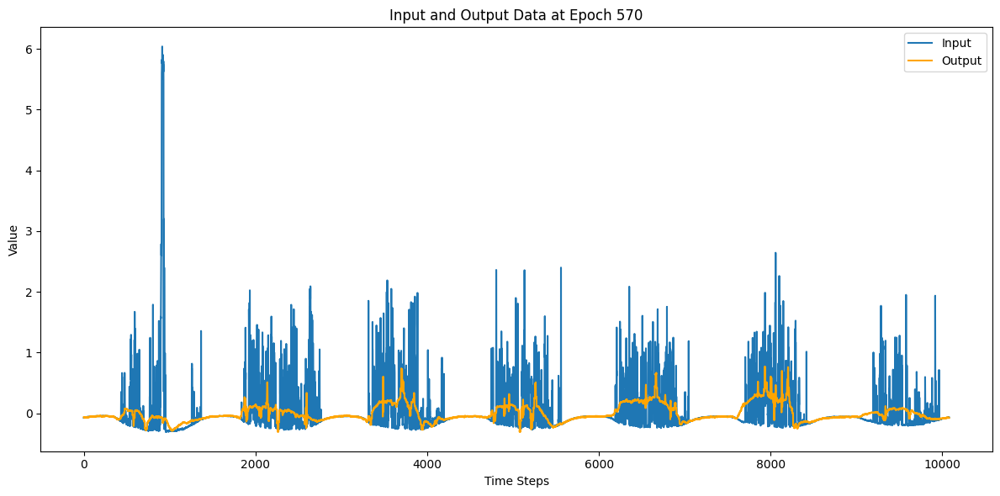

151/151 [==============================] - 13s 85ms/step - loss: 0.7094 - val_loss: 0.8921 - lr: 1.0000e-04
Epoch 571/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7093 - val_loss: 0.8926 - lr: 1.0000e-04
Epoch 572/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7095 - val_loss: 0.8921 - lr: 1.0000e-04
Epoch 573/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7093 - val_loss: 0.8936 - lr: 1.0000e-04
Epoch 574/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7099 - val_loss: 0.8919 - lr: 1.0000e-04
Epoch 575/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7095 - val_loss: 0.8931 - lr: 1.0000e-04
Epoch 576/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7130 - val_loss: 0.8924 - lr: 1.0000e-04
Epoch 577/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7097 - val_loss: 0.8922 - lr: 1.0000e-04
Epoch 578/10000
151/151 

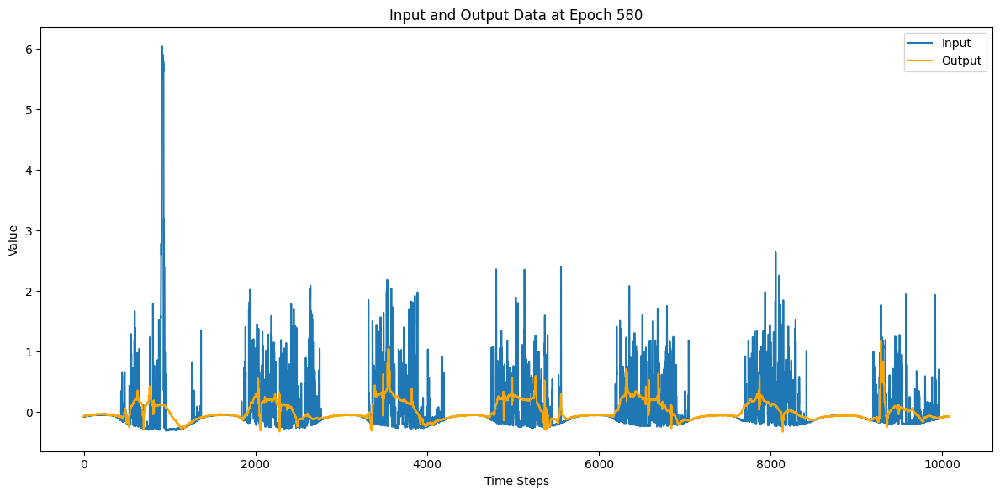

151/151 [==============================] - 13s 85ms/step - loss: 0.7093 - val_loss: 0.8919 - lr: 1.0000e-04
Epoch 581/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7130 - val_loss: 0.8924 - lr: 1.0000e-04
Epoch 582/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7108 - val_loss: 0.8938 - lr: 1.0000e-04
Epoch 583/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7122 - val_loss: 0.8920 - lr: 1.0000e-04
Epoch 584/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7090 - val_loss: 0.8921 - lr: 1.0000e-04
Epoch 585/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7095 - val_loss: 0.8924 - lr: 1.0000e-04
Epoch 586/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7094 - val_loss: 0.8913 - lr: 1.0000e-04
Epoch 587/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7091 - val_loss: 0.8913 - lr: 1.0000e-04
Epoch 588/10000
151/151 

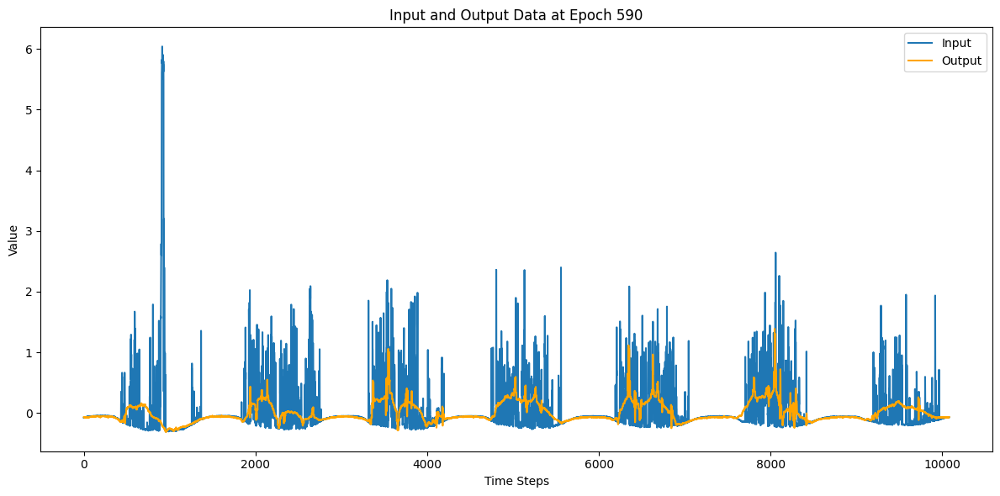

151/151 [==============================] - 13s 84ms/step - loss: 0.7093 - val_loss: 0.8932 - lr: 1.0000e-04
Epoch 591/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7096 - val_loss: 0.8922 - lr: 1.0000e-04
Epoch 592/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7090 - val_loss: 0.8918 - lr: 1.0000e-04
Epoch 593/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7091 - val_loss: 0.8925 - lr: 1.0000e-04
Epoch 594/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7089 - val_loss: 0.8925 - lr: 1.0000e-04
Epoch 595/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7093 - val_loss: 0.8926 - lr: 1.0000e-04
Epoch 596/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7089 - val_loss: 0.8916 - lr: 1.0000e-04
Epoch 597/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7091 - val_loss: 0.8918 - lr: 1.0000e-04
Epoch 598/10000
151/151 

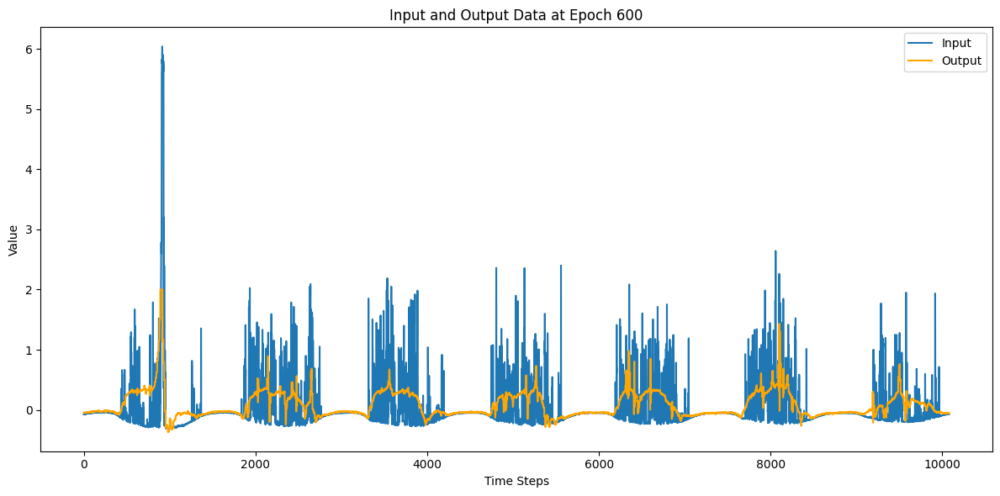

151/151 [==============================] - 13s 86ms/step - loss: 0.7115 - val_loss: 0.8916 - lr: 1.0000e-04
Epoch 601/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7090 - val_loss: 0.8923 - lr: 1.0000e-04
Epoch 602/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7133 - val_loss: 0.8919 - lr: 1.0000e-04
Epoch 603/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7091 - val_loss: 0.8919 - lr: 1.0000e-04
Epoch 604/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7093 - val_loss: 0.8923 - lr: 1.0000e-04
Epoch 605/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7091 - val_loss: 0.8920 - lr: 1.0000e-04
Epoch 606/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7088 - val_loss: 0.8921 - lr: 1.0000e-04
Epoch 607/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7091 - val_loss: 0.8924 - lr: 1.0000e-04
Epoch 608/10000
151/151 

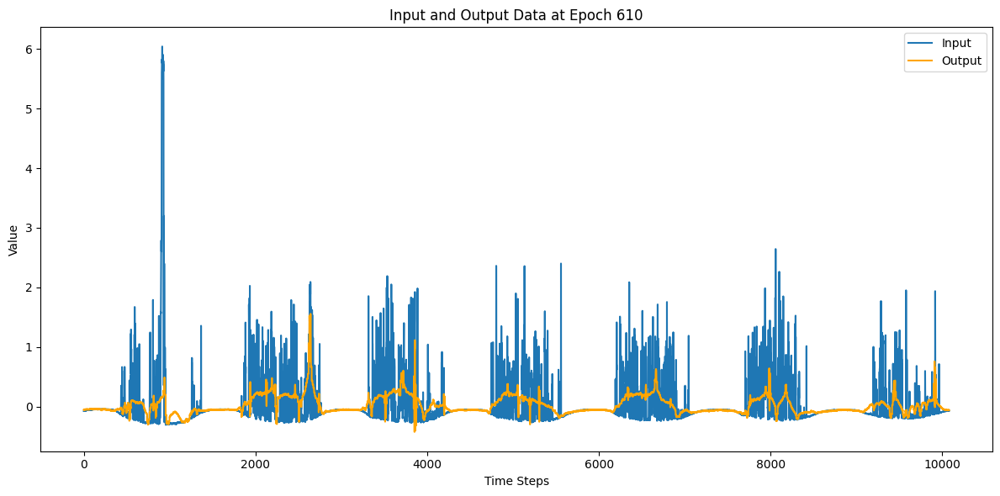

151/151 [==============================] - 13s 85ms/step - loss: 0.7205 - val_loss: 0.8920 - lr: 1.0000e-04
Epoch 611/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7109 - val_loss: 0.8930 - lr: 1.0000e-04
Epoch 612/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7087 - val_loss: 0.8915 - lr: 1.0000e-04
Epoch 613/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7123 - val_loss: 0.8923 - lr: 1.0000e-04
Epoch 614/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7088 - val_loss: 0.8928 - lr: 1.0000e-04
Epoch 615/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7128 - val_loss: 0.8917 - lr: 1.0000e-04
Epoch 616/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7089 - val_loss: 0.8919 - lr: 1.0000e-04
Epoch 617/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7089 - val_loss: 0.8922 - lr: 1.0000e-04
Epoch 618/10000
151/151 

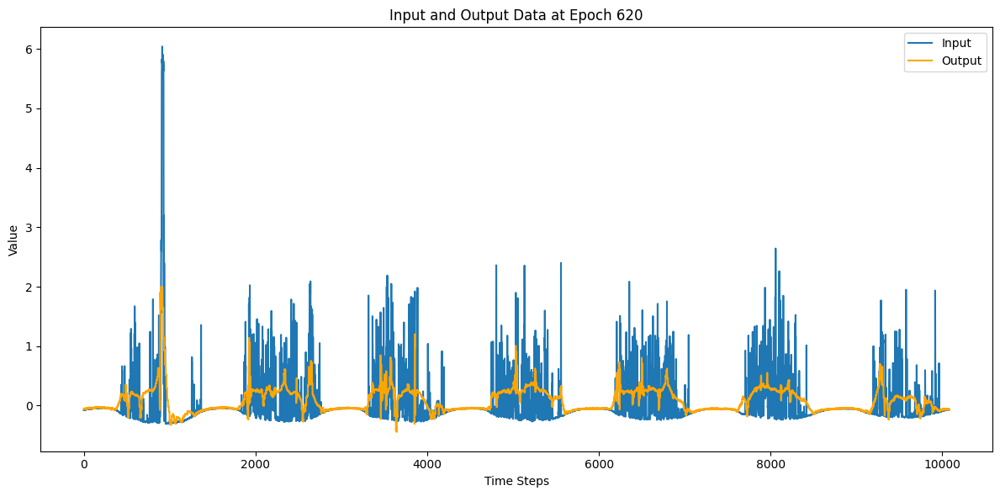

151/151 [==============================] - 13s 85ms/step - loss: 0.7091 - val_loss: 0.8923 - lr: 1.0000e-04
Epoch 621/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7088 - val_loss: 0.8915 - lr: 1.0000e-04
Epoch 622/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7090 - val_loss: 0.8924 - lr: 1.0000e-04
Epoch 623/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7204 - val_loss: 0.8935 - lr: 1.0000e-04
Epoch 624/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7109 - val_loss: 0.8910 - lr: 1.0000e-04
Epoch 625/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7090 - val_loss: 0.8927 - lr: 1.0000e-04
Epoch 626/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7099 - val_loss: 0.8921 - lr: 1.0000e-04
Epoch 627/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7084 - val_loss: 0.8916 - lr: 1.0000e-04
Epoch 628/10000
151/151 

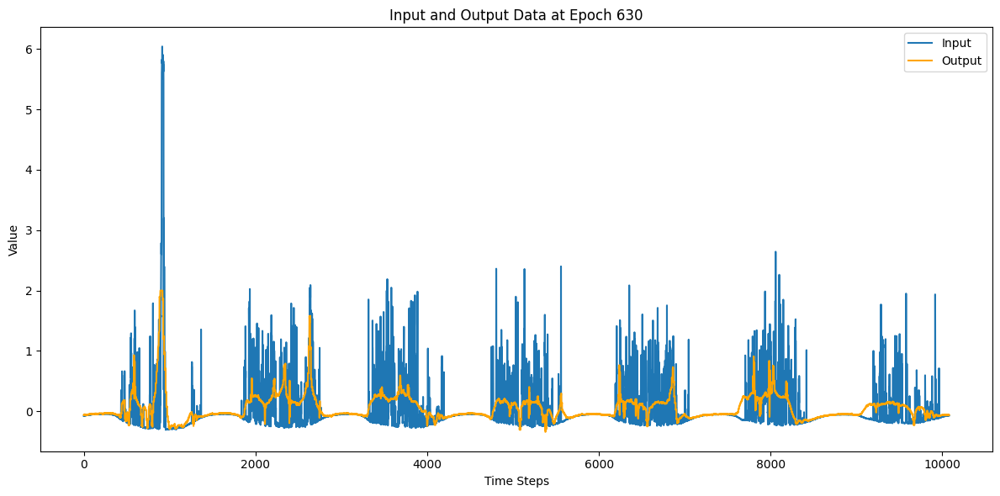

151/151 [==============================] - 13s 86ms/step - loss: 0.7087 - val_loss: 0.8928 - lr: 1.0000e-04
Epoch 631/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7088 - val_loss: 0.8923 - lr: 1.0000e-04
Epoch 632/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7084 - val_loss: 0.8921 - lr: 1.0000e-04
Epoch 633/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7201 - val_loss: 0.8921 - lr: 1.0000e-04
Epoch 634/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7085 - val_loss: 0.8916 - lr: 1.0000e-04
Epoch 635/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7084 - val_loss: 0.8921 - lr: 1.0000e-04
Epoch 636/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7087 - val_loss: 0.8913 - lr: 1.0000e-04
Epoch 637/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7088 - val_loss: 0.8922 - lr: 1.0000e-04
Epoch 638/10000
151/151 

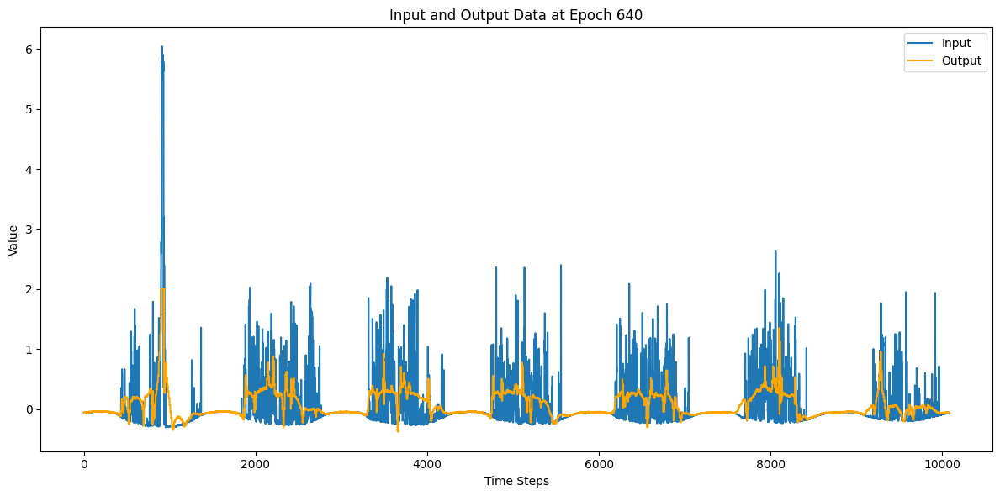

151/151 [==============================] - 13s 85ms/step - loss: 0.7100 - val_loss: 0.8916 - lr: 1.0000e-04
Epoch 641/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7084 - val_loss: 0.8925 - lr: 1.0000e-04
Epoch 642/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7082 - val_loss: 0.8924 - lr: 1.0000e-04
Epoch 643/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7082 - val_loss: 0.8919 - lr: 1.0000e-04
Epoch 644/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7081 - val_loss: 0.8919 - lr: 1.0000e-04
Epoch 645/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7087 - val_loss: 0.8914 - lr: 1.0000e-04
Epoch 646/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7170 - val_loss: 0.8929 - lr: 1.0000e-04
Epoch 647/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7087 - val_loss: 0.8928 - lr: 1.0000e-04
Epoch 648/10000
151/151 

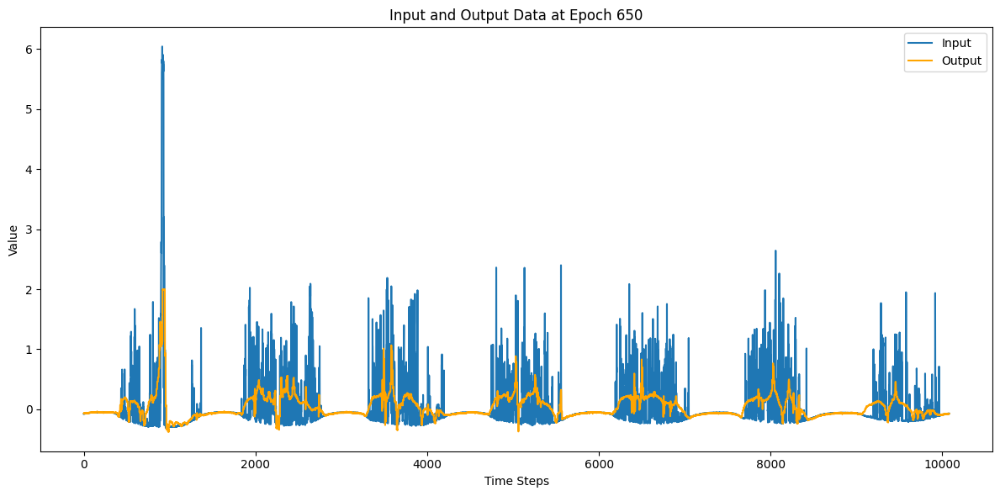

151/151 [==============================] - 13s 89ms/step - loss: 0.7166 - val_loss: 0.8932 - lr: 1.0000e-04
Epoch 651/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7086 - val_loss: 0.8926 - lr: 1.0000e-04
Epoch 652/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7111 - val_loss: 0.8921 - lr: 1.0000e-04
Epoch 653/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7086 - val_loss: 0.8914 - lr: 1.0000e-04
Epoch 654/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7081 - val_loss: 0.8915 - lr: 1.0000e-04
Epoch 655/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7081 - val_loss: 0.8912 - lr: 1.0000e-04
Epoch 656/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7087 - val_loss: 0.8927 - lr: 1.0000e-04
Epoch 657/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7085 - val_loss: 0.8918 - lr: 1.0000e-04
Epoch 658/10000
151/151 

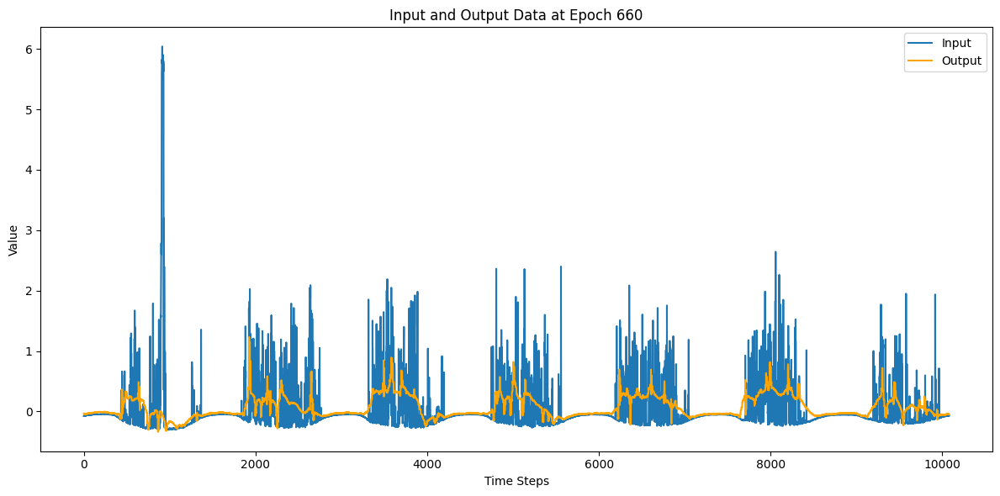

151/151 [==============================] - 13s 85ms/step - loss: 0.7086 - val_loss: 0.8926 - lr: 1.0000e-04
Epoch 661/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7085 - val_loss: 0.8913 - lr: 1.0000e-04
Epoch 662/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7084 - val_loss: 0.8917 - lr: 1.0000e-04
Epoch 663/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7082 - val_loss: 0.8908 - lr: 1.0000e-04
Epoch 664/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7083 - val_loss: 0.8912 - lr: 1.0000e-04
Epoch 665/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7083 - val_loss: 0.8934 - lr: 1.0000e-04
Epoch 666/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7083 - val_loss: 0.8911 - lr: 1.0000e-04
Epoch 667/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7079 - val_loss: 0.8922 - lr: 1.0000e-04
Epoch 668/10000
151/151 

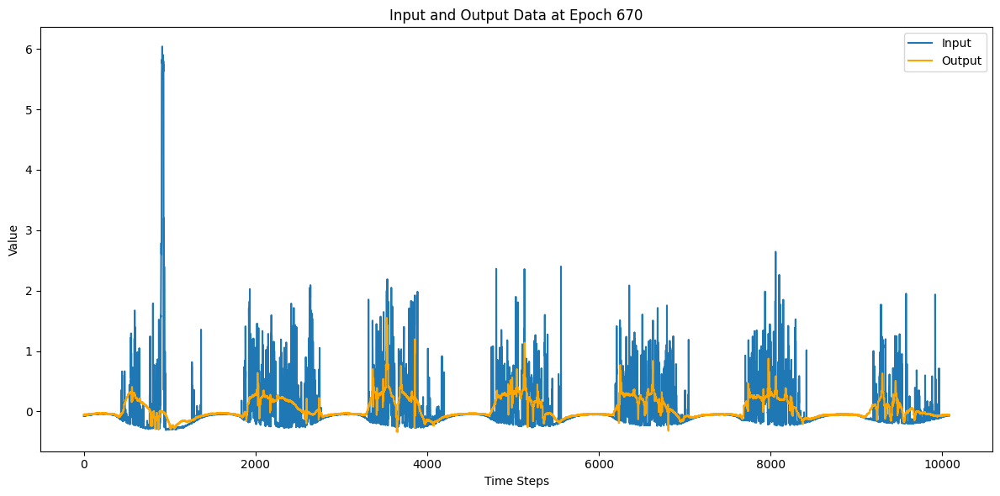

151/151 [==============================] - 13s 85ms/step - loss: 0.7080 - val_loss: 0.8914 - lr: 1.0000e-04
Epoch 671/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7083 - val_loss: 0.8914 - lr: 1.0000e-04
Epoch 672/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7090 - val_loss: 0.8910 - lr: 1.0000e-04
Epoch 673/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7081 - val_loss: 0.8919 - lr: 1.0000e-04
Epoch 674/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7082 - val_loss: 0.8917 - lr: 1.0000e-04
Epoch 675/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7081 - val_loss: 0.8912 - lr: 1.0000e-04
Epoch 676/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7229 - val_loss: 0.8924 - lr: 1.0000e-04
Epoch 677/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7083 - val_loss: 0.8908 - lr: 1.0000e-04
Epoch 678/10000
151/151 

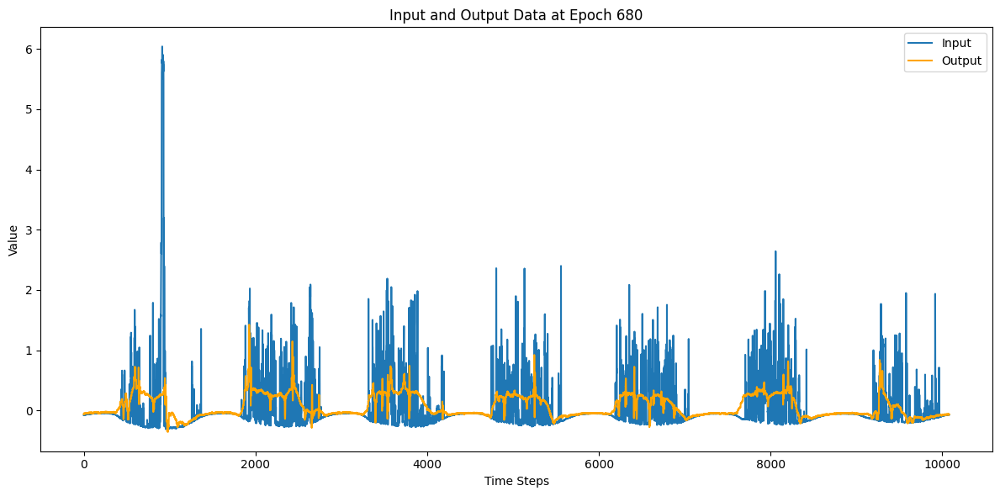

151/151 [==============================] - 13s 85ms/step - loss: 0.7131 - val_loss: 0.8907 - lr: 1.0000e-04
Epoch 681/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7081 - val_loss: 0.8918 - lr: 1.0000e-04
Epoch 682/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7084 - val_loss: 0.8907 - lr: 1.0000e-04
Epoch 683/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7081 - val_loss: 0.8918 - lr: 1.0000e-04
Epoch 684/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7114 - val_loss: 0.8922 - lr: 1.0000e-04
Epoch 685/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7123 - val_loss: 0.8913 - lr: 1.0000e-04
Epoch 686/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7080 - val_loss: 0.8917 - lr: 1.0000e-04
Epoch 687/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7088 - val_loss: 0.8917 - lr: 1.0000e-04
Epoch 688/10000
151/151 

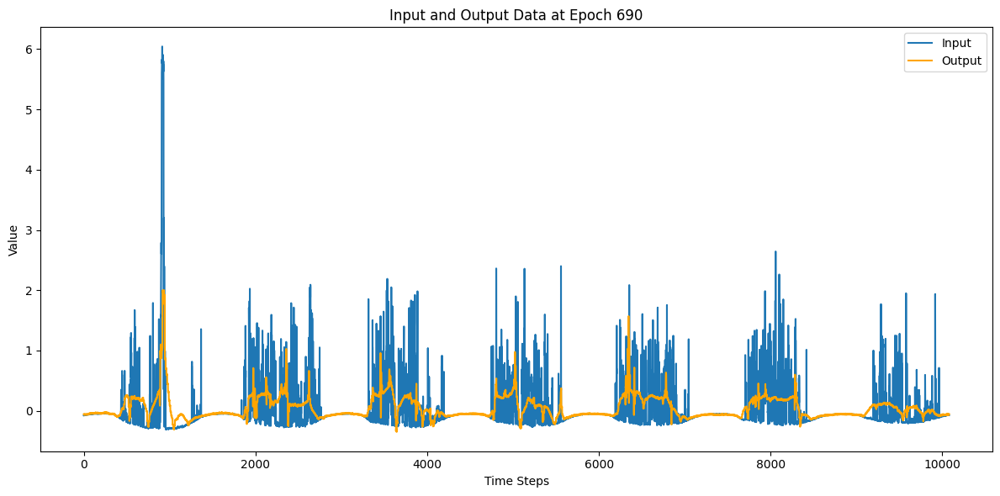

151/151 [==============================] - 13s 85ms/step - loss: 0.7113 - val_loss: 0.8919 - lr: 1.0000e-04
Epoch 691/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7082 - val_loss: 0.8910 - lr: 1.0000e-04
Epoch 692/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7079 - val_loss: 0.8923 - lr: 1.0000e-04
Epoch 693/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7079 - val_loss: 0.8915 - lr: 1.0000e-04
Epoch 694/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7076 - val_loss: 0.8914 - lr: 1.0000e-04
Epoch 695/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7078 - val_loss: 0.8915 - lr: 1.0000e-04
Epoch 696/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7103 - val_loss: 0.8923 - lr: 1.0000e-04
Epoch 697/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7082 - val_loss: 0.8910 - lr: 1.0000e-04
Epoch 698/10000
151/151 

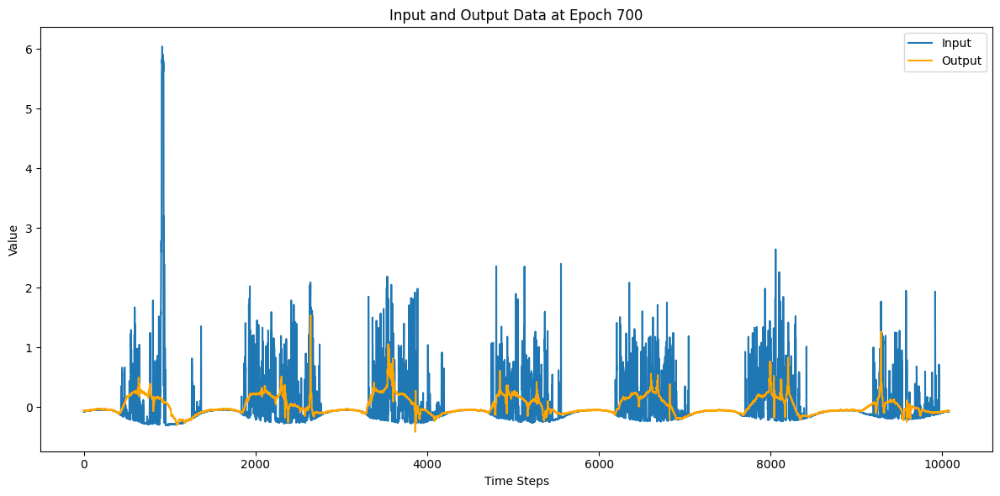

151/151 [==============================] - 13s 86ms/step - loss: 0.7092 - val_loss: 0.8903 - lr: 1.0000e-04
Epoch 701/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7075 - val_loss: 0.8909 - lr: 1.0000e-04
Epoch 702/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7116 - val_loss: 0.8909 - lr: 1.0000e-04
Epoch 703/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7078 - val_loss: 0.8909 - lr: 1.0000e-04
Epoch 704/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7183 - val_loss: 0.8912 - lr: 1.0000e-04
Epoch 705/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7077 - val_loss: 0.8917 - lr: 1.0000e-04
Epoch 706/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7078 - val_loss: 0.8913 - lr: 1.0000e-04
Epoch 707/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7076 - val_loss: 0.8914 - lr: 1.0000e-04
Epoch 708/10000
151/151 

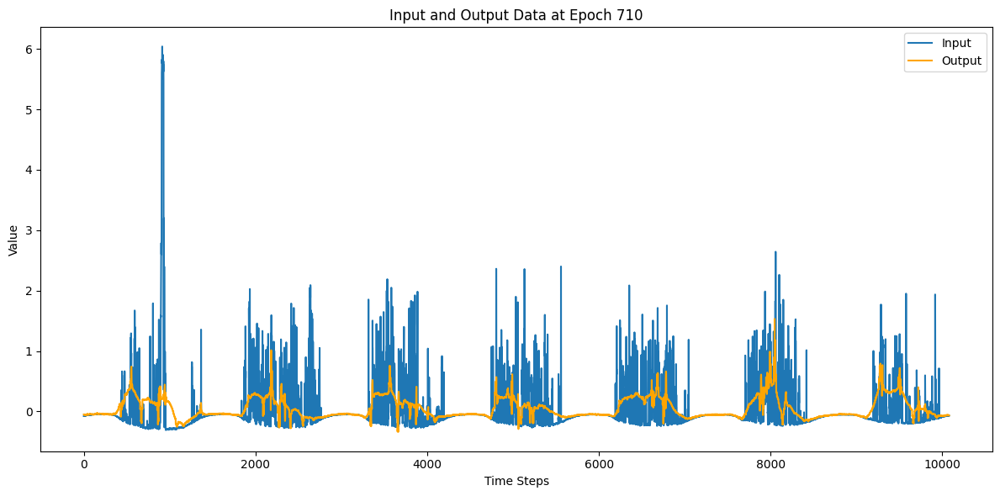

151/151 [==============================] - 13s 84ms/step - loss: 0.7075 - val_loss: 0.8912 - lr: 1.0000e-04
Epoch 711/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7093 - val_loss: 0.8909 - lr: 1.0000e-04
Epoch 712/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7082 - val_loss: 0.8910 - lr: 1.0000e-04
Epoch 713/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7077 - val_loss: 0.8910 - lr: 1.0000e-04
Epoch 714/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7077 - val_loss: 0.8900 - lr: 1.0000e-04
Epoch 715/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7083 - val_loss: 0.8909 - lr: 1.0000e-04
Epoch 716/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7085 - val_loss: 0.8904 - lr: 1.0000e-04
Epoch 717/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7078 - val_loss: 0.8919 - lr: 1.0000e-04
Epoch 718/10000
151/151 

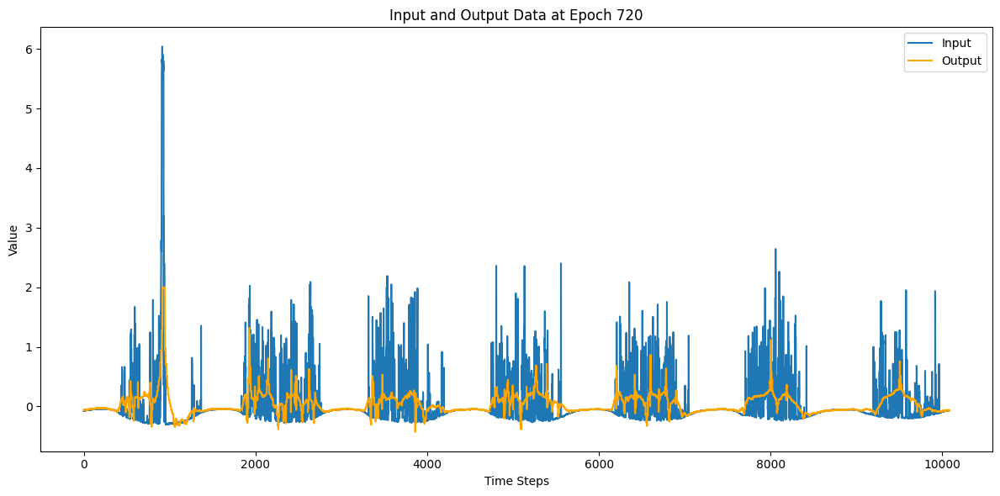

151/151 [==============================] - 13s 86ms/step - loss: 0.7078 - val_loss: 0.8915 - lr: 1.0000e-04
Epoch 721/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7075 - val_loss: 0.8913 - lr: 1.0000e-04
Epoch 722/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7073 - val_loss: 0.8910 - lr: 1.0000e-04
Epoch 723/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7093 - val_loss: 0.8911 - lr: 1.0000e-04
Epoch 724/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7092 - val_loss: 0.8905 - lr: 1.0000e-04
Epoch 725/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7093 - val_loss: 0.8913 - lr: 1.0000e-04
Epoch 726/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7076 - val_loss: 0.8901 - lr: 1.0000e-04
Epoch 727/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7074 - val_loss: 0.8916 - lr: 1.0000e-04
Epoch 728/10000
151/151 

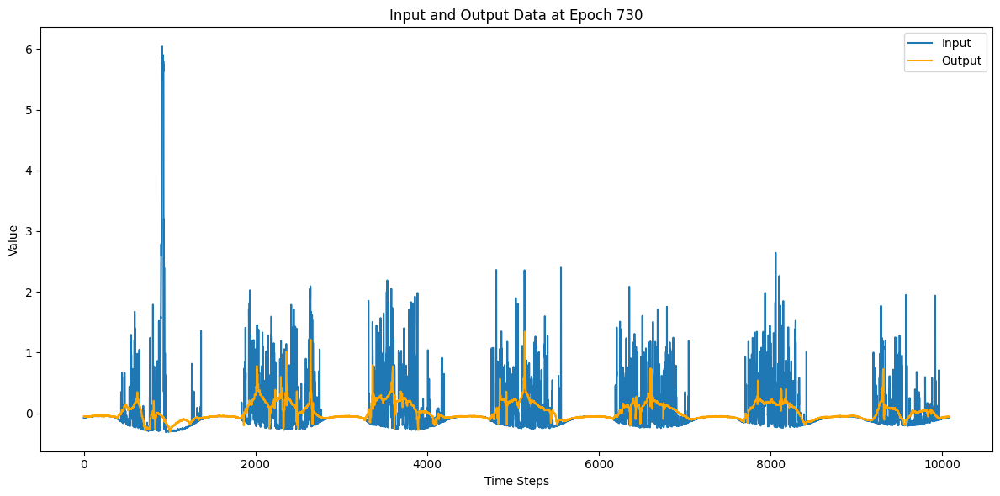

151/151 [==============================] - 13s 86ms/step - loss: 0.7075 - val_loss: 0.8903 - lr: 1.0000e-04
Epoch 731/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7095 - val_loss: 0.8909 - lr: 1.0000e-04
Epoch 732/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7079 - val_loss: 0.8902 - lr: 1.0000e-04
Epoch 733/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7070 - val_loss: 0.8901 - lr: 1.0000e-04
Epoch 734/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7223 - val_loss: 0.8900 - lr: 1.0000e-04
Epoch 735/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7190 - val_loss: 0.8910 - lr: 1.0000e-04
Epoch 736/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7072 - val_loss: 0.8915 - lr: 1.0000e-04
Epoch 737/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7093 - val_loss: 0.8906 - lr: 1.0000e-04
Epoch 738/10000
151/151 

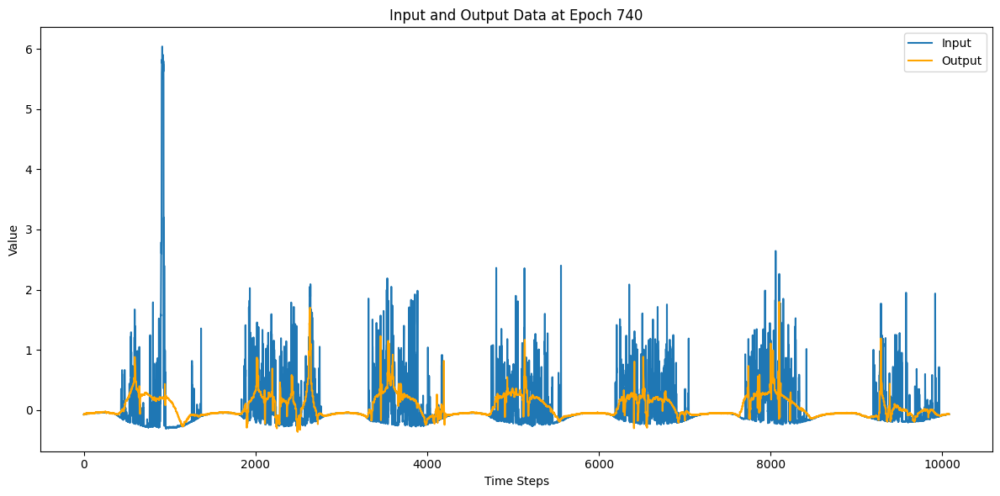

151/151 [==============================] - 13s 85ms/step - loss: 0.7071 - val_loss: 0.8908 - lr: 1.0000e-04
Epoch 741/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7076 - val_loss: 0.8904 - lr: 1.0000e-04
Epoch 742/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.7067 - val_loss: 0.8894 - lr: 1.0000e-04
Epoch 743/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7086 - val_loss: 0.8897 - lr: 1.0000e-04
Epoch 744/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7067 - val_loss: 0.8892 - lr: 1.0000e-04
Epoch 745/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7065 - val_loss: 0.8894 - lr: 1.0000e-04
Epoch 746/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7063 - val_loss: 0.8890 - lr: 1.0000e-04
Epoch 747/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7065 - val_loss: 0.8910 - lr: 1.0000e-04
Epoch 748/10000
151/151 

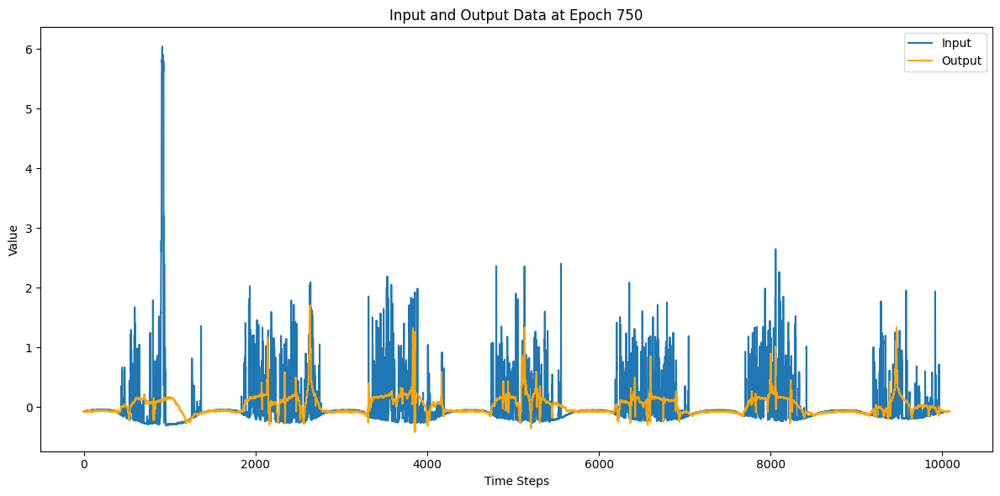

151/151 [==============================] - 13s 85ms/step - loss: 0.7063 - val_loss: 0.8891 - lr: 1.0000e-04
Epoch 751/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7062 - val_loss: 0.8888 - lr: 1.0000e-04
Epoch 752/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7059 - val_loss: 0.8905 - lr: 1.0000e-04
Epoch 753/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7064 - val_loss: 0.8894 - lr: 1.0000e-04
Epoch 754/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7060 - val_loss: 0.8897 - lr: 1.0000e-04
Epoch 755/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7057 - val_loss: 0.8889 - lr: 1.0000e-04
Epoch 756/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7056 - val_loss: 0.8900 - lr: 1.0000e-04
Epoch 757/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7060 - val_loss: 0.8894 - lr: 1.0000e-04
Epoch 758/10000
151/151 

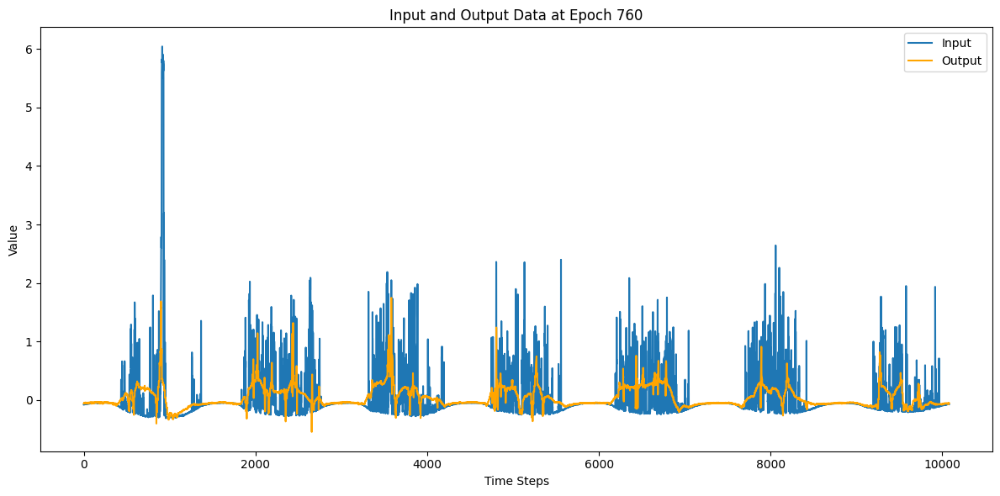

151/151 [==============================] - 13s 85ms/step - loss: 0.7058 - val_loss: 0.8892 - lr: 1.0000e-04
Epoch 761/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7057 - val_loss: 0.8897 - lr: 1.0000e-04
Epoch 762/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7094 - val_loss: 0.8885 - lr: 1.0000e-04
Epoch 763/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7054 - val_loss: 0.8884 - lr: 1.0000e-04
Epoch 764/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7054 - val_loss: 0.8889 - lr: 1.0000e-04
Epoch 765/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7058 - val_loss: 0.8881 - lr: 1.0000e-04
Epoch 766/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7079 - val_loss: 0.8883 - lr: 1.0000e-04
Epoch 767/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7053 - val_loss: 0.8879 - lr: 1.0000e-04
Epoch 768/10000
151/151 

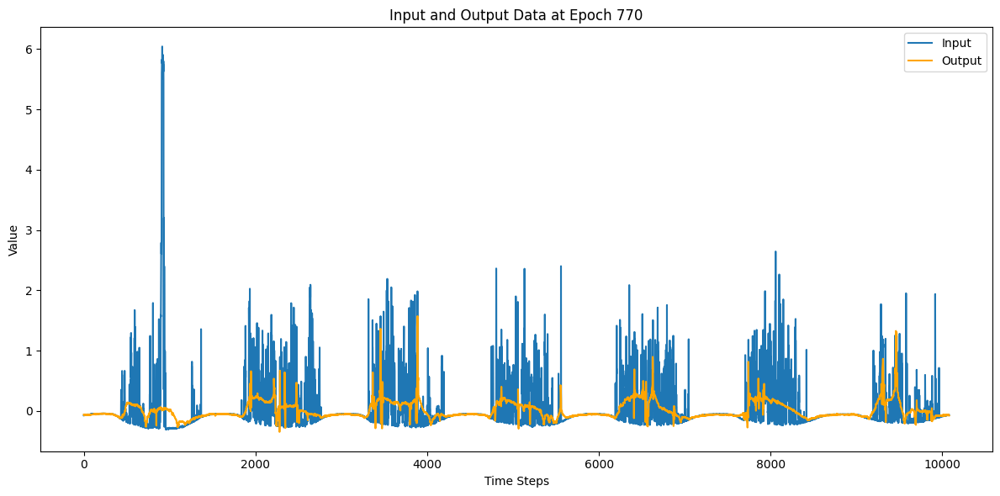

151/151 [==============================] - 13s 85ms/step - loss: 0.7055 - val_loss: 0.8893 - lr: 1.0000e-04
Epoch 771/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7055 - val_loss: 0.8889 - lr: 1.0000e-04
Epoch 772/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7060 - val_loss: 0.8878 - lr: 1.0000e-04
Epoch 773/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7051 - val_loss: 0.8890 - lr: 1.0000e-04
Epoch 774/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7058 - val_loss: 0.8882 - lr: 1.0000e-04
Epoch 775/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7052 - val_loss: 0.8878 - lr: 1.0000e-04
Epoch 776/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7054 - val_loss: 0.8876 - lr: 1.0000e-04
Epoch 777/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7053 - val_loss: 0.8889 - lr: 1.0000e-04
Epoch 778/10000
151/151 

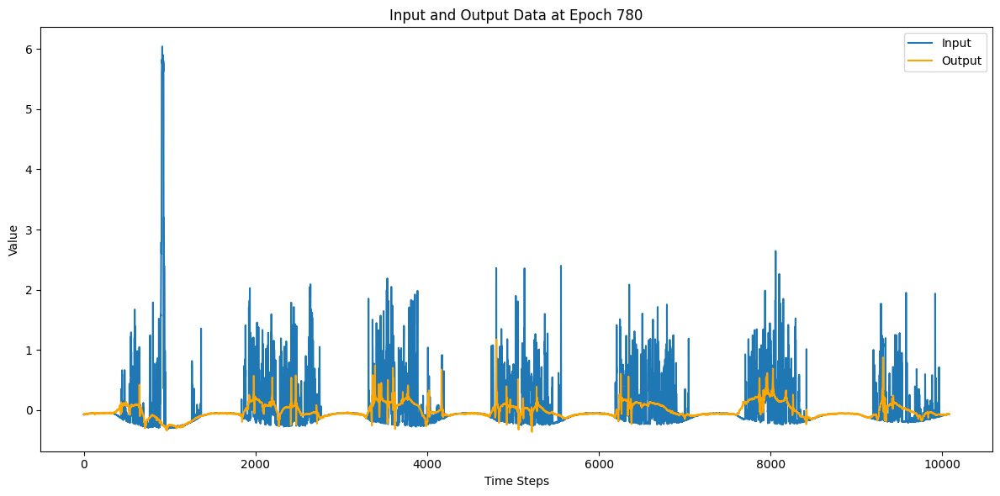

151/151 [==============================] - 13s 86ms/step - loss: 0.7051 - val_loss: 0.8883 - lr: 1.0000e-04
Epoch 781/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7054 - val_loss: 0.8887 - lr: 1.0000e-04
Epoch 782/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7055 - val_loss: 0.8890 - lr: 1.0000e-04
Epoch 783/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7052 - val_loss: 0.8893 - lr: 1.0000e-04
Epoch 784/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7050 - val_loss: 0.8879 - lr: 1.0000e-04
Epoch 785/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7051 - val_loss: 0.8888 - lr: 1.0000e-04
Epoch 786/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7073 - val_loss: 0.8890 - lr: 1.0000e-04
Epoch 787/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7050 - val_loss: 0.8876 - lr: 1.0000e-04
Epoch 788/10000
151/151 

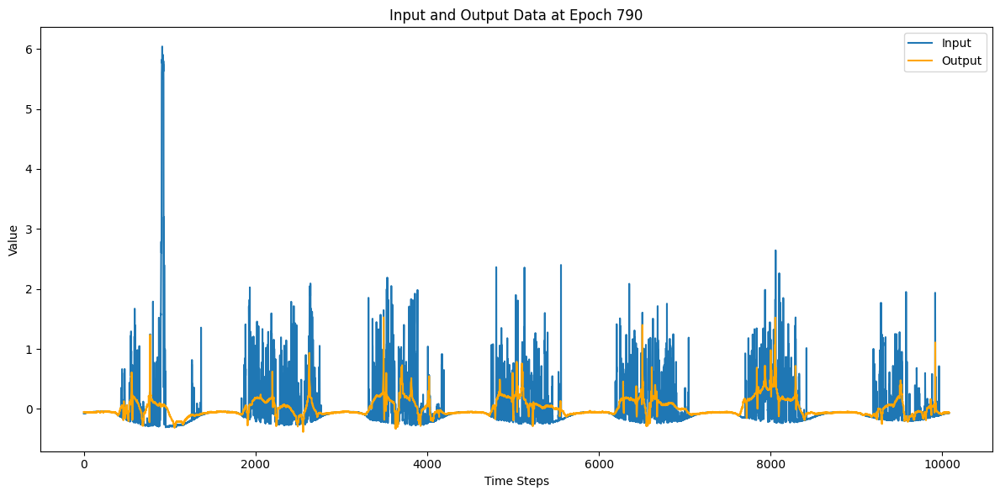

151/151 [==============================] - 13s 86ms/step - loss: 0.7050 - val_loss: 0.8880 - lr: 1.0000e-04
Epoch 791/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7051 - val_loss: 0.8886 - lr: 1.0000e-04
Epoch 792/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7086 - val_loss: 0.8881 - lr: 1.0000e-04
Epoch 793/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7050 - val_loss: 0.8879 - lr: 1.0000e-04
Epoch 794/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7052 - val_loss: 0.8883 - lr: 1.0000e-04
Epoch 795/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7047 - val_loss: 0.8889 - lr: 1.0000e-04
Epoch 796/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7050 - val_loss: 0.8875 - lr: 1.0000e-04
Epoch 797/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7050 - val_loss: 0.8889 - lr: 1.0000e-04
Epoch 798/10000
151/151 

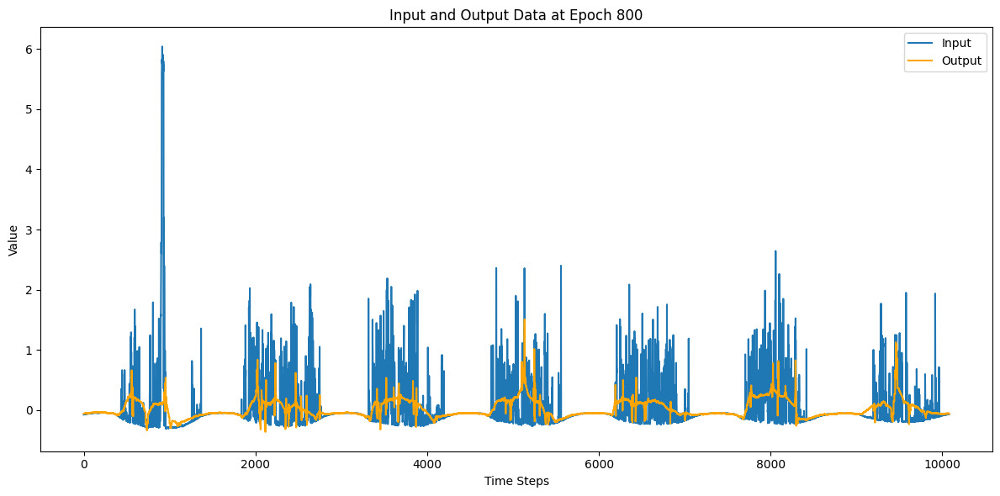

151/151 [==============================] - 13s 84ms/step - loss: 0.7051 - val_loss: 0.8880 - lr: 1.0000e-04
Epoch 801/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7052 - val_loss: 0.8880 - lr: 1.0000e-04
Epoch 802/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7049 - val_loss: 0.8877 - lr: 1.0000e-04
Epoch 803/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7052 - val_loss: 0.8888 - lr: 1.0000e-04
Epoch 804/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7047 - val_loss: 0.8877 - lr: 1.0000e-04
Epoch 805/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7049 - val_loss: 0.8876 - lr: 1.0000e-04
Epoch 806/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7047 - val_loss: 0.8880 - lr: 1.0000e-04
Epoch 807/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7048 - val_loss: 0.8871 - lr: 1.0000e-04
Epoch 808/10000
151/151 

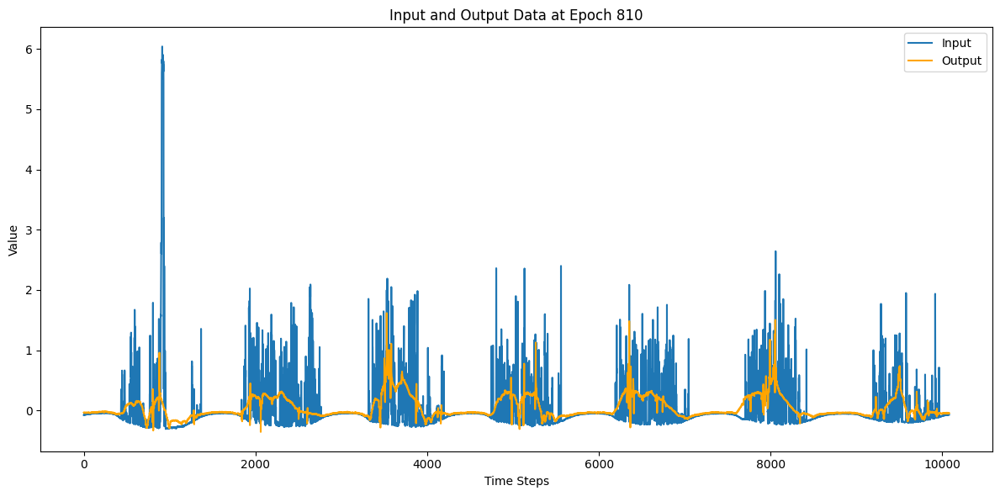

151/151 [==============================] - 13s 86ms/step - loss: 0.7047 - val_loss: 0.8889 - lr: 1.0000e-04
Epoch 811/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7048 - val_loss: 0.8885 - lr: 1.0000e-04
Epoch 812/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7050 - val_loss: 0.8875 - lr: 1.0000e-04
Epoch 813/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7046 - val_loss: 0.8871 - lr: 1.0000e-04
Epoch 814/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7053 - val_loss: 0.8874 - lr: 1.0000e-04
Epoch 815/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7043 - val_loss: 0.8881 - lr: 1.0000e-04
Epoch 816/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7048 - val_loss: 0.8872 - lr: 1.0000e-04
Epoch 817/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7066 - val_loss: 0.8887 - lr: 1.0000e-04
Epoch 818/10000
151/151 

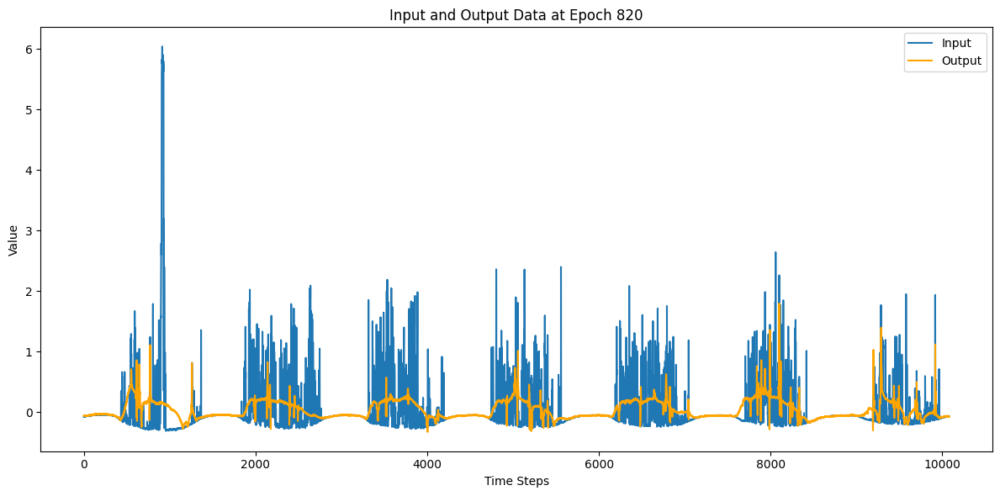

151/151 [==============================] - 13s 86ms/step - loss: 0.7108 - val_loss: 0.8877 - lr: 1.0000e-04
Epoch 821/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7045 - val_loss: 0.8882 - lr: 1.0000e-04
Epoch 822/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7122 - val_loss: 0.8887 - lr: 1.0000e-04
Epoch 823/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7048 - val_loss: 0.8879 - lr: 1.0000e-04
Epoch 824/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7047 - val_loss: 0.8874 - lr: 1.0000e-04
Epoch 825/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7043 - val_loss: 0.8875 - lr: 1.0000e-04
Epoch 826/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7044 - val_loss: 0.8874 - lr: 1.0000e-04
Epoch 827/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7041 - val_loss: 0.8882 - lr: 1.0000e-04
Epoch 828/10000
151/151 

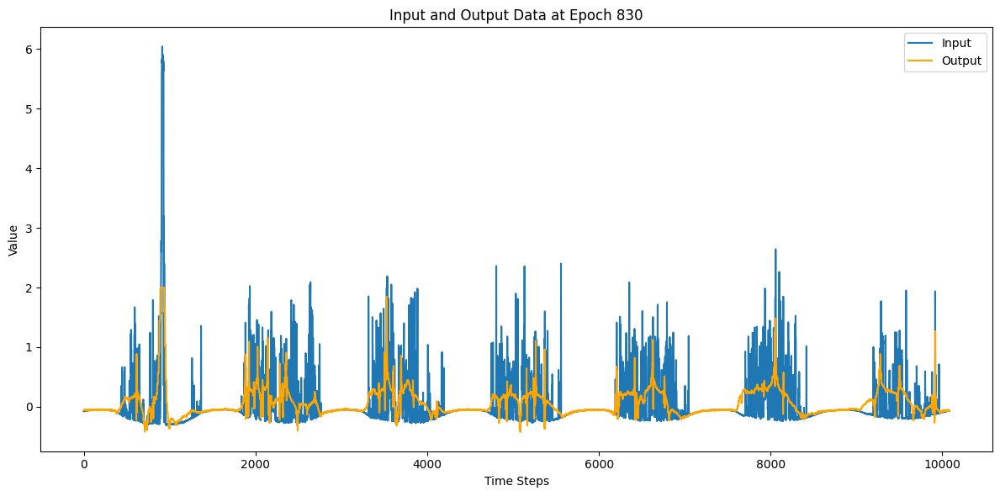

151/151 [==============================] - 13s 84ms/step - loss: 0.7047 - val_loss: 0.8875 - lr: 1.0000e-04
Epoch 831/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7045 - val_loss: 0.8871 - lr: 1.0000e-04
Epoch 832/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7043 - val_loss: 0.8871 - lr: 1.0000e-04
Epoch 833/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7072 - val_loss: 0.8894 - lr: 1.0000e-04
Epoch 834/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7042 - val_loss: 0.8870 - lr: 1.0000e-04
Epoch 835/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7046 - val_loss: 0.8872 - lr: 1.0000e-04
Epoch 836/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7045 - val_loss: 0.8877 - lr: 1.0000e-04
Epoch 837/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.7041 - val_loss: 0.8869 - lr: 1.0000e-04
Epoch 838/10000
151/151 

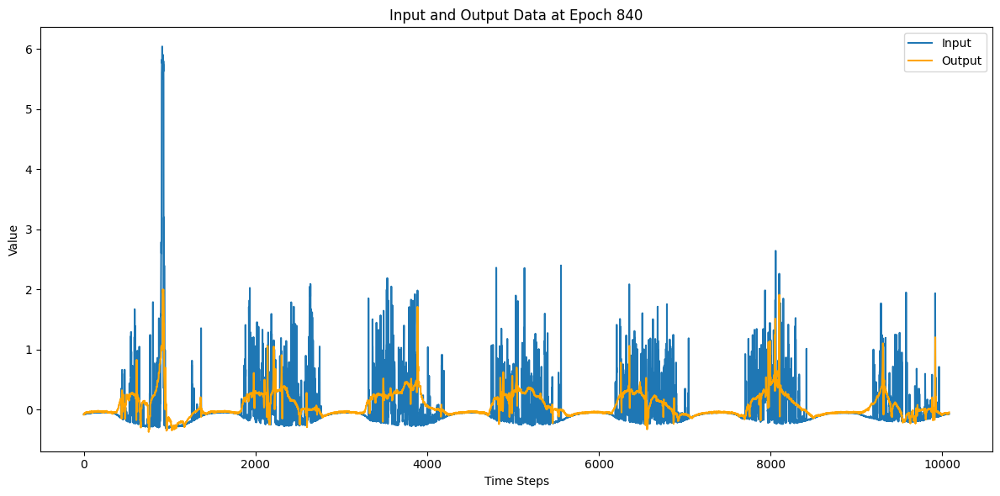

151/151 [==============================] - 13s 86ms/step - loss: 0.7079 - val_loss: 0.8868 - lr: 1.0000e-04
Epoch 841/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7041 - val_loss: 0.8874 - lr: 1.0000e-04
Epoch 842/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7155 - val_loss: 0.8878 - lr: 1.0000e-04
Epoch 843/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7159 - val_loss: 0.8863 - lr: 1.0000e-04
Epoch 844/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7048 - val_loss: 0.8877 - lr: 1.0000e-04
Epoch 845/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7042 - val_loss: 0.8881 - lr: 1.0000e-04
Epoch 846/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7047 - val_loss: 0.8875 - lr: 1.0000e-04
Epoch 847/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7041 - val_loss: 0.8871 - lr: 1.0000e-04
Epoch 848/10000
151/151 

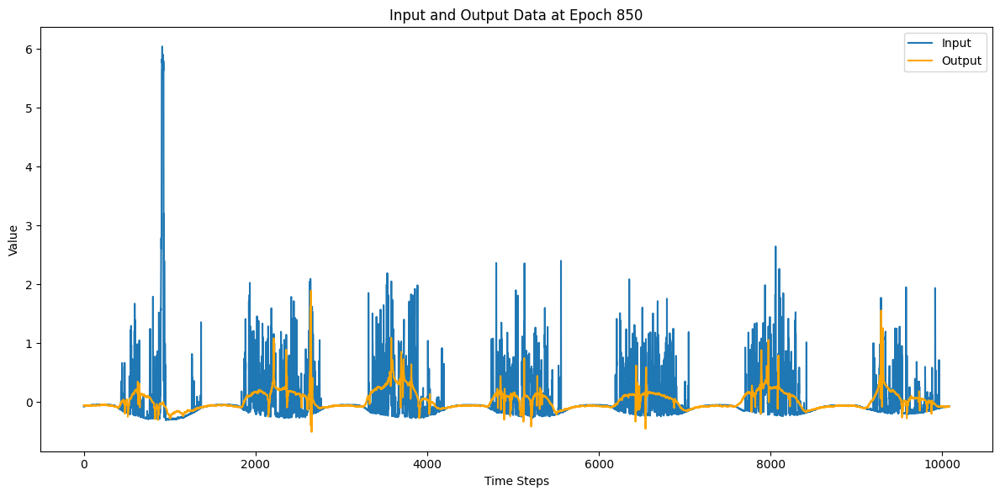

151/151 [==============================] - 13s 85ms/step - loss: 0.7076 - val_loss: 0.8881 - lr: 1.0000e-04
Epoch 851/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7041 - val_loss: 0.8876 - lr: 1.0000e-04
Epoch 852/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7059 - val_loss: 0.8891 - lr: 1.0000e-04
Epoch 853/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7049 - val_loss: 0.8867 - lr: 1.0000e-04
Epoch 854/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7040 - val_loss: 0.8877 - lr: 1.0000e-04
Epoch 855/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7041 - val_loss: 0.8883 - lr: 1.0000e-04
Epoch 856/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7045 - val_loss: 0.8885 - lr: 1.0000e-04
Epoch 857/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7044 - val_loss: 0.8879 - lr: 1.0000e-04
Epoch 858/10000
151/151 

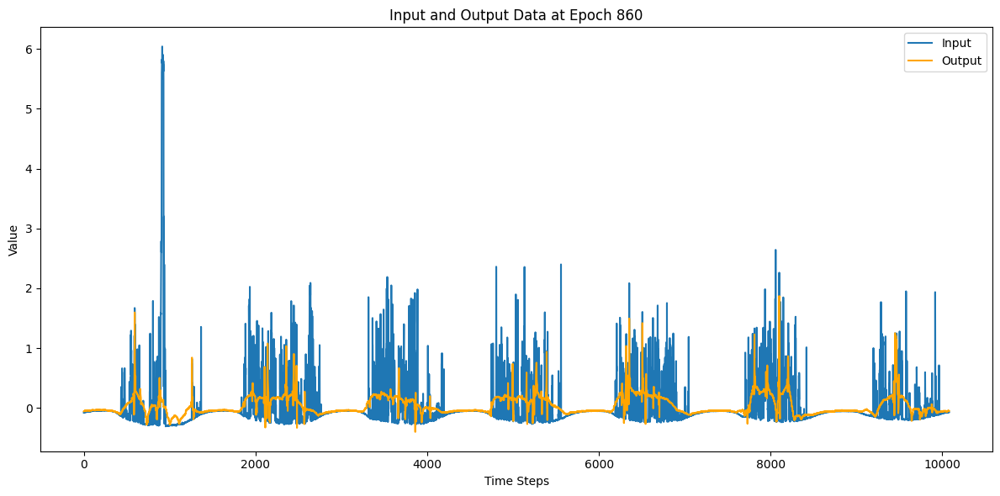

151/151 [==============================] - 13s 86ms/step - loss: 0.7041 - val_loss: 0.8879 - lr: 1.0000e-04
Epoch 861/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7041 - val_loss: 0.8868 - lr: 1.0000e-04
Epoch 862/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7042 - val_loss: 0.8863 - lr: 1.0000e-04
Epoch 863/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7042 - val_loss: 0.8874 - lr: 1.0000e-04
Epoch 864/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7038 - val_loss: 0.8878 - lr: 1.0000e-04
Epoch 865/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7042 - val_loss: 0.8883 - lr: 1.0000e-04
Epoch 866/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7073 - val_loss: 0.8878 - lr: 1.0000e-04
Epoch 867/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.7037 - val_loss: 0.8863 - lr: 1.0000e-04
Epoch 868/10000
151/151 

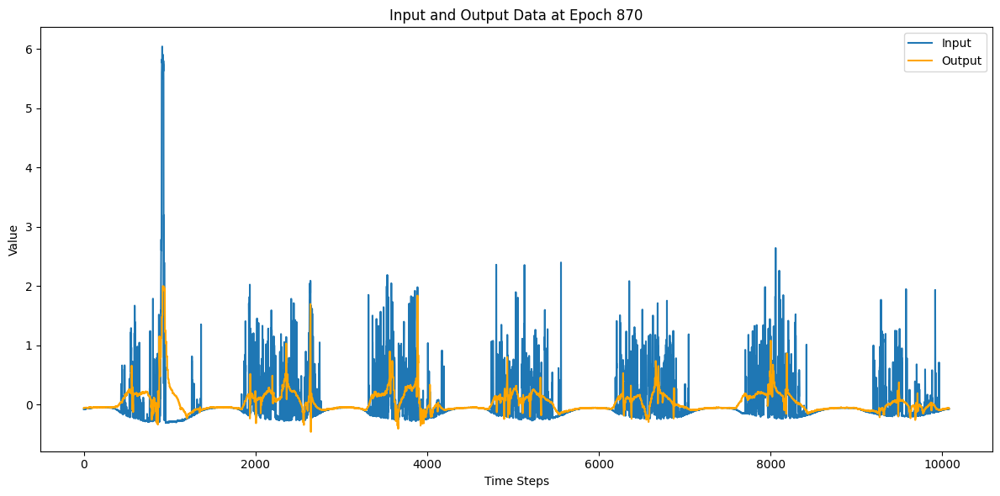

151/151 [==============================] - 13s 85ms/step - loss: 0.7048 - val_loss: 0.8874 - lr: 1.0000e-04
Epoch 871/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7040 - val_loss: 0.8884 - lr: 1.0000e-04
Epoch 872/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7067 - val_loss: 0.8873 - lr: 1.0000e-04
Epoch 873/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7041 - val_loss: 0.8880 - lr: 1.0000e-04
Epoch 874/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7038 - val_loss: 0.8874 - lr: 1.0000e-04
Epoch 875/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7078 - val_loss: 0.8878 - lr: 1.0000e-04
Epoch 876/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7040 - val_loss: 0.8868 - lr: 1.0000e-04
Epoch 877/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7091 - val_loss: 0.8872 - lr: 1.0000e-04
Epoch 878/10000
151/151 

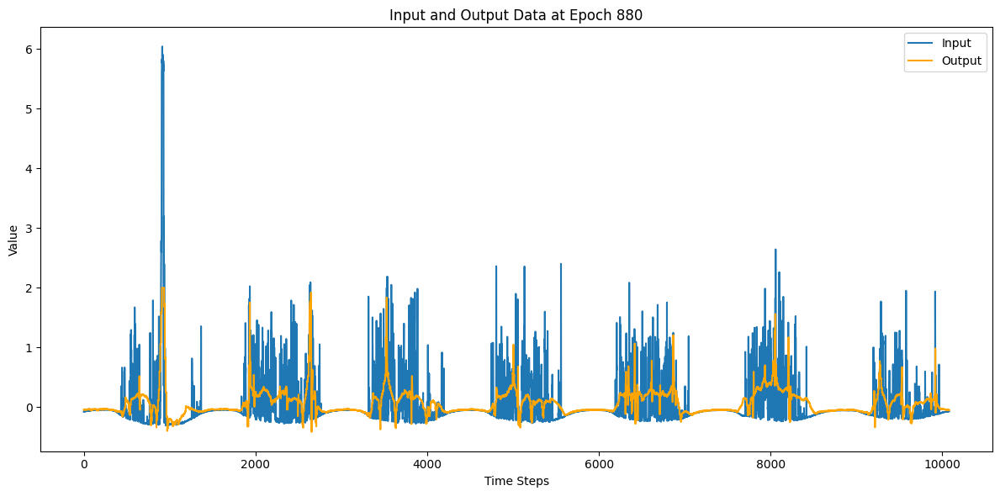

151/151 [==============================] - 13s 85ms/step - loss: 0.7042 - val_loss: 0.8874 - lr: 1.0000e-04
Epoch 881/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7039 - val_loss: 0.8877 - lr: 1.0000e-04
Epoch 882/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7040 - val_loss: 0.8885 - lr: 1.0000e-04
Epoch 883/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7048 - val_loss: 0.8878 - lr: 1.0000e-04
Epoch 884/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7065 - val_loss: 0.8874 - lr: 1.0000e-04
Epoch 885/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7037 - val_loss: 0.8876 - lr: 1.0000e-04
Epoch 886/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7036 - val_loss: 0.8876 - lr: 1.0000e-04
Epoch 887/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7036 - val_loss: 0.8882 - lr: 1.0000e-04
Epoch 888/10000
151/151 

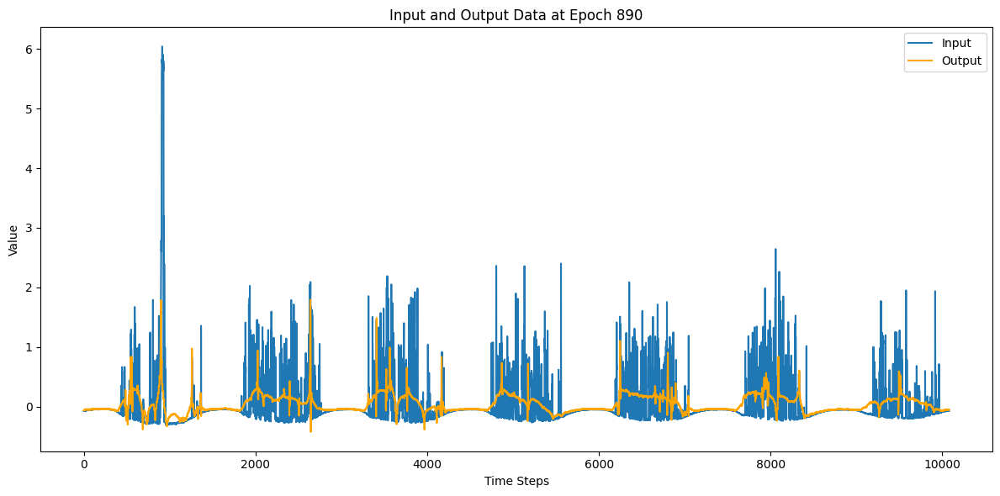

151/151 [==============================] - 13s 85ms/step - loss: 0.7039 - val_loss: 0.8880 - lr: 1.0000e-04
Epoch 891/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7038 - val_loss: 0.8881 - lr: 1.0000e-04
Epoch 892/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7039 - val_loss: 0.8884 - lr: 1.0000e-04
Epoch 893/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7037 - val_loss: 0.8866 - lr: 1.0000e-04
Epoch 894/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7066 - val_loss: 0.8880 - lr: 1.0000e-04
Epoch 895/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7037 - val_loss: 0.8868 - lr: 1.0000e-04
Epoch 896/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7037 - val_loss: 0.8870 - lr: 1.0000e-04
Epoch 897/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7038 - val_loss: 0.8873 - lr: 1.0000e-04
Epoch 898/10000
151/151 

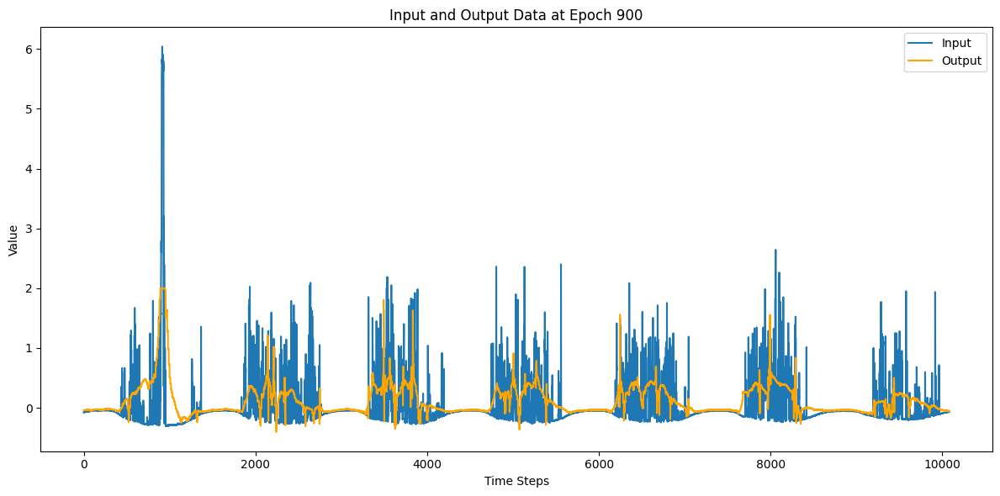

151/151 [==============================] - 13s 89ms/step - loss: 0.7039 - val_loss: 0.8878 - lr: 1.0000e-04
Epoch 901/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7041 - val_loss: 0.8882 - lr: 1.0000e-04
Epoch 902/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7042 - val_loss: 0.8869 - lr: 1.0000e-04
Epoch 903/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7039 - val_loss: 0.8862 - lr: 1.0000e-04
Epoch 904/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7036 - val_loss: 0.8872 - lr: 1.0000e-04
Epoch 905/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7037 - val_loss: 0.8871 - lr: 1.0000e-04
Epoch 906/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7035 - val_loss: 0.8880 - lr: 1.0000e-04
Epoch 907/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7036 - val_loss: 0.8873 - lr: 1.0000e-04
Epoch 908/10000
151/151 

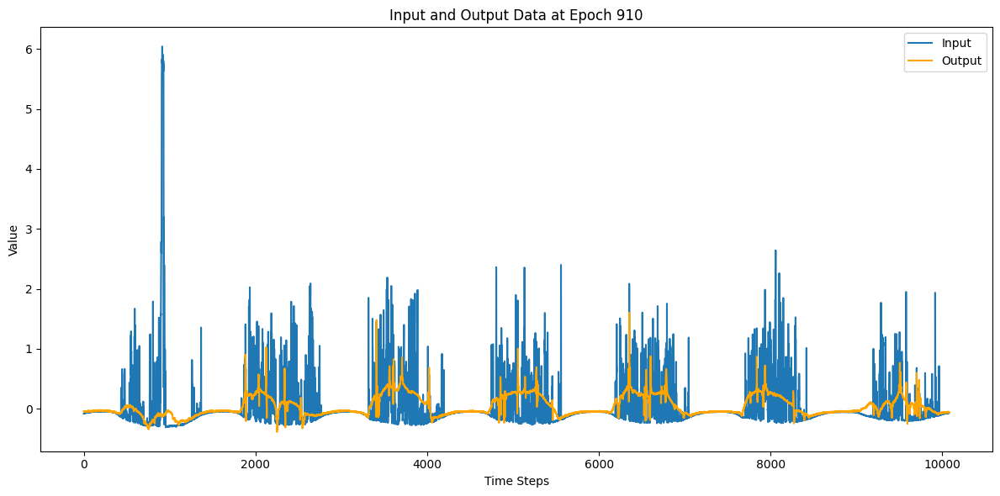

151/151 [==============================] - 13s 86ms/step - loss: 0.7041 - val_loss: 0.8880 - lr: 1.0000e-04
Epoch 911/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7042 - val_loss: 0.8869 - lr: 1.0000e-04
Epoch 912/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7041 - val_loss: 0.8867 - lr: 1.0000e-04
Epoch 913/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7035 - val_loss: 0.8866 - lr: 1.0000e-04
Epoch 914/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7033 - val_loss: 0.8879 - lr: 1.0000e-04
Epoch 915/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7045 - val_loss: 0.8870 - lr: 1.0000e-04
Epoch 916/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7045 - val_loss: 0.8866 - lr: 1.0000e-04
Epoch 917/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7082 - val_loss: 0.8875 - lr: 1.0000e-04
Epoch 918/10000
151/151 

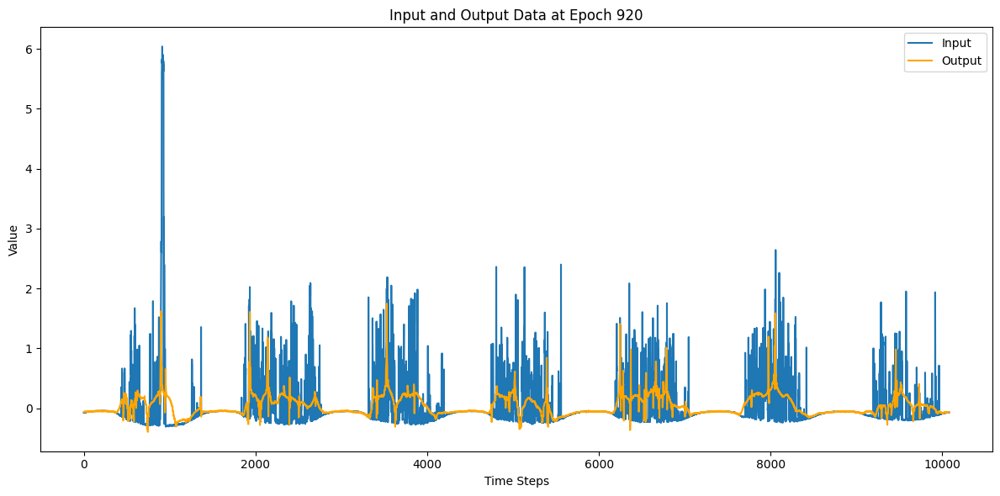

151/151 [==============================] - 13s 84ms/step - loss: 0.7039 - val_loss: 0.8878 - lr: 1.0000e-04
Epoch 921/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7037 - val_loss: 0.8877 - lr: 1.0000e-04
Epoch 922/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7037 - val_loss: 0.8870 - lr: 1.0000e-04
Epoch 923/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7035 - val_loss: 0.8865 - lr: 1.0000e-04
Epoch 924/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7038 - val_loss: 0.8873 - lr: 1.0000e-04
Epoch 925/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7038 - val_loss: 0.8866 - lr: 1.0000e-04
Epoch 926/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7036 - val_loss: 0.8878 - lr: 1.0000e-04
Epoch 927/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7036 - val_loss: 0.8867 - lr: 1.0000e-04
Epoch 928/10000
151/151 

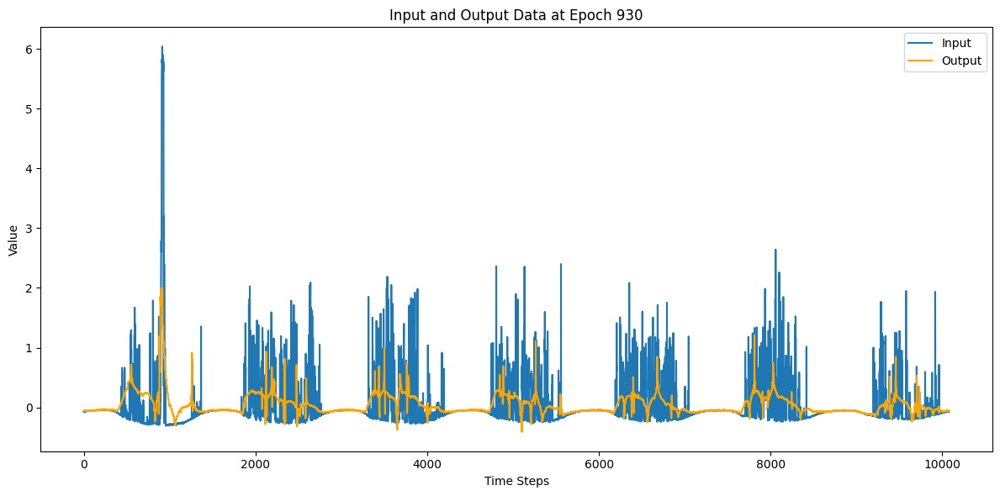

151/151 [==============================] - 13s 89ms/step - loss: 0.7035 - val_loss: 0.8868 - lr: 1.0000e-04
Epoch 931/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7037 - val_loss: 0.8894 - lr: 1.0000e-04
Epoch 932/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7035 - val_loss: 0.8864 - lr: 1.0000e-04
Epoch 933/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7034 - val_loss: 0.8862 - lr: 1.0000e-04
Epoch 934/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7074 - val_loss: 0.8873 - lr: 1.0000e-04
Epoch 935/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7031 - val_loss: 0.8871 - lr: 1.0000e-04
Epoch 936/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7035 - val_loss: 0.8874 - lr: 1.0000e-04
Epoch 937/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7033 - val_loss: 0.8863 - lr: 1.0000e-04
Epoch 938/10000
151/151 

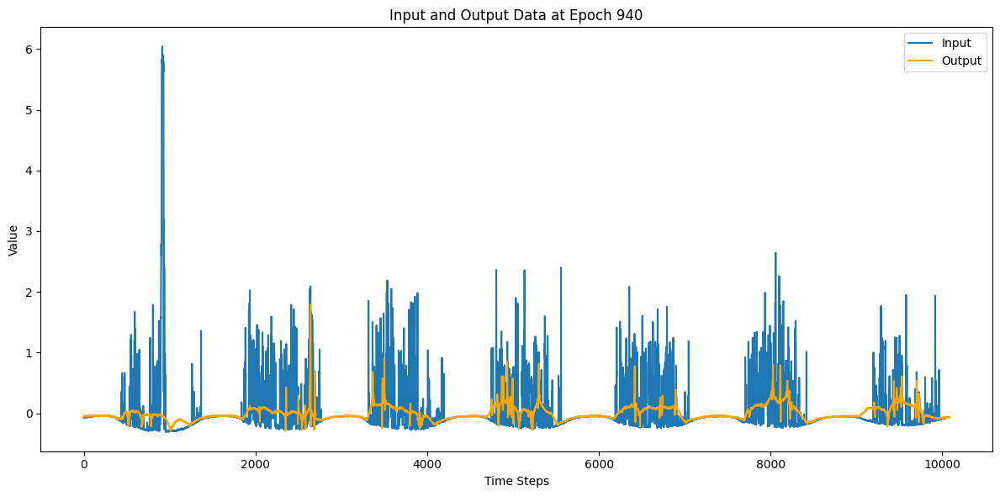

151/151 [==============================] - 13s 85ms/step - loss: 0.7072 - val_loss: 0.8874 - lr: 1.0000e-04
Epoch 941/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7033 - val_loss: 0.8863 - lr: 1.0000e-04
Epoch 942/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7028 - val_loss: 0.8878 - lr: 1.0000e-04
Epoch 943/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7033 - val_loss: 0.8867 - lr: 1.0000e-04
Epoch 944/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7035 - val_loss: 0.8866 - lr: 1.0000e-04
Epoch 945/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7035 - val_loss: 0.8873 - lr: 1.0000e-04
Epoch 946/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7032 - val_loss: 0.8879 - lr: 1.0000e-04
Epoch 947/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7034 - val_loss: 0.8864 - lr: 1.0000e-04
Epoch 948/10000
151/151 

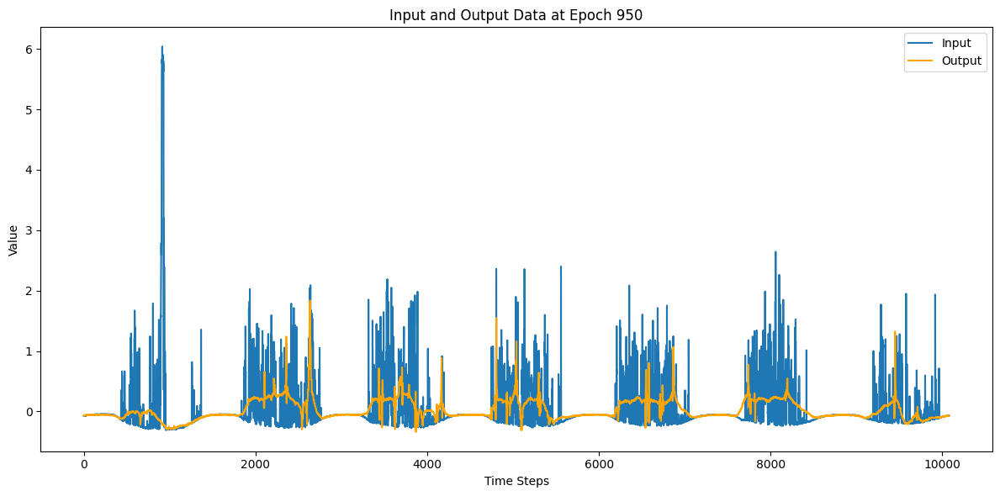

151/151 [==============================] - 13s 85ms/step - loss: 0.7034 - val_loss: 0.8866 - lr: 1.0000e-04
Epoch 951/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7032 - val_loss: 0.8878 - lr: 1.0000e-04
Epoch 952/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7032 - val_loss: 0.8878 - lr: 1.0000e-04
Epoch 953/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7029 - val_loss: 0.8871 - lr: 1.0000e-04
Epoch 954/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7032 - val_loss: 0.8875 - lr: 1.0000e-04
Epoch 955/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7032 - val_loss: 0.8864 - lr: 1.0000e-04
Epoch 956/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7036 - val_loss: 0.8867 - lr: 1.0000e-04
Epoch 957/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7034 - val_loss: 0.8881 - lr: 1.0000e-04
Epoch 958/10000
151/151 

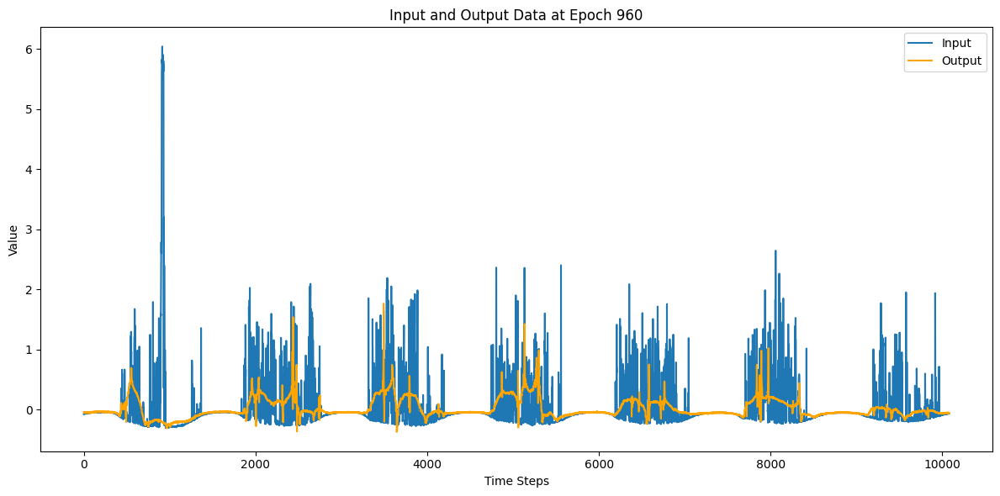

151/151 [==============================] - 13s 85ms/step - loss: 0.7031 - val_loss: 0.8869 - lr: 1.0000e-04
Epoch 961/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7060 - val_loss: 0.8862 - lr: 1.0000e-04
Epoch 962/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7034 - val_loss: 0.8867 - lr: 1.0000e-04
Epoch 963/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7064 - val_loss: 0.8872 - lr: 1.0000e-04
Epoch 964/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7030 - val_loss: 0.8873 - lr: 1.0000e-04
Epoch 965/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7072 - val_loss: 0.8868 - lr: 1.0000e-04
Epoch 966/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7031 - val_loss: 0.8882 - lr: 1.0000e-04
Epoch 967/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7078 - val_loss: 0.8862 - lr: 1.0000e-04
Epoch 968/10000
151/151 

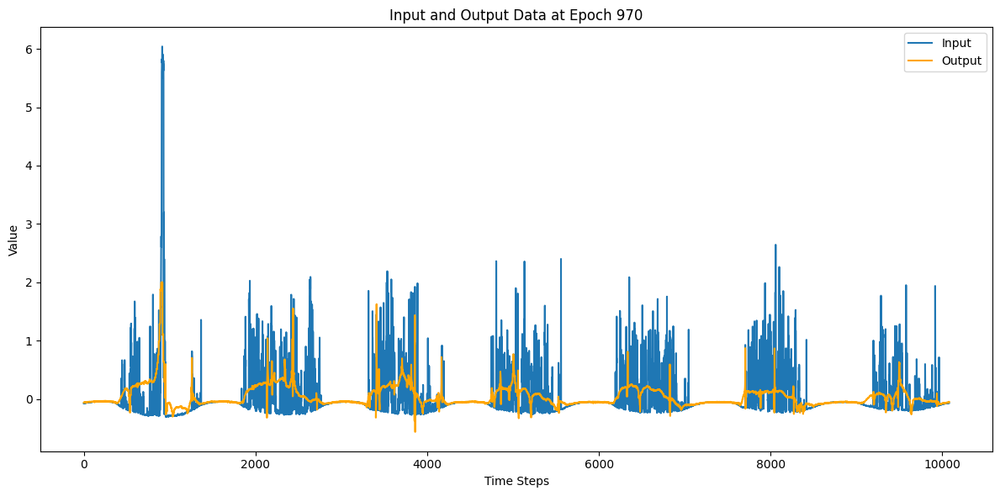

151/151 [==============================] - 13s 84ms/step - loss: 0.7035 - val_loss: 0.8870 - lr: 1.0000e-04
Epoch 971/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7037 - val_loss: 0.8875 - lr: 1.0000e-04
Epoch 972/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7030 - val_loss: 0.8852 - lr: 1.0000e-04
Epoch 973/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7033 - val_loss: 0.8869 - lr: 1.0000e-04
Epoch 974/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7159 - val_loss: 0.8859 - lr: 1.0000e-04
Epoch 975/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7036 - val_loss: 0.8875 - lr: 1.0000e-04
Epoch 976/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7077 - val_loss: 0.8865 - lr: 1.0000e-04
Epoch 977/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7029 - val_loss: 0.8865 - lr: 1.0000e-04
Epoch 978/10000
151/151 

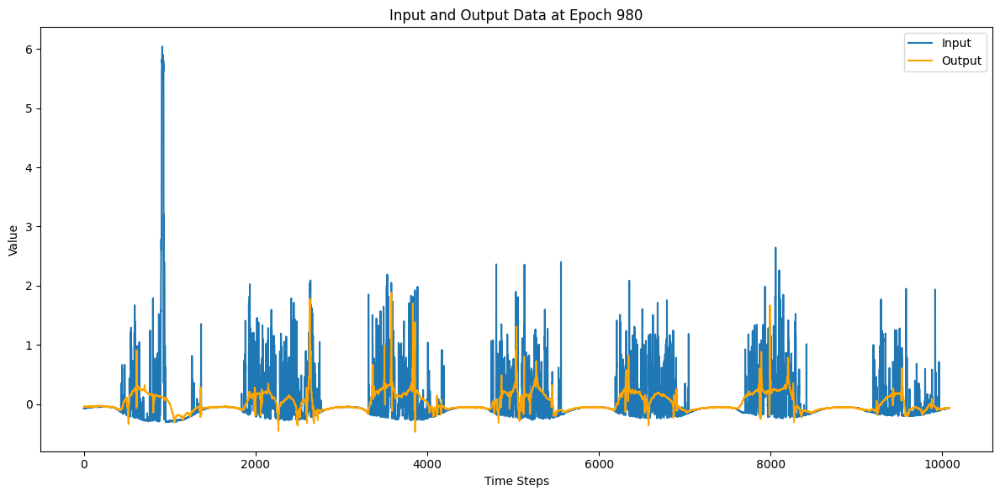

151/151 [==============================] - 13s 85ms/step - loss: 0.7027 - val_loss: 0.8867 - lr: 1.0000e-04
Epoch 981/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7046 - val_loss: 0.8868 - lr: 1.0000e-04
Epoch 982/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7076 - val_loss: 0.8863 - lr: 1.0000e-04
Epoch 983/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7031 - val_loss: 0.8865 - lr: 1.0000e-04
Epoch 984/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7028 - val_loss: 0.8874 - lr: 1.0000e-04
Epoch 985/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7031 - val_loss: 0.8868 - lr: 1.0000e-04
Epoch 986/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7031 - val_loss: 0.8868 - lr: 1.0000e-04
Epoch 987/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7030 - val_loss: 0.8869 - lr: 1.0000e-04
Epoch 988/10000
151/151 

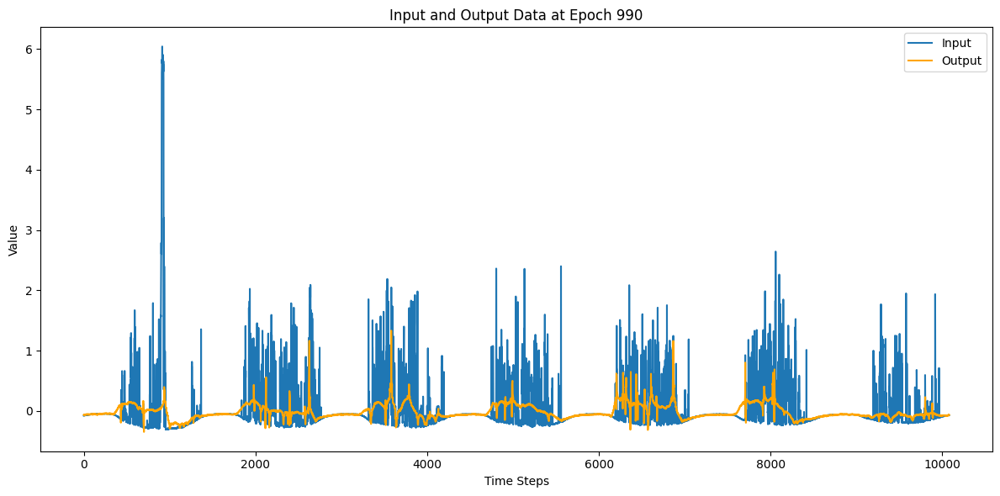

151/151 [==============================] - 13s 86ms/step - loss: 0.7030 - val_loss: 0.8870 - lr: 1.0000e-04
Epoch 991/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7028 - val_loss: 0.8864 - lr: 1.0000e-04
Epoch 992/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7031 - val_loss: 0.8875 - lr: 1.0000e-04
Epoch 993/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7072 - val_loss: 0.8872 - lr: 1.0000e-04
Epoch 994/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.7033 - val_loss: 0.8862 - lr: 1.0000e-04
Epoch 995/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7049 - val_loss: 0.8867 - lr: 1.0000e-04
Epoch 996/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7144 - val_loss: 0.8862 - lr: 1.0000e-04
Epoch 997/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7028 - val_loss: 0.8868 - lr: 1.0000e-04
Epoch 998/10000
151/151 

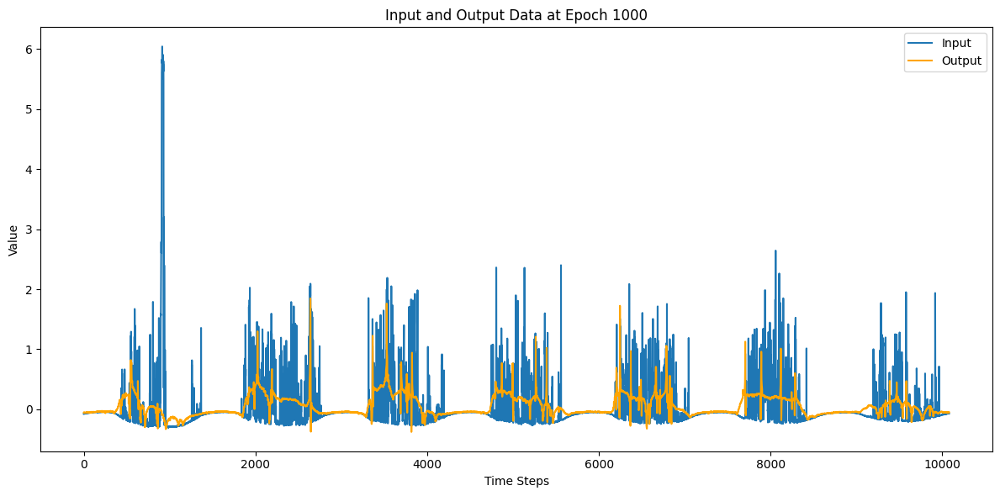

151/151 [==============================] - 13s 86ms/step - loss: 0.7031 - val_loss: 0.8873 - lr: 1.0000e-04
Epoch 1001/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7030 - val_loss: 0.8869 - lr: 1.0000e-04
Epoch 1002/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7035 - val_loss: 0.8851 - lr: 1.0000e-04
Epoch 1003/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7027 - val_loss: 0.8860 - lr: 1.0000e-04
Epoch 1004/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7040 - val_loss: 0.8864 - lr: 1.0000e-04
Epoch 1005/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7027 - val_loss: 0.8870 - lr: 1.0000e-04
Epoch 1006/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7055 - val_loss: 0.8857 - lr: 1.0000e-04
Epoch 1007/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7078 - val_loss: 0.8870 - lr: 1.0000e-04
Epoch 1008/10000


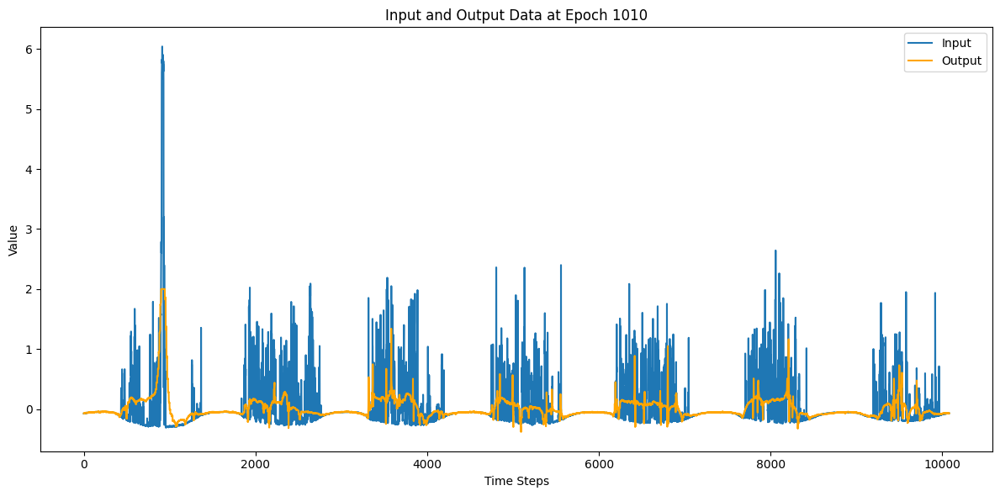

151/151 [==============================] - 13s 85ms/step - loss: 0.7027 - val_loss: 0.8871 - lr: 1.0000e-04
Epoch 1011/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7027 - val_loss: 0.8870 - lr: 1.0000e-04
Epoch 1012/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7038 - val_loss: 0.8870 - lr: 1.0000e-04
Epoch 1013/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7026 - val_loss: 0.8864 - lr: 1.0000e-04
Epoch 1014/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7027 - val_loss: 0.8866 - lr: 1.0000e-04
Epoch 1015/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7026 - val_loss: 0.8862 - lr: 1.0000e-04
Epoch 1016/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7024 - val_loss: 0.8873 - lr: 1.0000e-04
Epoch 1017/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7025 - val_loss: 0.8863 - lr: 1.0000e-04
Epoch 1018/10000


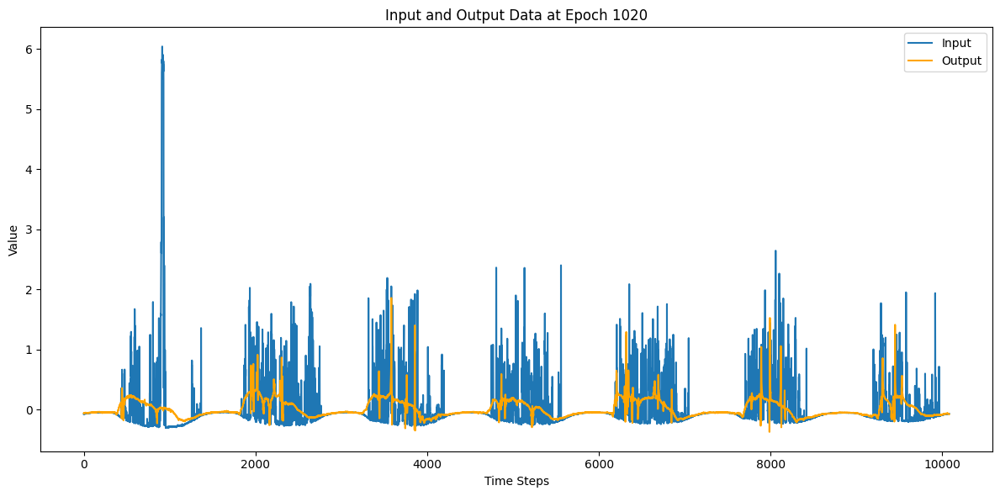

151/151 [==============================] - 13s 85ms/step - loss: 0.7026 - val_loss: 0.8869 - lr: 1.0000e-04
Epoch 1021/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7030 - val_loss: 0.8870 - lr: 1.0000e-04
Epoch 1022/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7086 - val_loss: 0.8867 - lr: 1.0000e-04
Epoch 1023/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7028 - val_loss: 0.8862 - lr: 1.0000e-04
Epoch 1024/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7030 - val_loss: 0.8874 - lr: 1.0000e-04
Epoch 1025/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7087 - val_loss: 0.8872 - lr: 1.0000e-04
Epoch 1026/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7025 - val_loss: 0.8862 - lr: 1.0000e-04
Epoch 1027/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.7025 - val_loss: 0.8872 - lr: 1.0000e-04
Epoch 1028/10000


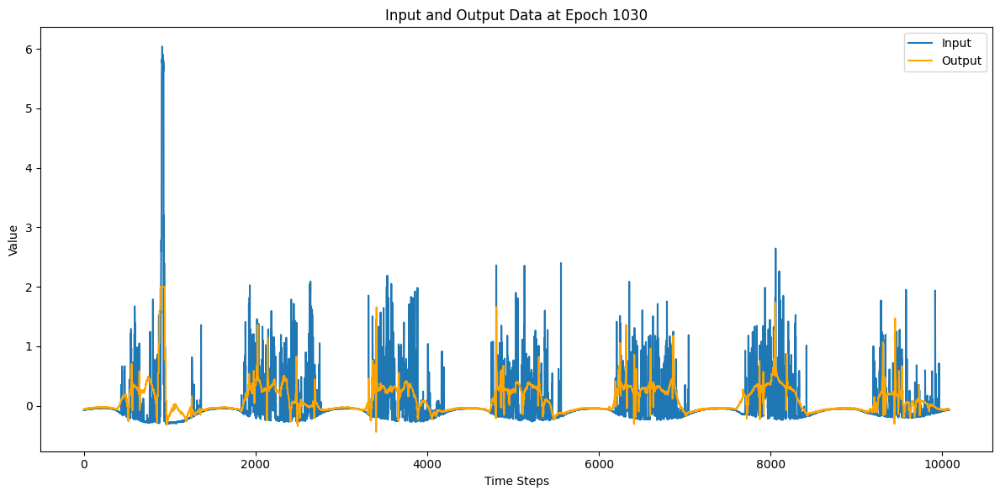

151/151 [==============================] - 13s 86ms/step - loss: 0.7066 - val_loss: 0.8877 - lr: 1.0000e-04
Epoch 1031/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7068 - val_loss: 0.8857 - lr: 1.0000e-04
Epoch 1032/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7045 - val_loss: 0.8859 - lr: 1.0000e-04
Epoch 1033/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7026 - val_loss: 0.8867 - lr: 1.0000e-04
Epoch 1034/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7026 - val_loss: 0.8866 - lr: 1.0000e-04
Epoch 1035/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7027 - val_loss: 0.8860 - lr: 1.0000e-04
Epoch 1036/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7036 - val_loss: 0.8871 - lr: 1.0000e-04
Epoch 1037/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7023 - val_loss: 0.8851 - lr: 1.0000e-04
Epoch 1038/10000


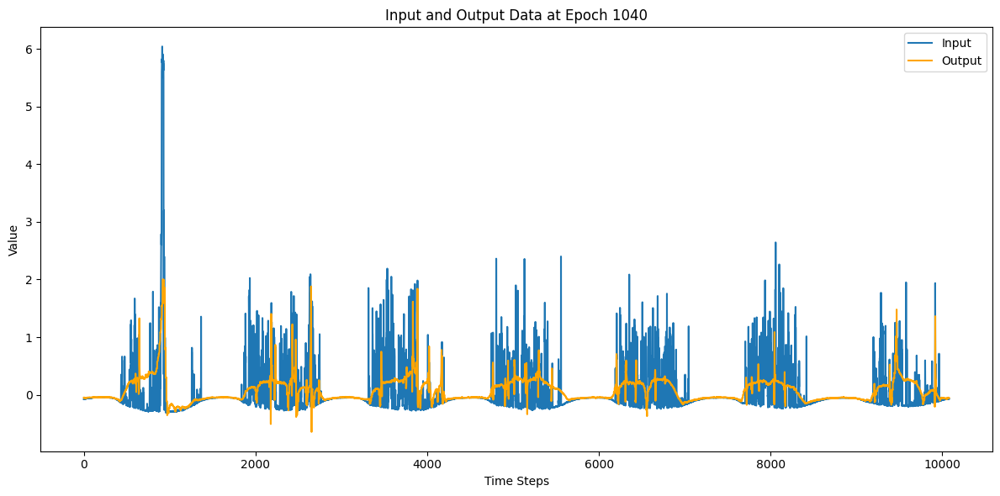

151/151 [==============================] - 13s 85ms/step - loss: 0.7027 - val_loss: 0.8863 - lr: 1.0000e-04
Epoch 1041/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7024 - val_loss: 0.8873 - lr: 1.0000e-04
Epoch 1042/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7028 - val_loss: 0.8858 - lr: 1.0000e-04
Epoch 1043/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7025 - val_loss: 0.8867 - lr: 1.0000e-04
Epoch 1044/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7025 - val_loss: 0.8866 - lr: 1.0000e-04
Epoch 1045/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7027 - val_loss: 0.8871 - lr: 1.0000e-04
Epoch 1046/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7037 - val_loss: 0.8878 - lr: 1.0000e-04
Epoch 1047/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7030 - val_loss: 0.8867 - lr: 1.0000e-04
Epoch 1048/10000


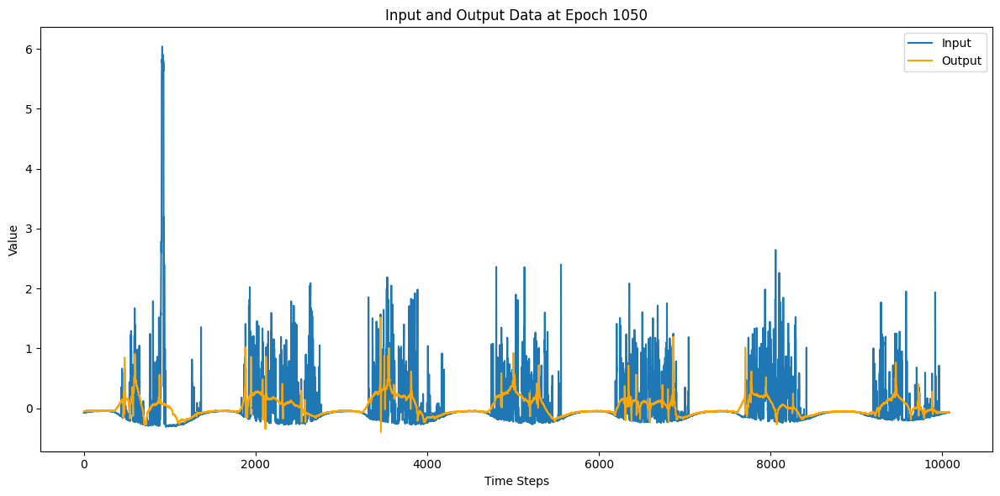

151/151 [==============================] - 13s 85ms/step - loss: 0.7084 - val_loss: 0.8856 - lr: 1.0000e-04
Epoch 1051/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7024 - val_loss: 0.8863 - lr: 1.0000e-04
Epoch 1052/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7034 - val_loss: 0.8856 - lr: 1.0000e-04
Epoch 1053/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7022 - val_loss: 0.8867 - lr: 1.0000e-04
Epoch 1054/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7146 - val_loss: 0.8867 - lr: 1.0000e-04
Epoch 1055/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7025 - val_loss: 0.8854 - lr: 1.0000e-04
Epoch 1056/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7025 - val_loss: 0.8871 - lr: 1.0000e-04
Epoch 1057/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7063 - val_loss: 0.8859 - lr: 1.0000e-04
Epoch 1058/10000


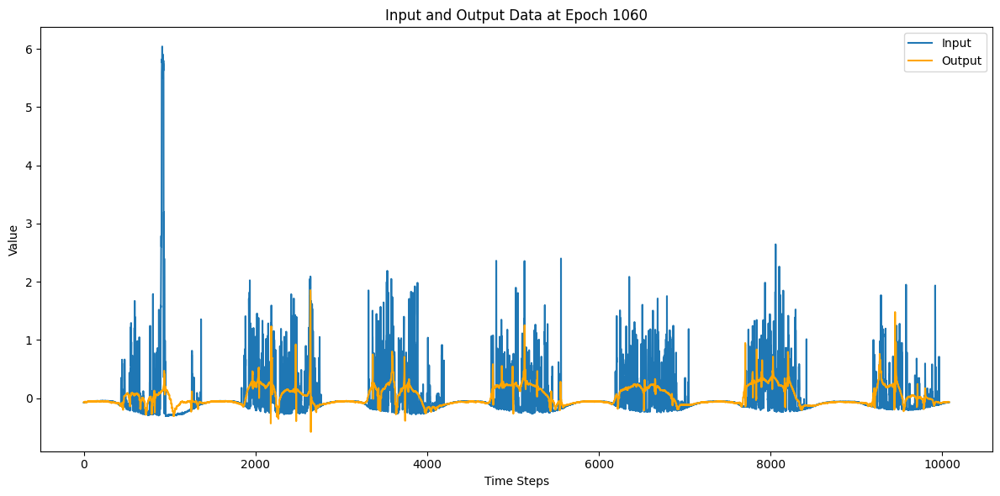

151/151 [==============================] - 13s 86ms/step - loss: 0.7023 - val_loss: 0.8866 - lr: 1.0000e-04
Epoch 1061/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7023 - val_loss: 0.8862 - lr: 1.0000e-04
Epoch 1062/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7023 - val_loss: 0.8863 - lr: 1.0000e-04
Epoch 1063/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7023 - val_loss: 0.8857 - lr: 1.0000e-04
Epoch 1064/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7024 - val_loss: 0.8871 - lr: 1.0000e-04
Epoch 1065/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7026 - val_loss: 0.8856 - lr: 1.0000e-04
Epoch 1066/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7023 - val_loss: 0.8855 - lr: 1.0000e-04
Epoch 1067/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7025 - val_loss: 0.8860 - lr: 1.0000e-04
Epoch 1068/10000


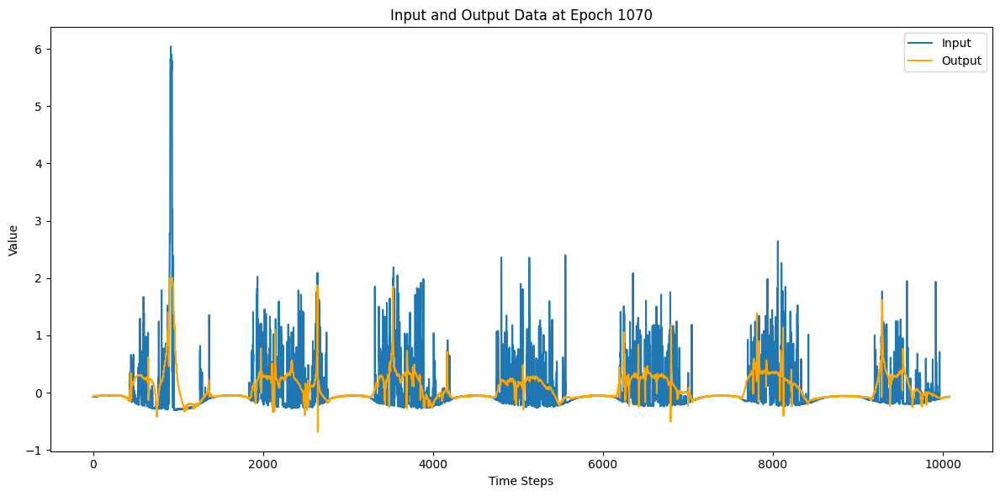

151/151 [==============================] - 13s 85ms/step - loss: 0.7024 - val_loss: 0.8871 - lr: 1.0000e-04
Epoch 1071/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7023 - val_loss: 0.8871 - lr: 1.0000e-04
Epoch 1072/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7023 - val_loss: 0.8863 - lr: 1.0000e-04
Epoch 1073/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7024 - val_loss: 0.8861 - lr: 1.0000e-04
Epoch 1074/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7033 - val_loss: 0.8861 - lr: 1.0000e-04
Epoch 1075/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7020 - val_loss: 0.8866 - lr: 1.0000e-04
Epoch 1076/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7024 - val_loss: 0.8872 - lr: 1.0000e-04
Epoch 1077/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7025 - val_loss: 0.8857 - lr: 1.0000e-04
Epoch 1078/10000


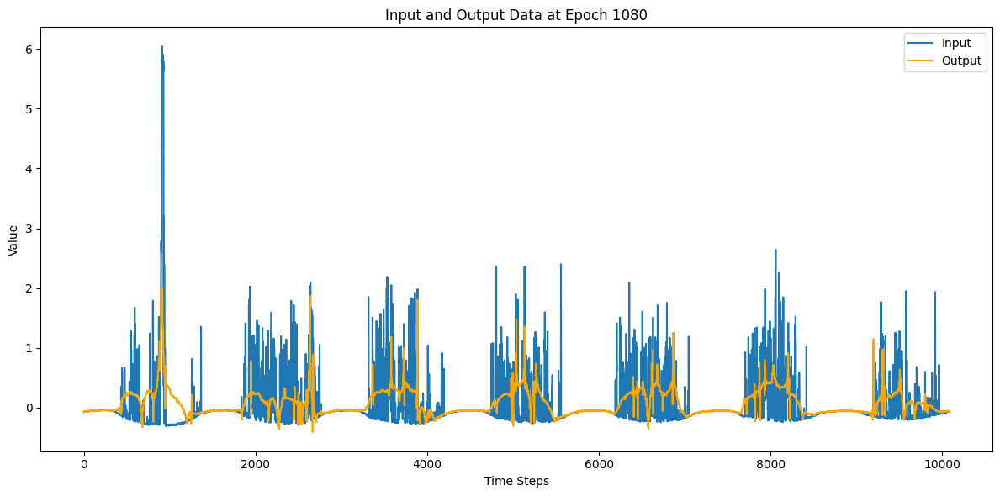

151/151 [==============================] - 13s 85ms/step - loss: 0.7072 - val_loss: 0.8858 - lr: 1.0000e-04
Epoch 1081/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7058 - val_loss: 0.8853 - lr: 1.0000e-04
Epoch 1082/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7023 - val_loss: 0.8860 - lr: 1.0000e-04
Epoch 1083/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7025 - val_loss: 0.8855 - lr: 1.0000e-04
Epoch 1084/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7024 - val_loss: 0.8860 - lr: 1.0000e-04
Epoch 1085/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7022 - val_loss: 0.8856 - lr: 1.0000e-04
Epoch 1086/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7022 - val_loss: 0.8863 - lr: 1.0000e-04
Epoch 1087/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7027 - val_loss: 0.8860 - lr: 1.0000e-04
Epoch 1088/10000


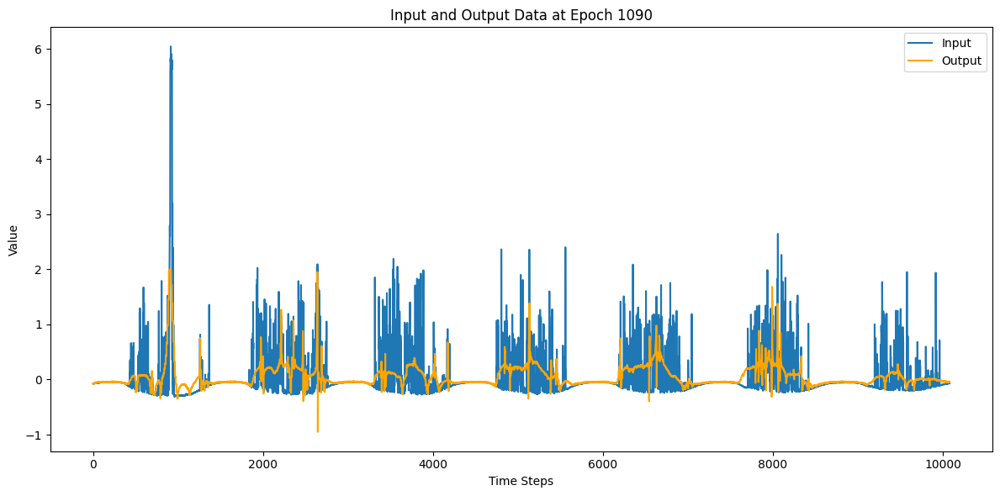

151/151 [==============================] - 14s 90ms/step - loss: 0.7022 - val_loss: 0.8867 - lr: 1.0000e-04
Epoch 1091/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7023 - val_loss: 0.8861 - lr: 1.0000e-04
Epoch 1092/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7024 - val_loss: 0.8856 - lr: 1.0000e-04
Epoch 1093/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7072 - val_loss: 0.8858 - lr: 1.0000e-04
Epoch 1094/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7023 - val_loss: 0.8861 - lr: 1.0000e-04
Epoch 1095/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7026 - val_loss: 0.8871 - lr: 1.0000e-04
Epoch 1096/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7022 - val_loss: 0.8867 - lr: 1.0000e-04
Epoch 1097/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7018 - val_loss: 0.8874 - lr: 1.0000e-04
Epoch 1098/10000


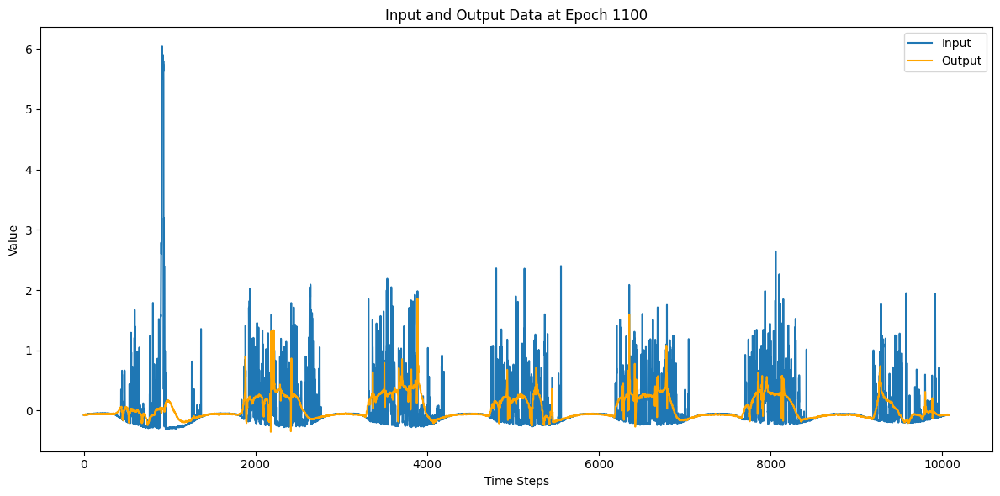

151/151 [==============================] - 13s 85ms/step - loss: 0.7078 - val_loss: 0.8857 - lr: 1.0000e-04
Epoch 1101/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7028 - val_loss: 0.8854 - lr: 1.0000e-04
Epoch 1102/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7021 - val_loss: 0.8861 - lr: 1.0000e-04
Epoch 1103/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7027 - val_loss: 0.8863 - lr: 1.0000e-04
Epoch 1104/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7023 - val_loss: 0.8856 - lr: 1.0000e-04
Epoch 1105/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7020 - val_loss: 0.8858 - lr: 1.0000e-04
Epoch 1106/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7043 - val_loss: 0.8862 - lr: 1.0000e-04
Epoch 1107/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7021 - val_loss: 0.8863 - lr: 1.0000e-04
Epoch 1108/10000


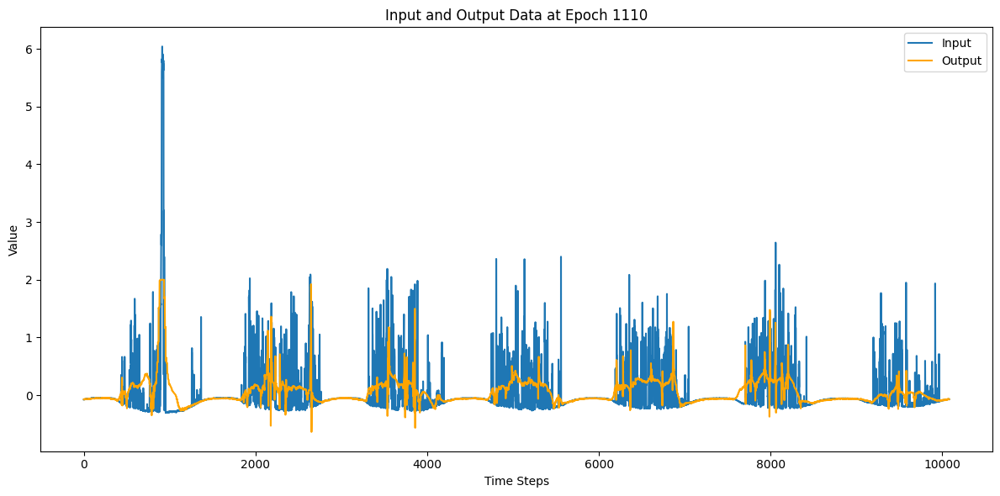

151/151 [==============================] - 13s 85ms/step - loss: 0.7025 - val_loss: 0.8861 - lr: 1.0000e-04
Epoch 1111/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7026 - val_loss: 0.8860 - lr: 1.0000e-04
Epoch 1112/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7137 - val_loss: 0.8865 - lr: 1.0000e-04
Epoch 1113/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7021 - val_loss: 0.8858 - lr: 1.0000e-04
Epoch 1114/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7021 - val_loss: 0.8859 - lr: 1.0000e-04
Epoch 1115/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7024 - val_loss: 0.8868 - lr: 1.0000e-04
Epoch 1116/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7021 - val_loss: 0.8864 - lr: 1.0000e-04
Epoch 1117/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7019 - val_loss: 0.8858 - lr: 1.0000e-04
Epoch 1118/10000


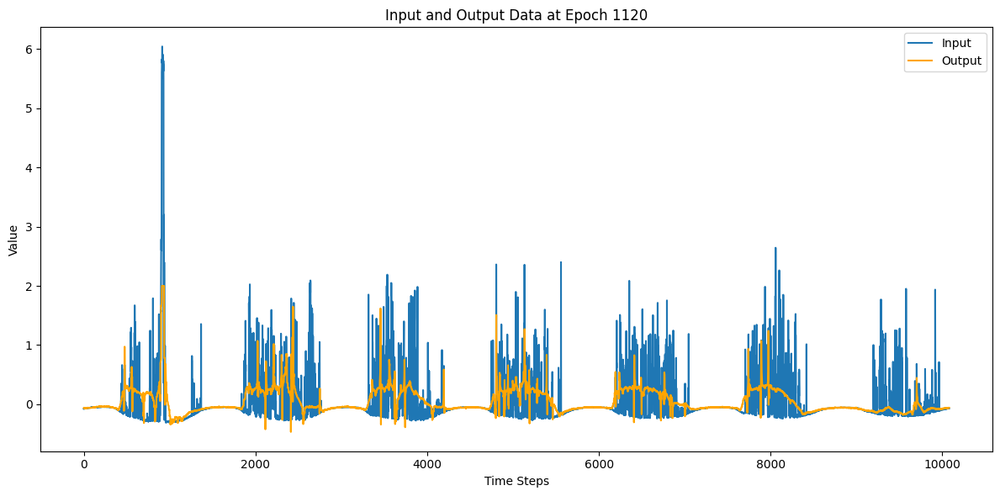

151/151 [==============================] - 13s 89ms/step - loss: 0.7024 - val_loss: 0.8867 - lr: 1.0000e-04
Epoch 1121/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7022 - val_loss: 0.8868 - lr: 1.0000e-04
Epoch 1122/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7020 - val_loss: 0.8860 - lr: 1.0000e-04
Epoch 1123/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7020 - val_loss: 0.8868 - lr: 1.0000e-04
Epoch 1124/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7021 - val_loss: 0.8862 - lr: 1.0000e-04
Epoch 1125/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7021 - val_loss: 0.8857 - lr: 1.0000e-04
Epoch 1126/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7022 - val_loss: 0.8856 - lr: 1.0000e-04
Epoch 1127/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7059 - val_loss: 0.8857 - lr: 1.0000e-04
Epoch 1128/10000


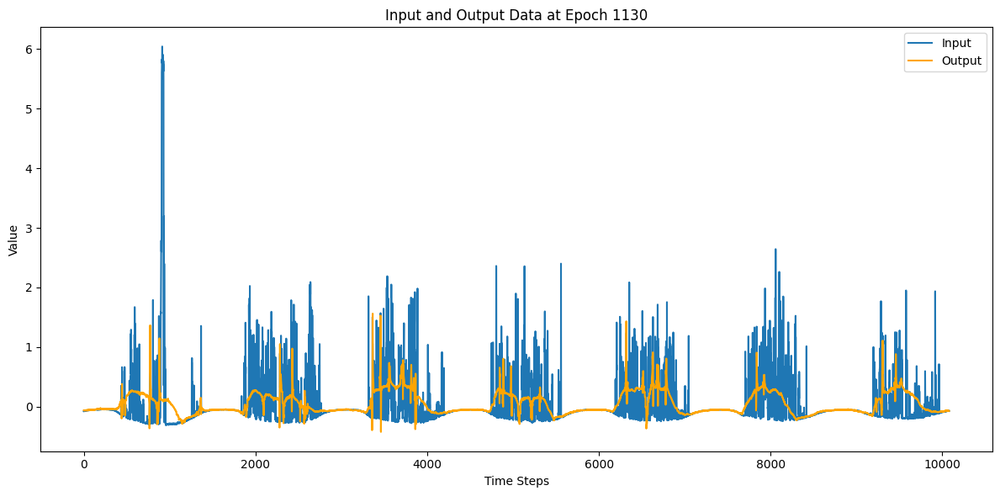

151/151 [==============================] - 13s 85ms/step - loss: 0.7022 - val_loss: 0.8864 - lr: 1.0000e-04
Epoch 1131/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7025 - val_loss: 0.8858 - lr: 1.0000e-04
Epoch 1132/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7024 - val_loss: 0.8859 - lr: 1.0000e-04
Epoch 1133/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7021 - val_loss: 0.8854 - lr: 1.0000e-04
Epoch 1134/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7021 - val_loss: 0.8866 - lr: 1.0000e-04
Epoch 1135/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7021 - val_loss: 0.8867 - lr: 1.0000e-04
Epoch 1136/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7024 - val_loss: 0.8857 - lr: 1.0000e-04
Epoch 1137/10000
151/151 [==============================] - ETA: 0s - loss: 0.7021
Epoch 1137: ReduceLROnPlateau reducing learning rate to 4.9

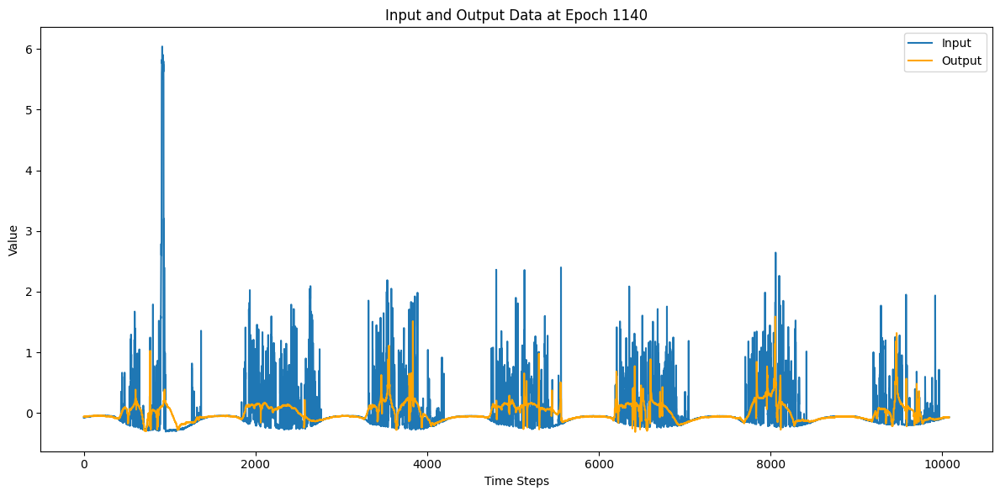

151/151 [==============================] - 13s 86ms/step - loss: 0.7016 - val_loss: 0.8861 - lr: 5.0000e-05
Epoch 1141/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7018 - val_loss: 0.8862 - lr: 5.0000e-05
Epoch 1142/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7016 - val_loss: 0.8863 - lr: 5.0000e-05
Epoch 1143/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7014 - val_loss: 0.8848 - lr: 5.0000e-05
Epoch 1144/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7015 - val_loss: 0.8858 - lr: 5.0000e-05
Epoch 1145/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7049 - val_loss: 0.8864 - lr: 5.0000e-05
Epoch 1146/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7012 - val_loss: 0.8852 - lr: 5.0000e-05
Epoch 1147/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7012 - val_loss: 0.8855 - lr: 5.0000e-05
Epoch 1148/10000


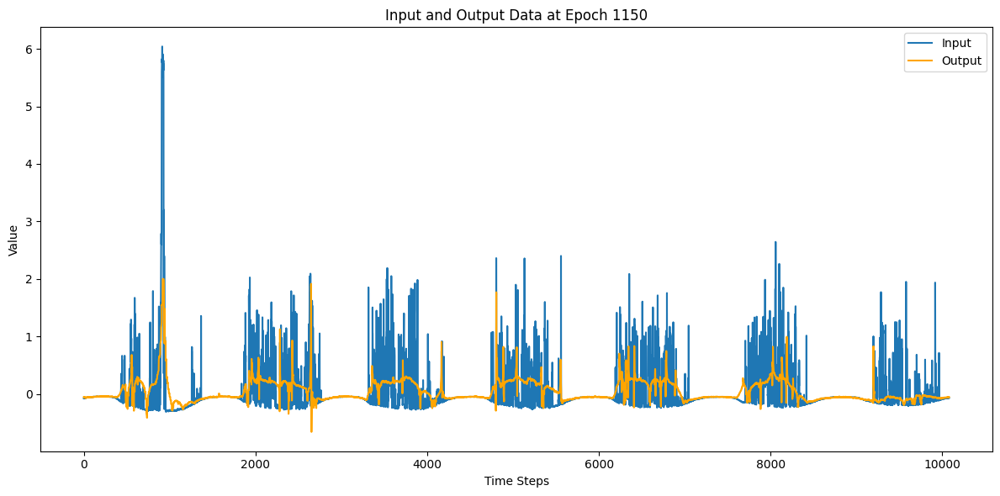

151/151 [==============================] - 13s 85ms/step - loss: 0.7012 - val_loss: 0.8848 - lr: 5.0000e-05
Epoch 1151/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7016 - val_loss: 0.8850 - lr: 5.0000e-05
Epoch 1152/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7130 - val_loss: 0.8852 - lr: 5.0000e-05
Epoch 1153/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7023 - val_loss: 0.8852 - lr: 5.0000e-05
Epoch 1154/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7129 - val_loss: 0.8854 - lr: 5.0000e-05
Epoch 1155/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7011 - val_loss: 0.8851 - lr: 5.0000e-05
Epoch 1156/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7019 - val_loss: 0.8854 - lr: 5.0000e-05
Epoch 1157/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7015 - val_loss: 0.8849 - lr: 5.0000e-05
Epoch 1158/10000


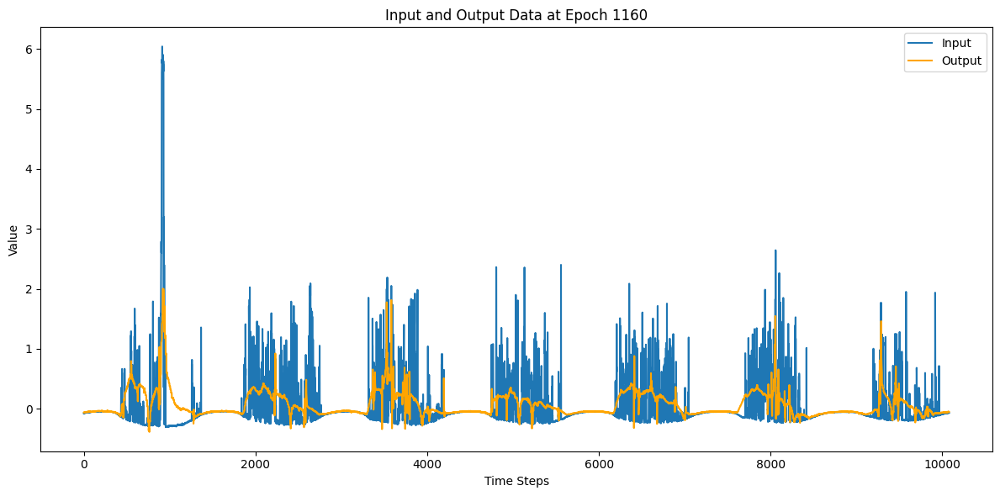

151/151 [==============================] - 13s 85ms/step - loss: 0.7036 - val_loss: 0.8859 - lr: 5.0000e-05
Epoch 1161/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7011 - val_loss: 0.8860 - lr: 5.0000e-05
Epoch 1162/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7013 - val_loss: 0.8851 - lr: 5.0000e-05
Epoch 1163/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7012 - val_loss: 0.8861 - lr: 5.0000e-05
Epoch 1164/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7013 - val_loss: 0.8859 - lr: 5.0000e-05
Epoch 1165/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7014 - val_loss: 0.8852 - lr: 5.0000e-05
Epoch 1166/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7033 - val_loss: 0.8849 - lr: 5.0000e-05
Epoch 1167/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7029 - val_loss: 0.8854 - lr: 5.0000e-05
Epoch 1168/10000


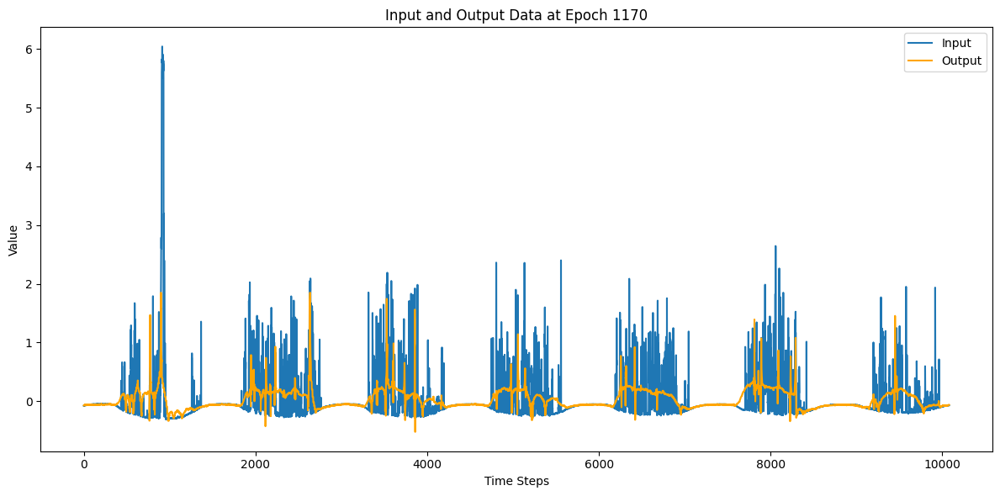

151/151 [==============================] - 13s 86ms/step - loss: 0.7016 - val_loss: 0.8861 - lr: 5.0000e-05
Epoch 1171/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7016 - val_loss: 0.8847 - lr: 5.0000e-05
Epoch 1172/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7013 - val_loss: 0.8847 - lr: 5.0000e-05
Epoch 1173/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7051 - val_loss: 0.8857 - lr: 5.0000e-05
Epoch 1174/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7011 - val_loss: 0.8850 - lr: 5.0000e-05
Epoch 1175/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7013 - val_loss: 0.8850 - lr: 5.0000e-05
Epoch 1176/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7016 - val_loss: 0.8856 - lr: 5.0000e-05
Epoch 1177/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7011 - val_loss: 0.8859 - lr: 5.0000e-05
Epoch 1178/10000


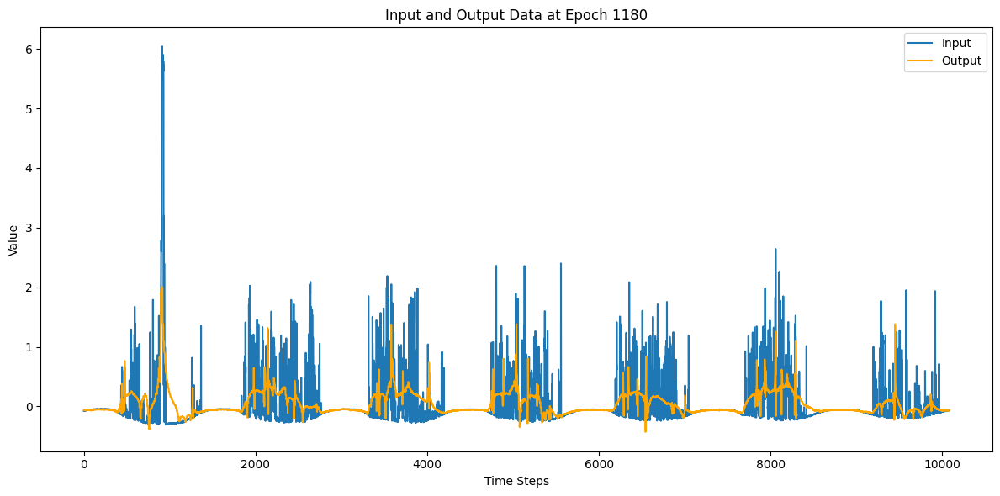

151/151 [==============================] - 13s 84ms/step - loss: 0.7012 - val_loss: 0.8851 - lr: 5.0000e-05
Epoch 1181/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7015 - val_loss: 0.8857 - lr: 5.0000e-05
Epoch 1182/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7012 - val_loss: 0.8856 - lr: 5.0000e-05
Epoch 1183/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7013 - val_loss: 0.8854 - lr: 5.0000e-05
Epoch 1184/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.7012 - val_loss: 0.8860 - lr: 5.0000e-05
Epoch 1185/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7068 - val_loss: 0.8860 - lr: 5.0000e-05
Epoch 1186/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7011 - val_loss: 0.8861 - lr: 5.0000e-05
Epoch 1187/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7010 - val_loss: 0.8854 - lr: 5.0000e-05
Epoch 1188/10000


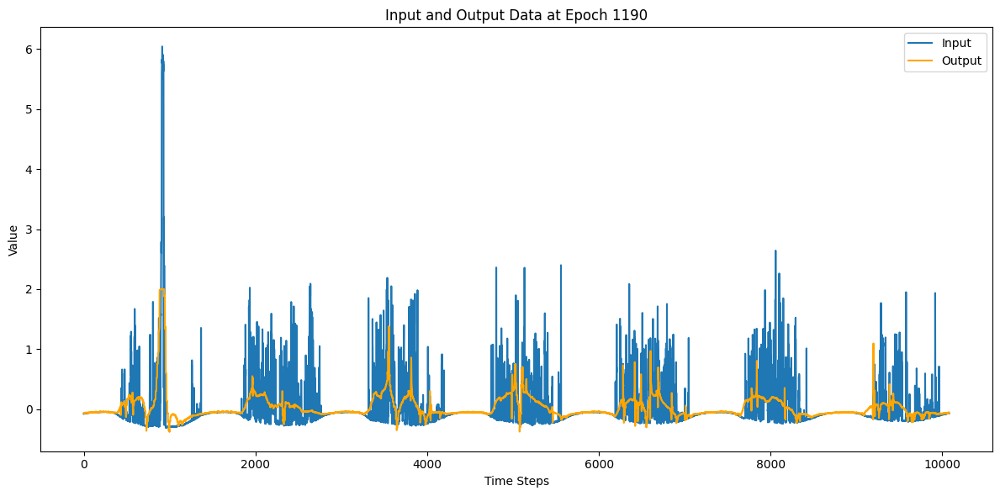

151/151 [==============================] - 13s 85ms/step - loss: 0.7014 - val_loss: 0.8858 - lr: 5.0000e-05
Epoch 1191/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7013 - val_loss: 0.8862 - lr: 5.0000e-05
Epoch 1192/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7032 - val_loss: 0.8850 - lr: 5.0000e-05
Epoch 1193/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7012 - val_loss: 0.8855 - lr: 5.0000e-05
Epoch 1194/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7013 - val_loss: 0.8853 - lr: 5.0000e-05
Epoch 1195/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7010 - val_loss: 0.8860 - lr: 5.0000e-05
Epoch 1196/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7011 - val_loss: 0.8843 - lr: 5.0000e-05
Epoch 1197/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7012 - val_loss: 0.8857 - lr: 5.0000e-05
Epoch 1198/10000


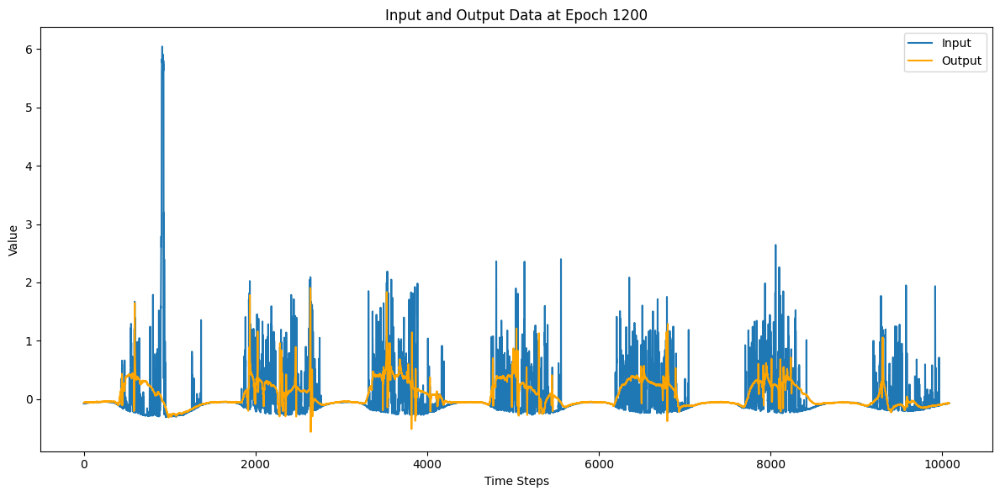

151/151 [==============================] - 13s 86ms/step - loss: 0.7009 - val_loss: 0.8863 - lr: 5.0000e-05
Epoch 1201/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7010 - val_loss: 0.8860 - lr: 5.0000e-05
Epoch 1202/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7012 - val_loss: 0.8872 - lr: 5.0000e-05
Epoch 1203/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7007 - val_loss: 0.8853 - lr: 5.0000e-05
Epoch 1204/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7013 - val_loss: 0.8847 - lr: 5.0000e-05
Epoch 1205/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7011 - val_loss: 0.8851 - lr: 5.0000e-05
Epoch 1206/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7026 - val_loss: 0.8862 - lr: 5.0000e-05
Epoch 1207/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7006 - val_loss: 0.8857 - lr: 5.0000e-05
Epoch 1208/10000


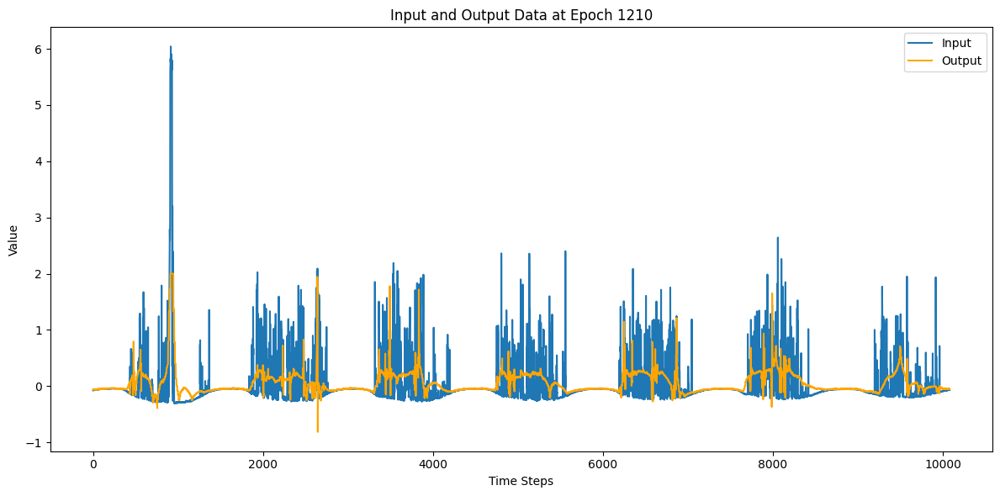

151/151 [==============================] - 13s 86ms/step - loss: 0.7010 - val_loss: 0.8858 - lr: 5.0000e-05
Epoch 1211/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7011 - val_loss: 0.8851 - lr: 5.0000e-05
Epoch 1212/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7012 - val_loss: 0.8849 - lr: 5.0000e-05
Epoch 1213/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7015 - val_loss: 0.8854 - lr: 5.0000e-05
Epoch 1214/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7027 - val_loss: 0.8849 - lr: 5.0000e-05
Epoch 1215/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7010 - val_loss: 0.8864 - lr: 5.0000e-05
Epoch 1216/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7013 - val_loss: 0.8850 - lr: 5.0000e-05
Epoch 1217/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.7058 - val_loss: 0.8853 - lr: 5.0000e-05
Epoch 1218/10000


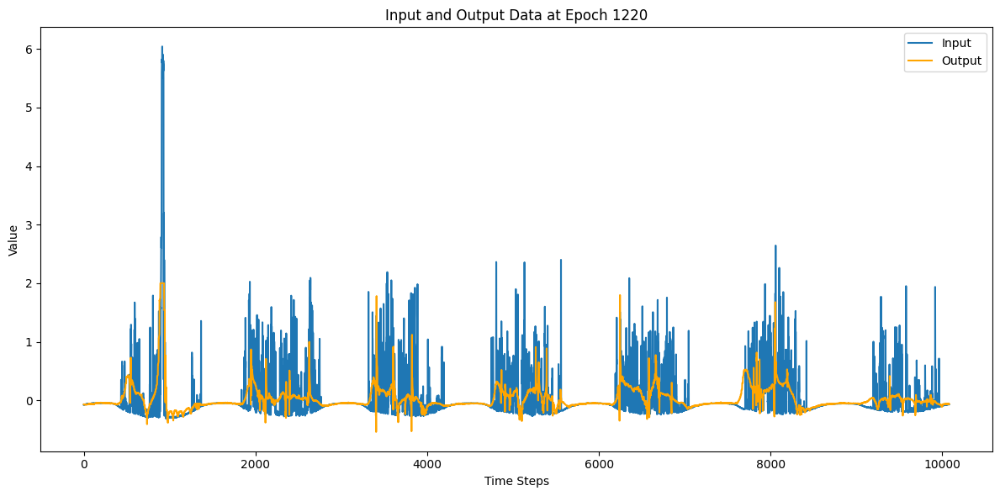

151/151 [==============================] - 13s 86ms/step - loss: 0.7011 - val_loss: 0.8861 - lr: 5.0000e-05
Epoch 1221/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7043 - val_loss: 0.8857 - lr: 5.0000e-05
Epoch 1222/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7011 - val_loss: 0.8853 - lr: 5.0000e-05
Epoch 1223/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7008 - val_loss: 0.8853 - lr: 5.0000e-05
Epoch 1224/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7011 - val_loss: 0.8853 - lr: 5.0000e-05
Epoch 1225/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7013 - val_loss: 0.8857 - lr: 5.0000e-05
Epoch 1226/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7007 - val_loss: 0.8850 - lr: 5.0000e-05
Epoch 1227/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7010 - val_loss: 0.8848 - lr: 5.0000e-05
Epoch 1228/10000


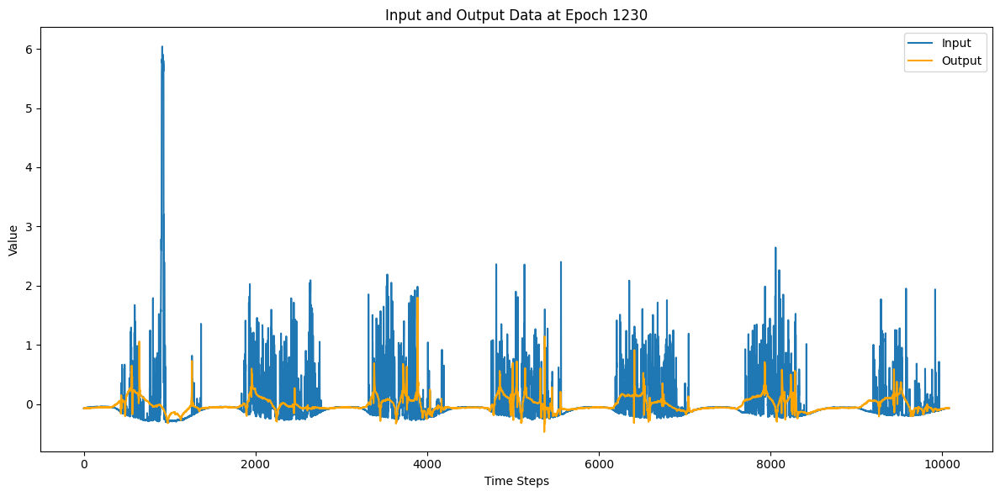

151/151 [==============================] - 13s 85ms/step - loss: 0.7010 - val_loss: 0.8847 - lr: 5.0000e-05
Epoch 1231/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7047 - val_loss: 0.8851 - lr: 5.0000e-05
Epoch 1232/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7011 - val_loss: 0.8853 - lr: 5.0000e-05
Epoch 1233/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7009 - val_loss: 0.8854 - lr: 5.0000e-05
Epoch 1234/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7012 - val_loss: 0.8866 - lr: 5.0000e-05
Epoch 1235/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7011 - val_loss: 0.8859 - lr: 5.0000e-05
Epoch 1236/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7011 - val_loss: 0.8851 - lr: 5.0000e-05
Epoch 1237/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7010 - val_loss: 0.8850 - lr: 5.0000e-05
Epoch 1238/10000


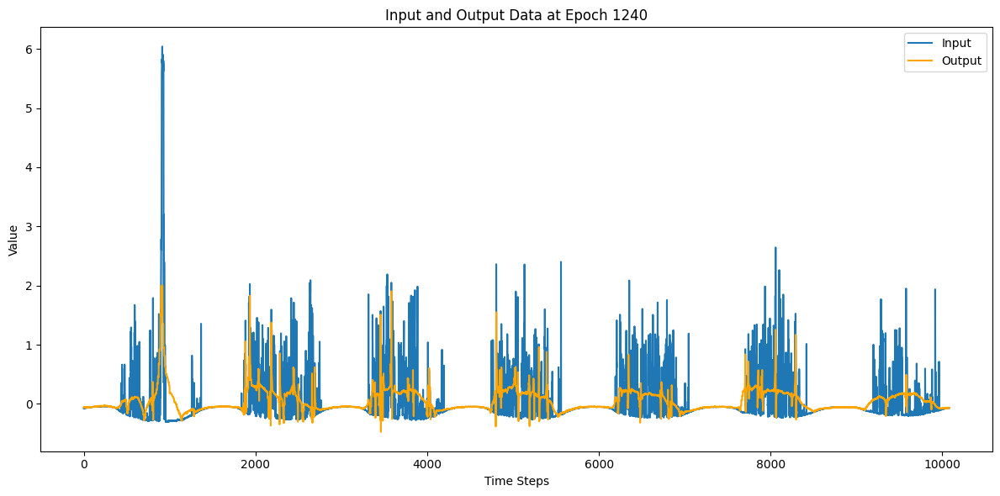

151/151 [==============================] - 13s 85ms/step - loss: 0.7009 - val_loss: 0.8857 - lr: 5.0000e-05
Epoch 1241/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7028 - val_loss: 0.8849 - lr: 5.0000e-05
Epoch 1242/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7009 - val_loss: 0.8853 - lr: 5.0000e-05
Epoch 1243/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7010 - val_loss: 0.8853 - lr: 5.0000e-05
Epoch 1244/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7011 - val_loss: 0.8856 - lr: 5.0000e-05
Epoch 1245/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7032 - val_loss: 0.8857 - lr: 5.0000e-05
Epoch 1246/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7009 - val_loss: 0.8853 - lr: 5.0000e-05
Epoch 1247/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7080 - val_loss: 0.8851 - lr: 5.0000e-05
Epoch 1248/10000


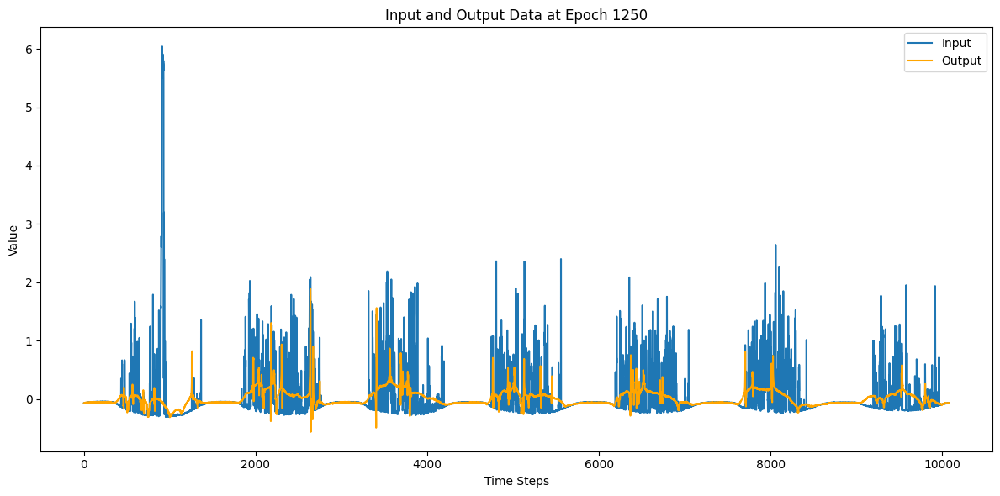

151/151 [==============================] - 13s 86ms/step - loss: 0.7008 - val_loss: 0.8850 - lr: 5.0000e-05
Epoch 1251/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7006 - val_loss: 0.8857 - lr: 5.0000e-05
Epoch 1252/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7010 - val_loss: 0.8859 - lr: 5.0000e-05
Epoch 1253/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7008 - val_loss: 0.8857 - lr: 5.0000e-05
Epoch 1254/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7032 - val_loss: 0.8860 - lr: 5.0000e-05
Epoch 1255/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7008 - val_loss: 0.8851 - lr: 5.0000e-05
Epoch 1256/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7123 - val_loss: 0.8847 - lr: 5.0000e-05
Epoch 1257/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7057 - val_loss: 0.8854 - lr: 5.0000e-05
Epoch 1258/10000


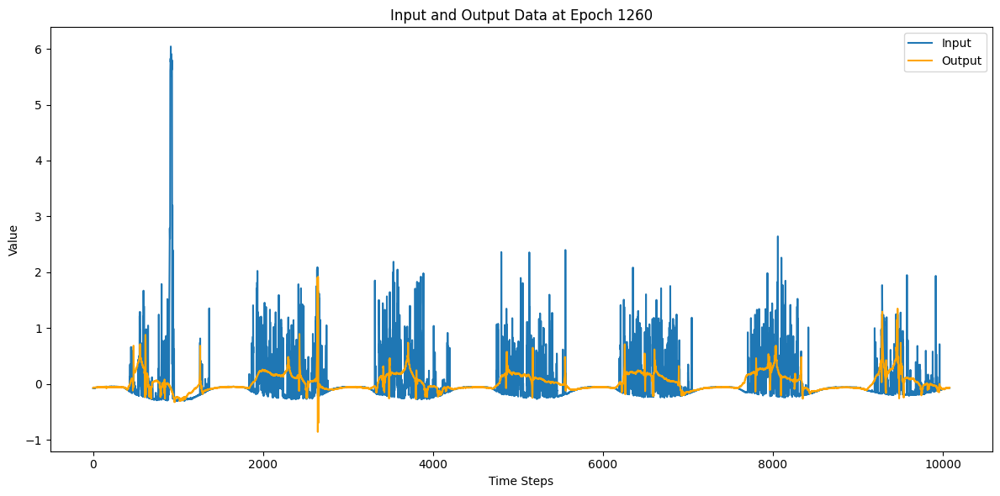

151/151 [==============================] - 13s 85ms/step - loss: 0.7012 - val_loss: 0.8850 - lr: 5.0000e-05
Epoch 1261/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7007 - val_loss: 0.8858 - lr: 5.0000e-05
Epoch 1262/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7006 - val_loss: 0.8854 - lr: 5.0000e-05
Epoch 1263/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7013 - val_loss: 0.8849 - lr: 5.0000e-05
Epoch 1264/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7009 - val_loss: 0.8846 - lr: 5.0000e-05
Epoch 1265/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7010 - val_loss: 0.8852 - lr: 5.0000e-05
Epoch 1266/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7011 - val_loss: 0.8854 - lr: 5.0000e-05
Epoch 1267/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7006 - val_loss: 0.8845 - lr: 5.0000e-05
Epoch 1268/10000


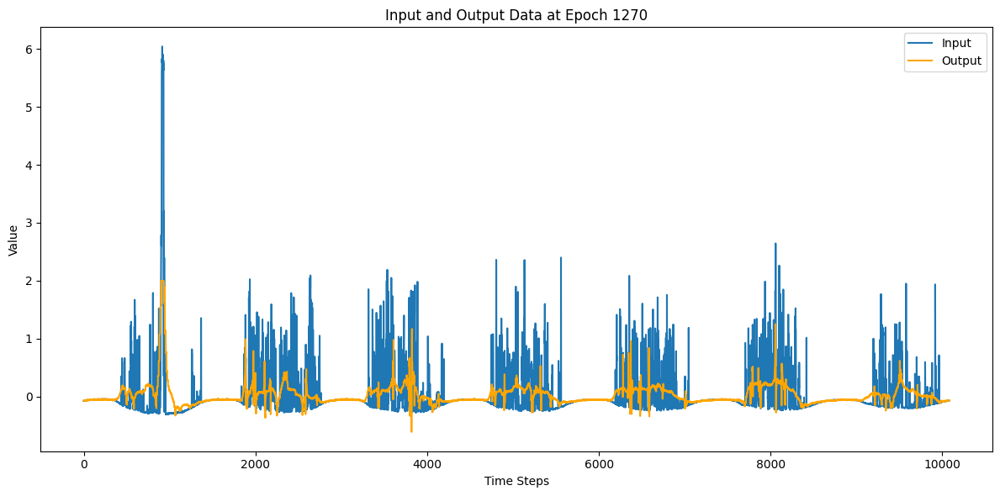

151/151 [==============================] - 13s 86ms/step - loss: 0.7049 - val_loss: 0.8845 - lr: 5.0000e-05
Epoch 1271/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7006 - val_loss: 0.8852 - lr: 5.0000e-05
Epoch 1272/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7047 - val_loss: 0.8852 - lr: 5.0000e-05
Epoch 1273/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7009 - val_loss: 0.8861 - lr: 5.0000e-05
Epoch 1274/10000
151/151 [==============================] - 12s 78ms/step - loss: 0.7007 - val_loss: 0.8850 - lr: 5.0000e-05
Epoch 1275/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7017 - val_loss: 0.8861 - lr: 5.0000e-05
Epoch 1276/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7008 - val_loss: 0.8854 - lr: 5.0000e-05
Epoch 1277/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7008 - val_loss: 0.8853 - lr: 5.0000e-05
Epoch 1278/10000


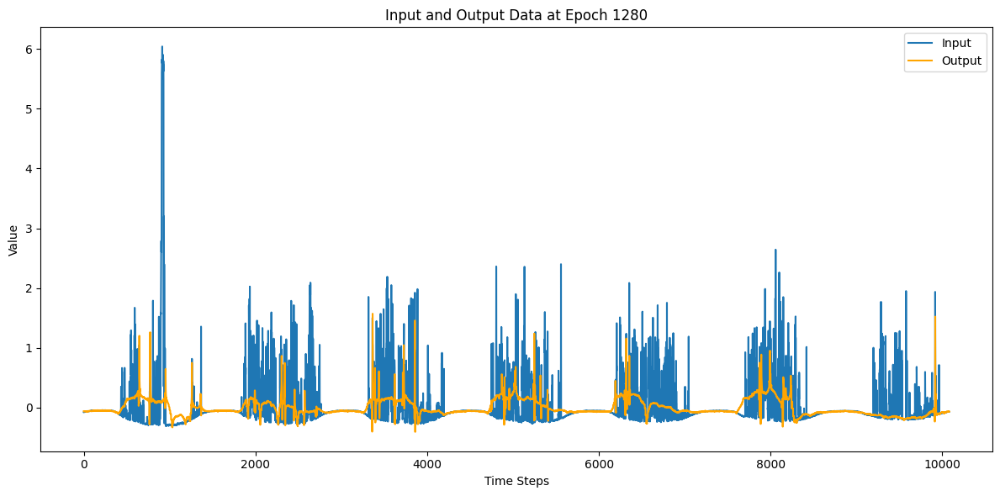

151/151 [==============================] - 14s 90ms/step - loss: 0.7008 - val_loss: 0.8856 - lr: 5.0000e-05
Epoch 1281/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7008 - val_loss: 0.8846 - lr: 5.0000e-05
Epoch 1282/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7008 - val_loss: 0.8854 - lr: 5.0000e-05
Epoch 1283/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7164 - val_loss: 0.8860 - lr: 5.0000e-05
Epoch 1284/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7010 - val_loss: 0.8855 - lr: 5.0000e-05
Epoch 1285/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7005 - val_loss: 0.8841 - lr: 5.0000e-05
Epoch 1286/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7008 - val_loss: 0.8850 - lr: 5.0000e-05
Epoch 1287/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7011 - val_loss: 0.8864 - lr: 5.0000e-05
Epoch 1288/10000


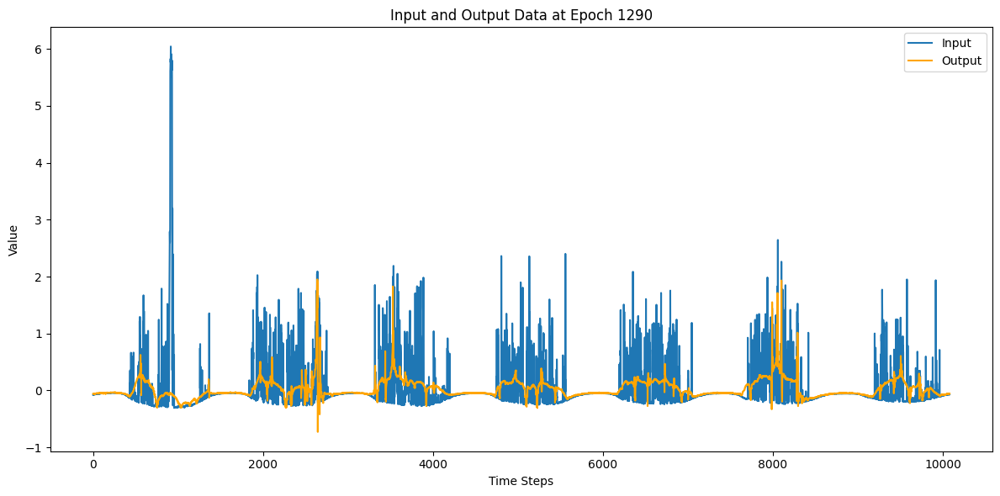

151/151 [==============================] - 13s 86ms/step - loss: 0.7009 - val_loss: 0.8848 - lr: 5.0000e-05
Epoch 1291/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7005 - val_loss: 0.8857 - lr: 5.0000e-05
Epoch 1292/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7007 - val_loss: 0.8860 - lr: 5.0000e-05
Epoch 1293/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7010 - val_loss: 0.8853 - lr: 5.0000e-05
Epoch 1294/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7007 - val_loss: 0.8842 - lr: 5.0000e-05
Epoch 1295/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7007 - val_loss: 0.8862 - lr: 5.0000e-05
Epoch 1296/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7006 - val_loss: 0.8850 - lr: 5.0000e-05
Epoch 1297/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7006 - val_loss: 0.8857 - lr: 5.0000e-05
Epoch 1298/10000


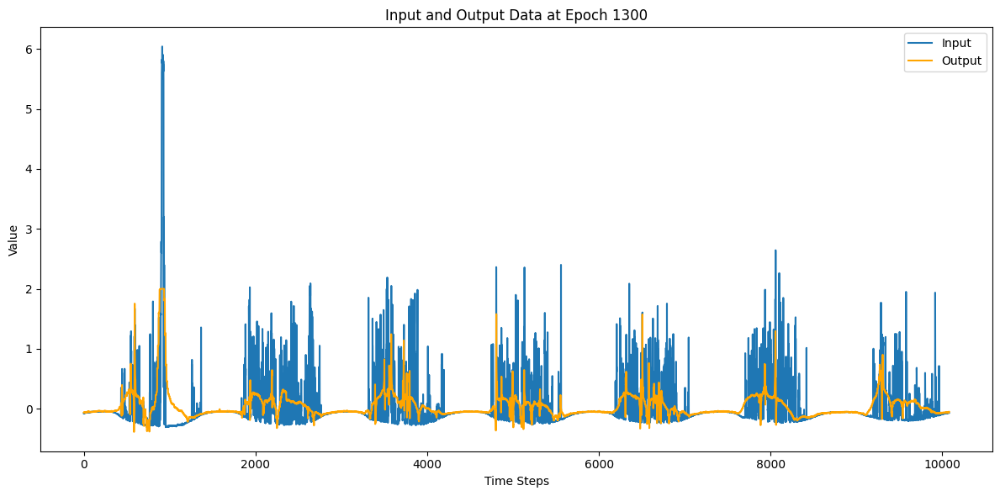

151/151 [==============================] - 13s 85ms/step - loss: 0.7007 - val_loss: 0.8841 - lr: 5.0000e-05
Epoch 1301/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7123 - val_loss: 0.8856 - lr: 5.0000e-05
Epoch 1302/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7008 - val_loss: 0.8866 - lr: 5.0000e-05
Epoch 1303/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7008 - val_loss: 0.8855 - lr: 5.0000e-05
Epoch 1304/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7051 - val_loss: 0.8852 - lr: 5.0000e-05
Epoch 1305/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7006 - val_loss: 0.8858 - lr: 5.0000e-05
Epoch 1306/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7007 - val_loss: 0.8859 - lr: 5.0000e-05
Epoch 1307/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7006 - val_loss: 0.8860 - lr: 5.0000e-05
Epoch 1308/10000


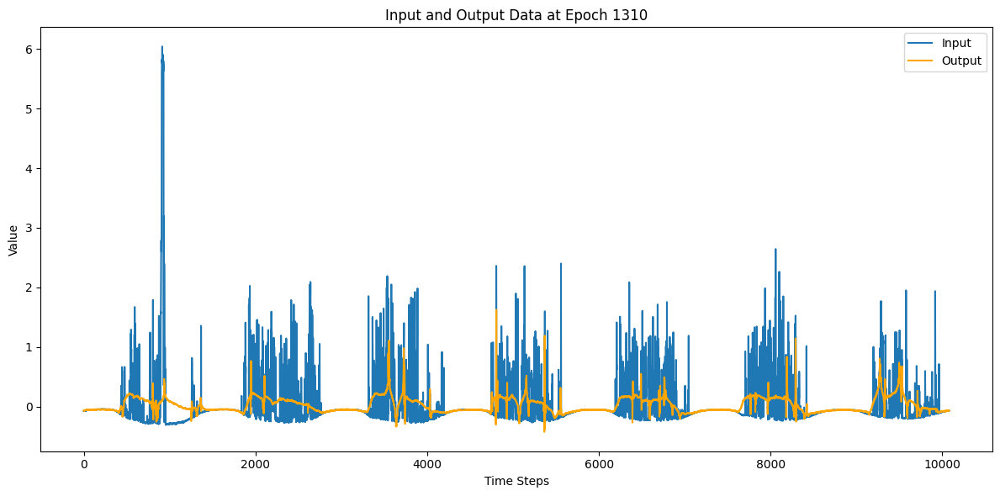

151/151 [==============================] - 13s 85ms/step - loss: 0.7007 - val_loss: 0.8854 - lr: 5.0000e-05
Epoch 1311/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.7009 - val_loss: 0.8848 - lr: 5.0000e-05
Epoch 1312/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7007 - val_loss: 0.8852 - lr: 5.0000e-05
Epoch 1313/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7014 - val_loss: 0.8852 - lr: 5.0000e-05
Epoch 1314/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7007 - val_loss: 0.8855 - lr: 5.0000e-05
Epoch 1315/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7011 - val_loss: 0.8853 - lr: 5.0000e-05
Epoch 1316/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7043 - val_loss: 0.8858 - lr: 5.0000e-05
Epoch 1317/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7043 - val_loss: 0.8854 - lr: 5.0000e-05
Epoch 1318/10000


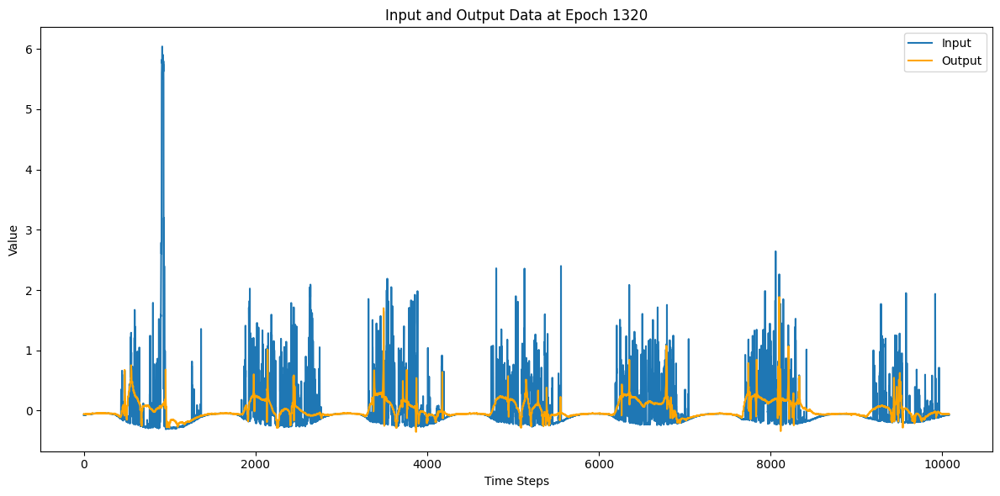

151/151 [==============================] - 13s 86ms/step - loss: 0.7011 - val_loss: 0.8852 - lr: 5.0000e-05
Epoch 1321/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7004 - val_loss: 0.8850 - lr: 5.0000e-05
Epoch 1322/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7036 - val_loss: 0.8859 - lr: 5.0000e-05
Epoch 1323/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7008 - val_loss: 0.8852 - lr: 5.0000e-05
Epoch 1324/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7004 - val_loss: 0.8846 - lr: 5.0000e-05
Epoch 1325/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7007 - val_loss: 0.8851 - lr: 5.0000e-05
Epoch 1326/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7006 - val_loss: 0.8848 - lr: 5.0000e-05
Epoch 1327/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7021 - val_loss: 0.8847 - lr: 5.0000e-05
Epoch 1328/10000


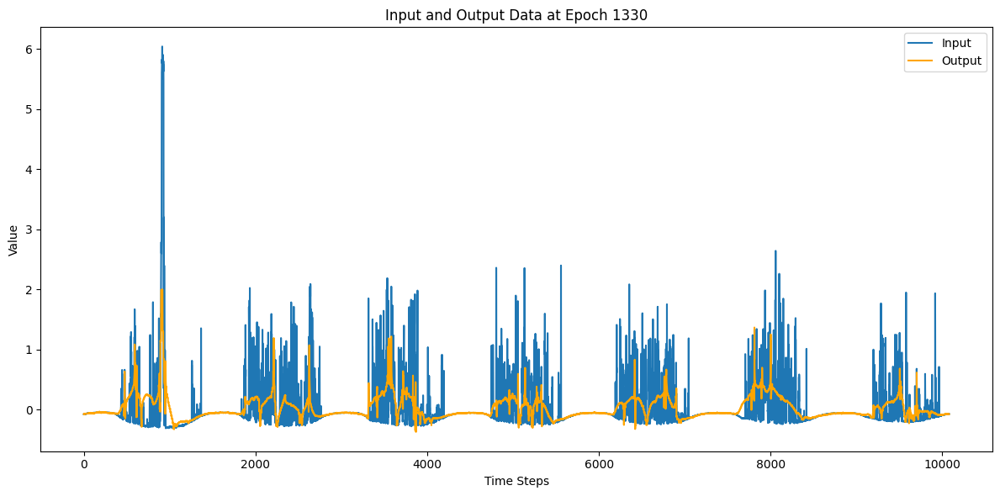

151/151 [==============================] - 13s 85ms/step - loss: 0.7005 - val_loss: 0.8850 - lr: 5.0000e-05
Epoch 1331/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7004 - val_loss: 0.8860 - lr: 5.0000e-05
Epoch 1332/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7008 - val_loss: 0.8852 - lr: 5.0000e-05
Epoch 1333/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7016 - val_loss: 0.8849 - lr: 5.0000e-05
Epoch 1334/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7046 - val_loss: 0.8843 - lr: 5.0000e-05
Epoch 1335/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7007 - val_loss: 0.8852 - lr: 5.0000e-05
Epoch 1336/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7078 - val_loss: 0.8851 - lr: 5.0000e-05
Epoch 1337/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7027 - val_loss: 0.8856 - lr: 5.0000e-05
Epoch 1338/10000


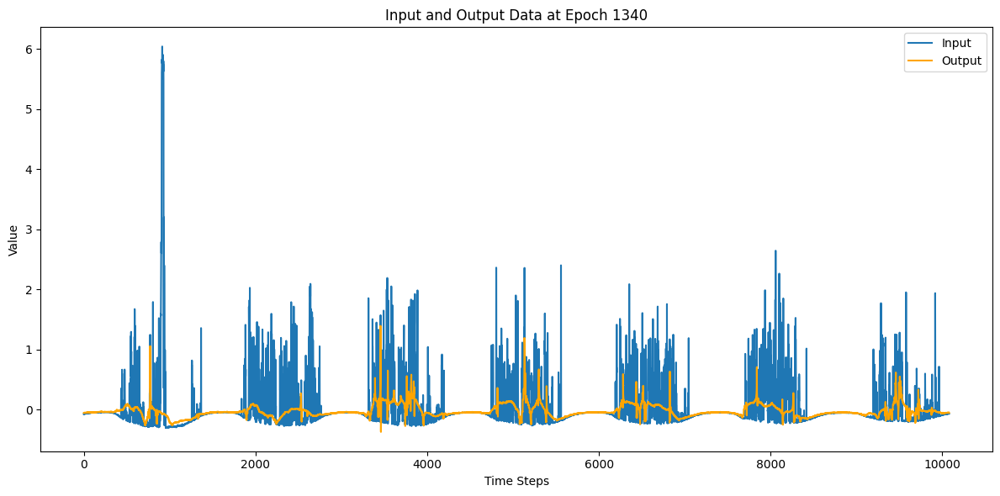

151/151 [==============================] - 13s 85ms/step - loss: 0.7012 - val_loss: 0.8850 - lr: 5.0000e-05
Epoch 1341/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7008 - val_loss: 0.8857 - lr: 5.0000e-05
Epoch 1342/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7025 - val_loss: 0.8858 - lr: 5.0000e-05
Epoch 1343/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7005 - val_loss: 0.8851 - lr: 5.0000e-05
Epoch 1344/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7005 - val_loss: 0.8842 - lr: 5.0000e-05
Epoch 1345/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7005 - val_loss: 0.8858 - lr: 5.0000e-05
Epoch 1346/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7005 - val_loss: 0.8855 - lr: 5.0000e-05
Epoch 1347/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7006 - val_loss: 0.8844 - lr: 5.0000e-05
Epoch 1348/10000


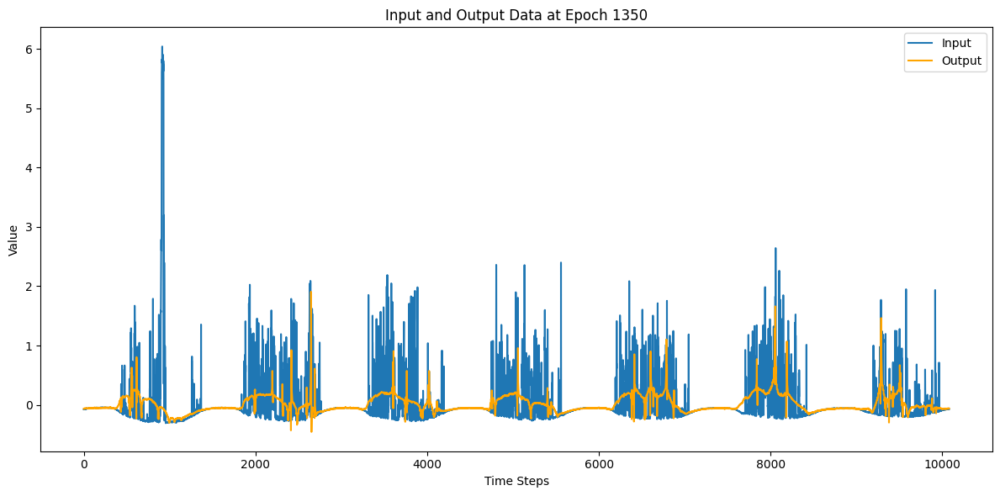

151/151 [==============================] - 13s 86ms/step - loss: 0.7007 - val_loss: 0.8848 - lr: 5.0000e-05
Epoch 1351/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7009 - val_loss: 0.8845 - lr: 5.0000e-05
Epoch 1352/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7038 - val_loss: 0.8859 - lr: 5.0000e-05
Epoch 1353/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7005 - val_loss: 0.8854 - lr: 5.0000e-05
Epoch 1354/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7006 - val_loss: 0.8859 - lr: 5.0000e-05
Epoch 1355/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7006 - val_loss: 0.8850 - lr: 5.0000e-05
Epoch 1356/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7006 - val_loss: 0.8846 - lr: 5.0000e-05
Epoch 1357/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7023 - val_loss: 0.8865 - lr: 5.0000e-05
Epoch 1358/10000


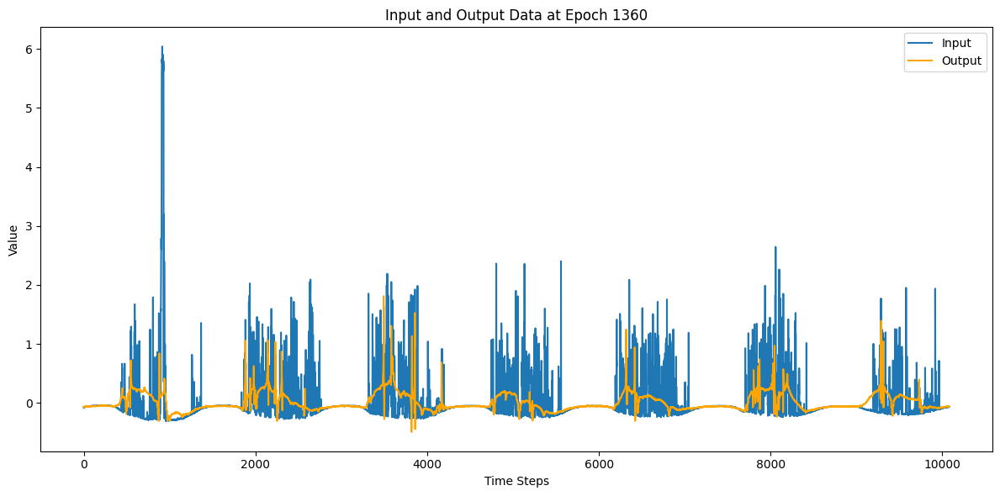

151/151 [==============================] - 13s 86ms/step - loss: 0.7010 - val_loss: 0.8854 - lr: 5.0000e-05
Epoch 1361/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7006 - val_loss: 0.8857 - lr: 5.0000e-05
Epoch 1362/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7023 - val_loss: 0.8850 - lr: 5.0000e-05
Epoch 1363/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7008 - val_loss: 0.8860 - lr: 5.0000e-05
Epoch 1364/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7050 - val_loss: 0.8849 - lr: 5.0000e-05
Epoch 1365/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7004 - val_loss: 0.8849 - lr: 5.0000e-05
Epoch 1366/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7005 - val_loss: 0.8853 - lr: 5.0000e-05
Epoch 1367/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7005 - val_loss: 0.8850 - lr: 5.0000e-05
Epoch 1368/10000


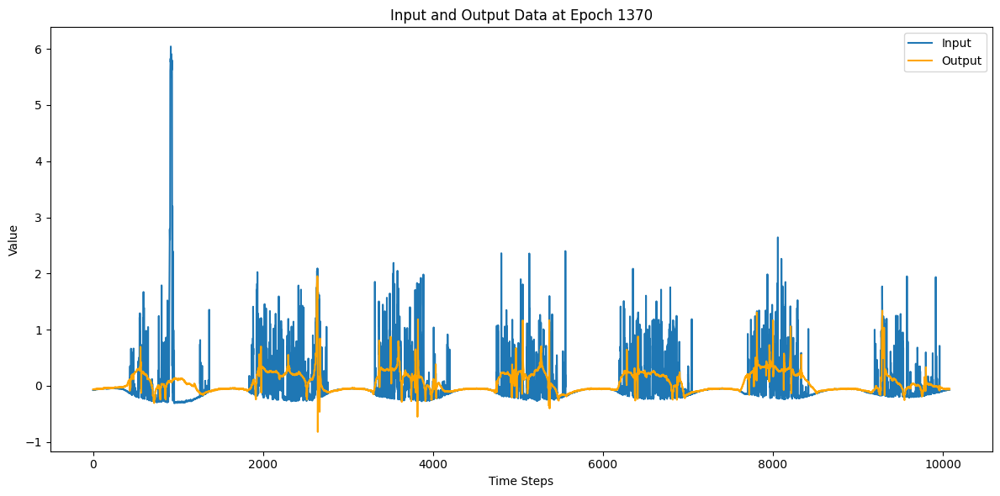

151/151 [==============================] - 13s 87ms/step - loss: 0.7008 - val_loss: 0.8841 - lr: 5.0000e-05
Epoch 1371/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7005 - val_loss: 0.8859 - lr: 5.0000e-05
Epoch 1372/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7006 - val_loss: 0.8856 - lr: 5.0000e-05
Epoch 1373/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7003 - val_loss: 0.8852 - lr: 5.0000e-05
Epoch 1374/10000
151/151 [==============================] - 13s 85ms/step - loss: 0.7016 - val_loss: 0.8851 - lr: 5.0000e-05
Epoch 1375/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7005 - val_loss: 0.8849 - lr: 5.0000e-05
Epoch 1376/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7010 - val_loss: 0.8840 - lr: 5.0000e-05
Epoch 1377/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7002 - val_loss: 0.8856 - lr: 5.0000e-05
Epoch 1378/10000


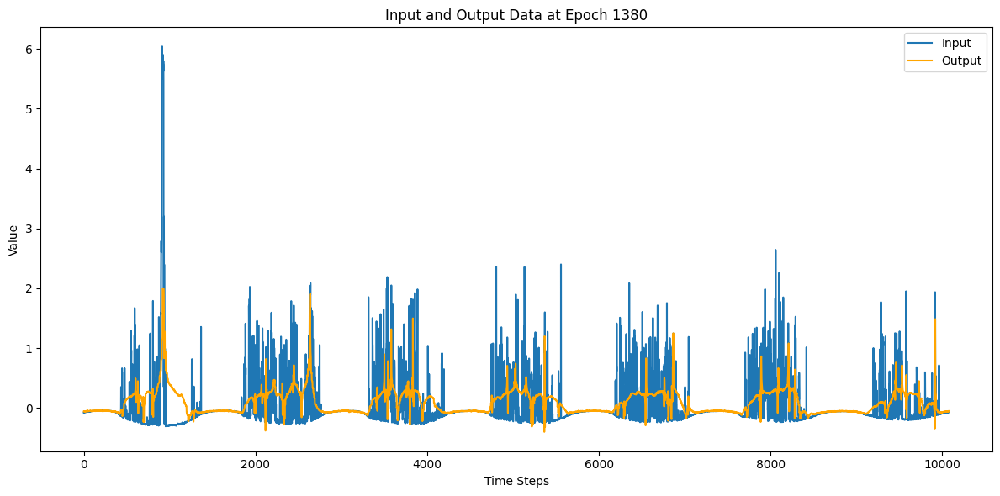

151/151 [==============================] - 13s 86ms/step - loss: 0.7006 - val_loss: 0.8858 - lr: 5.0000e-05
Epoch 1381/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7006 - val_loss: 0.8849 - lr: 5.0000e-05
Epoch 1382/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7011 - val_loss: 0.8846 - lr: 5.0000e-05
Epoch 1383/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7004 - val_loss: 0.8845 - lr: 5.0000e-05
Epoch 1384/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7005 - val_loss: 0.8856 - lr: 5.0000e-05
Epoch 1385/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7005 - val_loss: 0.8861 - lr: 5.0000e-05
Epoch 1386/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7043 - val_loss: 0.8858 - lr: 5.0000e-05
Epoch 1387/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7006 - val_loss: 0.8854 - lr: 5.0000e-05
Epoch 1388/10000


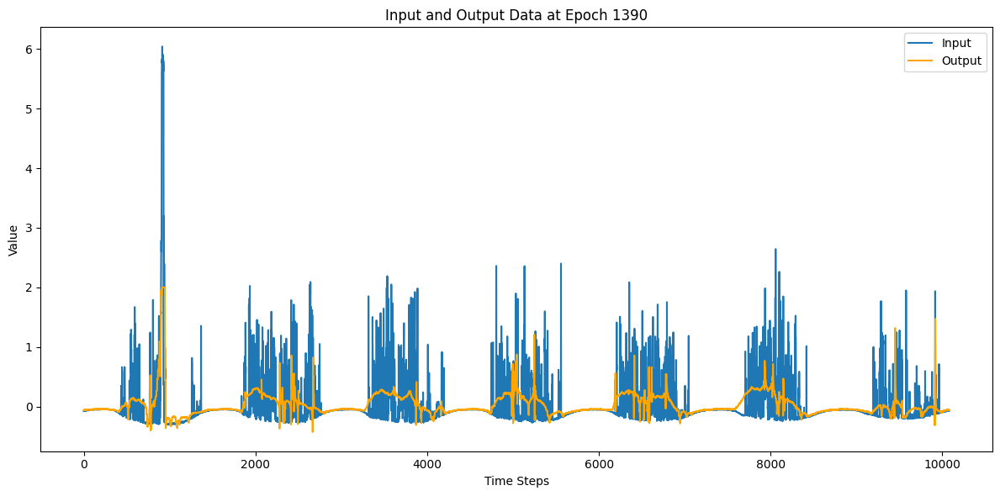

151/151 [==============================] - 13s 86ms/step - loss: 0.7004 - val_loss: 0.8860 - lr: 5.0000e-05
Epoch 1391/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7019 - val_loss: 0.8854 - lr: 5.0000e-05
Epoch 1392/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7005 - val_loss: 0.8851 - lr: 5.0000e-05
Epoch 1393/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7004 - val_loss: 0.8846 - lr: 5.0000e-05
Epoch 1394/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7015 - val_loss: 0.8863 - lr: 5.0000e-05
Epoch 1395/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7004 - val_loss: 0.8849 - lr: 5.0000e-05
Epoch 1396/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7003 - val_loss: 0.8858 - lr: 5.0000e-05
Epoch 1397/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7003 - val_loss: 0.8852 - lr: 5.0000e-05
Epoch 1398/10000


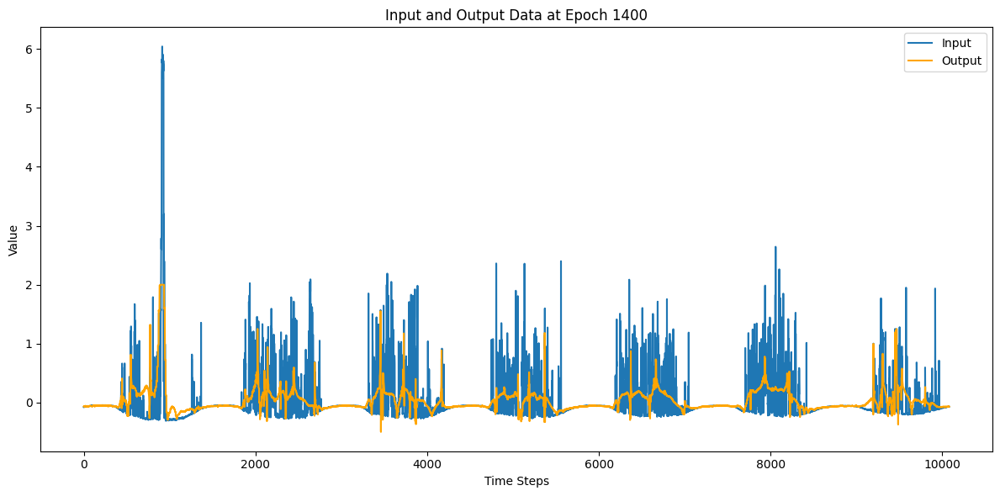

151/151 [==============================] - 13s 86ms/step - loss: 0.7040 - val_loss: 0.8851 - lr: 5.0000e-05
Epoch 1401/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7048 - val_loss: 0.8857 - lr: 5.0000e-05
Epoch 1402/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7003 - val_loss: 0.8861 - lr: 5.0000e-05
Epoch 1403/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7006 - val_loss: 0.8855 - lr: 5.0000e-05
Epoch 1404/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7004 - val_loss: 0.8854 - lr: 5.0000e-05
Epoch 1405/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7019 - val_loss: 0.8850 - lr: 5.0000e-05
Epoch 1406/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.7003 - val_loss: 0.8842 - lr: 5.0000e-05
Epoch 1407/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7005 - val_loss: 0.8850 - lr: 5.0000e-05
Epoch 1408/10000


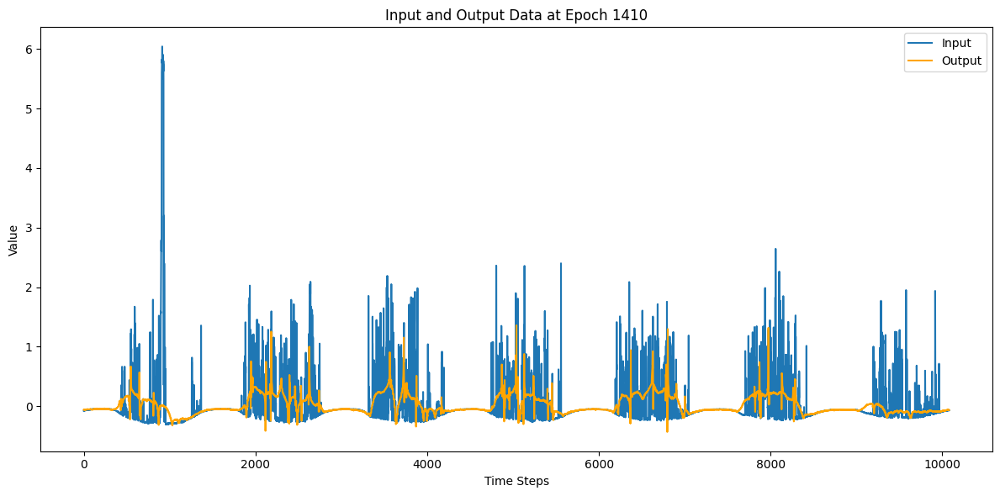

151/151 [==============================] - 13s 86ms/step - loss: 0.7002 - val_loss: 0.8852 - lr: 5.0000e-05
Epoch 1411/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7005 - val_loss: 0.8854 - lr: 5.0000e-05
Epoch 1412/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7006 - val_loss: 0.8849 - lr: 5.0000e-05
Epoch 1413/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7006 - val_loss: 0.8858 - lr: 5.0000e-05
Epoch 1414/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7004 - val_loss: 0.8847 - lr: 5.0000e-05
Epoch 1415/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7006 - val_loss: 0.8849 - lr: 5.0000e-05
Epoch 1416/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7004 - val_loss: 0.8850 - lr: 5.0000e-05
Epoch 1417/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7004 - val_loss: 0.8853 - lr: 5.0000e-05
Epoch 1418/10000


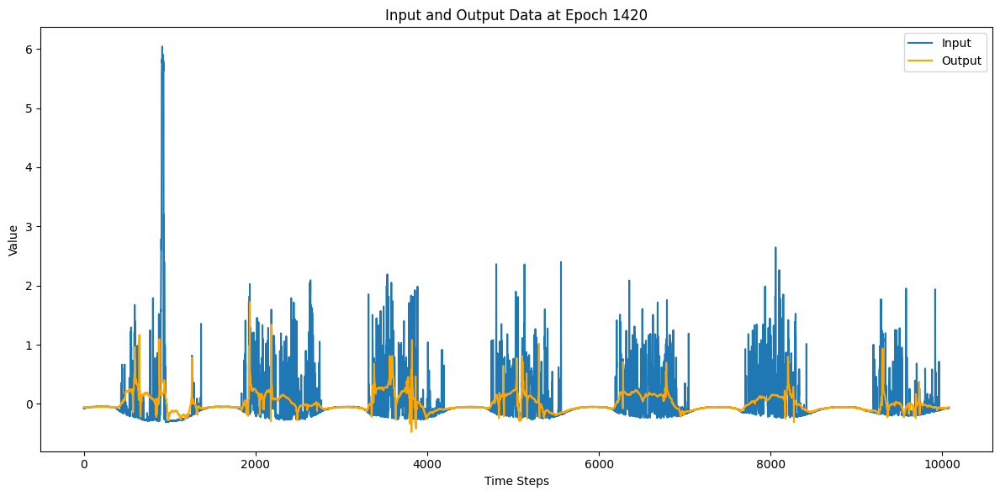

151/151 [==============================] - 13s 86ms/step - loss: 0.7006 - val_loss: 0.8853 - lr: 5.0000e-05
Epoch 1421/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7002 - val_loss: 0.8847 - lr: 5.0000e-05
Epoch 1422/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7005 - val_loss: 0.8844 - lr: 5.0000e-05
Epoch 1423/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7005 - val_loss: 0.8862 - lr: 5.0000e-05
Epoch 1424/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7004 - val_loss: 0.8847 - lr: 5.0000e-05
Epoch 1425/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7005 - val_loss: 0.8856 - lr: 5.0000e-05
Epoch 1426/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7003 - val_loss: 0.8840 - lr: 5.0000e-05
Epoch 1427/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7002 - val_loss: 0.8854 - lr: 5.0000e-05
Epoch 1428/10000


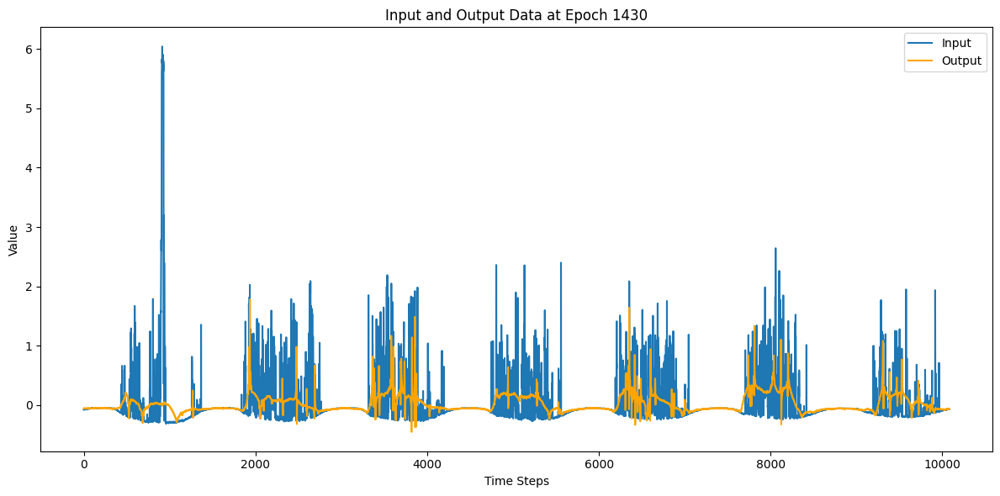

151/151 [==============================] - 13s 86ms/step - loss: 0.7035 - val_loss: 0.8848 - lr: 5.0000e-05
Epoch 1431/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7005 - val_loss: 0.8860 - lr: 5.0000e-05
Epoch 1432/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7003 - val_loss: 0.8851 - lr: 5.0000e-05
Epoch 1433/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7006 - val_loss: 0.8848 - lr: 5.0000e-05
Epoch 1434/10000
151/151 [==============================] - 12s 79ms/step - loss: 0.7004 - val_loss: 0.8860 - lr: 5.0000e-05
Epoch 1435/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7006 - val_loss: 0.8857 - lr: 5.0000e-05
Epoch 1436/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7004 - val_loss: 0.8859 - lr: 5.0000e-05
Epoch 1437/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7007 - val_loss: 0.8856 - lr: 5.0000e-05
Epoch 1438/10000


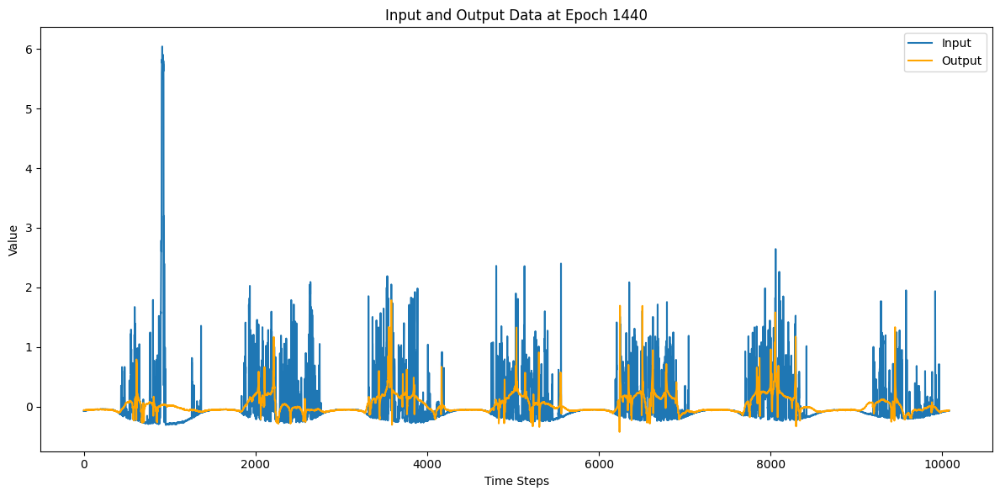

151/151 [==============================] - 14s 91ms/step - loss: 0.7015 - val_loss: 0.8850 - lr: 5.0000e-05
Epoch 1441/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7009 - val_loss: 0.8854 - lr: 5.0000e-05
Epoch 1442/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7039 - val_loss: 0.8851 - lr: 5.0000e-05
Epoch 1443/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7005 - val_loss: 0.8852 - lr: 5.0000e-05
Epoch 1444/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7039 - val_loss: 0.8849 - lr: 5.0000e-05
Epoch 1445/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7005 - val_loss: 0.8849 - lr: 5.0000e-05
Epoch 1446/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7014 - val_loss: 0.8847 - lr: 5.0000e-05
Epoch 1447/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7002 - val_loss: 0.8849 - lr: 5.0000e-05
Epoch 1448/10000


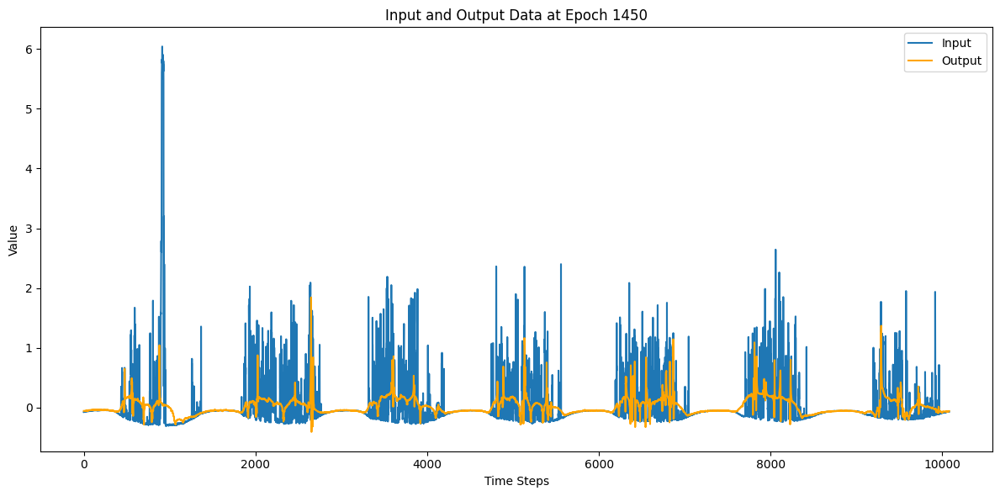

151/151 [==============================] - 13s 87ms/step - loss: 0.7004 - val_loss: 0.8853 - lr: 5.0000e-05
Epoch 1451/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7005 - val_loss: 0.8840 - lr: 5.0000e-05
Epoch 1452/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7003 - val_loss: 0.8851 - lr: 5.0000e-05
Epoch 1453/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7004 - val_loss: 0.8850 - lr: 5.0000e-05
Epoch 1454/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7004 - val_loss: 0.8851 - lr: 5.0000e-05
Epoch 1455/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7006 - val_loss: 0.8860 - lr: 5.0000e-05
Epoch 1456/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7001 - val_loss: 0.8858 - lr: 5.0000e-05
Epoch 1457/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7002 - val_loss: 0.8849 - lr: 5.0000e-05
Epoch 1458/10000


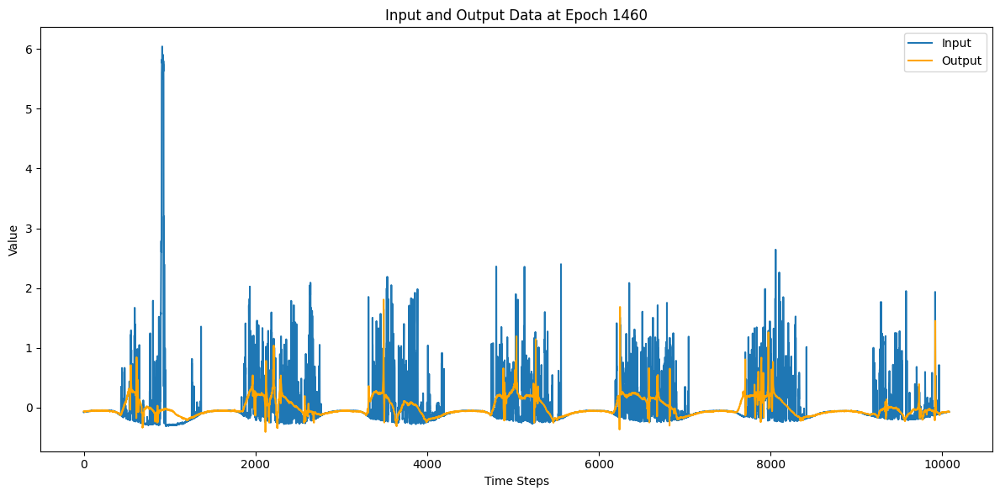

151/151 [==============================] - 13s 87ms/step - loss: 0.7003 - val_loss: 0.8849 - lr: 5.0000e-05
Epoch 1461/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7008 - val_loss: 0.8847 - lr: 5.0000e-05
Epoch 1462/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7002 - val_loss: 0.8861 - lr: 5.0000e-05
Epoch 1463/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7031 - val_loss: 0.8855 - lr: 5.0000e-05
Epoch 1464/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7004 - val_loss: 0.8854 - lr: 5.0000e-05
Epoch 1465/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7008 - val_loss: 0.8862 - lr: 5.0000e-05
Epoch 1466/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7001 - val_loss: 0.8850 - lr: 5.0000e-05
Epoch 1467/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7003 - val_loss: 0.8849 - lr: 5.0000e-05
Epoch 1468/10000


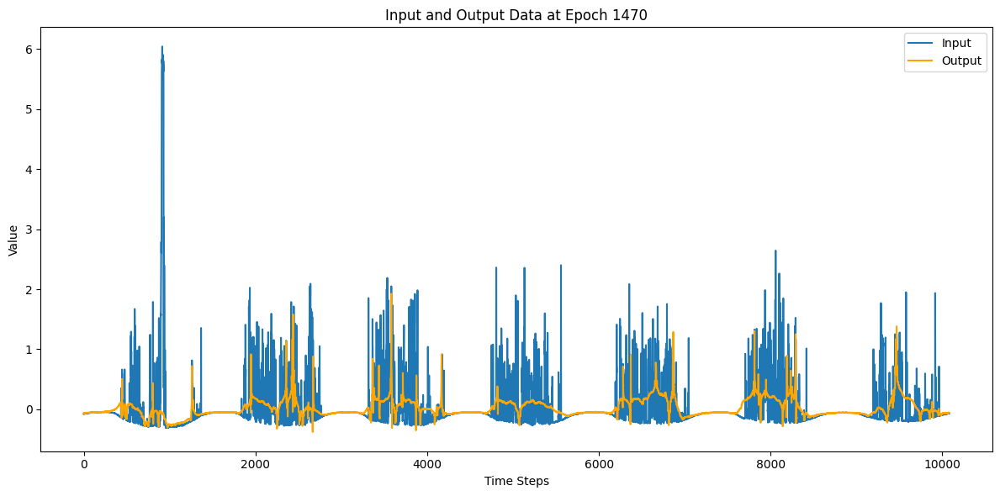

151/151 [==============================] - 13s 87ms/step - loss: 0.7000 - val_loss: 0.8859 - lr: 5.0000e-05
Epoch 1471/10000
151/151 [==============================] - 13s 86ms/step - loss: 0.7010 - val_loss: 0.8849 - lr: 5.0000e-05
Epoch 1472/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7005 - val_loss: 0.8846 - lr: 5.0000e-05
Epoch 1473/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7002 - val_loss: 0.8848 - lr: 5.0000e-05
Epoch 1474/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7007 - val_loss: 0.8845 - lr: 5.0000e-05
Epoch 1475/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7004 - val_loss: 0.8852 - lr: 5.0000e-05
Epoch 1476/10000
151/151 [==============================] - ETA: 0s - loss: 0.7002
Epoch 1476: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-05.
151/151 [==============================] - 12s 80ms/step - loss: 0.7002 - val_loss: 0.8854 - lr: 5.0000e-

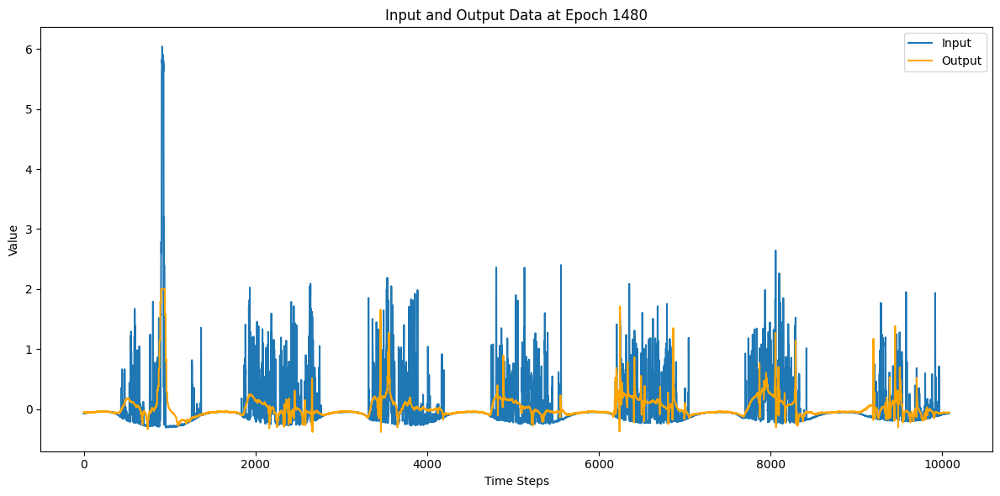

151/151 [==============================] - 13s 88ms/step - loss: 0.7000 - val_loss: 0.8848 - lr: 2.5000e-05
Epoch 1481/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7023 - val_loss: 0.8862 - lr: 2.5000e-05
Epoch 1482/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.6999 - val_loss: 0.8857 - lr: 2.5000e-05
Epoch 1483/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7001 - val_loss: 0.8852 - lr: 2.5000e-05
Epoch 1484/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7037 - val_loss: 0.8858 - lr: 2.5000e-05
Epoch 1485/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6998 - val_loss: 0.8842 - lr: 2.5000e-05
Epoch 1486/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7002 - val_loss: 0.8855 - lr: 2.5000e-05
Epoch 1487/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7000 - val_loss: 0.8845 - lr: 2.5000e-05
Epoch 1488/10000


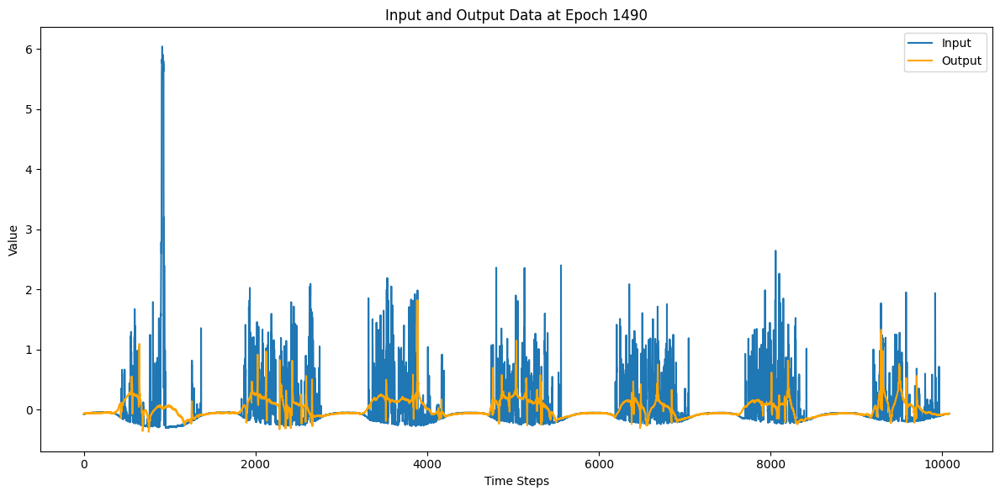

151/151 [==============================] - 13s 88ms/step - loss: 0.6999 - val_loss: 0.8854 - lr: 2.5000e-05
Epoch 1491/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.6998 - val_loss: 0.8848 - lr: 2.5000e-05
Epoch 1492/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6999 - val_loss: 0.8855 - lr: 2.5000e-05
Epoch 1493/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7000 - val_loss: 0.8848 - lr: 2.5000e-05
Epoch 1494/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7000 - val_loss: 0.8848 - lr: 2.5000e-05
Epoch 1495/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.6997 - val_loss: 0.8846 - lr: 2.5000e-05
Epoch 1496/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6995 - val_loss: 0.8855 - lr: 2.5000e-05
Epoch 1497/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7007 - val_loss: 0.8849 - lr: 2.5000e-05
Epoch 1498/10000


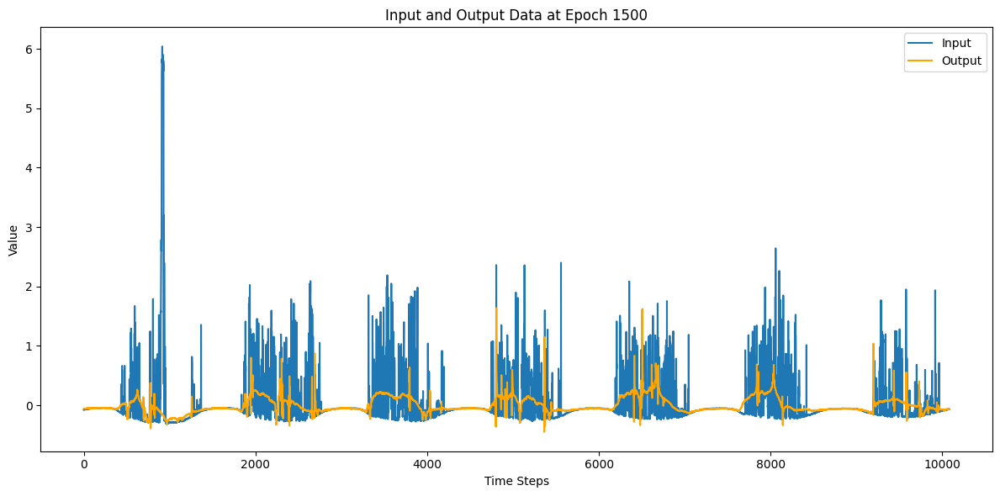

151/151 [==============================] - 13s 87ms/step - loss: 0.6997 - val_loss: 0.8841 - lr: 2.5000e-05
Epoch 1501/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7000 - val_loss: 0.8856 - lr: 2.5000e-05
Epoch 1502/10000
151/151 [==============================] - 13s 85ms/step - loss: 0.6997 - val_loss: 0.8853 - lr: 2.5000e-05
Epoch 1503/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7000 - val_loss: 0.8853 - lr: 2.5000e-05
Epoch 1504/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6999 - val_loss: 0.8849 - lr: 2.5000e-05
Epoch 1505/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6998 - val_loss: 0.8853 - lr: 2.5000e-05
Epoch 1506/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.6998 - val_loss: 0.8852 - lr: 2.5000e-05
Epoch 1507/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7000 - val_loss: 0.8851 - lr: 2.5000e-05
Epoch 1508/10000


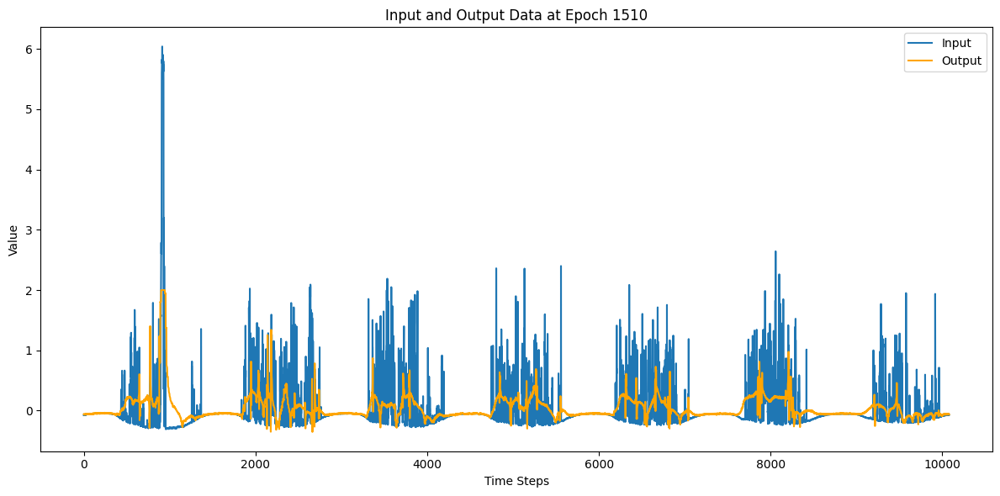

151/151 [==============================] - 13s 88ms/step - loss: 0.6998 - val_loss: 0.8836 - lr: 2.5000e-05
Epoch 1511/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.6998 - val_loss: 0.8853 - lr: 2.5000e-05
Epoch 1512/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7003 - val_loss: 0.8848 - lr: 2.5000e-05
Epoch 1513/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6998 - val_loss: 0.8858 - lr: 2.5000e-05
Epoch 1514/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7014 - val_loss: 0.8849 - lr: 2.5000e-05
Epoch 1515/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.6998 - val_loss: 0.8842 - lr: 2.5000e-05
Epoch 1516/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7001 - val_loss: 0.8854 - lr: 2.5000e-05
Epoch 1517/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6997 - val_loss: 0.8846 - lr: 2.5000e-05
Epoch 1518/10000


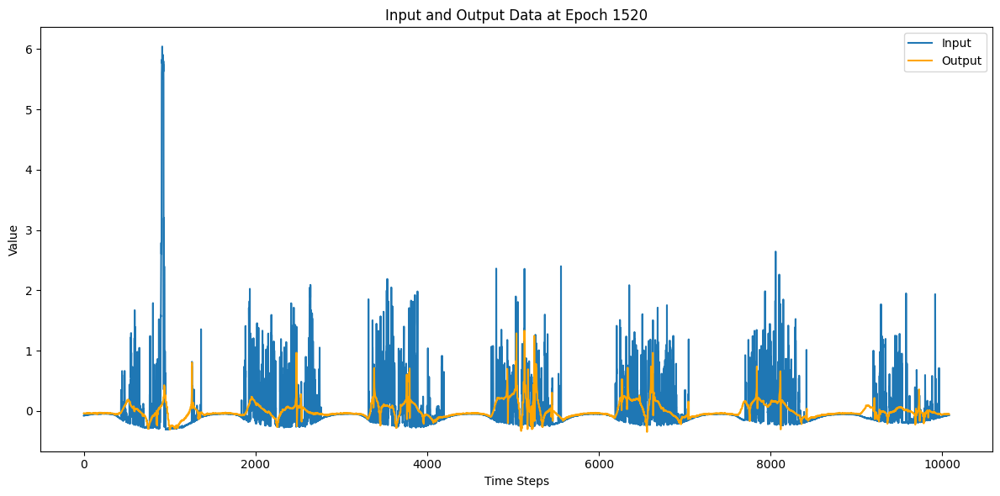

151/151 [==============================] - 13s 87ms/step - loss: 0.7001 - val_loss: 0.8853 - lr: 2.5000e-05
Epoch 1521/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7152 - val_loss: 0.8849 - lr: 2.5000e-05
Epoch 1522/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6997 - val_loss: 0.8849 - lr: 2.5000e-05
Epoch 1523/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7002 - val_loss: 0.8854 - lr: 2.5000e-05
Epoch 1524/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7033 - val_loss: 0.8844 - lr: 2.5000e-05
Epoch 1525/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7001 - val_loss: 0.8837 - lr: 2.5000e-05
Epoch 1526/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7062 - val_loss: 0.8848 - lr: 2.5000e-05
Epoch 1527/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6999 - val_loss: 0.8850 - lr: 2.5000e-05
Epoch 1528/10000


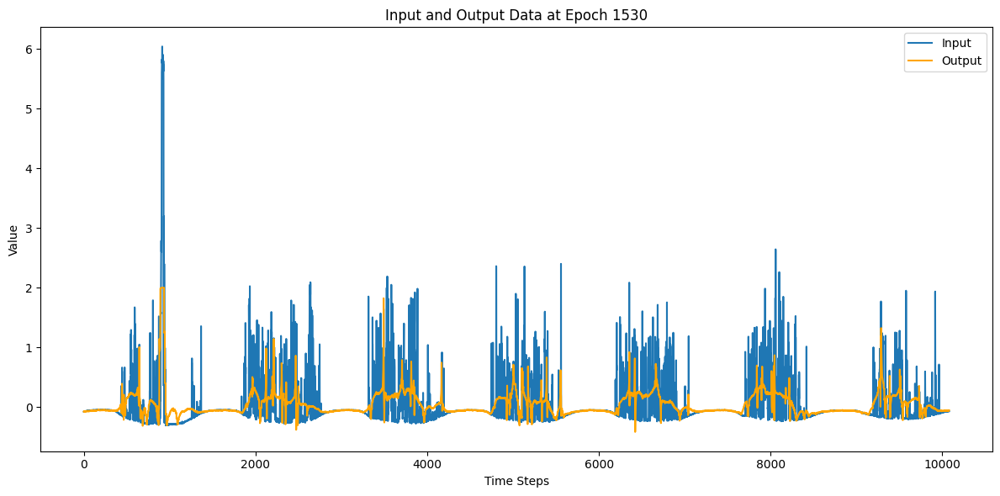

151/151 [==============================] - 13s 86ms/step - loss: 0.6998 - val_loss: 0.8847 - lr: 2.5000e-05
Epoch 1531/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.6995 - val_loss: 0.8851 - lr: 2.5000e-05
Epoch 1532/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7000 - val_loss: 0.8855 - lr: 2.5000e-05
Epoch 1533/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6997 - val_loss: 0.8836 - lr: 2.5000e-05
Epoch 1534/10000
151/151 [==============================] - 13s 85ms/step - loss: 0.6995 - val_loss: 0.8840 - lr: 2.5000e-05
Epoch 1535/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7008 - val_loss: 0.8841 - lr: 2.5000e-05
Epoch 1536/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6997 - val_loss: 0.8845 - lr: 2.5000e-05
Epoch 1537/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7000 - val_loss: 0.8842 - lr: 2.5000e-05
Epoch 1538/10000


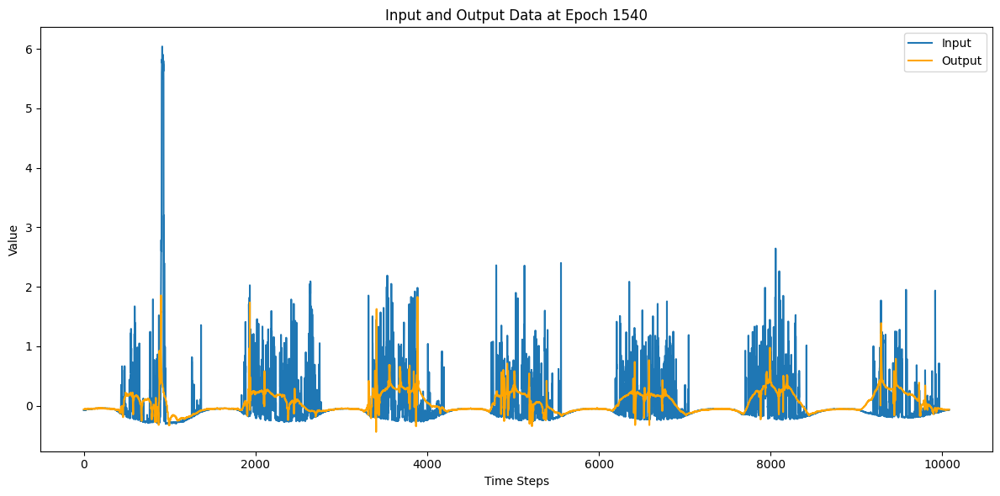

151/151 [==============================] - 13s 87ms/step - loss: 0.7032 - val_loss: 0.8852 - lr: 2.5000e-05
Epoch 1541/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6999 - val_loss: 0.8859 - lr: 2.5000e-05
Epoch 1542/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7014 - val_loss: 0.8843 - lr: 2.5000e-05
Epoch 1543/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7016 - val_loss: 0.8842 - lr: 2.5000e-05
Epoch 1544/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7000 - val_loss: 0.8847 - lr: 2.5000e-05
Epoch 1545/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6999 - val_loss: 0.8843 - lr: 2.5000e-05
Epoch 1546/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7072 - val_loss: 0.8847 - lr: 2.5000e-05
Epoch 1547/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7018 - val_loss: 0.8846 - lr: 2.5000e-05
Epoch 1548/10000


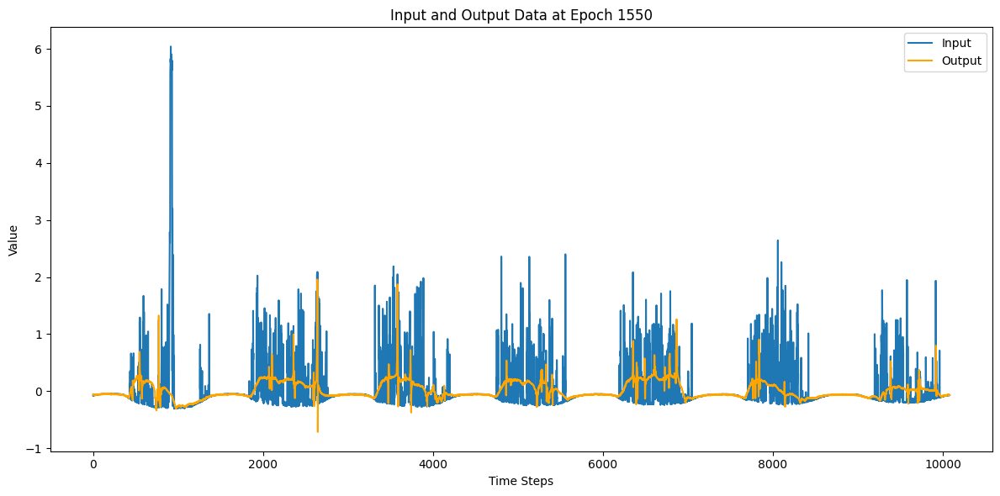

151/151 [==============================] - 13s 88ms/step - loss: 0.7107 - val_loss: 0.8842 - lr: 2.5000e-05
Epoch 1551/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.6998 - val_loss: 0.8844 - lr: 2.5000e-05
Epoch 1552/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.6998 - val_loss: 0.8846 - lr: 2.5000e-05
Epoch 1553/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6997 - val_loss: 0.8848 - lr: 2.5000e-05
Epoch 1554/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6999 - val_loss: 0.8854 - lr: 2.5000e-05
Epoch 1555/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.6996 - val_loss: 0.8852 - lr: 2.5000e-05
Epoch 1556/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7001 - val_loss: 0.8847 - lr: 2.5000e-05
Epoch 1557/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7002 - val_loss: 0.8847 - lr: 2.5000e-05
Epoch 1558/10000


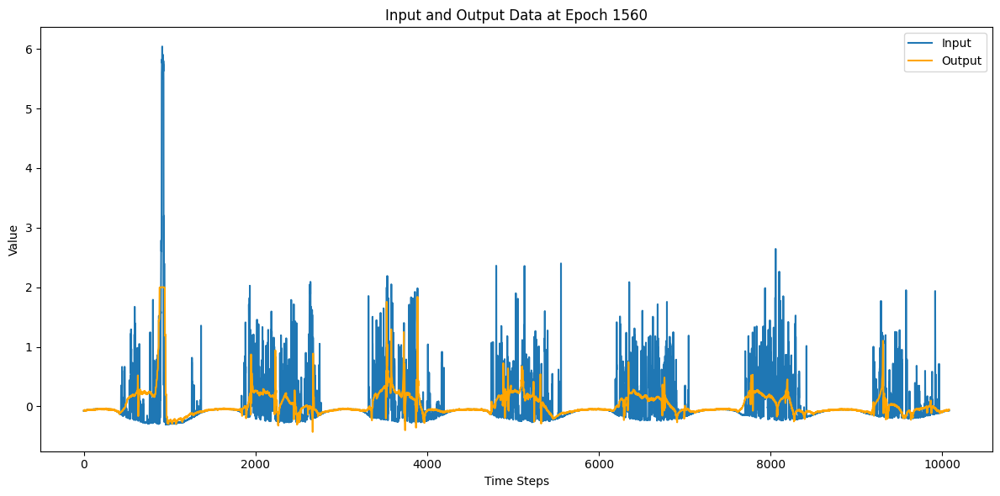

151/151 [==============================] - 13s 87ms/step - loss: 0.7112 - val_loss: 0.8845 - lr: 2.5000e-05
Epoch 1561/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6997 - val_loss: 0.8852 - lr: 2.5000e-05
Epoch 1562/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7045 - val_loss: 0.8844 - lr: 2.5000e-05
Epoch 1563/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6996 - val_loss: 0.8857 - lr: 2.5000e-05
Epoch 1564/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6992 - val_loss: 0.8857 - lr: 2.5000e-05
Epoch 1565/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6996 - val_loss: 0.8851 - lr: 2.5000e-05
Epoch 1566/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7007 - val_loss: 0.8851 - lr: 2.5000e-05
Epoch 1567/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7032 - val_loss: 0.8848 - lr: 2.5000e-05
Epoch 1568/10000


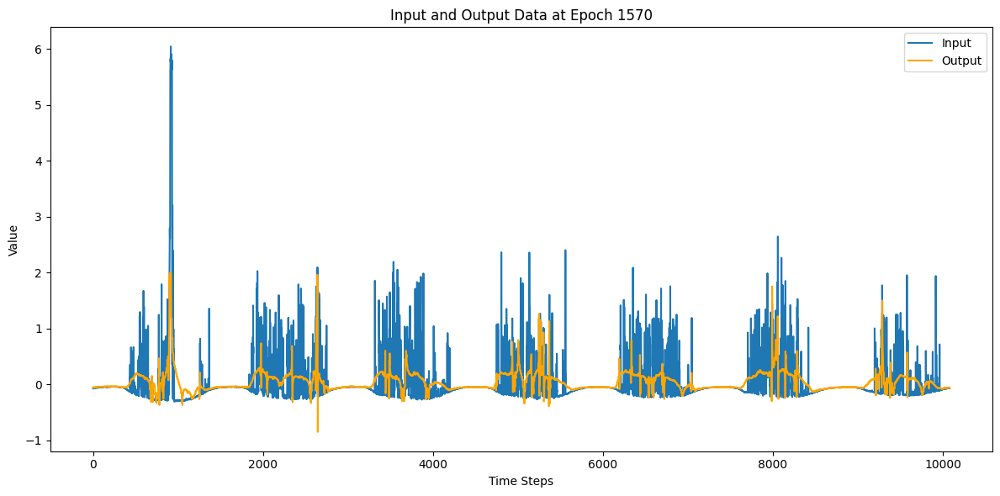

151/151 [==============================] - 13s 86ms/step - loss: 0.7018 - val_loss: 0.8839 - lr: 2.5000e-05
Epoch 1571/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6999 - val_loss: 0.8843 - lr: 2.5000e-05
Epoch 1572/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6999 - val_loss: 0.8857 - lr: 2.5000e-05
Epoch 1573/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6995 - val_loss: 0.8854 - lr: 2.5000e-05
Epoch 1574/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7012 - val_loss: 0.8849 - lr: 2.5000e-05
Epoch 1575/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6997 - val_loss: 0.8841 - lr: 2.5000e-05
Epoch 1576/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7120 - val_loss: 0.8849 - lr: 2.5000e-05
Epoch 1577/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6999 - val_loss: 0.8848 - lr: 2.5000e-05
Epoch 1578/10000


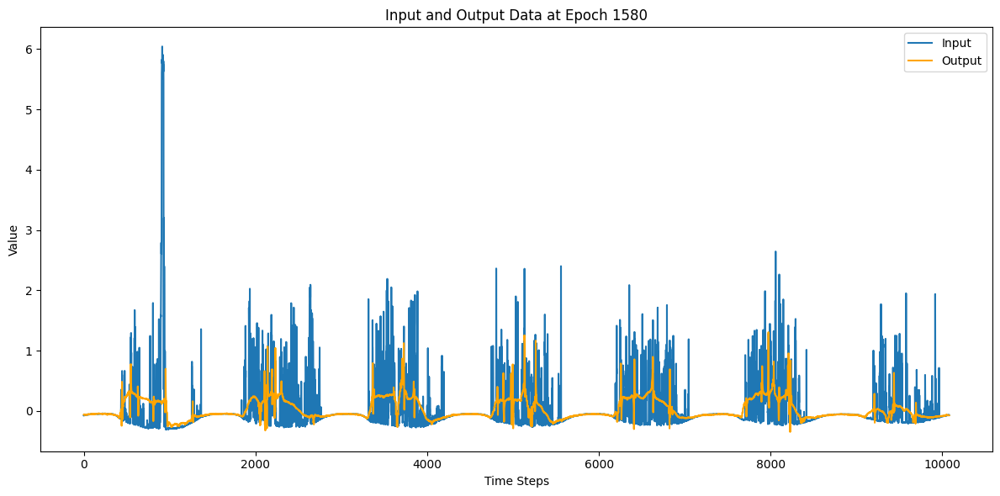

151/151 [==============================] - 13s 87ms/step - loss: 0.7000 - val_loss: 0.8852 - lr: 2.5000e-05
Epoch 1581/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.6997 - val_loss: 0.8853 - lr: 2.5000e-05
Epoch 1582/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7032 - val_loss: 0.8849 - lr: 2.5000e-05
Epoch 1583/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6992 - val_loss: 0.8851 - lr: 2.5000e-05
Epoch 1584/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7067 - val_loss: 0.8843 - lr: 2.5000e-05
Epoch 1585/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6997 - val_loss: 0.8848 - lr: 2.5000e-05
Epoch 1586/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7068 - val_loss: 0.8849 - lr: 2.5000e-05
Epoch 1587/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6997 - val_loss: 0.8852 - lr: 2.5000e-05
Epoch 1588/10000


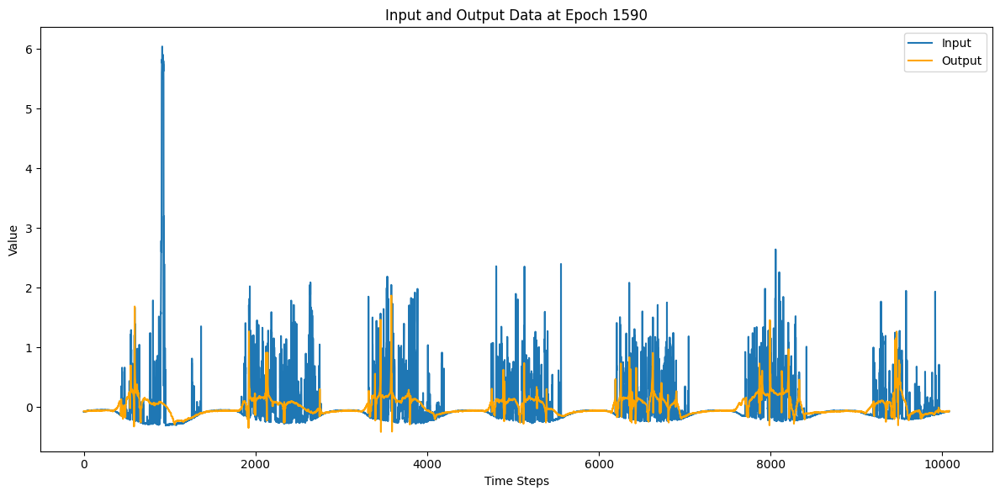

151/151 [==============================] - 13s 88ms/step - loss: 0.6997 - val_loss: 0.8848 - lr: 2.5000e-05
Epoch 1591/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7082 - val_loss: 0.8843 - lr: 2.5000e-05
Epoch 1592/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6998 - val_loss: 0.8844 - lr: 2.5000e-05
Epoch 1593/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6994 - val_loss: 0.8857 - lr: 2.5000e-05
Epoch 1594/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7040 - val_loss: 0.8857 - lr: 2.5000e-05
Epoch 1595/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6996 - val_loss: 0.8859 - lr: 2.5000e-05
Epoch 1596/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7007 - val_loss: 0.8852 - lr: 2.5000e-05
Epoch 1597/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7000 - val_loss: 0.8859 - lr: 2.5000e-05
Epoch 1598/10000


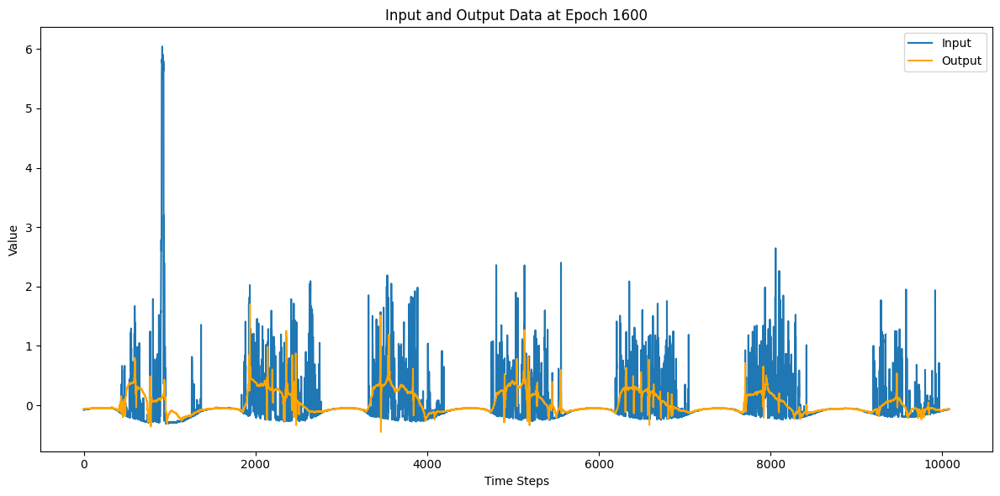

151/151 [==============================] - 14s 93ms/step - loss: 0.6995 - val_loss: 0.8845 - lr: 2.5000e-05
Epoch 1601/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.6995 - val_loss: 0.8846 - lr: 2.5000e-05
Epoch 1602/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6997 - val_loss: 0.8851 - lr: 2.5000e-05
Epoch 1603/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6999 - val_loss: 0.8849 - lr: 2.5000e-05
Epoch 1604/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7004 - val_loss: 0.8846 - lr: 2.5000e-05
Epoch 1605/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6995 - val_loss: 0.8844 - lr: 2.5000e-05
Epoch 1606/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7001 - val_loss: 0.8845 - lr: 2.5000e-05
Epoch 1607/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7001 - val_loss: 0.8857 - lr: 2.5000e-05
Epoch 1608/10000


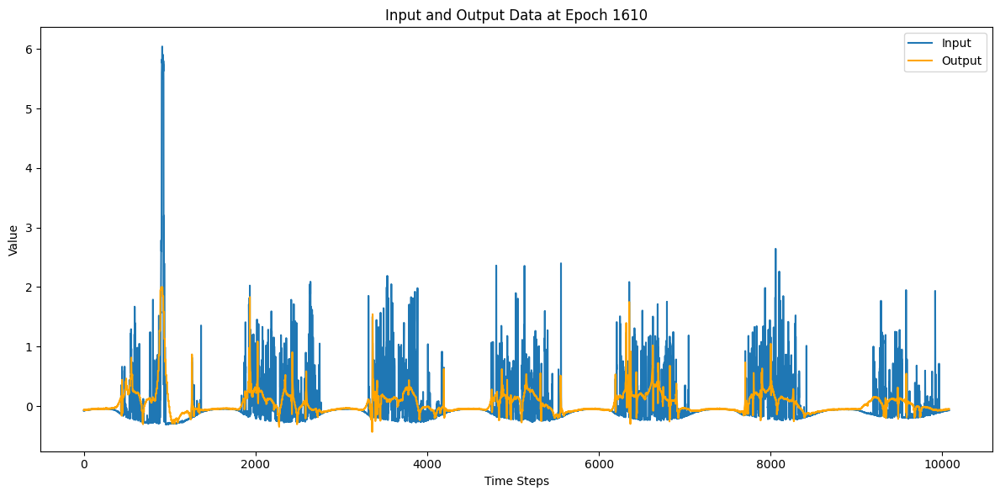

151/151 [==============================] - 13s 87ms/step - loss: 0.6996 - val_loss: 0.8847 - lr: 2.5000e-05
Epoch 1611/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7018 - val_loss: 0.8850 - lr: 1.2500e-05
Epoch 1612/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6992 - val_loss: 0.8844 - lr: 1.2500e-05
Epoch 1613/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6994 - val_loss: 0.8846 - lr: 1.2500e-05
Epoch 1614/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6997 - val_loss: 0.8848 - lr: 1.2500e-05
Epoch 1615/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6996 - val_loss: 0.8841 - lr: 1.2500e-05
Epoch 1616/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6997 - val_loss: 0.8843 - lr: 1.2500e-05
Epoch 1617/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7056 - val_loss: 0.8851 - lr: 1.2500e-05
Epoch 1618/10000


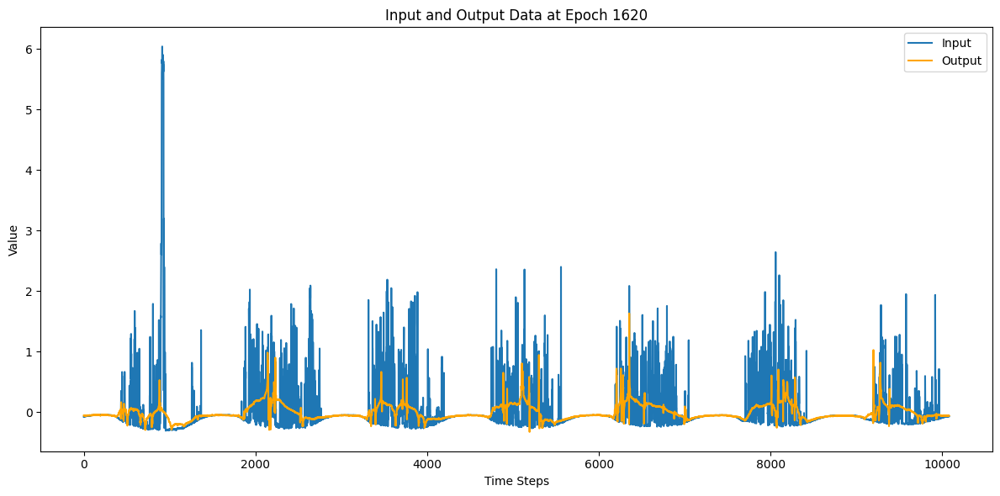

151/151 [==============================] - 13s 88ms/step - loss: 0.7030 - val_loss: 0.8849 - lr: 1.2500e-05
Epoch 1621/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6993 - val_loss: 0.8848 - lr: 1.2500e-05
Epoch 1622/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6994 - val_loss: 0.8851 - lr: 1.2500e-05
Epoch 1623/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6992 - val_loss: 0.8843 - lr: 1.2500e-05
Epoch 1624/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6996 - val_loss: 0.8842 - lr: 1.2500e-05
Epoch 1625/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7006 - val_loss: 0.8853 - lr: 1.2500e-05
Epoch 1626/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.6993 - val_loss: 0.8854 - lr: 1.2500e-05
Epoch 1627/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6997 - val_loss: 0.8848 - lr: 1.2500e-05
Epoch 1628/10000


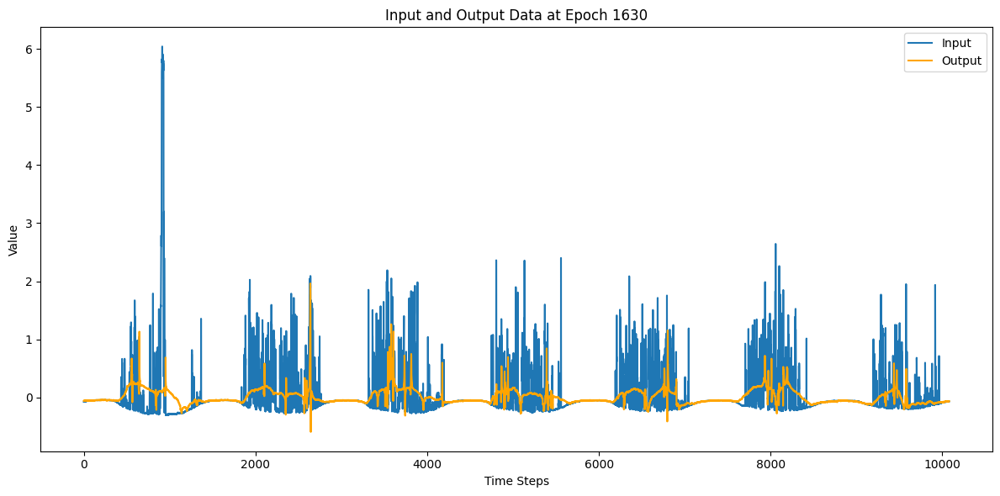

151/151 [==============================] - 13s 88ms/step - loss: 0.6994 - val_loss: 0.8851 - lr: 1.2500e-05
Epoch 1631/10000
151/151 [==============================] - 13s 86ms/step - loss: 0.7033 - val_loss: 0.8851 - lr: 1.2500e-05
Epoch 1632/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6994 - val_loss: 0.8849 - lr: 1.2500e-05
Epoch 1633/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6995 - val_loss: 0.8851 - lr: 1.2500e-05
Epoch 1634/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6994 - val_loss: 0.8843 - lr: 1.2500e-05
Epoch 1635/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7006 - val_loss: 0.8846 - lr: 1.2500e-05
Epoch 1636/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6993 - val_loss: 0.8849 - lr: 1.2500e-05
Epoch 1637/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6993 - val_loss: 0.8853 - lr: 1.2500e-05
Epoch 1638/10000


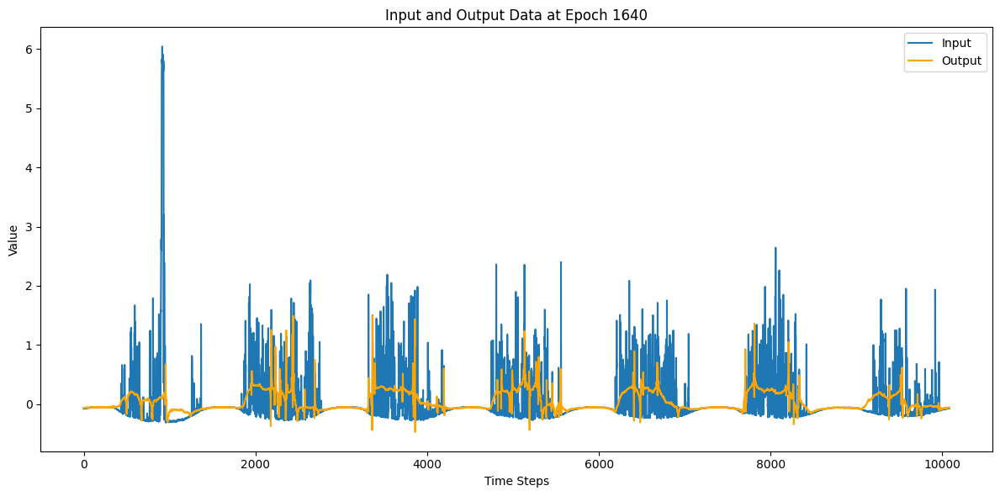

151/151 [==============================] - 13s 88ms/step - loss: 0.6993 - val_loss: 0.8854 - lr: 1.2500e-05
Epoch 1641/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6997 - val_loss: 0.8859 - lr: 1.2500e-05
Epoch 1642/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6995 - val_loss: 0.8844 - lr: 1.2500e-05
Epoch 1643/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7009 - val_loss: 0.8845 - lr: 1.2500e-05
Epoch 1644/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6994 - val_loss: 0.8847 - lr: 1.2500e-05
Epoch 1645/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6994 - val_loss: 0.8840 - lr: 1.2500e-05
Epoch 1646/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6995 - val_loss: 0.8848 - lr: 1.2500e-05
Epoch 1647/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7110 - val_loss: 0.8862 - lr: 1.2500e-05
Epoch 1648/10000


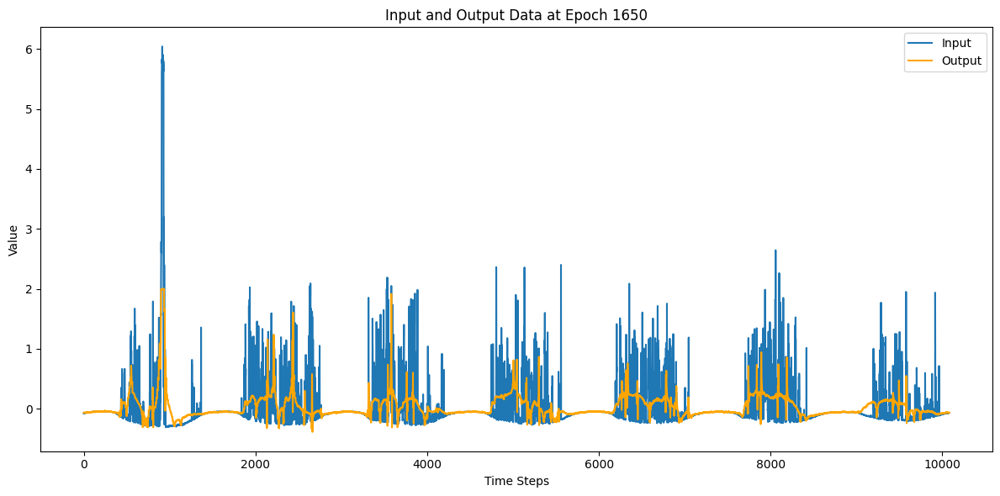

151/151 [==============================] - 13s 88ms/step - loss: 0.6990 - val_loss: 0.8846 - lr: 1.2500e-05
Epoch 1651/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6995 - val_loss: 0.8850 - lr: 1.2500e-05
Epoch 1652/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6995 - val_loss: 0.8853 - lr: 1.2500e-05
Epoch 1653/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6995 - val_loss: 0.8850 - lr: 1.2500e-05
Epoch 1654/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6995 - val_loss: 0.8850 - lr: 1.2500e-05
Epoch 1655/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6993 - val_loss: 0.8844 - lr: 1.2500e-05
Epoch 1656/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6994 - val_loss: 0.8842 - lr: 1.2500e-05
Epoch 1657/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6994 - val_loss: 0.8840 - lr: 1.2500e-05
Epoch 1658/10000


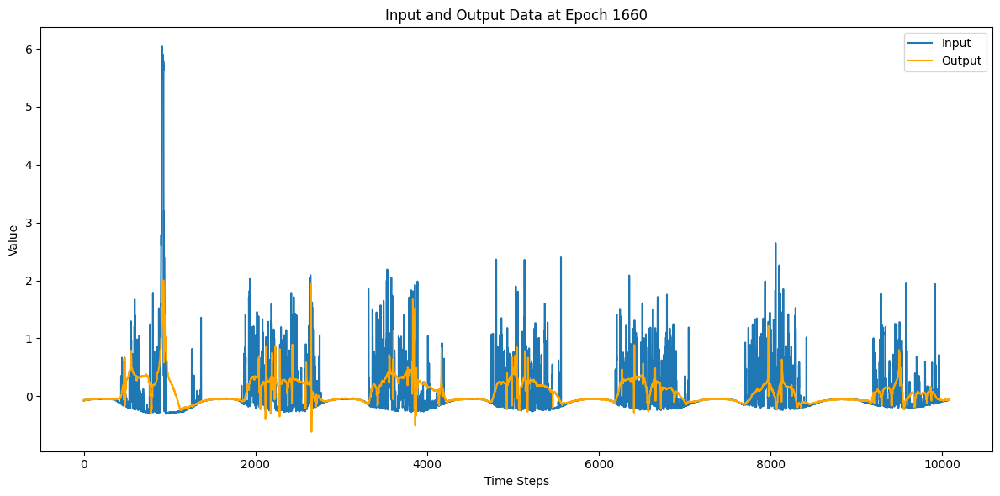

151/151 [==============================] - 13s 88ms/step - loss: 0.6994 - val_loss: 0.8842 - lr: 1.2500e-05
Epoch 1661/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.7038 - val_loss: 0.8849 - lr: 1.2500e-05
Epoch 1662/10000
151/151 [==============================] - 13s 87ms/step - loss: 0.7001 - val_loss: 0.8846 - lr: 1.2500e-05
Epoch 1663/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6994 - val_loss: 0.8849 - lr: 1.2500e-05
Epoch 1664/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6991 - val_loss: 0.8845 - lr: 1.2500e-05
Epoch 1665/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7074 - val_loss: 0.8848 - lr: 1.2500e-05
Epoch 1666/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7069 - val_loss: 0.8849 - lr: 1.2500e-05
Epoch 1667/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6994 - val_loss: 0.8849 - lr: 1.2500e-05
Epoch 1668/10000


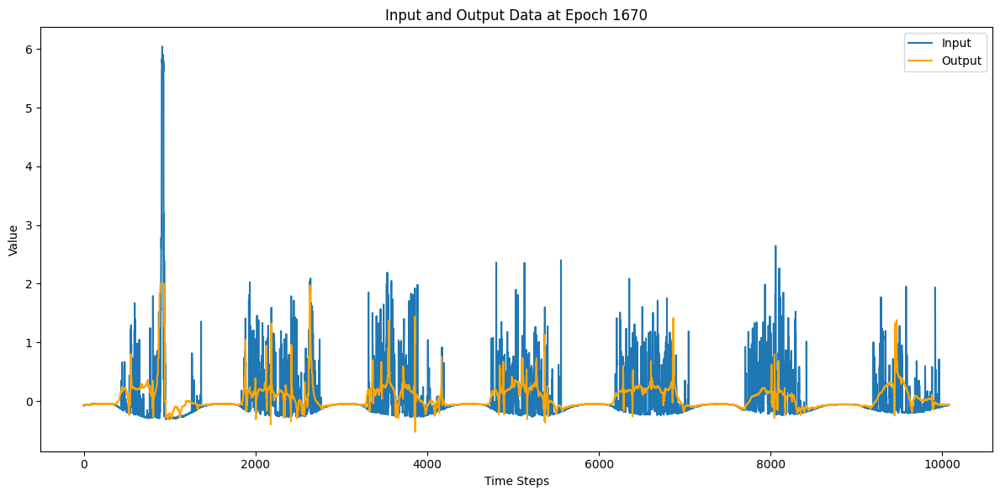

151/151 [==============================] - 13s 88ms/step - loss: 0.6996 - val_loss: 0.8860 - lr: 1.2500e-05
Epoch 1671/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6995 - val_loss: 0.8849 - lr: 1.2500e-05
Epoch 1672/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6995 - val_loss: 0.8851 - lr: 1.2500e-05
Epoch 1673/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6993 - val_loss: 0.8854 - lr: 1.2500e-05
Epoch 1674/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6993 - val_loss: 0.8859 - lr: 1.2500e-05
Epoch 1675/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6993 - val_loss: 0.8850 - lr: 1.2500e-05
Epoch 1676/10000
151/151 [==============================] - 12s 80ms/step - loss: 0.6991 - val_loss: 0.8843 - lr: 1.2500e-05
Epoch 1677/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6993 - val_loss: 0.8841 - lr: 1.2500e-05
Epoch 1678/10000


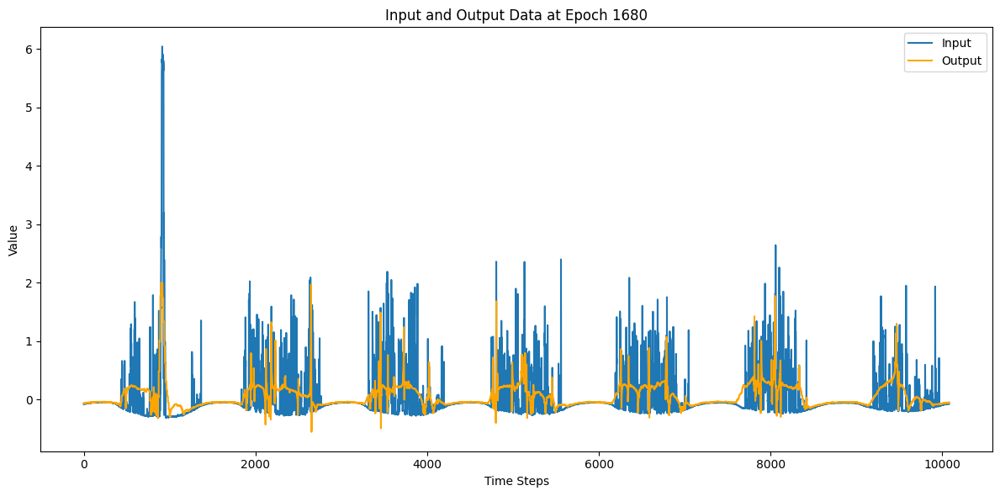

151/151 [==============================] - 13s 88ms/step - loss: 0.6992 - val_loss: 0.8858 - lr: 1.2500e-05
Epoch 1681/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7042 - val_loss: 0.8847 - lr: 1.2500e-05
Epoch 1682/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6996 - val_loss: 0.8839 - lr: 1.2500e-05
Epoch 1683/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6993 - val_loss: 0.8862 - lr: 1.2500e-05
Epoch 1684/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6995 - val_loss: 0.8853 - lr: 1.2500e-05
Epoch 1685/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6993 - val_loss: 0.8848 - lr: 1.2500e-05
Epoch 1686/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6991 - val_loss: 0.8852 - lr: 1.2500e-05
Epoch 1687/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6998 - val_loss: 0.8843 - lr: 1.2500e-05
Epoch 1688/10000


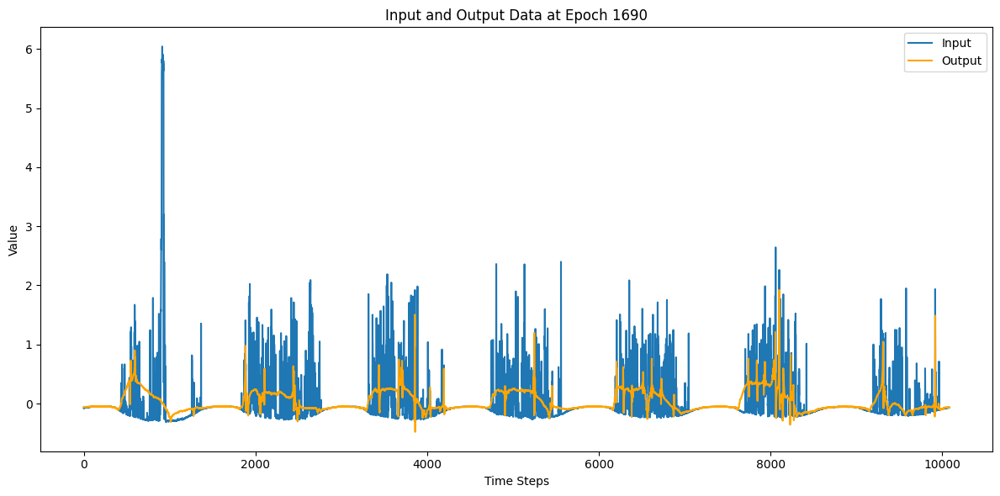

151/151 [==============================] - 13s 88ms/step - loss: 0.6994 - val_loss: 0.8849 - lr: 1.2500e-05
Epoch 1691/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6992 - val_loss: 0.8846 - lr: 1.2500e-05
Epoch 1692/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6994 - val_loss: 0.8849 - lr: 1.2500e-05
Epoch 1693/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6996 - val_loss: 0.8844 - lr: 1.2500e-05
Epoch 1694/10000
151/151 [==============================] - 13s 87ms/step - loss: 0.6990 - val_loss: 0.8852 - lr: 1.2500e-05
Epoch 1695/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6993 - val_loss: 0.8845 - lr: 1.2500e-05
Epoch 1696/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7113 - val_loss: 0.8847 - lr: 1.2500e-05
Epoch 1697/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6994 - val_loss: 0.8854 - lr: 1.2500e-05
Epoch 1698/10000


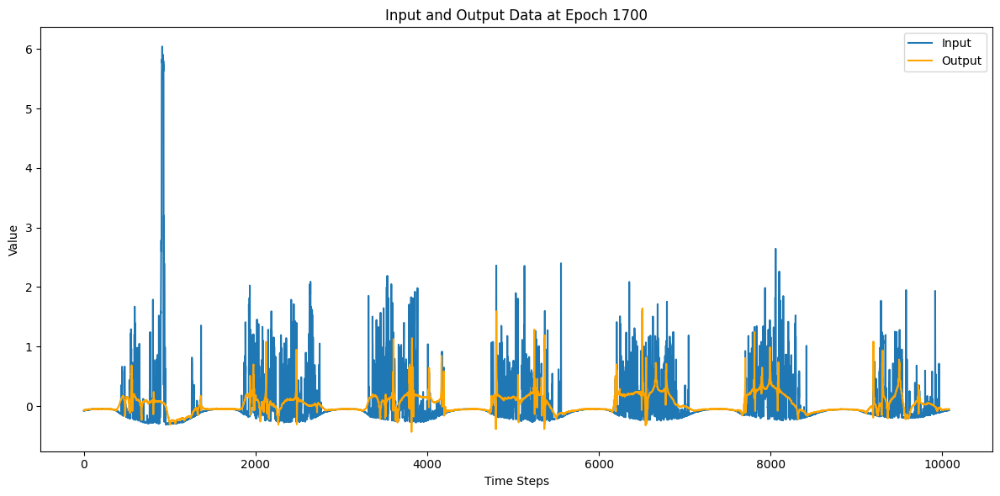

151/151 [==============================] - 13s 89ms/step - loss: 0.6992 - val_loss: 0.8847 - lr: 1.2500e-05
Epoch 1701/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7134 - val_loss: 0.8841 - lr: 1.2500e-05
Epoch 1702/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6997 - val_loss: 0.8845 - lr: 1.2500e-05
Epoch 1703/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6994 - val_loss: 0.8847 - lr: 1.2500e-05
Epoch 1704/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6994 - val_loss: 0.8855 - lr: 1.2500e-05
Epoch 1705/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6993 - val_loss: 0.8857 - lr: 1.2500e-05
Epoch 1706/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6996 - val_loss: 0.8854 - lr: 1.2500e-05
Epoch 1707/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6992 - val_loss: 0.8852 - lr: 1.2500e-05
Epoch 1708/10000


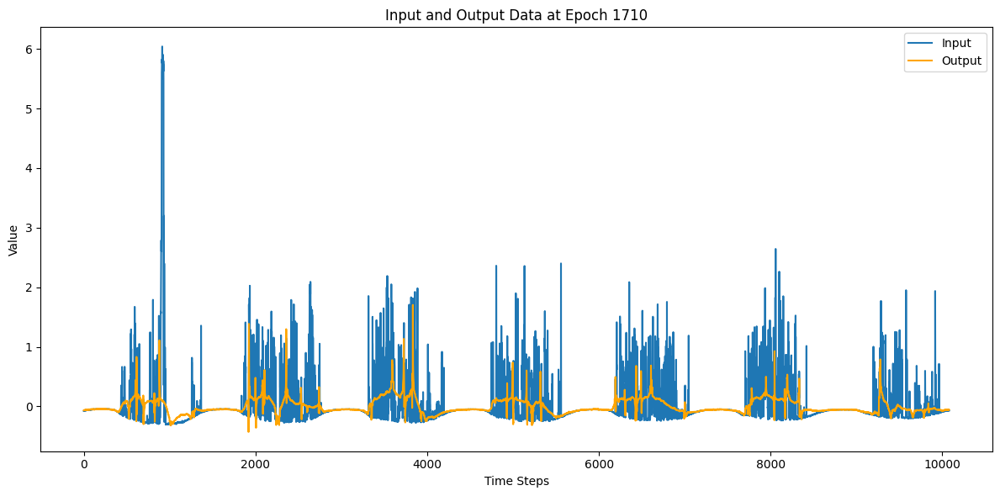

151/151 [==============================] - 13s 88ms/step - loss: 0.6994 - val_loss: 0.8848 - lr: 1.2500e-05
Epoch 1711/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7029 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 1712/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7012 - val_loss: 0.8856 - lr: 1.0000e-05
Epoch 1713/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7028 - val_loss: 0.8848 - lr: 1.0000e-05
Epoch 1714/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6992 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 1715/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6994 - val_loss: 0.8848 - lr: 1.0000e-05
Epoch 1716/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7001 - val_loss: 0.8852 - lr: 1.0000e-05
Epoch 1717/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6998 - val_loss: 0.8856 - lr: 1.0000e-05
Epoch 1718/10000


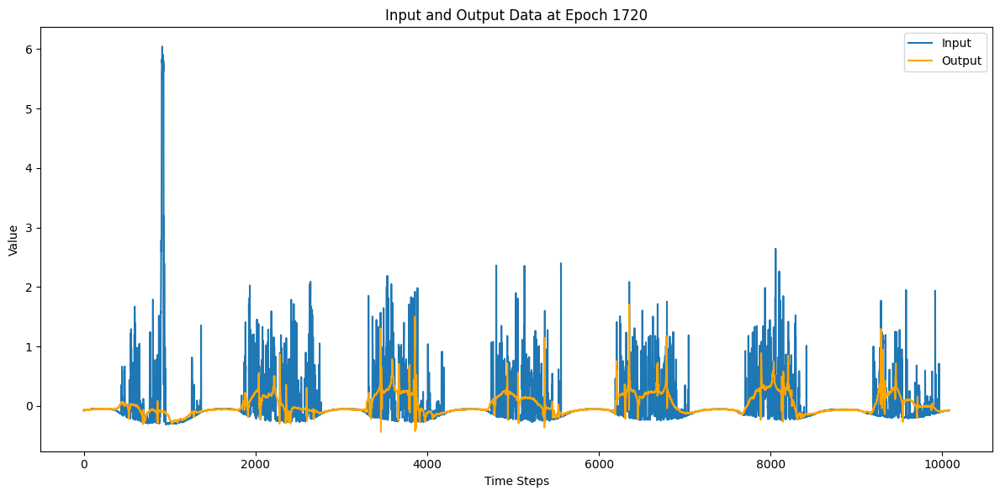

151/151 [==============================] - 13s 88ms/step - loss: 0.6992 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 1721/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7111 - val_loss: 0.8854 - lr: 1.0000e-05
Epoch 1722/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6993 - val_loss: 0.8849 - lr: 1.0000e-05
Epoch 1723/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7028 - val_loss: 0.8841 - lr: 1.0000e-05
Epoch 1724/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6994 - val_loss: 0.8854 - lr: 1.0000e-05
Epoch 1725/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6994 - val_loss: 0.8847 - lr: 1.0000e-05
Epoch 1726/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6991 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 1727/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6991 - val_loss: 0.8856 - lr: 1.0000e-05
Epoch 1728/10000


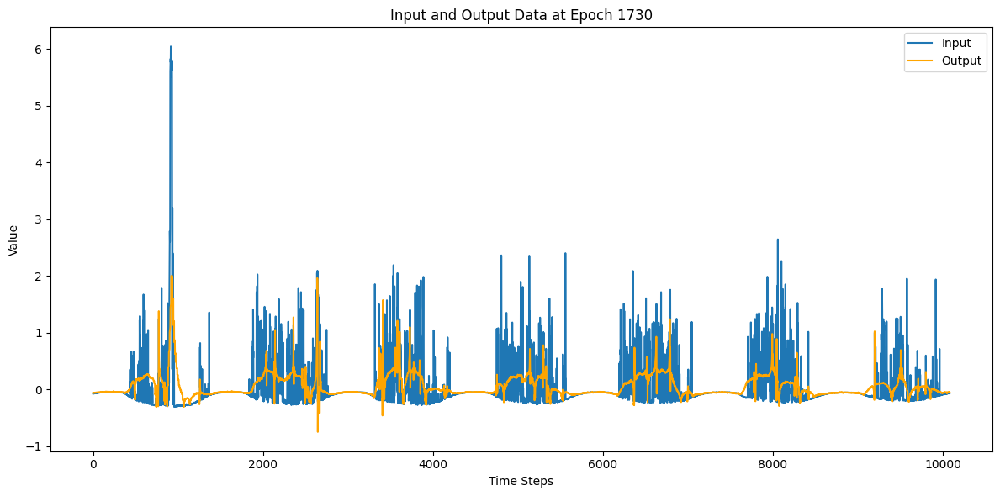

151/151 [==============================] - 13s 88ms/step - loss: 0.6991 - val_loss: 0.8844 - lr: 1.0000e-05
Epoch 1731/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6997 - val_loss: 0.8849 - lr: 1.0000e-05
Epoch 1732/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7028 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 1733/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6993 - val_loss: 0.8854 - lr: 1.0000e-05
Epoch 1734/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6997 - val_loss: 0.8842 - lr: 1.0000e-05
Epoch 1735/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7030 - val_loss: 0.8854 - lr: 1.0000e-05
Epoch 1736/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6994 - val_loss: 0.8853 - lr: 1.0000e-05
Epoch 1737/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7030 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 1738/10000


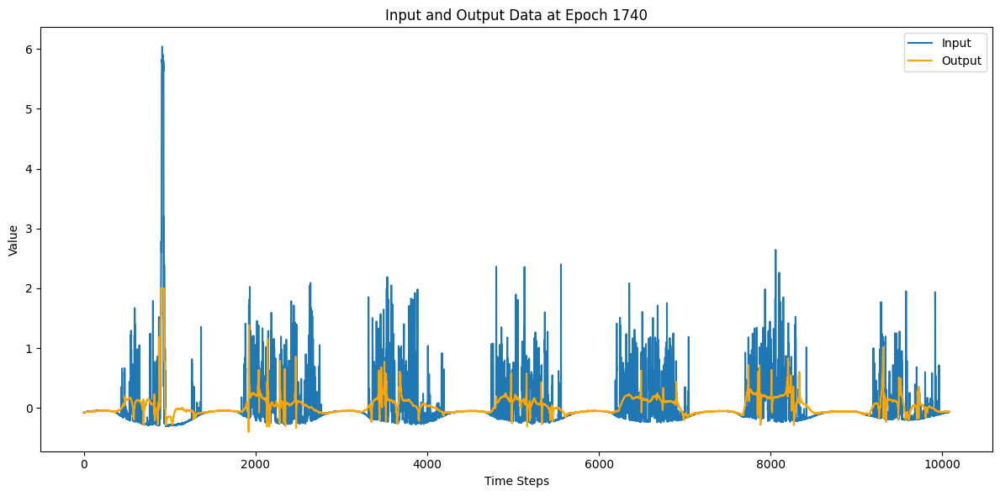

151/151 [==============================] - 13s 88ms/step - loss: 0.6996 - val_loss: 0.8854 - lr: 1.0000e-05
Epoch 1741/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6994 - val_loss: 0.8858 - lr: 1.0000e-05
Epoch 1742/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7029 - val_loss: 0.8848 - lr: 1.0000e-05
Epoch 1743/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6994 - val_loss: 0.8833 - lr: 1.0000e-05
Epoch 1744/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6995 - val_loss: 0.8847 - lr: 1.0000e-05
Epoch 1745/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6990 - val_loss: 0.8847 - lr: 1.0000e-05
Epoch 1746/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6995 - val_loss: 0.8852 - lr: 1.0000e-05
Epoch 1747/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6994 - val_loss: 0.8848 - lr: 1.0000e-05
Epoch 1748/10000


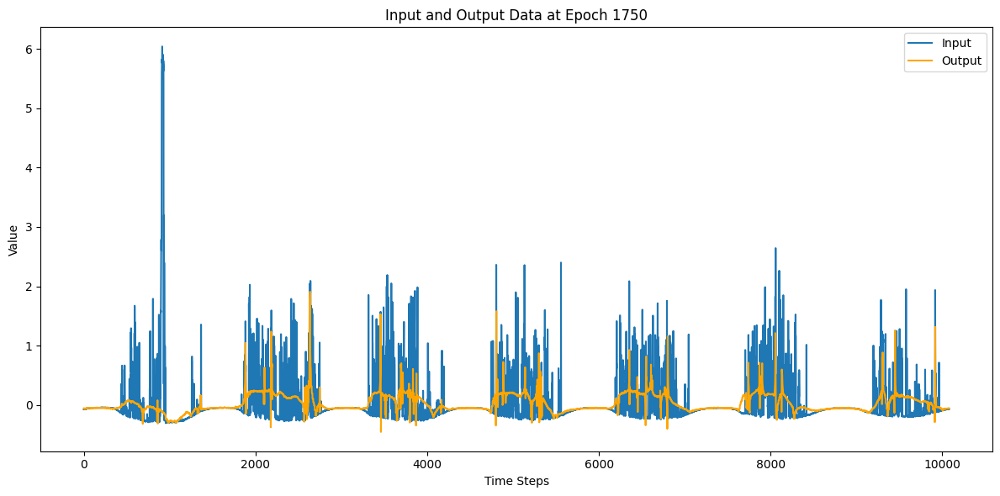

151/151 [==============================] - 13s 89ms/step - loss: 0.6992 - val_loss: 0.8841 - lr: 1.0000e-05
Epoch 1751/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6991 - val_loss: 0.8857 - lr: 1.0000e-05
Epoch 1752/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6993 - val_loss: 0.8847 - lr: 1.0000e-05
Epoch 1753/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7020 - val_loss: 0.8849 - lr: 1.0000e-05
Epoch 1754/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6993 - val_loss: 0.8855 - lr: 1.0000e-05
Epoch 1755/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6993 - val_loss: 0.8854 - lr: 1.0000e-05
Epoch 1756/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6993 - val_loss: 0.8849 - lr: 1.0000e-05
Epoch 1757/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6993 - val_loss: 0.8843 - lr: 1.0000e-05
Epoch 1758/10000


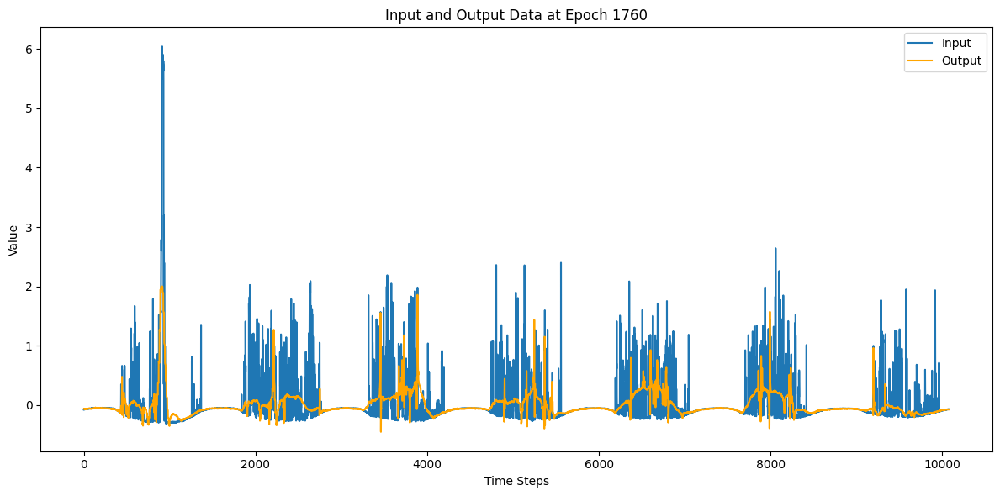

151/151 [==============================] - 14s 93ms/step - loss: 0.7005 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 1761/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6992 - val_loss: 0.8848 - lr: 1.0000e-05
Epoch 1762/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6992 - val_loss: 0.8844 - lr: 1.0000e-05
Epoch 1763/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6993 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 1764/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6994 - val_loss: 0.8847 - lr: 1.0000e-05
Epoch 1765/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7013 - val_loss: 0.8843 - lr: 1.0000e-05
Epoch 1766/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6998 - val_loss: 0.8844 - lr: 1.0000e-05
Epoch 1767/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6992 - val_loss: 0.8843 - lr: 1.0000e-05
Epoch 1768/10000


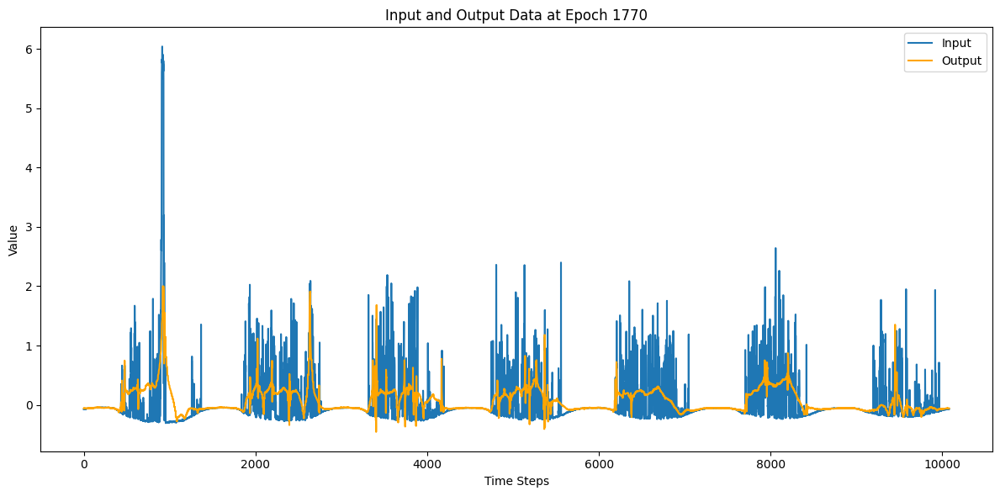

151/151 [==============================] - 13s 89ms/step - loss: 0.6993 - val_loss: 0.8844 - lr: 1.0000e-05
Epoch 1771/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6994 - val_loss: 0.8843 - lr: 1.0000e-05
Epoch 1772/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6993 - val_loss: 0.8854 - lr: 1.0000e-05
Epoch 1773/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6994 - val_loss: 0.8849 - lr: 1.0000e-05
Epoch 1774/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6994 - val_loss: 0.8843 - lr: 1.0000e-05
Epoch 1775/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7003 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 1776/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6993 - val_loss: 0.8844 - lr: 1.0000e-05
Epoch 1777/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7007 - val_loss: 0.8847 - lr: 1.0000e-05
Epoch 1778/10000


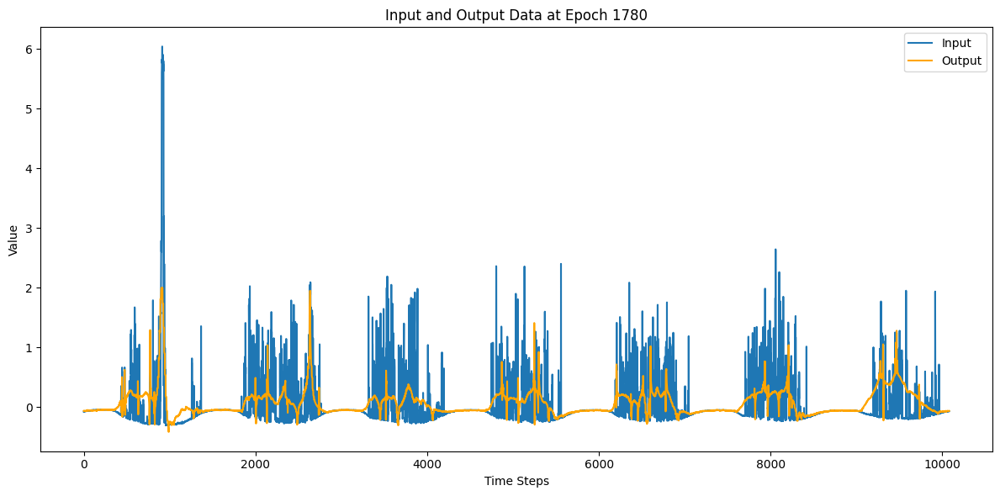

151/151 [==============================] - 13s 88ms/step - loss: 0.6992 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 1781/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.7027 - val_loss: 0.8854 - lr: 1.0000e-05
Epoch 1782/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6994 - val_loss: 0.8849 - lr: 1.0000e-05
Epoch 1783/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6989 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 1784/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7001 - val_loss: 0.8858 - lr: 1.0000e-05
Epoch 1785/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6992 - val_loss: 0.8855 - lr: 1.0000e-05
Epoch 1786/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6993 - val_loss: 0.8854 - lr: 1.0000e-05
Epoch 1787/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6992 - val_loss: 0.8853 - lr: 1.0000e-05
Epoch 1788/10000


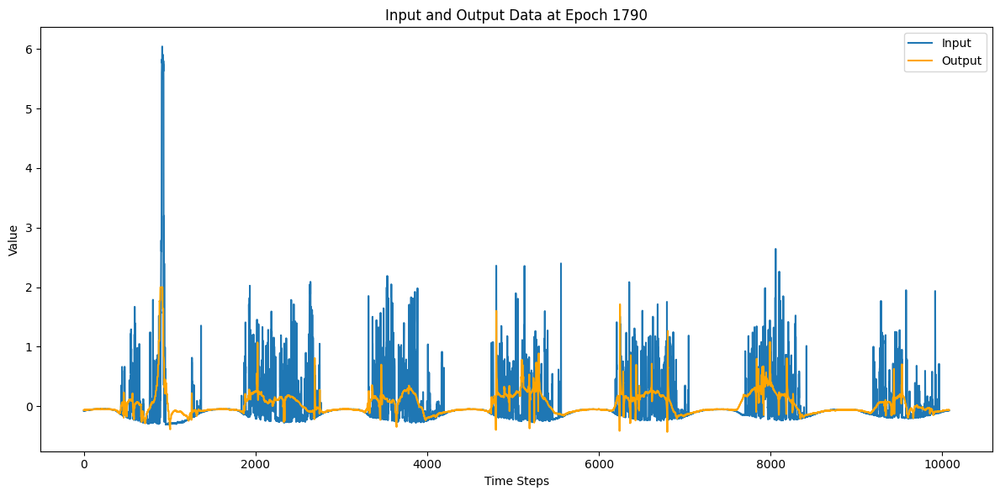

151/151 [==============================] - 13s 88ms/step - loss: 0.7029 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 1791/10000
151/151 [==============================] - 13s 87ms/step - loss: 0.6992 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 1792/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6993 - val_loss: 0.8843 - lr: 1.0000e-05
Epoch 1793/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6995 - val_loss: 0.8854 - lr: 1.0000e-05
Epoch 1794/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6994 - val_loss: 0.8857 - lr: 1.0000e-05
Epoch 1795/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6990 - val_loss: 0.8865 - lr: 1.0000e-05
Epoch 1796/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7000 - val_loss: 0.8848 - lr: 1.0000e-05
Epoch 1797/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6991 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 1798/10000


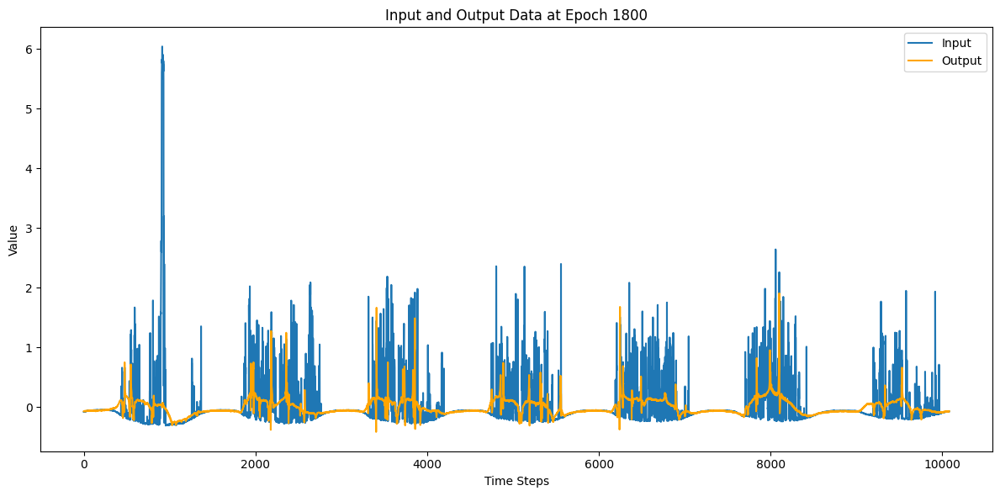

151/151 [==============================] - 13s 89ms/step - loss: 0.6992 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 1801/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6990 - val_loss: 0.8855 - lr: 1.0000e-05
Epoch 1802/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6994 - val_loss: 0.8848 - lr: 1.0000e-05
Epoch 1803/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6992 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 1804/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6991 - val_loss: 0.8844 - lr: 1.0000e-05
Epoch 1805/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6991 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 1806/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6994 - val_loss: 0.8848 - lr: 1.0000e-05
Epoch 1807/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6991 - val_loss: 0.8843 - lr: 1.0000e-05
Epoch 1808/10000


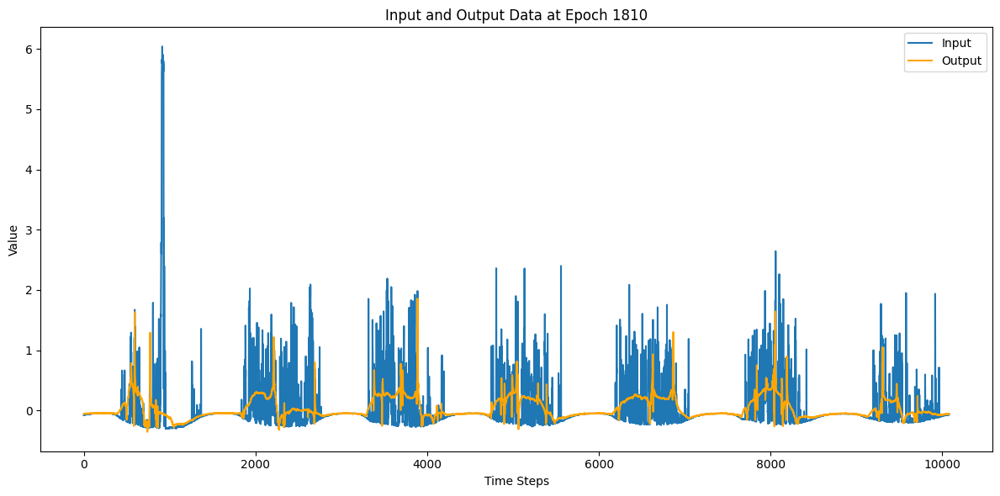

151/151 [==============================] - 13s 89ms/step - loss: 0.7026 - val_loss: 0.8848 - lr: 1.0000e-05
Epoch 1811/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6992 - val_loss: 0.8841 - lr: 1.0000e-05
Epoch 1812/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.7006 - val_loss: 0.8852 - lr: 1.0000e-05
Epoch 1813/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6991 - val_loss: 0.8852 - lr: 1.0000e-05
Epoch 1814/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6999 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 1815/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.7149 - val_loss: 0.8838 - lr: 1.0000e-05
Epoch 1816/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7003 - val_loss: 0.8859 - lr: 1.0000e-05
Epoch 1817/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6992 - val_loss: 0.8853 - lr: 1.0000e-05
Epoch 1818/10000


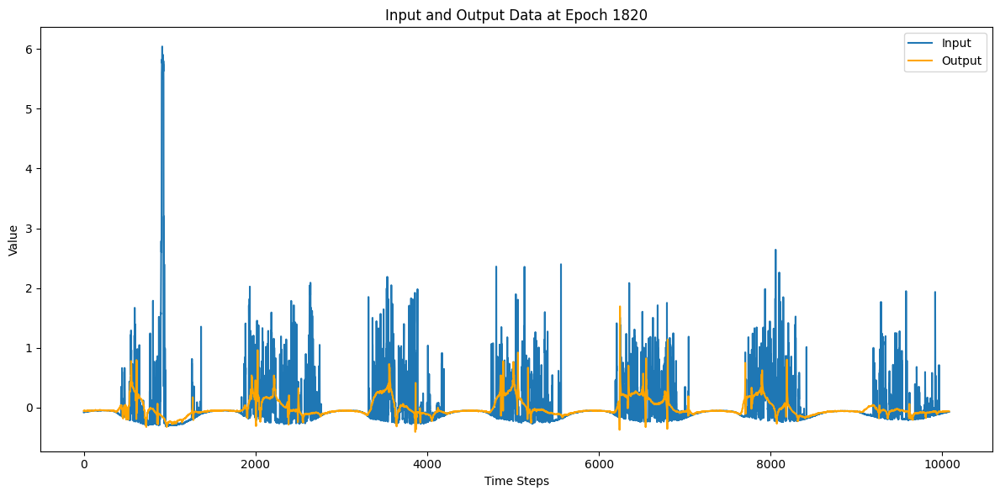

151/151 [==============================] - 13s 89ms/step - loss: 0.6999 - val_loss: 0.8843 - lr: 1.0000e-05
Epoch 1821/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7025 - val_loss: 0.8845 - lr: 1.0000e-05
Epoch 1822/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6996 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 1823/10000
151/151 [==============================] - 13s 87ms/step - loss: 0.6993 - val_loss: 0.8849 - lr: 1.0000e-05
Epoch 1824/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7015 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 1825/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6994 - val_loss: 0.8849 - lr: 1.0000e-05
Epoch 1826/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6994 - val_loss: 0.8855 - lr: 1.0000e-05
Epoch 1827/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7102 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 1828/10000


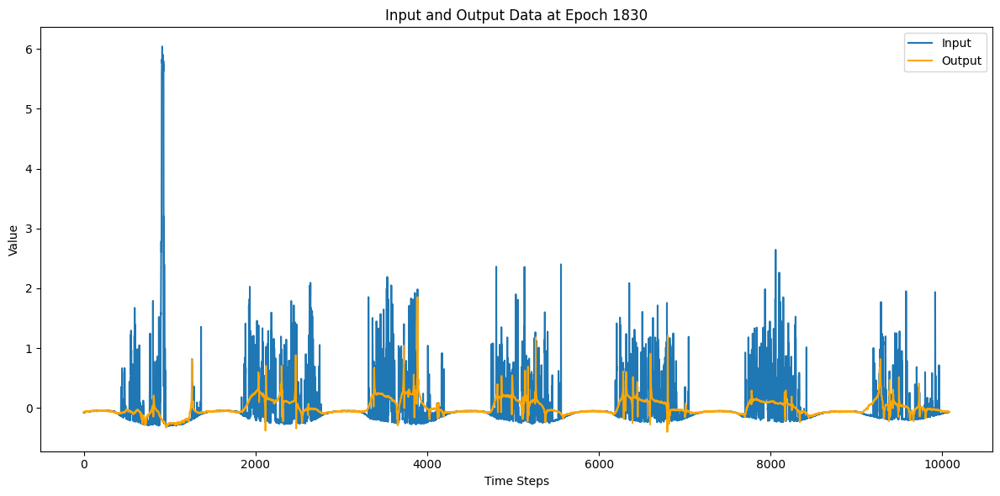

151/151 [==============================] - 13s 89ms/step - loss: 0.6993 - val_loss: 0.8853 - lr: 1.0000e-05
Epoch 1831/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7110 - val_loss: 0.8858 - lr: 1.0000e-05
Epoch 1832/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7026 - val_loss: 0.8844 - lr: 1.0000e-05
Epoch 1833/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6992 - val_loss: 0.8853 - lr: 1.0000e-05
Epoch 1834/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6996 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 1835/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6989 - val_loss: 0.8849 - lr: 1.0000e-05
Epoch 1836/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6992 - val_loss: 0.8841 - lr: 1.0000e-05
Epoch 1837/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6995 - val_loss: 0.8856 - lr: 1.0000e-05
Epoch 1838/10000


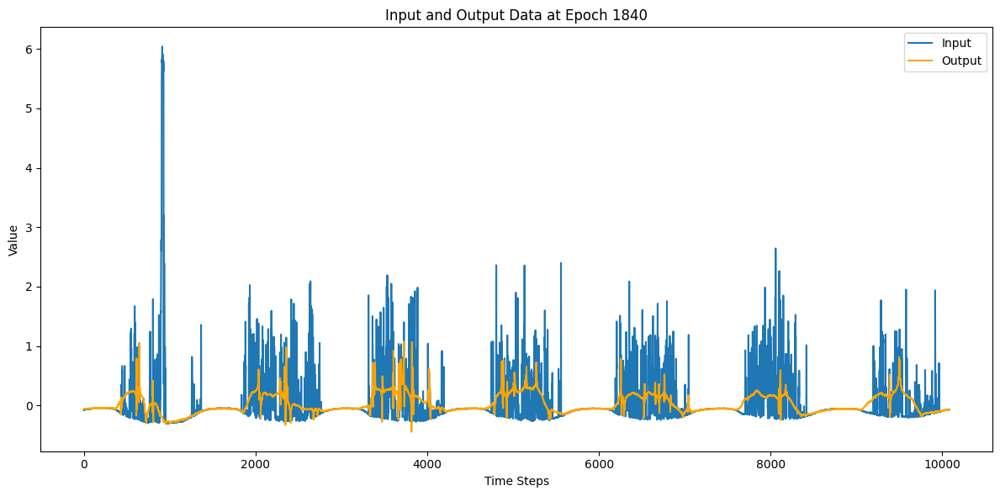

151/151 [==============================] - 13s 89ms/step - loss: 0.7061 - val_loss: 0.8842 - lr: 1.0000e-05
Epoch 1841/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6990 - val_loss: 0.8853 - lr: 1.0000e-05
Epoch 1842/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6993 - val_loss: 0.8842 - lr: 1.0000e-05
Epoch 1843/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6991 - val_loss: 0.8853 - lr: 1.0000e-05
Epoch 1844/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6991 - val_loss: 0.8842 - lr: 1.0000e-05
Epoch 1845/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6990 - val_loss: 0.8857 - lr: 1.0000e-05
Epoch 1846/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6990 - val_loss: 0.8854 - lr: 1.0000e-05
Epoch 1847/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6999 - val_loss: 0.8849 - lr: 1.0000e-05
Epoch 1848/10000


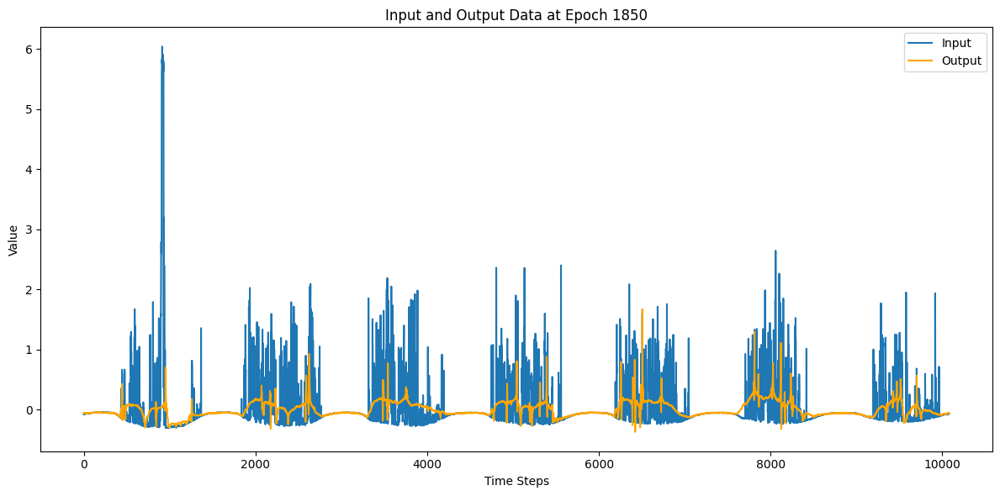

151/151 [==============================] - 13s 88ms/step - loss: 0.6989 - val_loss: 0.8848 - lr: 1.0000e-05
Epoch 1851/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6991 - val_loss: 0.8860 - lr: 1.0000e-05
Epoch 1852/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6994 - val_loss: 0.8835 - lr: 1.0000e-05
Epoch 1853/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6992 - val_loss: 0.8848 - lr: 1.0000e-05
Epoch 1854/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6991 - val_loss: 0.8855 - lr: 1.0000e-05
Epoch 1855/10000
151/151 [==============================] - 13s 88ms/step - loss: 0.6993 - val_loss: 0.8858 - lr: 1.0000e-05
Epoch 1856/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6991 - val_loss: 0.8848 - lr: 1.0000e-05
Epoch 1857/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6993 - val_loss: 0.8853 - lr: 1.0000e-05
Epoch 1858/10000


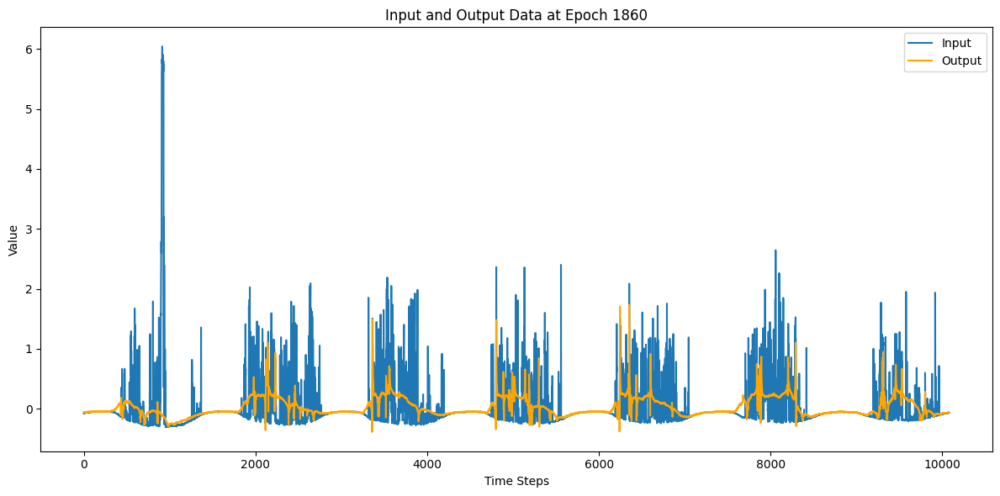

151/151 [==============================] - 13s 89ms/step - loss: 0.7026 - val_loss: 0.8849 - lr: 1.0000e-05
Epoch 1861/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6990 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 1862/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6988 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 1863/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7078 - val_loss: 0.8845 - lr: 1.0000e-05
Epoch 1864/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6991 - val_loss: 0.8849 - lr: 1.0000e-05
Epoch 1865/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7042 - val_loss: 0.8852 - lr: 1.0000e-05
Epoch 1866/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7065 - val_loss: 0.8853 - lr: 1.0000e-05
Epoch 1867/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6992 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 1868/10000


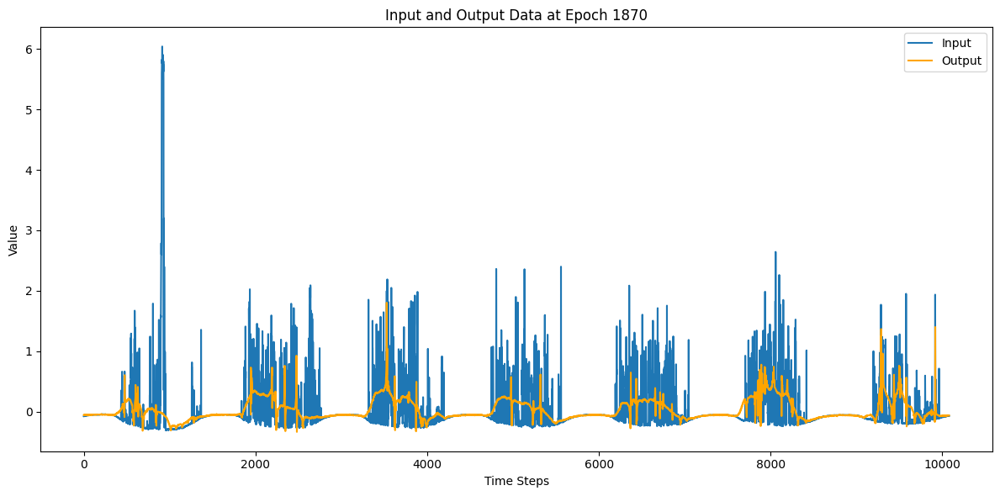

151/151 [==============================] - 13s 89ms/step - loss: 0.6991 - val_loss: 0.8852 - lr: 1.0000e-05
Epoch 1871/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6991 - val_loss: 0.8847 - lr: 1.0000e-05
Epoch 1872/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6992 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 1873/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6993 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 1874/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6993 - val_loss: 0.8847 - lr: 1.0000e-05
Epoch 1875/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6991 - val_loss: 0.8847 - lr: 1.0000e-05
Epoch 1876/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6995 - val_loss: 0.8845 - lr: 1.0000e-05
Epoch 1877/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6993 - val_loss: 0.8853 - lr: 1.0000e-05
Epoch 1878/10000


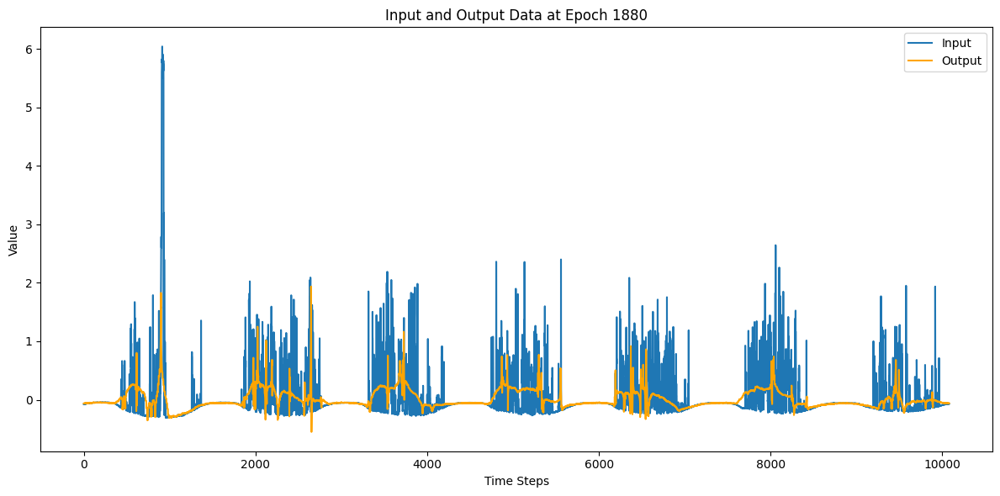

151/151 [==============================] - 13s 88ms/step - loss: 0.6992 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 1881/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6992 - val_loss: 0.8848 - lr: 1.0000e-05
Epoch 1882/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6990 - val_loss: 0.8858 - lr: 1.0000e-05
Epoch 1883/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6995 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 1884/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6994 - val_loss: 0.8852 - lr: 1.0000e-05
Epoch 1885/10000
151/151 [==============================] - 13s 87ms/step - loss: 0.6995 - val_loss: 0.8844 - lr: 1.0000e-05
Epoch 1886/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6993 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 1887/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6993 - val_loss: 0.8853 - lr: 1.0000e-05
Epoch 1888/10000


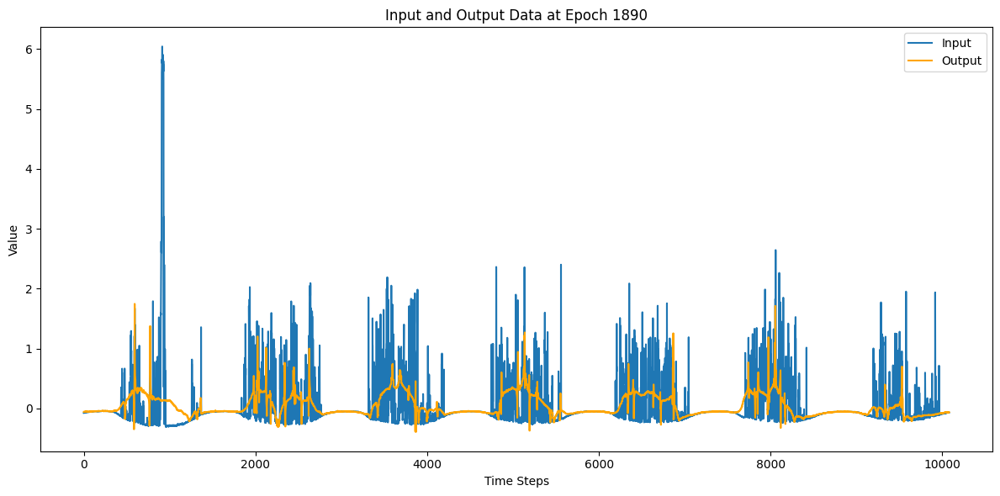

151/151 [==============================] - 14s 90ms/step - loss: 0.6990 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 1891/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7108 - val_loss: 0.8861 - lr: 1.0000e-05
Epoch 1892/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6992 - val_loss: 0.8852 - lr: 1.0000e-05
Epoch 1893/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7003 - val_loss: 0.8844 - lr: 1.0000e-05
Epoch 1894/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6994 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 1895/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6993 - val_loss: 0.8854 - lr: 1.0000e-05
Epoch 1896/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6990 - val_loss: 0.8847 - lr: 1.0000e-05
Epoch 1897/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6993 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 1898/10000


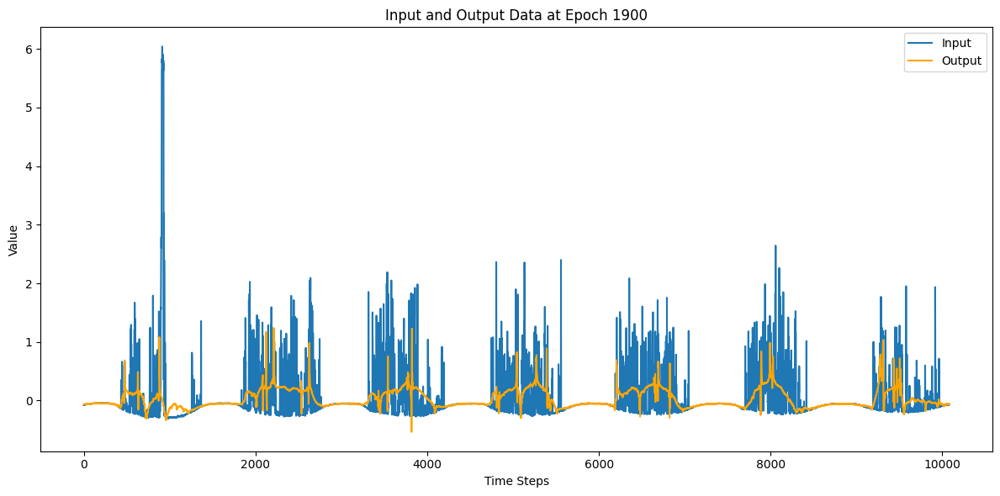

151/151 [==============================] - 14s 90ms/step - loss: 0.6992 - val_loss: 0.8852 - lr: 1.0000e-05
Epoch 1901/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6990 - val_loss: 0.8853 - lr: 1.0000e-05
Epoch 1902/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6991 - val_loss: 0.8847 - lr: 1.0000e-05
Epoch 1903/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6994 - val_loss: 0.8845 - lr: 1.0000e-05
Epoch 1904/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6994 - val_loss: 0.8849 - lr: 1.0000e-05
Epoch 1905/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6990 - val_loss: 0.8847 - lr: 1.0000e-05
Epoch 1906/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7003 - val_loss: 0.8856 - lr: 1.0000e-05
Epoch 1907/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6996 - val_loss: 0.8836 - lr: 1.0000e-05
Epoch 1908/10000


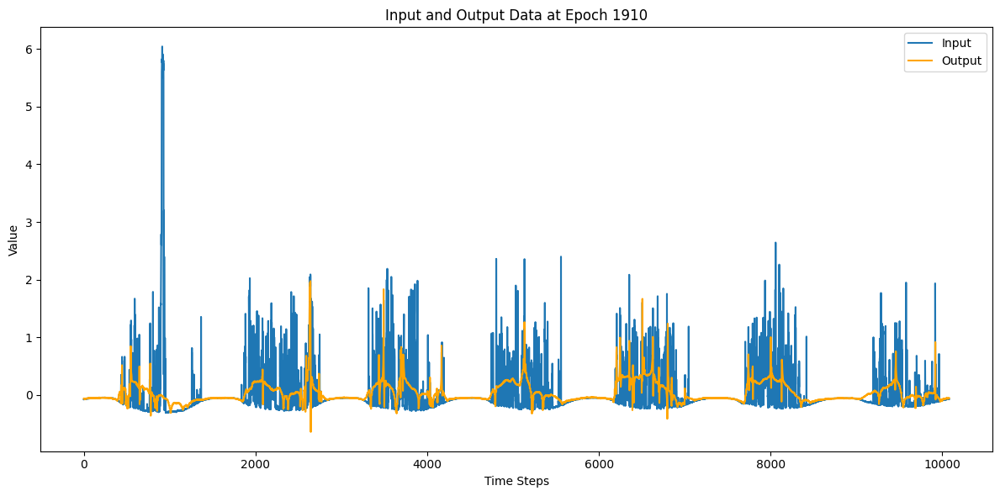

151/151 [==============================] - 13s 89ms/step - loss: 0.6993 - val_loss: 0.8844 - lr: 1.0000e-05
Epoch 1911/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6992 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 1912/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7027 - val_loss: 0.8847 - lr: 1.0000e-05
Epoch 1913/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6992 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 1914/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6994 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 1915/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.7064 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 1916/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6991 - val_loss: 0.8847 - lr: 1.0000e-05
Epoch 1917/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6994 - val_loss: 0.8854 - lr: 1.0000e-05
Epoch 1918/10000


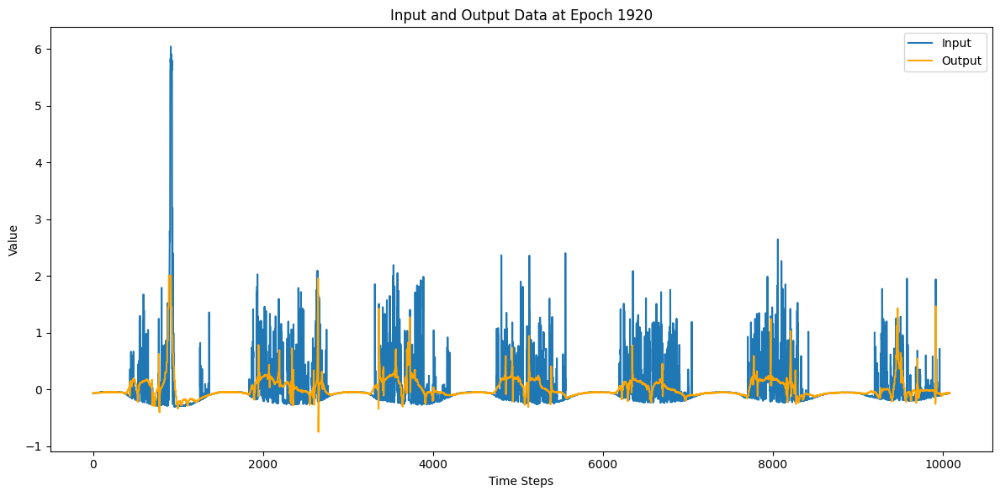

151/151 [==============================] - 13s 89ms/step - loss: 0.6992 - val_loss: 0.8855 - lr: 1.0000e-05
Epoch 1921/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6989 - val_loss: 0.8844 - lr: 1.0000e-05
Epoch 1922/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6992 - val_loss: 0.8854 - lr: 1.0000e-05
Epoch 1923/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6993 - val_loss: 0.8852 - lr: 1.0000e-05
Epoch 1924/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6992 - val_loss: 0.8845 - lr: 1.0000e-05
Epoch 1925/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6993 - val_loss: 0.8847 - lr: 1.0000e-05
Epoch 1926/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6996 - val_loss: 0.8857 - lr: 1.0000e-05
Epoch 1927/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6990 - val_loss: 0.8849 - lr: 1.0000e-05
Epoch 1928/10000


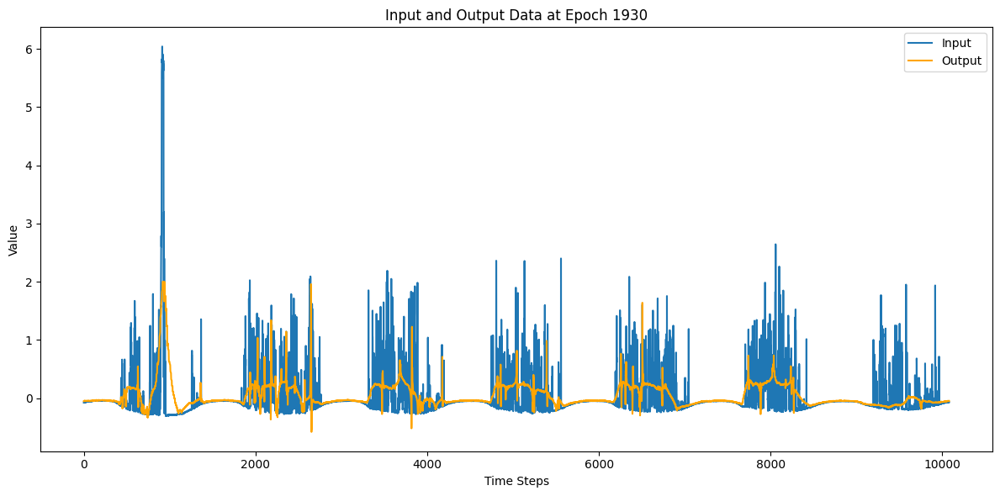

151/151 [==============================] - 13s 89ms/step - loss: 0.6992 - val_loss: 0.8849 - lr: 1.0000e-05
Epoch 1931/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6990 - val_loss: 0.8845 - lr: 1.0000e-05
Epoch 1932/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6996 - val_loss: 0.8856 - lr: 1.0000e-05
Epoch 1933/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6990 - val_loss: 0.8843 - lr: 1.0000e-05
Epoch 1934/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6994 - val_loss: 0.8847 - lr: 1.0000e-05
Epoch 1935/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6992 - val_loss: 0.8849 - lr: 1.0000e-05
Epoch 1936/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6997 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 1937/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6991 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 1938/10000


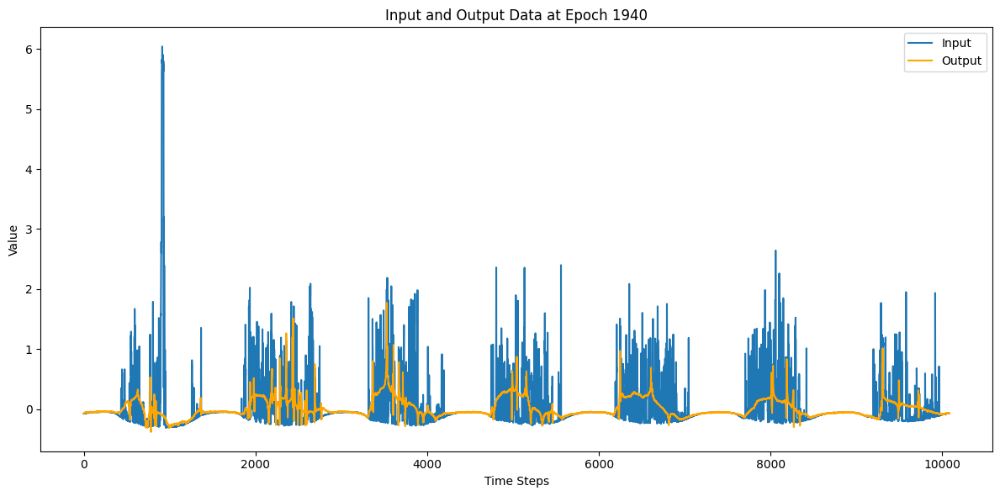

151/151 [==============================] - 13s 88ms/step - loss: 0.6994 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 1941/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7022 - val_loss: 0.8852 - lr: 1.0000e-05
Epoch 1942/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6991 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 1943/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6991 - val_loss: 0.8854 - lr: 1.0000e-05
Epoch 1944/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6995 - val_loss: 0.8853 - lr: 1.0000e-05
Epoch 1945/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6991 - val_loss: 0.8841 - lr: 1.0000e-05
Epoch 1946/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6991 - val_loss: 0.8848 - lr: 1.0000e-05
Epoch 1947/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6988 - val_loss: 0.8847 - lr: 1.0000e-05
Epoch 1948/10000


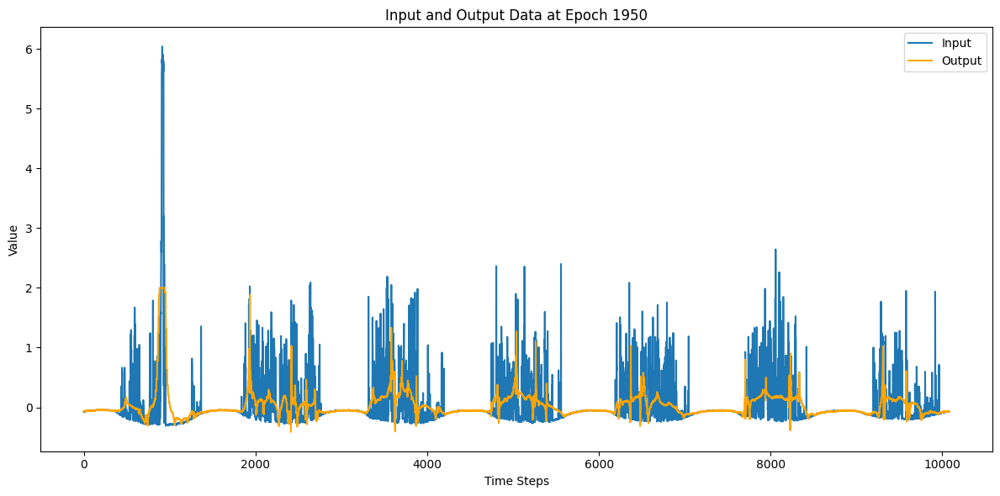

151/151 [==============================] - 14s 94ms/step - loss: 0.6992 - val_loss: 0.8861 - lr: 1.0000e-05
Epoch 1951/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6995 - val_loss: 0.8842 - lr: 1.0000e-05
Epoch 1952/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6992 - val_loss: 0.8848 - lr: 1.0000e-05
Epoch 1953/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6991 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 1954/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6994 - val_loss: 0.8849 - lr: 1.0000e-05
Epoch 1955/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7060 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 1956/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6993 - val_loss: 0.8841 - lr: 1.0000e-05
Epoch 1957/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6992 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 1958/10000


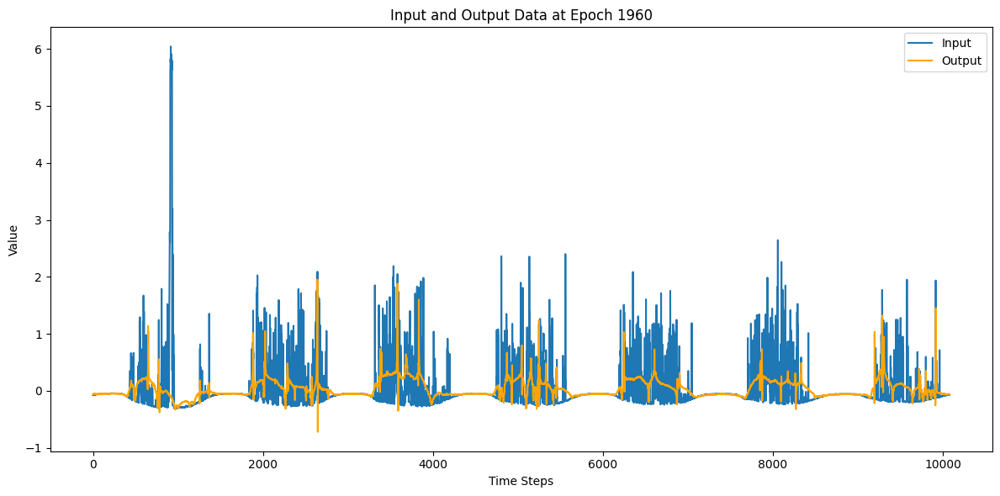

151/151 [==============================] - 13s 88ms/step - loss: 0.6994 - val_loss: 0.8849 - lr: 1.0000e-05
Epoch 1961/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6992 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 1962/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6990 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 1963/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6990 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 1964/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6991 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 1965/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6991 - val_loss: 0.8847 - lr: 1.0000e-05
Epoch 1966/10000
151/151 [==============================] - 13s 82ms/step - loss: 0.7020 - val_loss: 0.8841 - lr: 1.0000e-05
Epoch 1967/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6989 - val_loss: 0.8853 - lr: 1.0000e-05
Epoch 1968/10000


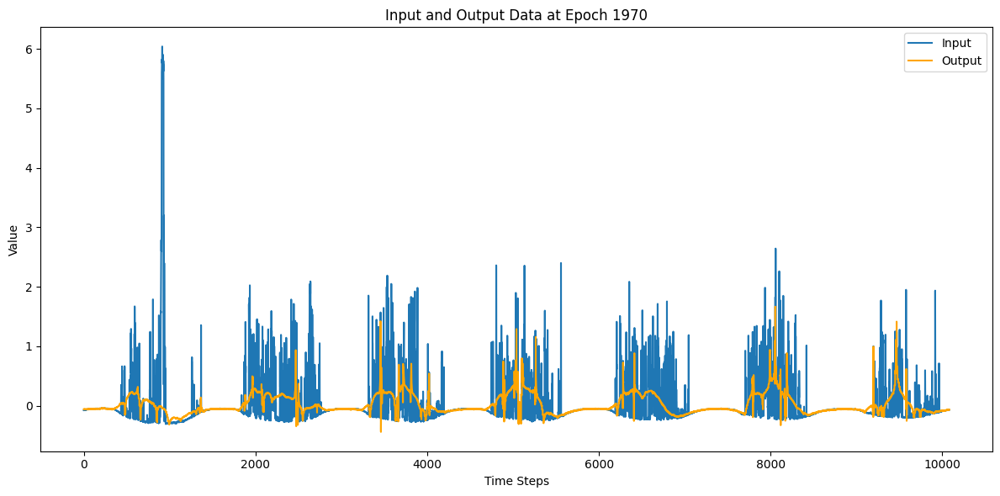

151/151 [==============================] - 13s 89ms/step - loss: 0.6989 - val_loss: 0.8860 - lr: 1.0000e-05
Epoch 1971/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7009 - val_loss: 0.8848 - lr: 1.0000e-05
Epoch 1972/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6996 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 1973/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6998 - val_loss: 0.8852 - lr: 1.0000e-05
Epoch 1974/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7020 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 1975/10000
151/151 [==============================] - 13s 82ms/step - loss: 0.7028 - val_loss: 0.8838 - lr: 1.0000e-05
Epoch 1976/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6993 - val_loss: 0.8854 - lr: 1.0000e-05
Epoch 1977/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6993 - val_loss: 0.8857 - lr: 1.0000e-05
Epoch 1978/10000


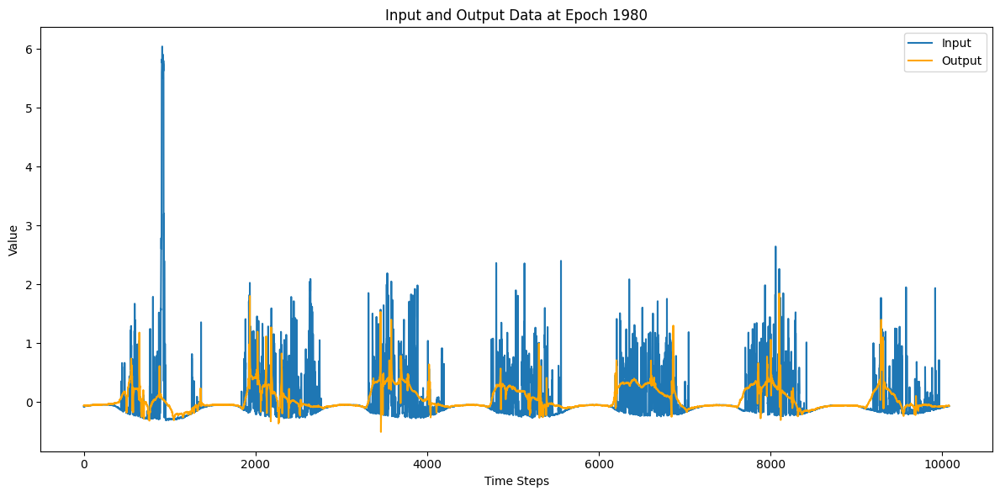

151/151 [==============================] - 14s 90ms/step - loss: 0.6991 - val_loss: 0.8847 - lr: 1.0000e-05
Epoch 1981/10000
151/151 [==============================] - 13s 87ms/step - loss: 0.6992 - val_loss: 0.8839 - lr: 1.0000e-05
Epoch 1982/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7077 - val_loss: 0.8853 - lr: 1.0000e-05
Epoch 1983/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6991 - val_loss: 0.8840 - lr: 1.0000e-05
Epoch 1984/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6993 - val_loss: 0.8852 - lr: 1.0000e-05
Epoch 1985/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6988 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 1986/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7028 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 1987/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6998 - val_loss: 0.8837 - lr: 1.0000e-05
Epoch 1988/10000


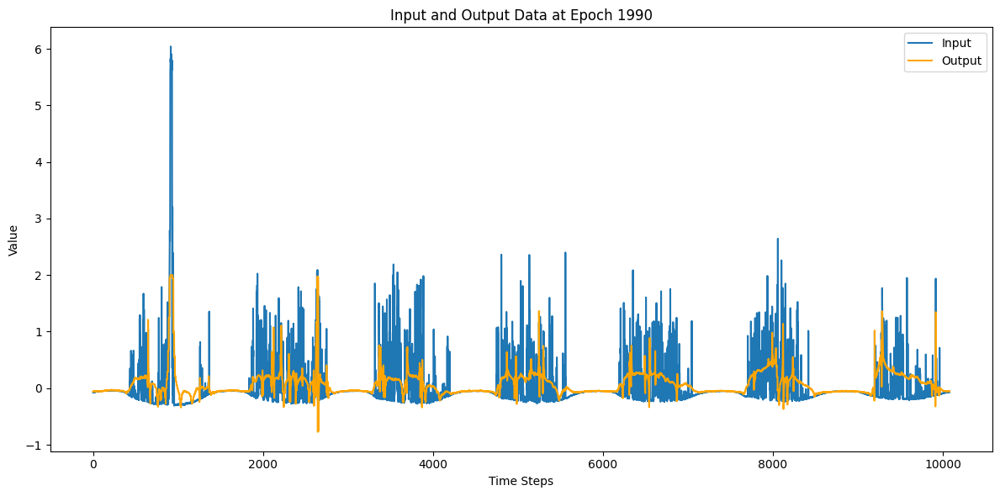

151/151 [==============================] - 13s 89ms/step - loss: 0.6992 - val_loss: 0.8854 - lr: 1.0000e-05
Epoch 1991/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6992 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 1992/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.7109 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 1993/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6988 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 1994/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7046 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 1995/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6993 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 1996/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6995 - val_loss: 0.8848 - lr: 1.0000e-05
Epoch 1997/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6993 - val_loss: 0.8847 - lr: 1.0000e-05
Epoch 1998/10000


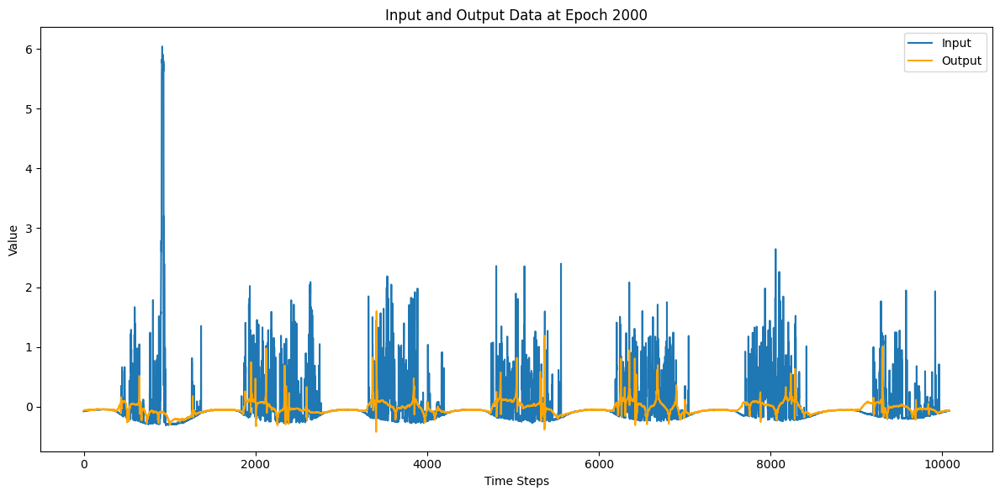

151/151 [==============================] - 13s 89ms/step - loss: 0.6993 - val_loss: 0.8852 - lr: 1.0000e-05
Epoch 2001/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6991 - val_loss: 0.8845 - lr: 1.0000e-05
Epoch 2002/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6991 - val_loss: 0.8849 - lr: 1.0000e-05
Epoch 2003/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6992 - val_loss: 0.8838 - lr: 1.0000e-05
Epoch 2004/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6994 - val_loss: 0.8849 - lr: 1.0000e-05
Epoch 2005/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6993 - val_loss: 0.8854 - lr: 1.0000e-05
Epoch 2006/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6992 - val_loss: 0.8843 - lr: 1.0000e-05
Epoch 2007/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6995 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 2008/10000


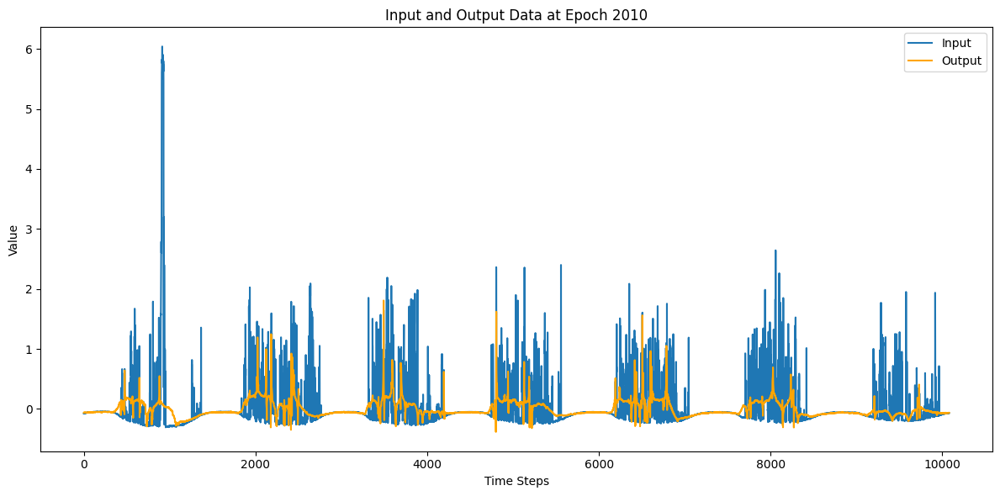

151/151 [==============================] - 13s 88ms/step - loss: 0.6992 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 2011/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6991 - val_loss: 0.8845 - lr: 1.0000e-05
Epoch 2012/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6999 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 2013/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6989 - val_loss: 0.8849 - lr: 1.0000e-05
Epoch 2014/10000
151/151 [==============================] - 13s 87ms/step - loss: 0.6993 - val_loss: 0.8841 - lr: 1.0000e-05
Epoch 2015/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7040 - val_loss: 0.8861 - lr: 1.0000e-05
Epoch 2016/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6992 - val_loss: 0.8847 - lr: 1.0000e-05
Epoch 2017/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6993 - val_loss: 0.8838 - lr: 1.0000e-05
Epoch 2018/10000


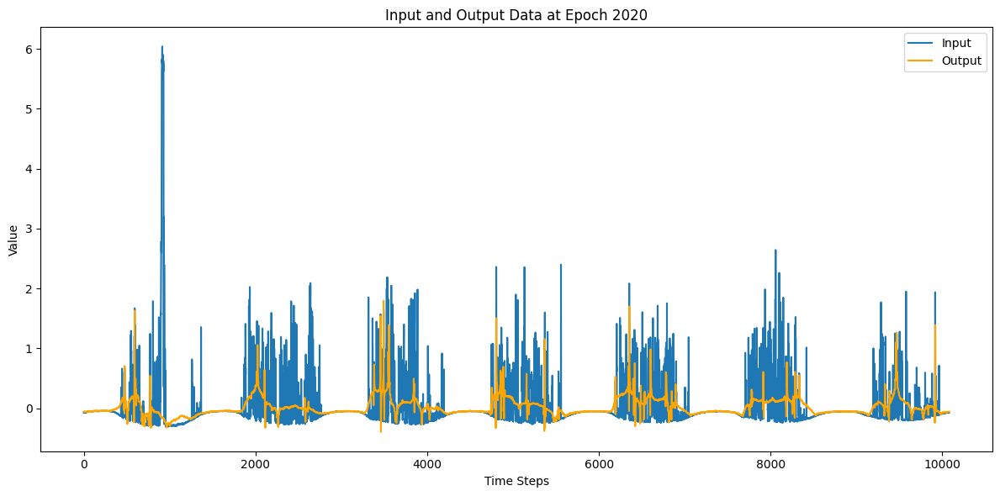

151/151 [==============================] - 14s 91ms/step - loss: 0.7029 - val_loss: 0.8845 - lr: 1.0000e-05
Epoch 2021/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7040 - val_loss: 0.8852 - lr: 1.0000e-05
Epoch 2022/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6993 - val_loss: 0.8857 - lr: 1.0000e-05
Epoch 2023/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6991 - val_loss: 0.8852 - lr: 1.0000e-05
Epoch 2024/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.7022 - val_loss: 0.8847 - lr: 1.0000e-05
Epoch 2025/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6992 - val_loss: 0.8848 - lr: 1.0000e-05
Epoch 2026/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6989 - val_loss: 0.8848 - lr: 1.0000e-05
Epoch 2027/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6994 - val_loss: 0.8857 - lr: 1.0000e-05
Epoch 2028/10000


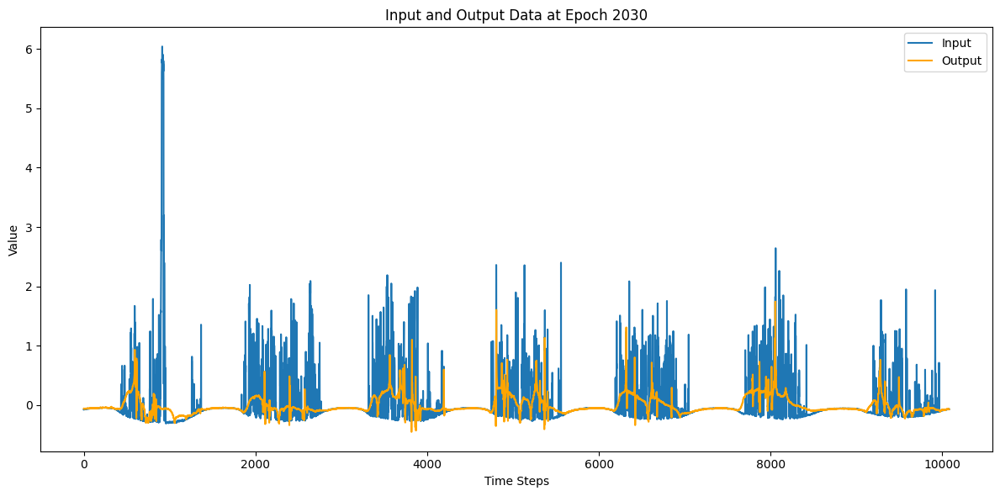

151/151 [==============================] - 13s 89ms/step - loss: 0.6991 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 2031/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6993 - val_loss: 0.8852 - lr: 1.0000e-05
Epoch 2032/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6989 - val_loss: 0.8844 - lr: 1.0000e-05
Epoch 2033/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6993 - val_loss: 0.8853 - lr: 1.0000e-05
Epoch 2034/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6995 - val_loss: 0.8856 - lr: 1.0000e-05
Epoch 2035/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6992 - val_loss: 0.8843 - lr: 1.0000e-05
Epoch 2036/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.7044 - val_loss: 0.8856 - lr: 1.0000e-05
Epoch 2037/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6990 - val_loss: 0.8855 - lr: 1.0000e-05
Epoch 2038/10000


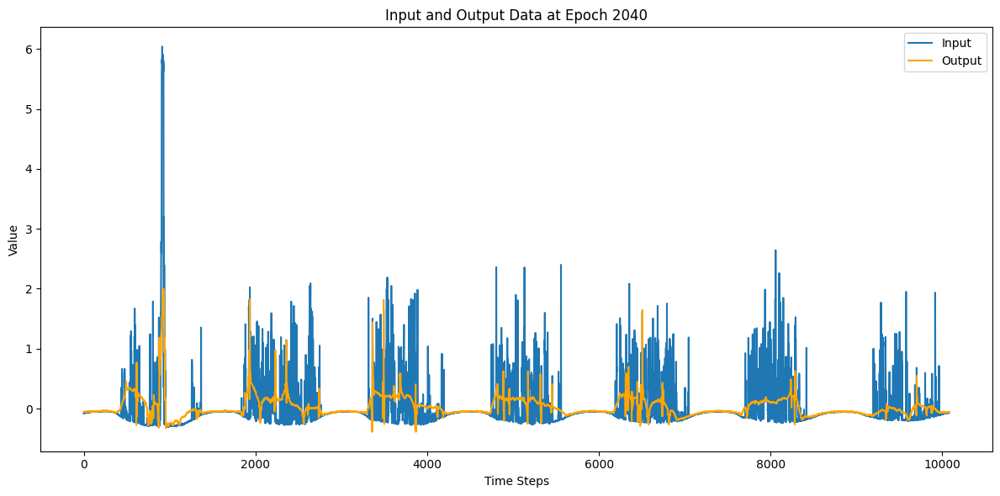

151/151 [==============================] - 14s 90ms/step - loss: 0.6998 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 2041/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6990 - val_loss: 0.8855 - lr: 1.0000e-05
Epoch 2042/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6992 - val_loss: 0.8843 - lr: 1.0000e-05
Epoch 2043/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6994 - val_loss: 0.8848 - lr: 1.0000e-05
Epoch 2044/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7030 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 2045/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6988 - val_loss: 0.8842 - lr: 1.0000e-05
Epoch 2046/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6988 - val_loss: 0.8852 - lr: 1.0000e-05
Epoch 2047/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6991 - val_loss: 0.8853 - lr: 1.0000e-05
Epoch 2048/10000


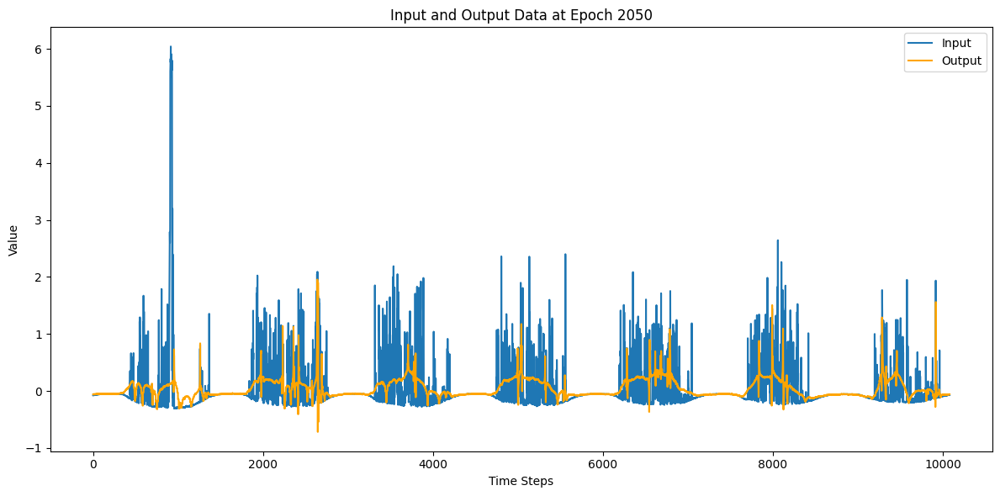

151/151 [==============================] - 14s 90ms/step - loss: 0.6993 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 2051/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6990 - val_loss: 0.8849 - lr: 1.0000e-05
Epoch 2052/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6991 - val_loss: 0.8843 - lr: 1.0000e-05
Epoch 2053/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6989 - val_loss: 0.8849 - lr: 1.0000e-05
Epoch 2054/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6995 - val_loss: 0.8848 - lr: 1.0000e-05
Epoch 2055/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6994 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 2056/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6992 - val_loss: 0.8848 - lr: 1.0000e-05
Epoch 2057/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6990 - val_loss: 0.8855 - lr: 1.0000e-05
Epoch 2058/10000


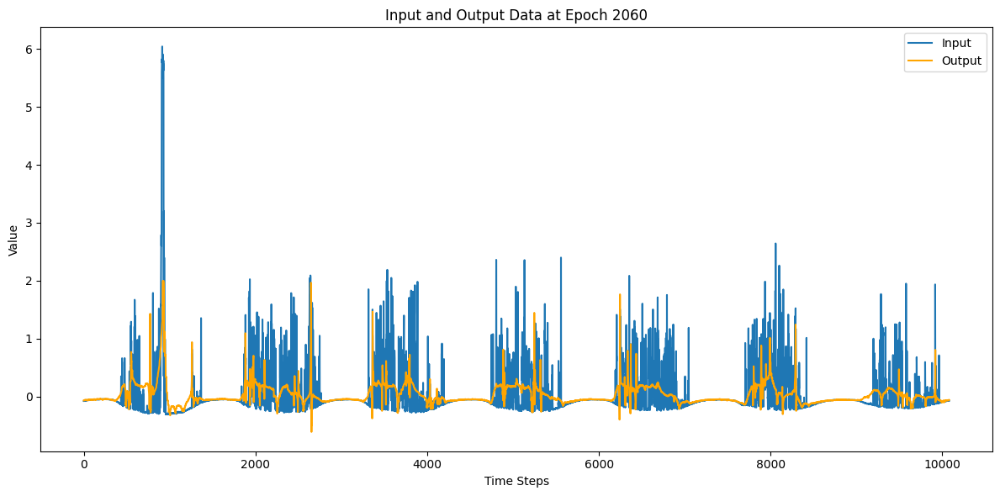

151/151 [==============================] - 13s 89ms/step - loss: 0.7029 - val_loss: 0.8855 - lr: 1.0000e-05
Epoch 2061/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.7014 - val_loss: 0.8852 - lr: 1.0000e-05
Epoch 2062/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6990 - val_loss: 0.8848 - lr: 1.0000e-05
Epoch 2063/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6991 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 2064/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6999 - val_loss: 0.8854 - lr: 1.0000e-05
Epoch 2065/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6989 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 2066/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7015 - val_loss: 0.8852 - lr: 1.0000e-05
Epoch 2067/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.7003 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 2068/10000


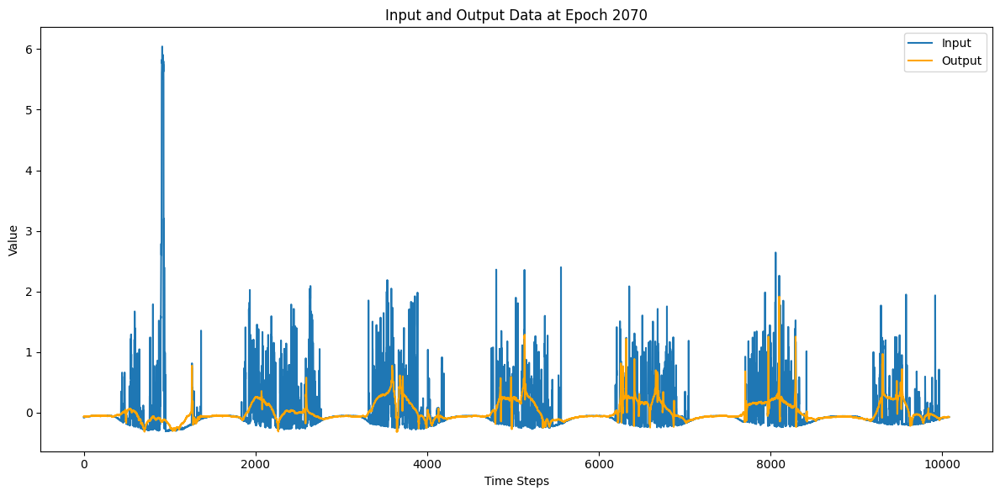

151/151 [==============================] - 13s 89ms/step - loss: 0.7075 - val_loss: 0.8855 - lr: 1.0000e-05
Epoch 2071/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6994 - val_loss: 0.8847 - lr: 1.0000e-05
Epoch 2072/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6992 - val_loss: 0.8847 - lr: 1.0000e-05
Epoch 2073/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6999 - val_loss: 0.8855 - lr: 1.0000e-05
Epoch 2074/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6989 - val_loss: 0.8852 - lr: 1.0000e-05
Epoch 2075/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6992 - val_loss: 0.8849 - lr: 1.0000e-05
Epoch 2076/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6990 - val_loss: 0.8842 - lr: 1.0000e-05
Epoch 2077/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6997 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 2078/10000


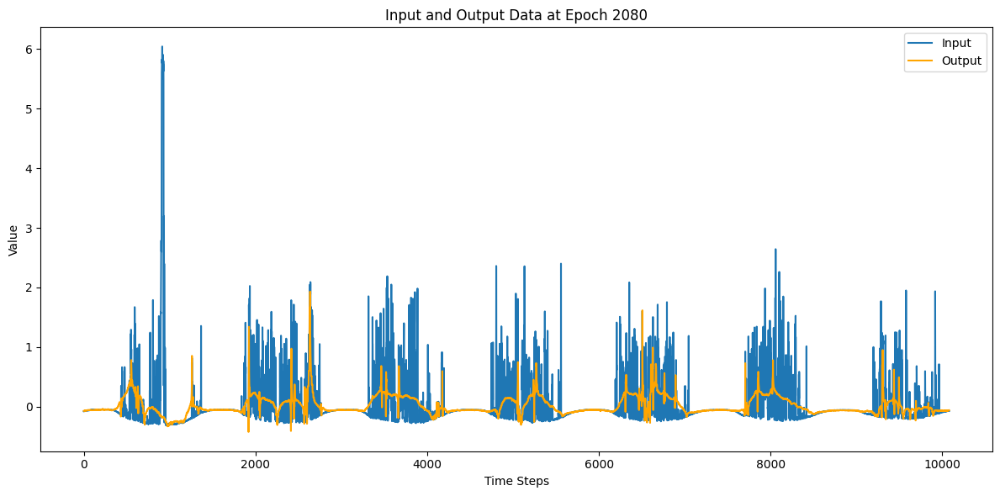

151/151 [==============================] - 14s 95ms/step - loss: 0.6990 - val_loss: 0.8849 - lr: 1.0000e-05
Epoch 2081/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7074 - val_loss: 0.8849 - lr: 1.0000e-05
Epoch 2082/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.7011 - val_loss: 0.8847 - lr: 1.0000e-05
Epoch 2083/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6992 - val_loss: 0.8856 - lr: 1.0000e-05
Epoch 2084/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6988 - val_loss: 0.8848 - lr: 1.0000e-05
Epoch 2085/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6993 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 2086/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6989 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 2087/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7029 - val_loss: 0.8852 - lr: 1.0000e-05
Epoch 2088/10000


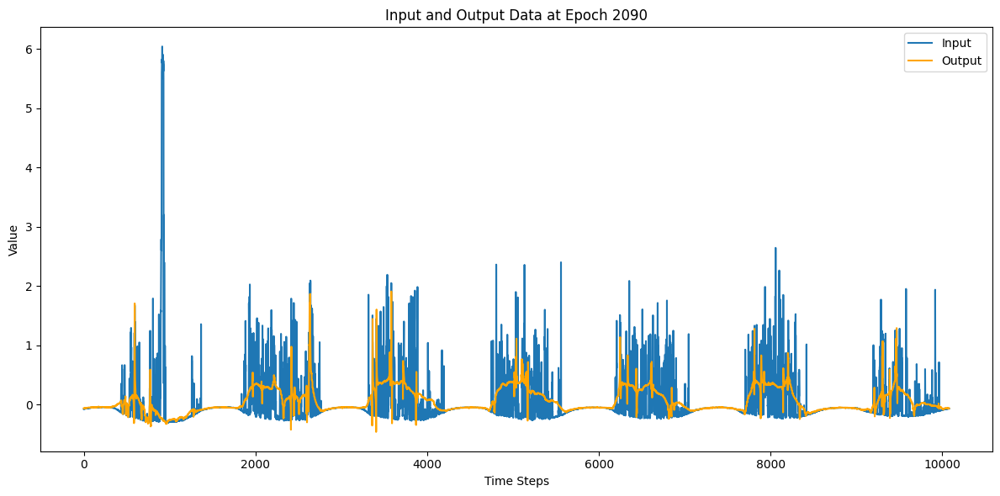

151/151 [==============================] - 14s 91ms/step - loss: 0.6999 - val_loss: 0.8855 - lr: 1.0000e-05
Epoch 2091/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6992 - val_loss: 0.8839 - lr: 1.0000e-05
Epoch 2092/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7025 - val_loss: 0.8848 - lr: 1.0000e-05
Epoch 2093/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7029 - val_loss: 0.8849 - lr: 1.0000e-05
Epoch 2094/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6989 - val_loss: 0.8853 - lr: 1.0000e-05
Epoch 2095/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6991 - val_loss: 0.8858 - lr: 1.0000e-05
Epoch 2096/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.7043 - val_loss: 0.8848 - lr: 1.0000e-05
Epoch 2097/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6991 - val_loss: 0.8853 - lr: 1.0000e-05
Epoch 2098/10000


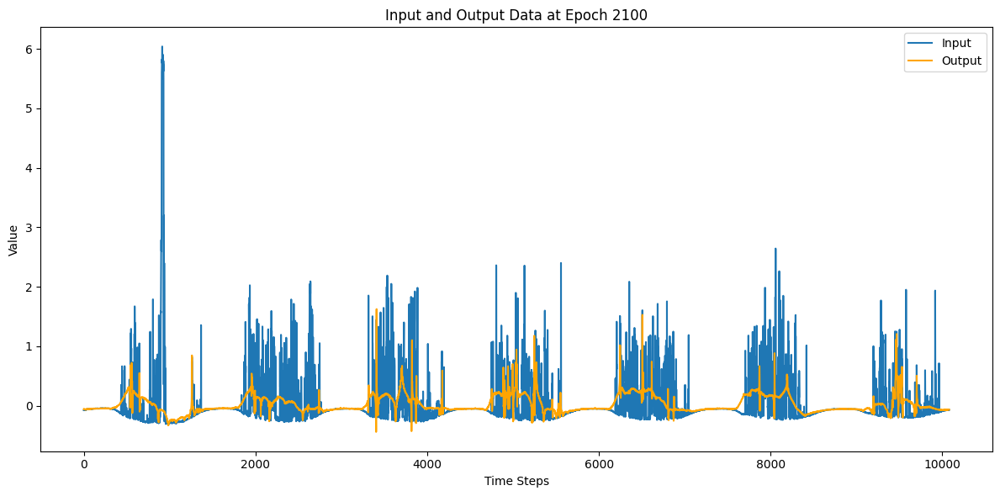

151/151 [==============================] - 14s 91ms/step - loss: 0.6995 - val_loss: 0.8857 - lr: 1.0000e-05
Epoch 2101/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6990 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 2102/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6989 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 2103/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6991 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 2104/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6990 - val_loss: 0.8848 - lr: 1.0000e-05
Epoch 2105/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7022 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 2106/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6990 - val_loss: 0.8856 - lr: 1.0000e-05
Epoch 2107/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.7028 - val_loss: 0.8847 - lr: 1.0000e-05
Epoch 2108/10000


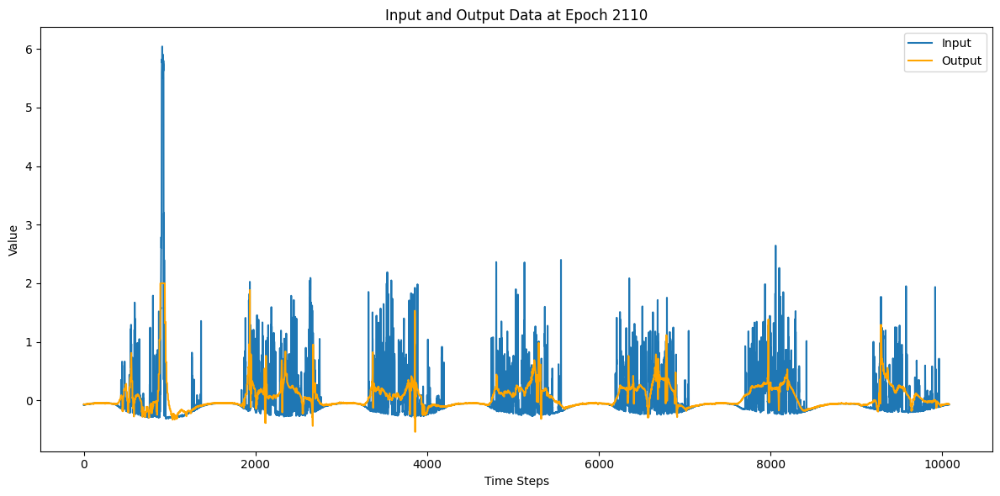

151/151 [==============================] - 13s 89ms/step - loss: 0.6993 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 2111/10000
151/151 [==============================] - 13s 88ms/step - loss: 0.7007 - val_loss: 0.8841 - lr: 1.0000e-05
Epoch 2112/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6991 - val_loss: 0.8856 - lr: 1.0000e-05
Epoch 2113/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6992 - val_loss: 0.8856 - lr: 1.0000e-05
Epoch 2114/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6986 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 2115/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.7028 - val_loss: 0.8844 - lr: 1.0000e-05
Epoch 2116/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6989 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 2117/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.7025 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 2118/10000


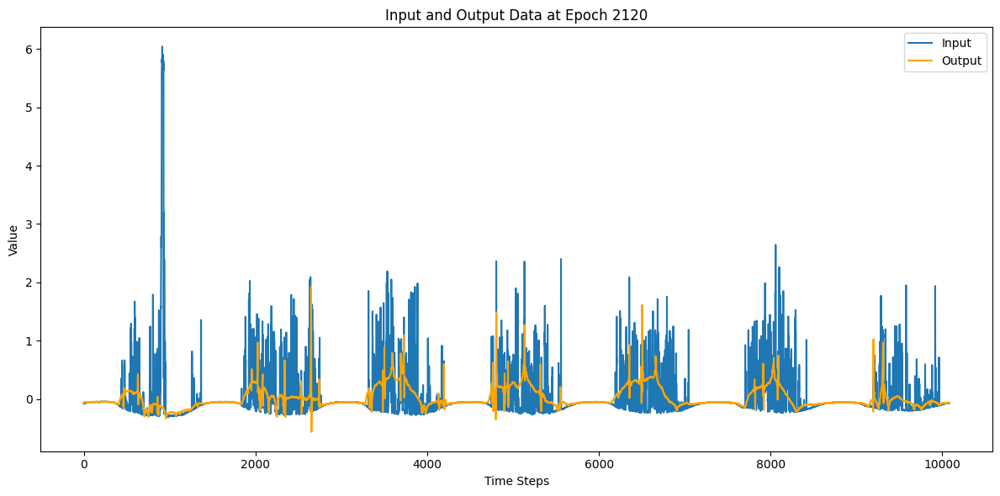

151/151 [==============================] - 13s 89ms/step - loss: 0.7010 - val_loss: 0.8844 - lr: 1.0000e-05
Epoch 2121/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6991 - val_loss: 0.8852 - lr: 1.0000e-05
Epoch 2122/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6993 - val_loss: 0.8853 - lr: 1.0000e-05
Epoch 2123/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7008 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 2124/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6993 - val_loss: 0.8848 - lr: 1.0000e-05
Epoch 2125/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7028 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 2126/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6986 - val_loss: 0.8847 - lr: 1.0000e-05
Epoch 2127/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7028 - val_loss: 0.8842 - lr: 1.0000e-05
Epoch 2128/10000


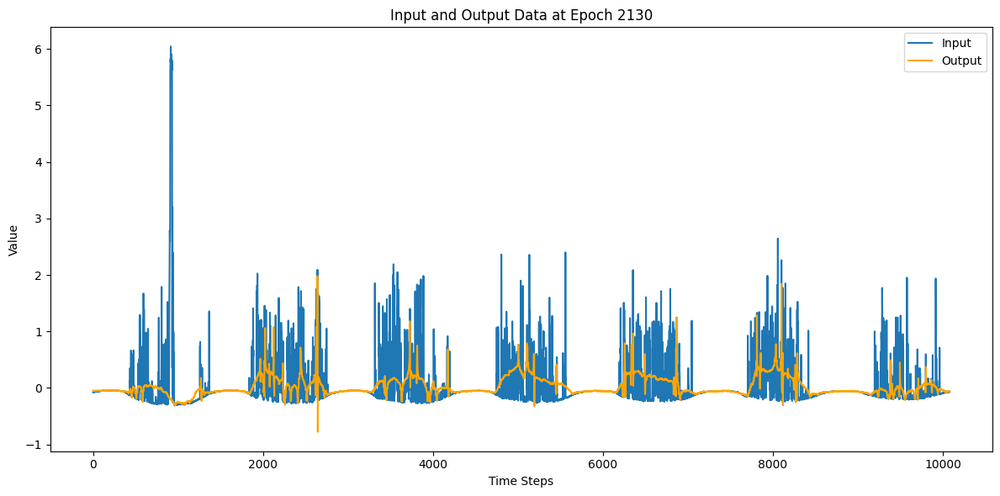

151/151 [==============================] - 14s 90ms/step - loss: 0.7029 - val_loss: 0.8840 - lr: 1.0000e-05
Epoch 2131/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7074 - val_loss: 0.8841 - lr: 1.0000e-05
Epoch 2132/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6992 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 2133/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7026 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 2134/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6989 - val_loss: 0.8858 - lr: 1.0000e-05
Epoch 2135/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6991 - val_loss: 0.8852 - lr: 1.0000e-05
Epoch 2136/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6990 - val_loss: 0.8864 - lr: 1.0000e-05
Epoch 2137/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6990 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 2138/10000


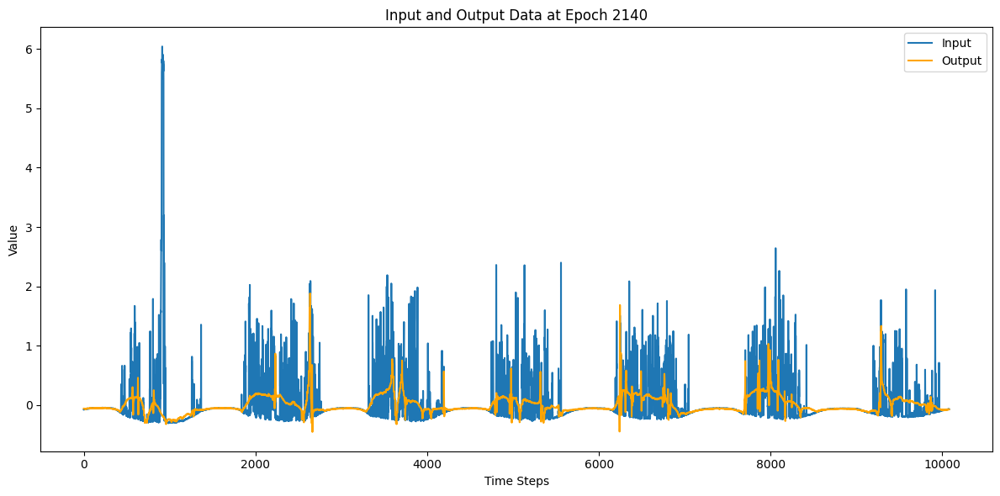

151/151 [==============================] - 13s 89ms/step - loss: 0.7072 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 2141/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6990 - val_loss: 0.8841 - lr: 1.0000e-05
Epoch 2142/10000
151/151 [==============================] - 13s 88ms/step - loss: 0.7023 - val_loss: 0.8844 - lr: 1.0000e-05
Epoch 2143/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6993 - val_loss: 0.8844 - lr: 1.0000e-05
Epoch 2144/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6991 - val_loss: 0.8849 - lr: 1.0000e-05
Epoch 2145/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6993 - val_loss: 0.8853 - lr: 1.0000e-05
Epoch 2146/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6993 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 2147/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6992 - val_loss: 0.8855 - lr: 1.0000e-05
Epoch 2148/10000


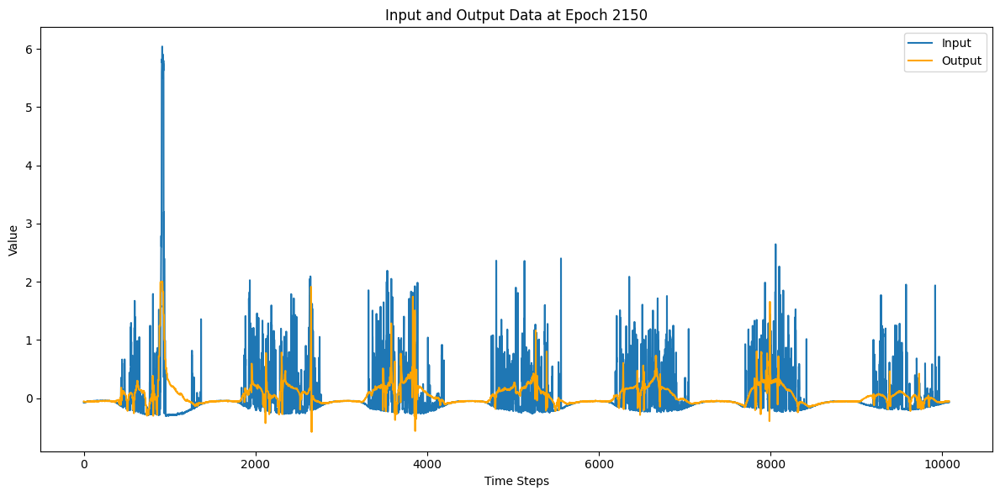

151/151 [==============================] - 14s 90ms/step - loss: 0.6989 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 2151/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6989 - val_loss: 0.8847 - lr: 1.0000e-05
Epoch 2152/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6990 - val_loss: 0.8844 - lr: 1.0000e-05
Epoch 2153/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7000 - val_loss: 0.8848 - lr: 1.0000e-05
Epoch 2154/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7004 - val_loss: 0.8848 - lr: 1.0000e-05
Epoch 2155/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6989 - val_loss: 0.8844 - lr: 1.0000e-05
Epoch 2156/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6990 - val_loss: 0.8843 - lr: 1.0000e-05
Epoch 2157/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7025 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 2158/10000


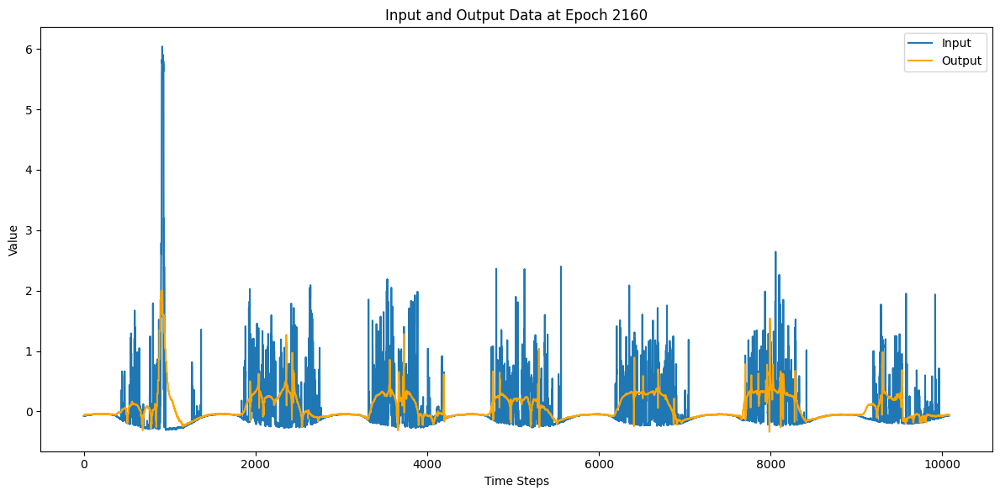

151/151 [==============================] - 13s 89ms/step - loss: 0.6993 - val_loss: 0.8853 - lr: 1.0000e-05
Epoch 2161/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6990 - val_loss: 0.8849 - lr: 1.0000e-05
Epoch 2162/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6989 - val_loss: 0.8854 - lr: 1.0000e-05
Epoch 2163/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6997 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 2164/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6992 - val_loss: 0.8845 - lr: 1.0000e-05
Epoch 2165/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6989 - val_loss: 0.8839 - lr: 1.0000e-05
Epoch 2166/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6992 - val_loss: 0.8859 - lr: 1.0000e-05
Epoch 2167/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.7009 - val_loss: 0.8854 - lr: 1.0000e-05
Epoch 2168/10000


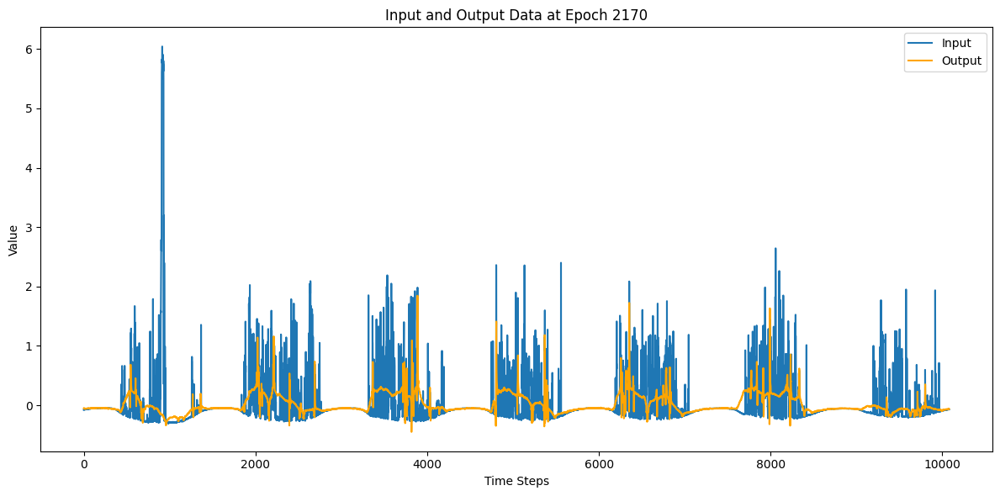

151/151 [==============================] - 14s 91ms/step - loss: 0.6992 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 2171/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6989 - val_loss: 0.8847 - lr: 1.0000e-05
Epoch 2172/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6991 - val_loss: 0.8842 - lr: 1.0000e-05
Epoch 2173/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7015 - val_loss: 0.8845 - lr: 1.0000e-05
Epoch 2174/10000
151/151 [==============================] - 13s 88ms/step - loss: 0.6989 - val_loss: 0.8852 - lr: 1.0000e-05
Epoch 2175/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6990 - val_loss: 0.8845 - lr: 1.0000e-05
Epoch 2176/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.7027 - val_loss: 0.8854 - lr: 1.0000e-05
Epoch 2177/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6989 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 2178/10000


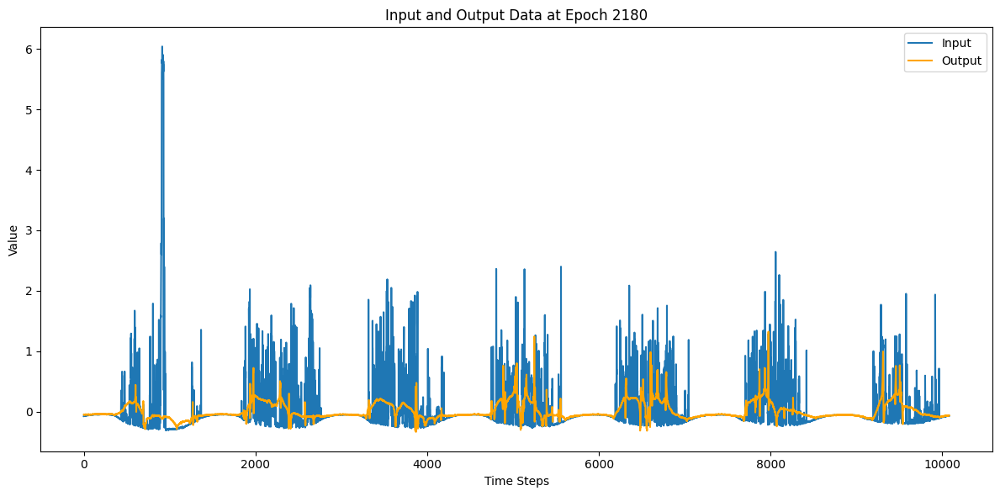

151/151 [==============================] - 13s 90ms/step - loss: 0.6993 - val_loss: 0.8845 - lr: 1.0000e-05
Epoch 2181/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6988 - val_loss: 0.8843 - lr: 1.0000e-05
Epoch 2182/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6994 - val_loss: 0.8853 - lr: 1.0000e-05
Epoch 2183/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6990 - val_loss: 0.8845 - lr: 1.0000e-05
Epoch 2184/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.7009 - val_loss: 0.8844 - lr: 1.0000e-05
Epoch 2185/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.7005 - val_loss: 0.8845 - lr: 1.0000e-05
Epoch 2186/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6990 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 2187/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6991 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 2188/10000


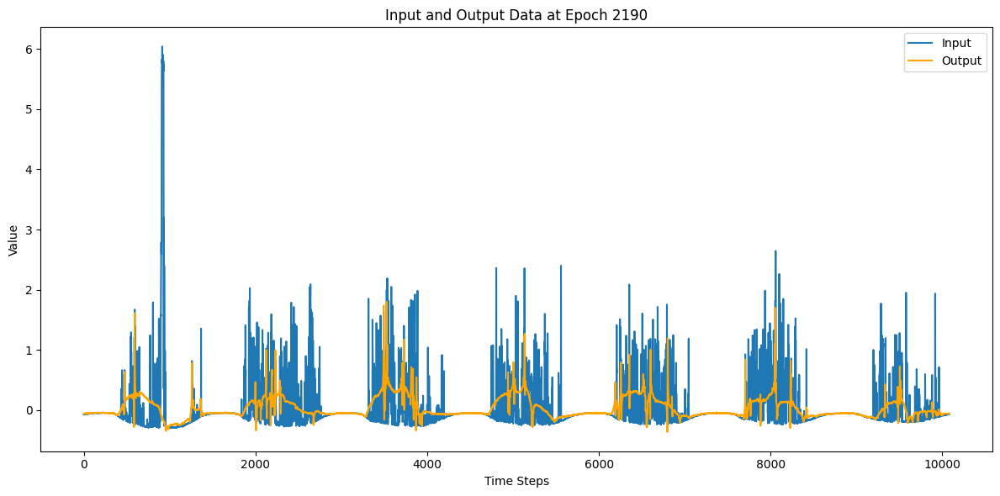

151/151 [==============================] - 14s 90ms/step - loss: 0.7023 - val_loss: 0.8842 - lr: 1.0000e-05
Epoch 2191/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.7001 - val_loss: 0.8855 - lr: 1.0000e-05
Epoch 2192/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6989 - val_loss: 0.8852 - lr: 1.0000e-05
Epoch 2193/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6991 - val_loss: 0.8845 - lr: 1.0000e-05
Epoch 2194/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7013 - val_loss: 0.8845 - lr: 1.0000e-05
Epoch 2195/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7056 - val_loss: 0.8849 - lr: 1.0000e-05
Epoch 2196/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6999 - val_loss: 0.8856 - lr: 1.0000e-05
Epoch 2197/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6991 - val_loss: 0.8855 - lr: 1.0000e-05
Epoch 2198/10000


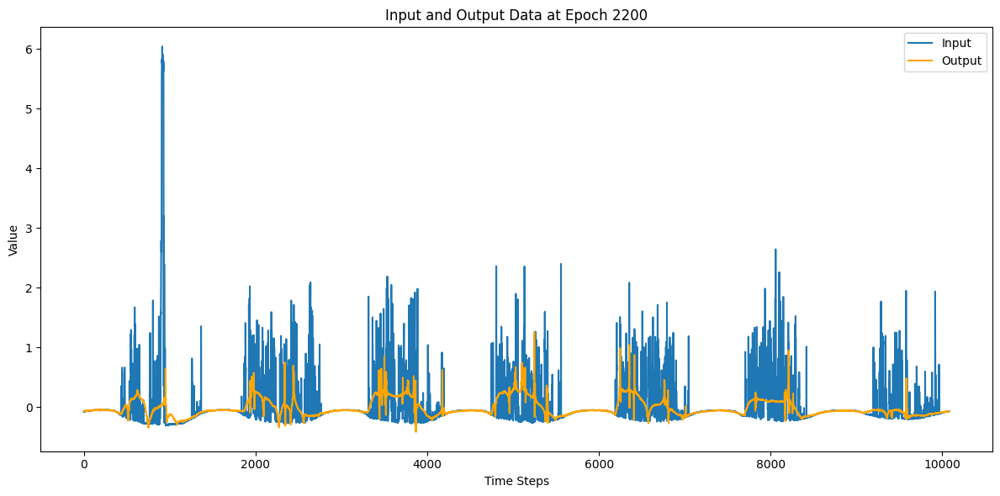

151/151 [==============================] - 13s 89ms/step - loss: 0.6992 - val_loss: 0.8853 - lr: 1.0000e-05
Epoch 2201/10000
151/151 [==============================] - 12s 81ms/step - loss: 0.6988 - val_loss: 0.8846 - lr: 1.0000e-05
Epoch 2202/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6989 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 2203/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6999 - val_loss: 0.8847 - lr: 1.0000e-05
Epoch 2204/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6992 - val_loss: 0.8855 - lr: 1.0000e-05
Epoch 2205/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6990 - val_loss: 0.8861 - lr: 1.0000e-05
Epoch 2206/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6992 - val_loss: 0.8840 - lr: 1.0000e-05
Epoch 2207/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7074 - val_loss: 0.8850 - lr: 1.0000e-05
Epoch 2208/10000


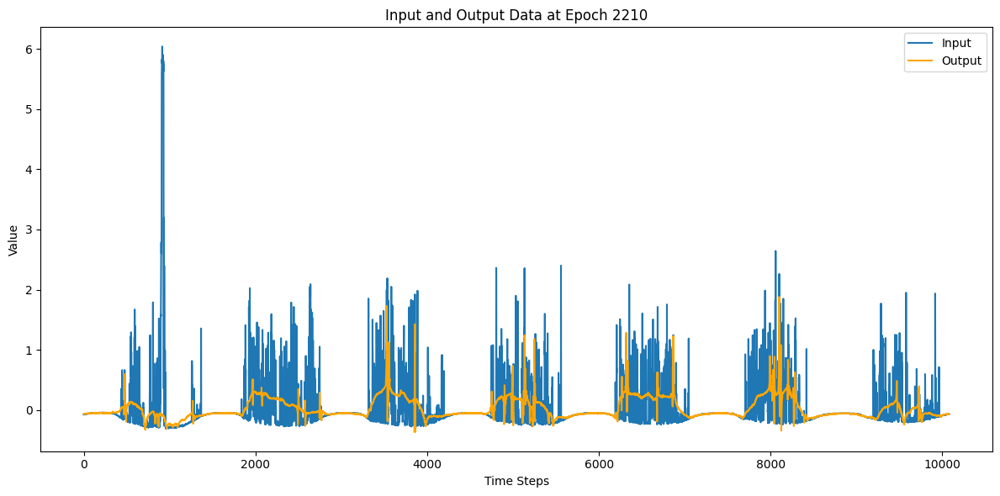

151/151 [==============================] - 14s 93ms/step - loss: 0.6991 - val_loss: 0.8861 - lr: 1.0000e-05
Epoch 2211/10000
151/151 [==============================] - 13s 85ms/step - loss: 0.6992 - val_loss: 0.8853 - lr: 1.0000e-05
Epoch 2212/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.7031 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 2213/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6988 - val_loss: 0.8853 - lr: 1.0000e-05
Epoch 2214/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6993 - val_loss: 0.8852 - lr: 1.0000e-05
Epoch 2215/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6988 - val_loss: 0.8844 - lr: 1.0000e-05
Epoch 2216/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.7106 - val_loss: 0.8854 - lr: 1.0000e-05
Epoch 2217/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.7003 - val_loss: 0.8844 - lr: 1.0000e-05
Epoch 2218/10000


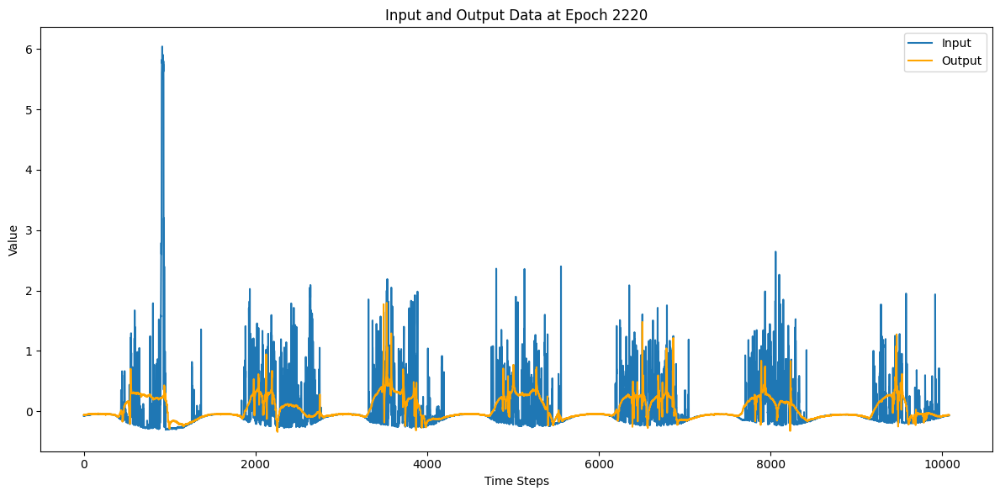

151/151 [==============================] - 13s 89ms/step - loss: 0.6989 - val_loss: 0.8852 - lr: 1.0000e-05
Epoch 2221/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6991 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 2222/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6989 - val_loss: 0.8854 - lr: 1.0000e-05
Epoch 2223/10000
151/151 [==============================] - 12s 82ms/step - loss: 0.6993 - val_loss: 0.8855 - lr: 1.0000e-05
Epoch 2224/10000
151/151 [==============================] - 13s 82ms/step - loss: 0.6989 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 2225/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6990 - val_loss: 0.8855 - lr: 1.0000e-05
Epoch 2226/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.6988 - val_loss: 0.8843 - lr: 1.0000e-05
Epoch 2227/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7019 - val_loss: 0.8857 - lr: 1.0000e-05
Epoch 2228/10000


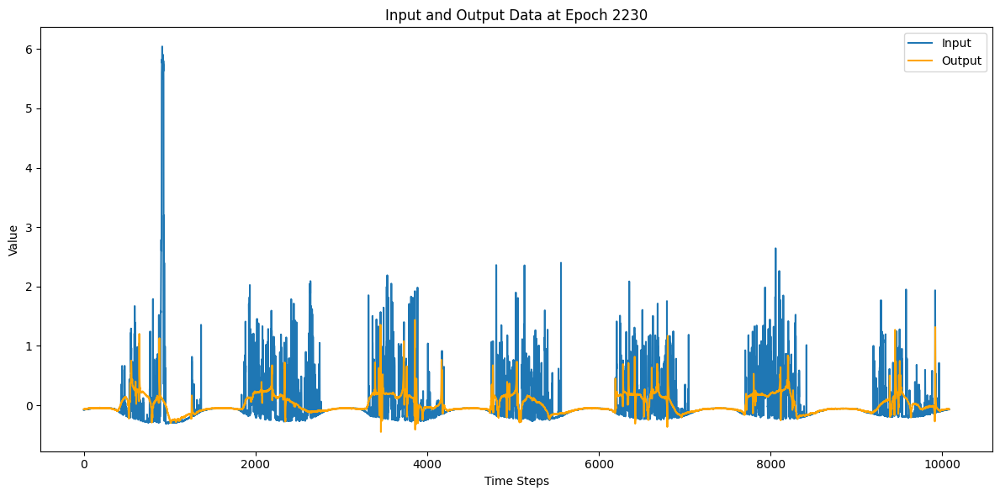

151/151 [==============================] - 13s 89ms/step - loss: 0.6989 - val_loss: 0.8843 - lr: 1.0000e-05
Epoch 2231/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6988 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 2232/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.7104 - val_loss: 0.8843 - lr: 1.0000e-05
Epoch 2233/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6989 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 2234/10000
151/151 [==============================] - 12s 83ms/step - loss: 0.7104 - val_loss: 0.8848 - lr: 1.0000e-05
Epoch 2235/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6999 - val_loss: 0.8835 - lr: 1.0000e-05
Epoch 2236/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.7026 - val_loss: 0.8843 - lr: 1.0000e-05
Epoch 2237/10000
151/151 [==============================] - 13s 83ms/step - loss: 0.6992 - val_loss: 0.8855 - lr: 1.0000e-05
Epoch 2238/10000


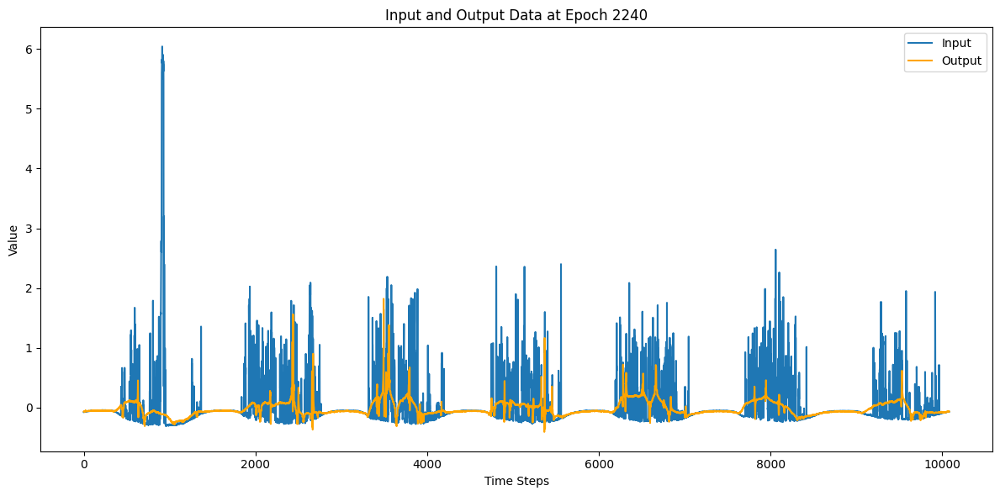

151/151 [==============================] - 14s 95ms/step - loss: 0.6989 - val_loss: 0.8838 - lr: 1.0000e-05
Epoch 2241/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6989 - val_loss: 0.8844 - lr: 1.0000e-05
Epoch 2242/10000
151/151 [==============================] - 13s 84ms/step - loss: 0.6993 - val_loss: 0.8843 - lr: 1.0000e-05
Epoch 2243/10000
151/151 [==============================] - 15s 103ms/step - loss: 0.6992 - val_loss: 0.8851 - lr: 1.0000e-05
Epoch 2243: early stopping


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, TensorBoard

# Define your custom callback
class CustomCallback(tf.keras.callbacks.Callback):
    def __init__(self, function, frequency):
        super(CustomCallback, self).__init__()
        self.function = function
        self.frequency = frequency

    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % self.frequency == 0:
            self.function(epoch + 1, logs)

# Define your custom function
def my_custom_function(epoch, logs):
    print(f"\n plotting.. output {epoch}")

    # Plot the input and output for X_test[0]
    input_data = X_test[0]
    output_data = model.predict(input_data.reshape(1, -1, 1)).flatten()  # Reshape to match the model input and flatten the output

    plt.figure(figsize=(12, 6))

    # Plot the input data and output data as an overlay
    plt.plot(input_data, label='Input')
    plt.plot(output_data, label='Output', color='orange')
    plt.title(f'Input and Output Data at Epoch {epoch}')
    plt.xlabel('Time Steps')
    plt.ylabel('Value')
    plt.legend()

    plt.tight_layout()

    # Save the figure with a zero-padded filename for correct sorting
    plt.savefig(f'output_epoch_{epoch:06d}.png')
    plt.show()
    plt.close()


# Define the callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=early_stopping_patience, restore_best_weights=True, verbose=1)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=reduce_lr_patience, min_lr=min_lr, verbose=1)
# tensorboard = TensorBoard(log_dir='./logs', histogram_freq=1, write_graph=True, write_images=True)
custom_callback = CustomCallback(function=my_custom_function, frequency=10)


# Fit the model with all callbacks
with strategy.scope():
    history = model.fit(
        X_train, X_train,
        epochs=10000,
        batch_size=128,
        validation_split=0.1,
        verbose=1,
        callbacks=[early_stopping, reduce_lr, custom_callback]
    )

# Save model

In [ ]:
# Function to save just the encoder part of the model
def save_encoder_only(model, encoder_num_layers, embed_dim, save_path=root+name):
    # Define a new input that matches the expected input shape of the encoder
    encoder_input = model.input

    # include patch embedding and reshape
    x = model.get_layer(name="conv1d_patch_embedding").output  # The Dense layer after reshaping
    x = model.get_layer(name="global_avg_pooling")(x)

    # give positional embedding
    num_patches = 10080 // patch_size
    positional_embeddings = get_positional_embeddings(num_patches, embed_dim)

    x = x + positional_embeddings

    attention_weights = []
    for i in range(encoder_num_layers):
        transformer_block = model.get_layer(name=f"encoder_layer_{i+1}_transformer")
        x, weights = transformer_block(x)
        attention_weights.append(weights)

    # Create the encoder model with the new input
    encoder_model = models.Model(inputs=encoder_input, outputs=[x] + attention_weights, name="encoder_model")
    encoder_model.save(save_path)
    print(f"Encoder model saved to {save_path}")

# Save the encoder model
save_encoder_only(model, encoder_num_layers, embed_dim=embed_dim)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Encoder model saved to /content/drive/MyDrive/Extra Curricular /ActigraphyTransformer/A-NEW/ALBERT Experiments /ALBERT Conv Pretraining/Encoders/conv_encoder_large_90_unsmoothed_mse_all.h5


In [ ]:
encoder_model = tf.keras.models.load_model(root+name, custom_objects={'TransformerBlock': TransformerBlock, 'get_positional_embeddings': get_positional_embeddings})

In [ ]:
encoder_model.summary()

Model: "encoder_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputs (InputLayer)         [(None, 10080)]           0         
                                                                 
 reshape (Reshape)           (None, 1120, 9)           0         
                                                                 
 add_channel_dim (Reshape)   (None, 1120, 9, 1)        0         
                                                                 
 conv1d_patch_embedding (Ti  (None, 1120, 9, 96)       384       
 meDistributed)                                                  
                                                                 
 global_avg_pooling (TimeDi  (None, 1120, 96)          0         
 stributed)                                                      
                                                                 
 tf.__operators__.add_12 (T  (None, 1120, 96)        

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras import Model

def plot_input_mask_output(model, X_test, num_samples=20, patch_size=patch_size):
    """
    Creates a separate plot for each input from X_test, showing the original input,
    the masked input that the model sees, the model's output, and a combination
    of original and output data, stacked vertically.

    Parameters:
    - model: The trained model.
    - X_test: Test data, shape should be (num_samples, input_size, 1).
    - num_samples: Number of samples to visualize.
    - patch_size: Size of the patches used by the model.
    """
    num_patches = X_test.shape[1] // patch_size

    # Create a sub-model that outputs the visible patches and model output
    intermediate_model = Model(inputs=model.input,
                               outputs=[model.get_layer('mask_layer').output, model.output])

    for i in range(num_samples):
        original_input = X_test[i].flatten()  # Flatten the original input for easy handling

        # Get the intermediate output and final output from the model
        mask_layer_output, model_output = intermediate_model.predict(X_test[i:i+1])
        visible_patches, _, _, shuffle_indices, masked_indices = mask_layer_output


        # Ensure the indices are properly interpreted as arrays
        shuffle_indices = np.array(shuffle_indices)
        masked_indices = np.array(masked_indices)

        # Calculate the visible indices
        visible_indices = np.setdiff1d(shuffle_indices, masked_indices)

        # Combine the original and output data for the fourth plot
        combined_data = original_input.copy()
        model_output = model_output.flatten()
        for idx in masked_indices:
            start = idx * patch_size
            end = start + patch_size
            combined_data[start:end] = model_output[start:end]

        # Create a new figure for each input
        fig, axes = plt.subplots(4, 1, figsize=(30, 20))

        # Plot original input
        axes[0].plot(original_input, color='blue')
        axes[0].set_title('Original Input')

        # Plot the input and overlay gray highlight on non-visible patches
        axes[1].plot(original_input, color='blue')
        for idx in masked_indices:
            start = idx * patch_size
            end = start + patch_size
            axes[1].axvspan(start, end, color='gray', zorder=10)  # Gray overlay in the foreground with high zorder
        axes[1].set_title('Input with Non-Visible Patches Covered')

        # Plot model output
        axes[2].plot(original_input, color='lightgray', linestyle='dashed')
        axes[2].plot(model_output, color='green')
        axes[2].set_title('Model Output')

        # Plot combined data with original input and light red background for masked areas
        axes[3].plot(original_input, color='lightgray', linestyle='dashed')
        for idx in masked_indices:
            start = idx * patch_size
            end = start + patch_size
            axes[3].axvspan(start, end, color='lightcoral', alpha=1, zorder=1)  # Light red background
        axes[3].plot(combined_data, color='green')
        axes[3].set_title('Combined Data with Original and Masked Highlight')

        # Adjust layout and show the plot
        plt.tight_layout()
        plt.show()


In [ ]:
# Plot results
plot_input_mask_output(model, X_test, patch_size=patch_size, num_samples=50)